# Python packages

In [ ]:
import numpy as np
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
%matplotlib inline 
!pip install mpld3
import mpld3
mpld3.enable_notebook()

from scipy.integrate import odeint
!pip install lmfit
import lmfit
from lmfit.lineshapes import gaussian, lorentzian
from lmfit import Minimizer, Parameters, fit_report

import copy

from scipy import optimize


import warnings
warnings.filterwarnings('ignore')

import statsmodels.api as sm
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import PolynomialFeatures
from sklearn import linear_model
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

import math

!pip install pandas_bokeh
import pandas_bokeh
pandas_bokeh.output_notebook()
import seaborn as sns


from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
from matplotlib_venn import venn3, venn3_circles
#from matplotlib import pyplot as plt

import scipy.interpolate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 201 kB 5.1 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 292 kB 4.3 MB/s 
     |████████████████████████████████| 98 kB 3.6 MB/s 
  Created wheel for lmfit: filename=lmfit-1.0.3-py3-none-any.whl size=84413 sha256=d2bbe2443409b2fe0815594a167e28aa038387705e339d157cefcf9093255279
  Stored in directory: /root/.cache/pip/wheels/b9/7a/d1/236aa0f8196b264fda481a112f7cfb1bfde7bfb20235f8e331
Successfully built lmfit
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Data Entries

In [ ]:
# locking the randomized system to get the same results every time
import random
random.seed(30)


In [ ]:
np.random.seed(20)

## Population of region

In [ ]:
# POPULATION OF THE REGION
#===============================================================================================================================================

#The initial population of targeted region needs to be specified
population_Region = 5147712 #Q3 estimate of BC population (https://www150.statcan.gc.ca/t1/tbl1/en/tv.action?pid=1710000901)

#it will then needs to be assigned to the total population that model receives 
total_population= population_Region

## Daily infections data

In [ ]:
# DATA RETRIEVAL FUNCTION, PART I
#===============================================================================================================================================

#Inserting the "REAL" data into the model
#This file has been retrieved from: http://www.bccdc.ca/health-info/diseases-conditions/covid-19/data

#raw_data = pd.read_csv(path)

raw_data=pd.read_csv('https://raw.githubusercontent.com/Kavehdkh/covid-data/main/BCCDC_COVID19_Dashboard_Case_Details.csv')

#Creating a data frame with only the reported date
report_date=pd.DataFrame(raw_data['Reported_Date'])

#Counting the number of reported date and creating a data frame with number of daily cases
daily_cases_data=report_date.groupby(report_date.columns.tolist()).size().reset_index().\
    rename(columns={0:'Cases'})

#removing the previous index set by the original file
daily_cases_data = daily_cases_data.reset_index()

#setting the reported date into date format
daily_cases_data['Reported_Date'] = pd.to_datetime(daily_cases_data['Reported_Date'],format='%Y-%m-%d').dt.date

#setting the range of data based on the starting and end date of the available data, which willbe used as an index to fill the gap
idx_1 = pd.date_range(min(daily_cases_data['Reported_Date']),max(daily_cases_data['Reported_Date']))
#idx = pd.date_range('01-26-2020', '10-16-2020')

#setting the index  of data based on the date column of data
daily_cases_data.set_index(daily_cases_data.Reported_Date, inplace=True)

#filling the missing data with zeros
daily_cases_data = daily_cases_data.reindex(idx_1, fill_value=0)
#daily_cases_data=daily_cases_data.fillna(0)
#Droping the extra columns
daily_cases_data = daily_cases_data.drop(columns=['Reported_Date','index'])

#Creating the array of data, in this section we assign the value of desired data into an array
#daily_cases = daily_cases["Cases"].values[::1]

#Creating an array of Cumulative daily cases
#daily_cases_cumulative = (np.cumsum(daily_cases))

In [ ]:
daily_cases_data

,Cases
2020-01-26,1
2020-01-27,0
2020-01-28,0
2020-01-29,0
2020-01-30,0
...,...
2020-10-12,104
2020-10-13,146
2020-10-14,143
2020-10-15,143


In [ ]:
# DATA RETRIEVAL FUNCTION, PART II
#===============================================================================================================================================

#Importing and cleaning data
#This section needs input from the user
#======================================================================================================================================
#importing the entire data set for canadian number of cases and deaths
#This file has been retrieve from: https://www.canada.ca/en/public-health/services/diseases/2019-novel-coronavirus-infection.html 
comp_data = pd.read_csv('https://raw.githubusercontent.com/Kavehdkh/covid-data/main/covid19-Complete%20Data%20Canada.csv')

#this is the range of data on which we want to perform the analysis on
idx = pd.date_range('01-26-2020', '10-09-2020')

#which provience do you want to do the analysis on:
provience='British Columbia'

#percentage format can be set up as well, the following code can be used for this purpose
#the other line needs to be activated further in the code
#percentage_train_set=80

#======================================================================================================================================

#Filtering the data for number of deaths, you can choose different category from the data
#prname : province name
modified_data=comp_data.filter(items=['prname', 'date','numdeaths','numtoday','numconf'])

#Filtering the data for the specific region
modified_data_provincial=modified_data.loc[modified_data['prname'] == provience]

#removing the previous index set by the original file
modified_data_provincial = modified_data_provincial.reset_index()

#assigning the date column into date format, this is important to do so that the model knows the data is based on specific series
modified_data_provincial['date'] = pd.to_datetime(modified_data_provincial['date'],format='%Y-%m-%d').dt.date

#setting the range of data based on the starting and end date of the available data, which willbe used as an index to fill the gap
idx_2 = pd.date_range(min(modified_data_provincial['date']),max(modified_data_provincial['date']))

#setting the index  of data based on the date column of data
modified_data_provincial.set_index(modified_data_provincial.date, inplace=True)

#filling the missing data with zeros
modified_data_provincial = modified_data_provincial.reindex(idx_2, fill_value=0)
#modified_data_provincial=modified_data_provincial
#Droping the extra columns
modified_data_provincial = modified_data_provincial.drop(columns=['date','index','prname'])

## CIHI data

### Retrieval from drive


### Reading data

In [ ]:
#CIHI DATA
#===================================================================================================================================================
#Reading the csv file
#skipping the first 7 rows as they are not data related rows
comp_data_hospitals = pd.read_csv('7132 - Acute Inpatient Activity Report_pwp.csv', skiprows=range(16))

#Creating an array with column names
column_names = comp_data_hospitals.columns.values

# ==> IMPORTANT: USER INPUT (This section needs user input)
#=======================================================================================
#specifing the columns that needs to be turn into numeric
#the first 2 columns are facitiy id and facity name
start_col=3
end_column=19

#As per CIHI's Privacy Policy, cells with counts of between 1 and 4 have been suppressed
#Therefore replacing them with:
star_replacement = 1
comp_data_hospitals = comp_data_hospitals.replace('*',star_replacement)
#=======================================================================================

#replacing NaN values with zero
comp_data_hospitals = comp_data_hospitals.replace(np.nan,0)

#looping over the all columns and make them into numeric format
for i in range (start_col,end_column):
    comp_data_hospitals[column_names[i]]=pd.to_numeric(comp_data_hospitals[column_names[i]])

### Data seclection (provincial)

In [ ]:
# ==> IMPORTANT: USER INPUT (This section needs user input)
#=======================================================================================
#which province you want to look into
provience_CIHI='BC'

#filtering the data to ones we are interested in 
modified_data_CIHI=comp_data_hospitals.filter(items=['Date',
                                                     'Hospital Admissions2',
                                                     'Hospital ALOS16 (in days)',
                                                     'Province21',
                                                     'Discharges11',
                                                     'Deaths12'])



#the index of previous sets 
#idx = pd.date_range('01-26-2020', '10-09-2020')
#=======================================================================================

#Filtering the data for the specific region
provincial_data_CIHI=modified_data_CIHI.loc[modified_data_CIHI['Province21'] == provience_CIHI]

#before making any modification on data, make a copy to find constant parameters such as gamma, alpha, ...
modified_data_CIHI_parameter_finder=provincial_data_CIHI

#removing the previous index set by the original file
provincial_data_CIHI = provincial_data_CIHI.reset_index()

#dropping index column and province column since there is no use for it anymore
provincial_data_CIHI = provincial_data_CIHI.drop(columns=['index','Province21'])

#formating column 'Date' into a date format
provincial_data_CIHI['Date'] = pd.to_datetime(provincial_data_CIHI['Date'],format='%d-%b-%Y')

#Adding all pateint on the same date together
provincial_data_CIHI = provincial_data_CIHI.groupby('Date').sum().reset_index()


# ==> IMPORTANT: USER INPUT (This section needs user input)
#=======================================================================================
#Applying modification on the data
#provincial_data_CIHI['combine_admi_stay']=provincial_data_CIHI['Hospital Admissions2']+provincial_data_CIHI['Hospital ALOS16 (in days)']
#=======================================================================================


#setting the range of data based on the starting and end date of the available data, which will be used as an index to fill the gap
idx_CIHI = pd.date_range(min(provincial_data_CIHI['Date']),max(provincial_data_CIHI['Date']))

#setting the index  of data based on the date column of data
provincial_data_CIHI.set_index(provincial_data_CIHI.Date, inplace=True)

#filling the missing data with zeros
provincial_data_CIHI = provincial_data_CIHI.reindex(idx_CIHI, fill_value=0)


#Droping the extra columns
provincial_data_CIHI = provincial_data_CIHI.drop(columns=['Date'])



#provincial_data_CIHI
#combine

### Hospitalization calculation

In [ ]:
# Calculation of hospitalization 
#==================================================================================
#calculating the influx of patients into and out of hospitals
provincial_data_CIHI['hospital_influx']=provincial_data_CIHI['Hospital Admissions2']-provincial_data_CIHI['Discharges11']-provincial_data_CIHI['Deaths12']
#calculating the daily discharge, combining both dead and recovered
provincial_data_CIHI['discharge']=provincial_data_CIHI['Discharges11']+provincial_data_CIHI['Deaths12']
# the daily hospitalization is the cumulative of hospital influx is calculated
provincial_data_CIHI['daily_Hospitalizations']=provincial_data_CIHI['hospital_influx'].cumsum()
provincial_data_CIHI['daily_Hospitalizations'][3]=0
provincial_data_CIHI['discharge'][3]=0
np.array(provincial_data_CIHI['daily_Hospitalizations'])
provincial_data_CIHI

,Hospital Admissions2,Hospital ALOS16 (in days),Discharges11,Deaths12,hospital_influx,discharge,daily_Hospitalizations
2019-09-01,0,0.00,0,0,0,0,0
2019-09-02,0,0.00,0,0,0,0,0
2019-09-03,0,0.00,0,0,0,0,0
2019-09-04,0,0.00,0,0,0,0,0
2019-09-05,0,0.00,0,0,0,0,0
...,...,...,...,...,...,...,...
2020-05-27,3,127.33,5,1,-3,6,6
2020-05-28,3,26.00,2,0,1,2,7
2020-05-29,2,39.00,3,0,-1,3,6
2020-05-30,2,69.00,4,1,-3,5,3


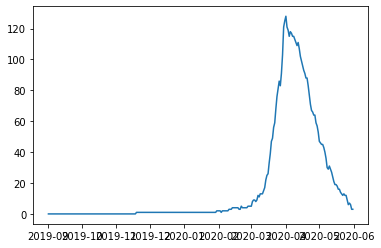

In [ ]:
plt.plot(provincial_data_CIHI['daily_Hospitalizations'])

### Data filtering

In [ ]:
# ==> IMPORTANT: requires modification if different interval or data set is needed
#=======================================================================================
#combing the index of previus sets with the current one
idx_combine=pd.date_range(max(min(idx_1),min(idx_2),min(idx_CIHI)),min(max(idx_1),max(idx_2),max(idx_CIHI)))
#=======================================================================================

#adjusting the data frames based on the shared date in each data frame
daily_cases_data = daily_cases_data.reindex(idx_combine)
modified_data_provincial = modified_data_provincial.reindex(idx_combine)
provincial_data_CIHI = provincial_data_CIHI.reindex(idx_combine)

#Creating an array of daily cases from the canada.ca website
daily_cases = modified_data_provincial["numtoday"].values[::1]

#Creating the array of data, in this section we assign the value of desired data into an array
provincial_data = modified_data_provincial["numdeaths"].values[::1]

#Creating an array of cumulatuve daily cases from the canada.ca website
daily_cases_cumulative = modified_data_provincial["numconf"].values[::1]

#namespace = globals()
#for col in provincial_data_CIHI_modified.columns.values:
#    namespace['%s' % col] = provincial_data_CIHI_modified[col].values[::1]

# Creating an array of daily data for each desired compratment
daily_death_H = provincial_data_CIHI["Deaths12"].values[::1]
daily_recovered_H = provincial_data_CIHI["Discharges11"].values[::1]
daily_admitted_H = provincial_data_CIHI["Hospital Admissions2"].values[::1]
daily_hospitalization = provincial_data_CIHI["daily_Hospitalizations"].values[::1]
daily_discharge = provincial_data_CIHI["discharge"].values[::1]

In [ ]:
provincial_data_CIHI.head()

,Hospital Admissions2,Hospital ALOS16 (in days),Discharges11,Deaths12,hospital_influx,discharge,daily_Hospitalizations
2020-01-31,0,0.0,0,0,0,0,2
2020-02-01,0,0.0,0,0,0,0,2
2020-02-02,0,0.0,0,0,0,0,2
2020-02-03,0,4.0,1,0,-1,1,1
2020-02-04,1,0.0,0,0,1,0,2


array([  2,   2,   2,   1,   2,   2,   2,   2,   2,   2,   3,   3,   3,
         4,   4,   4,   4,   4,   4,   3,   3,   5,   4,   4,   4,   4,
         4,   5,   5,   5,   5,   8,   9,   9,   8,   9,  12,  11,  13,
        13,  13,  15,  17,  22,  25,  26,  33,  39,  47,  49,  56,  59,
        68,  76,  81,  86,  83,  91, 103, 121, 125, 128, 121, 119, 115,
       118, 117, 115, 115, 113, 111, 109, 111, 107, 102,  99,  96,  93,
        91,  88,  88,  83,  77,  71,  67,  66,  64,  64,  59,  57,  53,
        47,  46,  45,  45,  43,  40,  36,  30,  29,  31,  29,  27,  24,
        21,  19,  19,  18,  16,  16,  14,  13,  12,  13,  12,  12,   9,
         6,   7,   6,   3,   3])

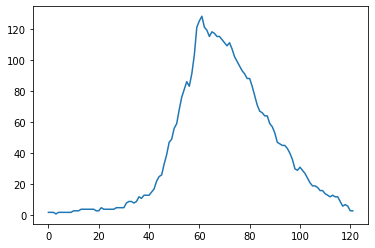

In [ ]:
plt.plot(daily_hospitalization)
len(daily_hospitalization)
#daily_hospitalization
daily_hospitalization

## Functions

### Interpolation function:

In [ ]:

def linear_interpolation (sr_origin,sr_grouped,period_info_intpl):

  # assiging the dataframes
  #df_origin=test#complete_pandemic_data['daily_admitted_H']
  sr_grouped=sr_grouped.reset_index()
  limit_complete_period=math.floor(len(sr_origin)/period_info_intpl)
  limit_complete_total=math.ceil(len(sr_origin)/period_info_intpl)

  # Creating two separate dataframe based on the completeness of the periods
  df_temp_1=sr_grouped.iloc[:limit_complete_period+1,]
  df_temp_2=sr_grouped.iloc[limit_complete_period:limit_complete_total+1,]

  # x and y of the data that interpolation will be based on
  x_temp_1 = df_temp_1.iloc[:,0]
  x_temp_2 = df_temp_2.iloc[:,0]
  y_temp_1 = df_temp_1.iloc[:,1]
  y_temp_2 = df_temp_2.iloc[:,1]
  if len(df_temp_2)>1:
    # creating two interpolation functions:
    y_interpy_temp_1 = scipy.interpolate.interp1d(x_temp_1, y_temp_1)
    y_interpy_temp_2 = scipy.interpolate.interp1d(x_temp_2, y_temp_2)

    #creating x-arrays based on the number of x in the original array
    x_origin_1=np.linspace(df_temp_1.iloc[0,0], df_temp_1.iloc[-1,0], num=limit_complete_period*period_info_intpl, endpoint=True)    
    x_origin_2=np.linspace(df_temp_2.iloc[0,0], df_temp_2.iloc[-1,0], num=len(sr_origin)-limit_complete_period*period_info_intpl+1, endpoint=True)    

    # perfoming the interpolation:
    y_interpolated_origin_1=y_interpy_temp_1(x_origin_1)
    y_interpolated_origin_2=y_interpy_temp_2(x_origin_2)

    # putting the two arrays into one another, we need to remove the overlapping period
    final_array=np.concatenate([y_interpolated_origin_1,y_interpolated_origin_2[1:]])

  elif len(df_temp_2)==1:

    y_interpy_temp_1 = scipy.interpolate.interp1d(x_1_temp_1, y_temp_1)
    x_origin_1=np.linspace(df_temp_1.iloc[0,0], df_temp_1.iloc[-1,0], num=limit_complete_period*period_info_intpl, endpoint=True)    
    y_interpolated_origin_1=y_admitted_interpy_admitted_temp_1(x_origin_1)
    final_array=y_interpolated_origin_1

  return final_array

In [ ]:

def linear_interpolation_2 (sr_origin,sr_grouped,period_info_intpl,inter_kind):

  # assiging the dataframes
  #df_origin=test#complete_pandemic_data['daily_admitted_H']
  sr_grouped=sr_grouped.reset_index()
  limit_complete_period=math.floor(len(sr_origin)/period_info_intpl)
  limit_complete_total=math.ceil(len(sr_origin)/period_info_intpl)

  # Creating two separate dataframe based on the completeness of the periods
  df_temp_1=sr_grouped.iloc[:limit_complete_period+1,]
  df_temp_2=sr_grouped.iloc[limit_complete_period:limit_complete_total+1,]

  # x and y of the data that interpolation will be based on
  x_temp_1 = df_temp_1.iloc[:,0]
  x_temp_2 = df_temp_2.iloc[:,0]
  y_temp_1 = df_temp_1.iloc[:,1]
  y_temp_2 = df_temp_2.iloc[:,1]
  if len(df_temp_2)>1:
    # creating two interpolation functions:
    y_interpy_temp_1 = interp1d(x_temp_1, y_temp_1,kind=inter_kind)
    y_interpy_temp_2 = interp1d(x_temp_2, y_temp_2,kind=inter_kind)

    #creating x-arrays based on the number of x in the original array
    x_origin_1=np.linspace(df_temp_1.iloc[0,0], df_temp_1.iloc[-1,0], num=limit_complete_period*period_info_intpl, endpoint=True)    
    x_origin_2=np.linspace(df_temp_2.iloc[0,0], df_temp_2.iloc[-1,0], num=len(sr_origin)-limit_complete_period*period_info_intpl+1, endpoint=True)    

    # perfoming the interpolation:
    y_interpolated_origin_1=y_interpy_temp_1(x_origin_1)
    y_interpolated_origin_2=y_interpy_temp_2(x_origin_2)

    # putting the two arrays into one another, we need to remove the overlapping period
    final_array=np.concatenate([y_interpolated_origin_1,y_interpolated_origin_2[1:]])

  elif len(df_temp_2)==1:

    y_interpy_temp_1 = scipy.interpolate.interp1d(x_temp_1, y_temp_1,kind=inter_kind)
    x_origin_1=np.linspace(df_temp_1.iloc[0,0], df_temp_1.iloc[-1,0], num=limit_complete_period*period_info_intpl, endpoint=True)    
    y_interpolated_origin_1=y_interpy_temp_1(x_origin_1)
    final_array=y_interpolated_origin_1

  return final_array

In [ ]:
 from scipy import interpolate

def linear_interpolation_3 (sr_origin,sr_grouped,period_info_intpl,inter_kind):

  #df_origin=test#complete_pandemic_data['daily_admitted_H']
  sr_grouped=sr_grouped.reset_index()
  limit_complete_period=math.floor(len(sr_origin)/period_info_intpl)
  limit_complete_total=math.ceil(len(sr_origin)/period_info_intpl)

  # Creating two separate dataframe based on the completeness of the periods
  df_temp_1=sr_grouped.iloc[:limit_complete_period+1,]
  df_temp_2=sr_grouped.iloc[limit_complete_period:limit_complete_total+1,]

  # x and y of the data that interpolation will be based on
  x_temp_1 = df_temp_1.iloc[:,0]
  x_temp_2 = df_temp_2.iloc[:,0]
  y_temp_1 = df_temp_1.iloc[:,1]
  y_temp_2 = df_temp_2.iloc[:,1]

  if len(df_temp_2)>1:
    
    x_temp_2.iloc[1]=x_temp_2.iloc[0]+len(sr_origin[limit_complete_period*period_info_intpl:])/period_info_intpl

    x_adj=x_temp_1.append(x_temp_2.iloc[1:])
    y_adj=y_temp_1.append(y_temp_2.iloc[1:])

    x_adj[1:limit_complete_total]=x_adj[1:limit_complete_total]-0.5
    x_adj[limit_complete_total]=x_adj[limit_complete_total]-(len(sr_origin[limit_complete_period*period_info_intpl:])/period_info_intpl)/2

    x_origin_1=np.linspace(x_temp_1.iloc[0], x_temp_2.iloc[-2], num=limit_complete_period*period_info_intpl, endpoint=True)    
    x_origin_2=(np.linspace(x_temp_2.iloc[-2], x_adj.iloc[-1], num=len(sr_origin[limit_complete_period*period_info_intpl:])+1, endpoint=True))[1:]
    x_origin_new=np.concatenate([x_origin_1,x_origin_2])

    y_interpy_temp_1 = interp1d(x_adj, y_adj,kind=inter_kind)
    final_array=y_interpy_temp_1(x_origin_new)

  elif len(df_temp_2)==1:

    x_adj=x_temp_1
    x_adj[1:limit_complete_total]=x_temp_1[1:(limit_complete_total)]-0.5
    x_origin_1=np.linspace(df_temp_1.iloc[0,0], df_temp_1.iloc[-1,0], num=limit_complete_period*period_info_intpl, endpoint=True)    
    y_interpy_temp_1 = interp1d(x_adj, y_temp_1,kind=inter_kind)
    final_array=y_interpy_temp_1(x_origin_1)

  return final_array

In [ ]:
 from scipy import interpolate

def linear_interpolation_4 (sr_origin,sr_grouped,period_info_intpl,inter_kind):

  #df_origin=test#complete_pandemic_data['daily_admitted_H']
  sr_grouped=sr_grouped.reset_index()
  limit_complete_period=math.floor(len(sr_origin)/period_info_intpl)
  limit_complete_total=math.ceil(len(sr_origin)/period_info_intpl)

  if limit_complete_period==0:
    df_temp_1=sr_grouped.iloc[0:limit_complete_total+1,]

    # x and y of the data that interpolation will be based on
    x_temp_1 = df_temp_1.iloc[:,0]
    y_temp_1 = df_temp_1.iloc[:,1]

    x_adj=x_temp_1
    x_adj[1:limit_complete_total]=x_temp_1[1:(limit_complete_total)]-0.5
    x_origin_1=np.linspace(df_temp_1.iloc[0,0], df_temp_1.iloc[-1,0], num=len(sr_origin), endpoint=True)    
    y_interpy_temp_1 = interp1d(x_adj, y_temp_1,kind=inter_kind)
    final_array=y_interpy_temp_1(x_origin_1)
  else:

    # Creating two separate dataframe based on the completeness of the periods
    df_temp_1=sr_grouped.iloc[:limit_complete_period+1,]
    df_temp_2=sr_grouped.iloc[limit_complete_period:limit_complete_total+1,]

    # x and y of the data that interpolation will be based on
    x_temp_1 = df_temp_1.iloc[:,0]
    x_temp_2 = df_temp_2.iloc[:,0]
    y_temp_1 = df_temp_1.iloc[:,1]
    y_temp_2 = df_temp_2.iloc[:,1]

    if len(df_temp_2)>1:
      
      x_temp_2.iloc[1]=x_temp_2.iloc[0]+len(sr_origin[limit_complete_period*period_info_intpl:])/period_info_intpl

      x_adj=x_temp_1.append(x_temp_2.iloc[1:])
      y_adj=y_temp_1.append(y_temp_2.iloc[1:])

      x_adj[1:limit_complete_total]=x_adj[1:limit_complete_total]-0.5
      x_adj[limit_complete_total]=x_adj[limit_complete_total]-(len(sr_origin[limit_complete_period*period_info_intpl:])/period_info_intpl)/2

      x_origin_1=np.linspace(x_temp_1.iloc[0], x_temp_2.iloc[-2], num=limit_complete_period*period_info_intpl, endpoint=True)    
      x_origin_2=(np.linspace(x_temp_2.iloc[-2], x_adj.iloc[-1], num=len(sr_origin[limit_complete_period*period_info_intpl:])+1, endpoint=True))[1:]
      x_origin_new=np.concatenate([x_origin_1,x_origin_2])

      y_interpy_temp_1 = interp1d(x_adj, y_adj,kind=inter_kind)
      final_array=y_interpy_temp_1(x_origin_new)

    elif len(df_temp_2)==1:

      x_adj=x_temp_1
      x_adj[1:limit_complete_total]=x_temp_1[1:(limit_complete_total)]-0.5
      x_origin_1=np.linspace(df_temp_1.iloc[0,0], df_temp_1.iloc[-1,0], num=limit_complete_period*period_info_intpl, endpoint=True)    
      y_interpy_temp_1 = interp1d(x_adj, y_temp_1,kind=inter_kind)
      final_array=y_interpy_temp_1(x_origin_1)

  return final_array

In [ ]:
 from scipy import interpolate

def linear_interpolation_6 (sr_origin,sr_grouped,period_info_intpl,inter_kind):


  #df_origin=test#complete_pandemic_data['daily_admitted_H']
  sr_grouped=sr_grouped.reset_index()
  limit_complete_period=math.floor(len(sr_origin)/period_info_intpl)
  limit_complete_total=math.ceil(len(sr_origin)/period_info_intpl)

  if limit_complete_period==0:
    df_temp_1=sr_grouped.iloc[0:limit_complete_total+1,]

    # x and y of the data that interpolation will be based on
    x_temp_1 = df_temp_1.iloc[:,0]
    y_temp_1 = df_temp_1.iloc[:,1]

    x_adj=x_temp_1
    x_adj[1:limit_complete_total]=x_temp_1[1:(limit_complete_total)]-0.5
    x_origin_1=np.linspace(df_temp_1.iloc[0,0], df_temp_1.iloc[-1,0], num=len(sr_origin), endpoint=True)    
    y_interpy_temp_1 = interp1d(x_adj, y_temp_1,kind=inter_kind)
    final_array=y_interpy_temp_1(x_origin_1)
  else:

    # Creating two separate dataframe based on the completeness of the periods
    df_temp_1=sr_grouped.iloc[:limit_complete_period+1,]
    df_temp_2=sr_grouped.iloc[limit_complete_period:limit_complete_total+1,]

    # x and y of the data that interpolation will be based on
    x_temp_1 = df_temp_1.iloc[:,0]
    x_temp_2 = df_temp_2.iloc[:,0]
    y_temp_1 = df_temp_1.iloc[:,1]
    y_temp_2 = df_temp_2.iloc[:,1]

    if len(df_temp_2)>1:
      
      x_temp_2.iloc[1]=x_temp_2.iloc[0]+len(sr_origin[limit_complete_period*period_info_intpl:])/period_info_intpl

      x_adj=x_temp_1.copy()
      x_adj[1:limit_complete_total]=(x_temp_1[1:limit_complete_total]-0.5)
      x_adj=x_adj.append(x_temp_2,ignore_index=True)
      y_adj=y_temp_1.copy()
      y_adj=y_adj.append(y_temp_2,ignore_index=True)
      y_adj.iloc[-2]=y_temp_2.iloc[1]

      x_origin_1=np.linspace(x_temp_1.iloc[0], x_temp_2.iloc[-2], num=limit_complete_period*period_info_intpl, endpoint=True)    
      x_origin_2=(np.linspace(x_temp_2.iloc[-2], x_adj.iloc[-1], num=len(sr_origin[limit_complete_period*period_info_intpl:])+1, endpoint=True))[1:]
      x_origin_new=np.concatenate([x_origin_1,x_origin_2])

      y_interpy_temp_1 = interp1d(x_adj, y_adj,kind=inter_kind)
      final_array=y_interpy_temp_1(x_origin_new)

    elif len(df_temp_2)==1:

      x_adj=x_temp_1.copy()
      #dividing all period_info in half so that the interpolation graph would pass through them all
      x_adj[1:limit_complete_total]=x_temp_1[1:(limit_complete_total)]-0.5
      # adding one more data for the last value so that it would better represent the data
      x_adj[limit_complete_total]=x_temp_1[limit_complete_total-1]
      x_adj[limit_complete_total+1]=x_temp_1[limit_complete_total]
      x_origin_1=np.linspace(df_temp_1.iloc[0,0], df_temp_1.iloc[-1,0], num=limit_complete_period*period_info_intpl, endpoint=True)    
      y_temp_1[limit_complete_total]=y_temp_1[limit_complete_total]
      y_temp_1[limit_complete_total+1]=y_temp_1[limit_complete_total]
      y_interpy_temp_1 = interp1d(x_adj, y_temp_1,kind=inter_kind)
      final_array=y_interpy_temp_1(x_origin_1)

  return final_array

### Replenishement function

In [ ]:
def replenished_func_variable_period_info(y_to_rep,rep_no):
  y_temp=y_to_rep.to_frame()
  data_for_grouping=(y_temp.reset_index()).rename(columns={'index':'date'})
  temp_index_grouped_origin=(variable_period_info_df.iloc[rep_no,:].dropna()).astype(int)
  data_for_grouping['grouping_index']=data_for_grouping['daily_consumption']
  data_for_grouping['grouping_index']=np.nan

  for i in range(1,len(temp_index_grouped_origin)):
    data_for_grouping['grouping_index'][temp_index_grouped_origin[0:i].sum():temp_index_grouped_origin[0:i+1].sum()]=i-1#temp_index_grouped[i]

  df_grouped=(data_for_grouping.groupby(data_for_grouping['grouping_index'],sort=False).sum()).div(temp_index_grouped_origin.values[1:],axis=0)#/len(data_for_grouping)

  daily_grouped_data=data_for_grouping.set_index('grouping_index')
  daily_grouped_data['daily_consumption']=df_grouped.iloc[:,0]
  y_rep=daily_grouped_data.set_index('date').dropna()
  return y_rep['daily_consumption']

In [ ]:
def replenishment_func (data_for_grouping,period_info_grouped):
  # summing the data over 7 day interval, starting with day 1, this part will discard whcih day we will start from 
  # either monday or any other day,

  #creating a separate dataframe for a weekly pandemic data with correct days as its index
  df_grouped_temp=data_for_grouping.copy()
  df_grouped_temp=df_grouped_temp.to_frame()
  #reseting the index and and rename it as the date column
  df_grouped=df_grouped_temp.reset_index().rename(columns = {'index':'date'}, inplace = False)
  # Formating the value of date into date format
  df_grouped['date'] = pd.to_datetime(df_grouped['date'],format='%Y-%m-%d')
  # groupby the data frame to get the seven day sum
  # and divide everything by 7 since we want the average 
  df_grouped=(df_grouped.groupby(df_grouped.index // period_info_grouped).sum())/period_info_grouped

  # adding a row of zero for time zero
  df_grouped.loc[len(df_grouped)] = 0
  df_grouped = round(df_grouped.shift()).apply(np.int64)
  df_grouped.loc[0] = 0

  # sending the grouped data into the lineat interpolation function and placing it back into original dataframe 
  # so that the index would be the same
  df_grouped_temp.iloc[:,0]=linear_interpolation(data_for_grouping,df_grouped.iloc[:,0],period_info_grouped)
 
  # sending the data back with the seires format type
  return df_grouped_temp.iloc[:,0]

In [ ]:
# this function only grouped the data based on the specified period info
def replenishment_func_2 (data_for_grouping,period_info_grouped):
  # summing the data over 7 day interval, starting with day 1, this part will discard whcih day we will start from 
  # either monday or any other day,

  #creating a separate dataframe for a weekly pandemic data with correct days as its index
  df_grouped_temp=data_for_grouping.copy()
  df_grouped_temp=df_grouped_temp.to_frame()
  #reseting the index and and rename it as the date column
  df_grouped=df_grouped_temp.reset_index().rename(columns = {'index':'date'}, inplace = False)
  # Formating the value of date into date format
  df_grouped['date'] = pd.to_datetime(df_grouped['date'],format='%Y-%m-%d')
  # groupby the data frame to get the seven day sum
  # and divide everything by 7 since we want the average 
  df_grouped=(df_grouped.groupby(df_grouped.index // period_info_grouped).sum())

  # adding a row of zero for time zero
  df_grouped.loc[len(df_grouped)] = 0
  df_grouped = round(df_grouped.shift()).apply(np.int64)
  df_grouped.loc[0] = 0
 
  # sending the data back with the seires format type
  return df_grouped.iloc[:,0]

In [ ]:
from scipy import interpolate

def replenishment_func_3 (data_for_grouping,period_info_grouped):

  # assiging the dataframes
  #df_origin=test#complete_pandemic_data['daily_admitted_H']
  #sr_grouped=sr_grouped.reset_index()
  limit_complete_period=math.floor(len(data_for_grouping)/period_info_grouped)
  limit_complete_total=math.ceil(len(data_for_grouping)/period_info_grouped)
  if len(data_for_grouping)/limit_complete_period>1:

    df_temp_1=data_for_grouping.iloc[:limit_complete_period*period_info_grouped,]
    df_temp_2=data_for_grouping.iloc[limit_complete_period*period_info_grouped:limit_complete_total*period_info_grouped+1,]

    df_grouped_1=(df_temp_1.groupby(df_temp_1.index // period_info_grouped).sum())/period_info_grouped
    df_grouped_2=(df_temp_2.groupby(df_temp_2.index // period_info_grouped).sum())/len(df_temp_2)
    df_grouped=df_grouped_1.append(df_grouped_2)
  elif (len(data_for_grouping)/limit_complete_period)==1:
    df_grouped=(df_grouped.groupby(df_grouped.index // period_info_grouped).sum())/period_info_grouped

  # adding a row of zero for time zero
  df_grouped.loc[len(df_grouped)] = 0
  df_grouped = (df_grouped.shift())#.apply(np.int64)
  df_grouped.loc[0] = 0
 
  # sending the data back with the seires format type
  return df_grouped

In [ ]:
# this function only grouped the data based on the specified period info
def replenishment_func_4 (data_for_grouping,period_info_grouped):
  # summing the data over 7 day interval, starting with day 1, this part will discard whcih day we will start from 
  # either monday or any other day,

  #creating a separate dataframe for a weekly pandemic data with correct days as its index
  df_grouped_temp=data_for_grouping.copy()
  #df_grouped_temp=df_grouped_temp.to_frame()
  #reseting the index and and rename it as the date column
  df_grouped=df_grouped_temp.reset_index().rename(columns = {'index':'date'}, inplace = False)
  # Formating the value of date into date format
  df_grouped['date'] = pd.to_datetime(df_grouped['date'],format='%Y-%m-%d')
  # groupby the data frame to get the seven day sum
  # and divide everything by 7 since we want the average 
  df_grouped=(df_grouped.groupby(df_grouped.index // period_info_grouped).sum())

  # adding a row of zero for time zero
  df_grouped.loc[len(df_grouped)] = 0
  df_grouped = round(df_grouped.shift()).apply(np.int64)
  df_grouped.loc[0] = 0
 
  # sending the data back with the seires format type
  return df_grouped.iloc[:,0]

In [ ]:
def replenishment_func_5 (data_for_grouping,period_info_grouped):

  # assiging the dataframes
  #df_origin=test#complete_pandemic_data['daily_admitted_H']
  #sr_grouped=sr_grouped.reset_index()
  limit_complete_period=math.floor(len(data_for_grouping)/period_info_grouped)
  limit_complete_total=math.ceil(len(data_for_grouping)/period_info_grouped)
  if limit_complete_period==0:

    df_grouped=(data_for_grouping.groupby(data_for_grouping.index // len(data_for_grouping)).sum())/len(data_for_grouping)
  else:
    if len(data_for_grouping)/limit_complete_period>1:

      df_temp_1=data_for_grouping.iloc[:limit_complete_period*period_info_grouped,]
      df_temp_2=data_for_grouping.iloc[limit_complete_period*period_info_grouped:limit_complete_total*period_info_grouped+1,]

      df_grouped_1=(df_temp_1.groupby(df_temp_1.index // period_info_grouped).sum())/period_info_grouped
      df_grouped_2=(df_temp_2.groupby(df_temp_2.index // period_info_grouped).sum())/len(df_temp_2)
      df_grouped=df_grouped_1.append(df_grouped_2)
    elif (len(data_for_grouping)/limit_complete_period)==1:
      df_grouped=(data_for_grouping.groupby(data_for_grouping.index // period_info_grouped).sum())/period_info_grouped

  # adding a row of zero for time zero
  df_grouped.loc[len(df_grouped)] = 0
  df_grouped = (df_grouped.shift())#.apply(np.int64)
  df_grouped.loc[0] = 0
 
  # sending the data back with the seires format type
  return df_grouped

In [ ]:
def replenishment_func_6 (data_for_grouping,period_info_grouped):

  # assiging the dataframes
  #df_origin=test#complete_pandemic_data['daily_admitted_H']
  #sr_grouped=sr_grouped.reset_index()


  #creating a separate dataframe for a weekly pandemic data with correct days as its index
  #df_grouped_temp=data_for_grouping.copy()
  data_for_grouping=data_for_grouping.to_frame()
  #reseting the index and and rename it as the date column
  data_for_grouping=data_for_grouping.reset_index().rename(columns = {'index':'date'}, inplace = False)
  # Formating the value of date into date format
  data_for_grouping['date'] = pd.to_datetime(data_for_grouping['date'],format='%Y-%m-%d')

  limit_complete_period=math.floor(len(data_for_grouping)/period_info_grouped)
  limit_complete_total=math.ceil(len(data_for_grouping)/period_info_grouped)
  if limit_complete_period==0:

    df_grouped=(data_for_grouping.groupby(data_for_grouping.index // len(data_for_grouping)).sum())/len(data_for_grouping)
  else:
    if len(data_for_grouping)/limit_complete_period>1:

      df_temp_1=data_for_grouping.iloc[:limit_complete_period*period_info_grouped,]
      df_temp_2=data_for_grouping.iloc[limit_complete_period*period_info_grouped:limit_complete_total*period_info_grouped+1,]

      df_grouped_1=(df_temp_1.groupby(df_temp_1.index // period_info_grouped).sum())/period_info_grouped
      df_grouped_2=(df_temp_2.groupby(df_temp_2.index // period_info_grouped).sum())/len(df_temp_2)
      df_grouped=df_grouped_1.append(df_grouped_2)
    elif (len(data_for_grouping)/limit_complete_period)==1:
      df_grouped=(data_for_grouping.groupby(data_for_grouping.index // period_info_grouped).sum())/period_info_grouped

  # adding a row of zero for time zero
  df_grouped.loc[len(df_grouped)] = 0
  df_grouped = (df_grouped.shift())#.apply(np.int64)
  df_grouped.loc[0] = 0
 
  # sending the data back with the seires format type
  return df_grouped.iloc[:,0]

### Versus graph presentation function

In [ ]:

def graph_generator_for_epochs(data1,data2,data3,y_axis_name,data_type):
  fig = plt.figure(figsize=(15,8))
  ax = fig.add_subplot(111)

  #taking the mean of each column and removing the epochs that order cannot be placed (based on the lead time)
  y_bias_SIR=data1.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_bias_Holt=data2.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_bias_Naive=data3.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  x=range(len(y_bias_SIR))

  #spine placement data centered
  ax.spines['left'].set_position(('data', 0.0))
  ax.spines['bottom'].set_position(('data', 0.0))
  ax.spines['right'].set_color('none')
  ax.spines['top'].set_color('none')

  plt.plot(x,y_bias_SIR, color = 'blue',label='SEIRHD',marker='^')
  plt.plot(x,y_bias_Holt, color = 'green',label='Holt',marker='^')
  plt.plot(x,y_bias_Naive, color = 'red',label='Naive',marker='^')



  plt.legend(['SEIRHD','Holt','Naive'])

  plt.xlabel('Epoch',fontsize=16)
  plt.ylabel(y_axis_name,fontsize=16)
  #plt.title(title,fontsize=20)
  #plt.savefig('%s%% data,%s '%(data_type,y_axis_name))

  return


In [ ]:

def graph_generator_for_epochs_2(data1,data2,data3,y_axis_name,data_type,title):
  fig = plt.figure(figsize=(15,8))
  ax = fig.add_subplot(111)

  #taking the mean of each column and removing the epochs that order cannot be placed (based on the lead time)
  y_bias_SIR=data1.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_bias_Holt=data2.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_bias_Naive=data3.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  x=range(len(y_bias_SIR))

  #spine placement data centered
  ax.spines['left'].set_position(('data', 0.0))
  ax.spines['bottom'].set_position(('data', 0.0))
  ax.spines['right'].set_color('none')
  ax.spines['top'].set_color('none')

  plt.plot(x,y_bias_SIR, color = 'blue',label='SEIRHD',marker='^')
  plt.plot(x,y_bias_Holt, color = 'green',label='Holt',marker='^')
  plt.plot(x,y_bias_Naive, color = 'red',label='Naive',marker='^')



  plt.legend(['SEIRHD','Holt','Naive'])

  plt.xlabel('Epoch',fontsize=16)
  plt.ylabel(y_axis_name,fontsize=16)
  plt.title(title,fontsize=20)
  #plt.savefig('%s%% data,%s '%(data_type,y_axis_name))

  return


In [ ]:

def graph_generator_for_epochs_title(data1,data2,data3,y_axis_name,name1,name2,name3,title):
  fig = plt.figure(figsize=(15,8))
  ax = fig.add_subplot(111)

  #taking the mean of each column and removing the epochs that order cannot be placed (based on the lead time)
  y_bias_SIR=data1.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_bias_Holt=data2.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_bias_Naive=data3.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  x=range(len(y_bias_SIR))

  #spine placement data centered
  ax.spines['left'].set_position(('data', 0.0))
  ax.spines['bottom'].set_position(('data', 0.0))
  ax.spines['right'].set_color('none')
  ax.spines['top'].set_color('none')

  plt.plot(x,y_bias_SIR, color = 'blue',label=name1,marker='^')
  plt.plot(x,y_bias_Holt, color = 'green',label=name2,marker='^')
  plt.plot(x,y_bias_Naive, color = 'red',label=name3,marker='^')



  plt.legend([name1,name2,name3])

  plt.xlabel('Epoch',fontsize=16)
  plt.ylabel(y_axis_name,fontsize=16)

  plt.title(title,fontsize=16)

  #plt.savefig('graph of %s'%(title),dpi=300)

  return


#plt.savefig('Relative error of epochs for each method',dpi=300)

In [ ]:

def graph_generator_for_epochs_title_2(data1,data2,data3,data4,data5,y_axis_name,name1,name2,name3,name4,name5,title):
  fig = plt.figure(figsize=(15,8))
  ax = fig.add_subplot(111)

  #taking the mean of each column and removing the epochs that order cannot be placed (based on the lead time)
  y_1=data1.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_2=data2.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_3=data3.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_4=data4.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_5=data5.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  x=range(len(y_1))

  #spine placement data centered
  ax.spines['left'].set_position(('data', 0.0))
  ax.spines['bottom'].set_position(('data', 0.0))
  ax.spines['right'].set_color('none')
  ax.spines['top'].set_color('none')

  plt.plot(x,y_1, color = 'darkkhaki',label=name1,marker='^')
  plt.plot(x,y_2, color = 'aqua',label=name2,marker='^')
  plt.plot(x,y_3, color = 'blue',label=name3,marker='^')
  plt.plot(x,y_4, color = 'green',label=name4,marker='^')
  plt.plot(x,y_5, color = 'red',label=name5,marker='^')

  plt.legend([name1,name2,name3,name4,name5])

  plt.xlabel('Epoch',fontsize=16)
  plt.ylabel(y_axis_name,fontsize=16)

  plt.title(title,fontsize=16)

  #plt.savefig('graph of %s'%(title),dpi=300)

  return


#plt.savefig('Relative error of epochs for each method',dpi=300)

In [ ]:
def df_maker (data_1,data_2,data_3):
  data_SIR=data_1
  data_SIR.columns = data_SIR.columns.str.replace(r'^SIR', '')

  data_Holt=data_2
  data_Holt.columns = data_Holt.columns.str.replace(r'^Holt', '')

  data_Naive=data_3
  data_Naive.columns = data_Naive.columns.str.replace(r'^Naive', '')

  df_data=data_SIR.append([data_Holt,data_Naive])
  df_data['index']=['SIR','Holt','Naive']

  df_data=df_data.set_index(['index'])
  
  return df_data

# SIR Model

## Derivate function

In [ ]:
#NOTE: set a random seed
# MODEL FUNCTION
#===============================================================================================================================================

#This is the derivate function. The function returns the change in any compartment at any given time that is defined for it
#y is the total population of any compartment
    #NOTE: by compartment we mean each section of the model (e.g. S for susceptible, is the total population of this compartment at any time t),
    #      the model can have many compartment as long as the related parameters are being defined for it
    
def deriv(y, t, N, beta, rate_OTH, rate_H): 
      
    # rate_OTH : rate at which people leaving the infection 'I' compartment to the outside of hospital 'O' compartment
    # rate_H   : rate at which people leaving the infection 'I' compartment to the hospital 'H' compartment
    # rho_H    : rate at which people leaving the hospitals 'H' compartment to the dead at hospital 'DH' compartment
   
    S, E, I, O, H, ReDH = y 

    dSdt = -beta(t) * S * I / N
    dEdt = beta(t) * S * I / N - sigma * E    
    dIdt = sigma * E - prob_H * rate_H * I - (1-prob_H) * rate_OTH * I    
    dOdt = (1-prob_H)* rate_OTH * I    
    dHdt = prob_H * rate_H * I - gamma_D * H   
    dReDHdt = gamma_D * H
    
    return dSdt, dEdt, dIdt, dOdt, dHdt, dReDHdt

#The logsitic function smooth the trnasition of R0 over time
#def logistic_R_0(t):
#    return (R_0_start-R_0_end) / (1 + np.exp(-k*(-t+x0))) + R_0_end

#The Model function returns the array of population in any compartment 
def Model(day_start,day_end, total_population, R_0_start, x0,rate_OTH, rate_H, starting_data=[],k=None,R_0_end=None):

    if k is None:
      k=k_constant
    if R_0_end is None:
      R_0_end=R_0_end_constant
    #start=0
    #The logsitic function smooth the trnasition of R0 over time
    def logistic_R_0(t):
        return (R_0_start-R_0_end) / (1 + np.exp(-k*(-t+x0))) + R_0_end
    
    #Beta function returns the value of beta at any given time, Beta is not a constant number as it is dependant on the value of R0
    def beta(t):
        return logistic_R_0(t) * (prob_H * rate_H + (1-prob_H) * rate_OTH)
    
    N=total_population
    
    #Initial values of each compartment should be specfied manually, every single compartment should have an initial value
    S0, E0, I0, O0, H0, ReDH0, I_cumulative0, EtoI0, ItoH0, HtoReDH = starting_data  # initial conditions: one exposed
    y0 = S0, E0, I0, O0, H0, ReDH0 # Initial conditions vector
    #t, S, E, I, O, H, ReH, DH, I_cumulative, EtoI, ItoH, HtoReH, HtoDH 
    #creating an array of time for integral function to perform integration process based on the interval we specifies here
    t = np.linspace(day_start, day_end-1, (day_end-day_start)) # Grid of time points (in days)

    #Integrating the SIR equations over the time grid, t. The function returns an array of values that is the total population of each compartment
    ret = odeint(deriv, y0, t, args=(N, beta, rate_OTH, rate_H))
    
    #Assigning the results of intergration to its respective variable
    S, E, I, O, H, ReDH = ret.T
    
    #parameter will be used to demonstrate the transition in R0 over time
    #R0_over_time = [logistic_R_0(i) for i in range(len(t))]  # to plot R_0 over time: get function values
    
    #daily infection
    EtoI = sigma * E
    #daily admission to hospital
    ItoH = prob_H * rate_H * I
    #daily recovered from hospital
    HtoReDH = gamma_D * H
  
    #Cumulative number of cases
    #============================================================================================================================================

    I_cumulative = np.cumsum(EtoI)+I_cumulative0

    #============================================================================================================================================
    
    return t, S, E, I, O, H, ReDH, I_cumulative, EtoI, ItoH, HtoReDH

## Global Fitting function

In [ ]:
# MODEL FITTING FUNCTION, Multi - Objective Version
#=======================================================================================================================================

# this model receives two sets of data and their counterpart in the model in the form of compartment number
# "compartment_train1" is the number of compartment within the model whcich will be used to fit the curve on the "training_data1"
def model_fitting_function_multi(training_data1_cumulative,training_data1, training_data2,training_data3,training_data4, outbreak_shift, 
                                 compartment_array, initial_parameter, day_start,day_end,k_inclusion,brute_step,graphs):

    #DATA SEGMENTATION
    #==========================================================================================================
    #Creating arrays of real data based on the given interval of start and end day
    #training_data1_cumulative = training_data1_cumulative [day_start:day_end]*1000/max(training_data1_cumulative [day_start:day_end])
    #training_data1 = training_data1 [day_start:day_end]*1000/max(training_data1 [day_start:day_end])
    #training_data2 = training_data2 [day_start:day_end]*1000/max(training_data2 [day_start:day_end])
    #training_data3 = training_data3 [day_start:day_end]*1000/max(training_data3 [day_start:day_end])
    #training_data4 = training_data4 [day_start:day_end]*1000/max(training_data4 [day_start:day_end])

    training_data1_cumulative = training_data1_cumulative [day_start:day_end]#*1000/max(training_data1_cumulative [day_start:day_end])
    training_data1 = training_data1 [day_start:day_end]#*1000/max(training_data1 [day_start:day_end])
    training_data2 = training_data2 [day_start:day_end]#*1000/max(training_data2 [day_start:day_end])
    training_data3 = training_data3 [day_start:day_end]#*1000/max(training_data3 [day_start:day_end])
    training_data4 = training_data4 [day_start:day_end]#*1000/max(training_data4 [day_start:day_end])



    # the data will be feed into the "data_adjust" function
    if outbreak_shift >= 0:
        adjusted_data1_cumulative = np.concatenate((np.zeros(outbreak_shift), training_data1_cumulative))
        adjusted_data1 = np.concatenate((np.zeros(outbreak_shift), training_data1))
        adjusted_data2 = np.concatenate((np.zeros(outbreak_shift), training_data2))
        adjusted_data3 = np.concatenate((np.zeros(outbreak_shift), training_data3))
        adjusted_data4 = np.concatenate((np.zeros(outbreak_shift), training_data4))
    else:
        adjusted_data1_cumulative = adjusted_data1_cumulative[-outbreak_shift:]
        adjusted_data1 = adjusted_data1[-outbreak_shift:]
        adjusted_data2 = adjusted_data2[-outbreak_shift:]
        adjusted_data3 = adjusted_data3[-outbreak_shift:]
        adjusted_data4 = adjusted_data4[-outbreak_shift:]
    
    #adjusted_data1 = data_adjust(train_data=training_data1, shift=outbreak_shift)
    #adjusted_data2 = data_adjust(train_data=training_data2, shift=outbreak_shift)
    #you need a check here to make sure they have the same length
    

    #DATA SELECTION
    #==========================================================================================================
    # data will transformed into an array format to be inserted into "multi_fit_objective" function
    y_data = []

    #depending on how many real data needs to be used for curve fitting, we need to find the count:
    compartment_count,=np.array(compartment_array).shape

    #length of the array of real data which the curve fitting will be built on
    data_length=min(len(adjusted_data1),len(adjusted_data1_cumulative),len(adjusted_data2),len(adjusted_data3),len(adjusted_data4))

    #creating an array of zeros to fit the real data into 
    y_data=np.zeros((compartment_count,data_length))

    #this "for" loop puts the correct data into the array with the correct sequence based on the requested compartment for fitting:
    for i in range (compartment_count):
      #compartment 8 corresponds to the cumulative number of daily infection
      if compartment_array[i]==7:
        y_data[i,:] = y_data[i,:] + adjusted_data1_cumulative
      #compartment 9 corresponds to the number of daily infection
      elif compartment_array[i]==8:
        y_data[i] = y_data[i,:] + adjusted_data1
      #compartment 10 corresponds to the number of daily adimission to hospitals
      elif compartment_array[i]==9:
        y_data[i] = y_data[i,:] + adjusted_data2
      #compartment 11 corresponds to the number of daily discharge from hospitals
      elif compartment_array[i]==10:
        y_data[i] = y_data[i,:] + adjusted_data3
      #compartment 12 corresponds to the number of hospitalization (total number of patients at hospitals at any given time)
      elif compartment_array[i]==5:
        y_data[i] = y_data[i,:] + adjusted_data4

    y_data = np.array(y_data)
    
    # x_value is defined
    x_value = np.linspace(day_start, day_end-1, (day_end - day_start))


    #PARAMETER SELECTION
    #==========================================================================================================
    # checking if the k is being estimated for curve fitting purposes
    # optimization function to minimize the residuals of the different data set
    if k_inclusion==False:
        fitter = Minimizer(multi_fit_objective, initial_parameter, 
                          fcn_args=(y_data, compartment_array))
        result = fitter.minimize(method='brute', Ns=brute_step, keep=brute_step)

        #using the best initial guess found in the brute method and applying the least squared method on it:
        best_result = copy.deepcopy(result)
        for candidate in result.candidates:
            trial = fitter.minimize(method='leastsq', params=candidate.params)
            if trial.chisqr < best_result.chisqr:
                best_result = trial

        # the result is inserted into "estimate_data" function to get the estimated data for each compartment of the model
        estimited_data_result = estimate_data (model_fit_param = best_result.params)
    else:
        fitter = Minimizer(multi_fit_objective_k, initial_parameter, 
                          fcn_args=(y_data, compartment_array))
        result = fitter.minimize(method='brute', Ns=brute_step, keep=brute_step)

        #using the best initial guess found in the brute method and applying the least squared method on it:
        best_result = copy.deepcopy(result)
        for candidate in result.candidates:
            trial = fitter.minimize(method='leastsq', params=candidate.params)
            if trial.chisqr < best_result.chisqr:
                best_result = trial
                
        # the result is inserted into "estimate_data" function to get the estimated data for each compartment of the model
        estimited_data_result = estimate_data_k (model_fit_param = best_result.params)

    if graphs=='yes':
      #DATA ESTIMATION AND PLOTTING
      #==========================================================================================================
      # the result is inserted into "estimate_data" function to get the estimated data for each compartment of the model
      #estimited_data_result = estimate_data (model_fit_param = best_result.params)
      
      # plotting the graph estimated data vs. real data
      plot_curvefit_result(x_value=x_value, y_pred=estimited_data_result[7], y_true=adjusted_data1_cumulative, title='Cumulative cases of infected',yaxistitle='cumulative number of cases')
      plot_curvefit_result(x_value=x_value, y_pred=estimited_data_result[8], y_true=adjusted_data1, title='Number of daily infection',yaxistitle='daily number of cases')
      plot_curvefit_result(x_value=x_value, y_pred=estimited_data_result[9],
                          y_true=adjusted_data2, title='Daily admission to hospitals',yaxistitle='number of cases' )
      plot_curvefit_result(x_value=x_value, y_pred=estimited_data_result[10],
                          y_true=adjusted_data3, title='Daily discharge (dead or alive) from hospitals',yaxistitle='number of cases' )
      plot_curvefit_result(x_value=x_value, y_pred=estimited_data_result[5],
                          y_true=adjusted_data4, title='COVID-19 hospitalization',yaxistitle='Hospitalization' )

    return estimited_data_result,best_result

### Residual fitting functions:

In [ ]:
# Objective function for multi-fitting curve function
#===============================================================================================================================================

#The structure of this section of the code has been retrieved from : 
#https://lmfit.github.io/lmfit-py/examples/example_fit_multi_datasets.html#sphx-glr-download-examples-example-fit-multi-datasets-py

def multi_fit_objective (initial_param, y_data, compartment_array):
   
    # this will give the dimension of the array (y_data)
    n_y_data, _ = y_data.shape
    
    #setting all element to zero
    resididuals = 0.0*y_data[:]
    
    estimated_data = estimate_data (model_fit_param=initial_param)

    # make residual per data set
    for i in range(n_y_data):
        
        # "y_data[i, :]" : the representation of the actual data 
        # "estimate_data (model...)" : the estimated data based on the paramters and the desired compartmental set in the model
        resididuals[i, :] = y_data[i, :] - estimated_data[compartment_array[i]]

    #resididuals[0, :] = ((abs(y_data[0, :] - estimated_data[compartment_array[0]])/(max(max(y_data[0, :]),max(estimated_data[compartment_array[0]]))))/2)*100000
    #resididuals[1, :] = ((abs(y_data[1, :] - estimated_data[compartment_array[1]])/(max(max(y_data[1, :]),max(estimated_data[compartment_array[1]]))))/2)*100000
    #resididuals[2, :] = (abs(y_data[2, :] - estimated_data[compartment_array[2]])/(max(max(y_data[2, :]),max(estimated_data[compartment_array[2]]))))*100000


        #resididuals[i, :] = resididuals[i, :]/max(resididuals[i, :])
    # now flatten this to a 1D array, as minimize() needs
    return resididuals.flatten()
 

In [ ]:
# Objective function for multi-fitting curve function
#===============================================================================================================================================

#The structure of this section of the code has been retrieved from : 
#https://lmfit.github.io/lmfit-py/examples/example_fit_multi_datasets.html#sphx-glr-download-examples-example-fit-multi-datasets-py

def multi_fit_objective_k (initial_param, y_data, compartment_array):
   
    # this will give the dimension of the array (y_data)
    n_y_data, _ = y_data.shape
    
    #setting all element to zero
    resididuals = 0.0*y_data[:]
    
    estimated_data = estimate_data_k (model_fit_param=initial_param)

    # make residual per data set
    for i in range(n_y_data):
        
        # "y_data[i, :]" : the representation of the actual data 
        # "estimate_data (model...)" : the estimated data based on the paramters and the desired compartmental set in the model
        resididuals[i, :] = y_data[i, :] - estimated_data[compartment_array[i]]

    #resididuals[0, :] = ((abs(y_data[0, :] - estimated_data[compartment_array[0]])/(max(max(y_data[0, :]),max(estimated_data[compartment_array[0]]))))/2)*100000
    #resididuals[1, :] = ((abs(y_data[1, :] - estimated_data[compartment_array[1]])/(max(max(y_data[1, :]),max(estimated_data[compartment_array[1]]))))/2)*100000
    #resididuals[2, :] = (abs(y_data[2, :] - estimated_data[compartment_array[2]])/(max(max(y_data[2, :]),max(estimated_data[compartment_array[2]]))))*100000


        #resididuals[i, :] = resididuals[i, :]/max(resididuals[i, :])
    # now flatten this to a 1D array, as minimize() needs
    return resididuals.flatten()

### Accuracy function:

In [ ]:
# ACCURACY FUNCTION
#===============================================================================================================================================

#Creating a function to check the accuracy of estimates
def Accuracy_check(y_true,y_pred):
    
    #Mean Squared Error
    err_MSE2 = np.mean((y_true - y_pred)**2)
    
    #Mean Absolute Error
    err_MAE2 = np.mean(np.abs(y_true - y_pred))
    
    #Symmetric Mean Absolute Percentage Error
    #(https://en.wikipedia.org/wiki/Symmetric_mean_absolute_percentage_error)
    #First Version
    #err_SMAPE2 = np.mean(np.abs(y_true - y_pred)/((np.abs(y_true)+np.abs(y_pred))/2))*100
    #third Version
    err_SMAPE2 = sum(np.abs(y_true - y_pred))/sum(y_true+y_pred)
    
    #Mean Absolute Scaled Error
    MASE_data2=np.zeros(len(y_true)-1)
    for i in range(1,len(y_true)):
        MASE_data2[(i-1)]=np.abs(y_pred[i]-y_pred[(i-1)])
    err_MASE2 = np.mean(MASE_data2)/((len(y_true))-1)

    error_result2= [err_MAE2,err_MSE2,err_SMAPE2,err_MASE2]
    
    return error_result2


### Plotting function:

In [ ]:
# PLOTTING FUNCTION
#===============================================================================================================================================

# Plot the real data vs the fitted data
#the ratio is the number which the data will be divided by
def plot_curvefit_result(x_value,y_pred,y_true,title,yaxistitle):


    fig = plt.figure(figsize=(10,5))
    ax = fig.add_subplot(111)
    #fig.subplots_adjust(bottom=0.15, left=0.2)
    #fig = plt.figure(facecolor='w')
    #ax = fig.add_subplot(111, facecolor='#dddddd', axisbelow=True)
    
    #Normalizing the values of the real and fitted data for better representation
    ax.plot(x_value, y_pred/(max(np.max(y_pred),np.max(y_true))), 'b', alpha=0.5, lw=2, label='Fitted data')
    ax.plot(x_value, y_true/(max(np.max(y_pred),np.max(y_true))), 'r', alpha=0.5, lw=2, label='Real data')
    
    #Normalizing the values of the real and fitted data for better representation
    #ax.plot(x_value, y_pred, 'b', alpha=0.5, lw=2, label='Fitted data')
    #ax.plot(x_value, y_true, 'r', alpha=0.5, lw=2, label='Real data')

    ax.set_xlabel('Time (days)',fontsize=12)
    ax.set_ylabel('Normalized '+ yaxistitle,fontsize=12)
    
    ax.set_ylim(0,1.2)
    #ax.yaxis.set_tick_params()
    #ax.xaxis.set_tick_params(True)
    #ax.grid(b=True, which='major', c='w', lw=2, ls='dotted')
    ax.legend(fontsize=13)

    ax.set_title(title,fontsize = 16)
    plt.savefig(title,dpi=300)
    plt.show();

### Data simulation functions:

In [ ]:
# ESTIMATED DATA FUNCTION (with k being fixed)
#===============================================================================================================================================

# Creating a function that recieves the parameters for the model, 
# Returing a matrix of result for each compartment based on the best values of parameters that model estimated

#model_fit_param=initial_param,day_start=day_start,day_end=day_end,starting_data=starting_data

def estimate_data (model_fit_param):
    
    model_fit_data = Model(day_start = day_start,
                           day_end   = day_end,
                           total_population = total_population, 
                           R_0_start = model_fit_param["R_0_start"], 
                           x0        = model_fit_param["x0"], 
                           R_0_end   = model_fit_param["R_0_end"],
                           rate_OTH  = model_fit_param["rate_OTH"],
                           rate_H    = model_fit_param["rate_H"],
                           starting_data = starting_data)
    return model_fit_data
  #k         = model_fit_param["k"],

In [ ]:
# ESTIMATED DATA FUNCTION (with k being estimated)
#===============================================================================================================================================

# Creating a function that recieves the parameters for the model, 
# Returing a matrix of result for each compartment based on the best values of parameters that model estimated

#model_fit_param=initial_param,day_start=day_start,day_end=day_end,starting_data=starting_data

def estimate_data_k (model_fit_param):
    
    model_fit_data = Model(day_start = day_start,
                           day_end   = day_end,
                           total_population = total_population, 
                           R_0_start = model_fit_param["R_0_start"], 
                           x0        = model_fit_param["x0"], 
                           k         = model_fit_param["k"],
                           R_0_end   = model_fit_param["R_0_end"],
                           rate_OTH  = model_fit_param["rate_OTH"],
                           rate_H    = model_fit_param["rate_H"],
                           starting_data = starting_data)
    return model_fit_data
  #k         = model_fit_param["k"],

In [ ]:
provincial_data.shape

(122,)

In [ ]:
daily_recovered_H.shape

(122,)

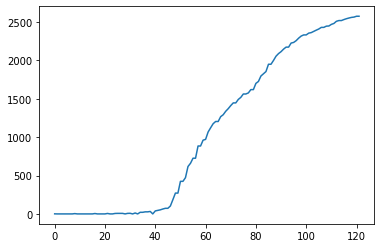

In [ ]:
plt.plot(daily_cases_cumulative)

## Forecast:

### Data entry and results

#### Daily

In [ ]:
# SECTION 1
#========================================================================================================================
#fitting the curve on the first 120 days of pandemic

#Creating initial guesses and upper and lower bound for the parameters that model needs to estimate
#first 50 days
params_init_min_max = Parameters()
params_init_min_max.add("R_0_start",   min = 1.5,    max = 10   )
params_init_min_max.add("x0",          min = 50,      max = 120    )
#params_init_min_max.add("k",            min = 0.1,   max = 5  )
params_init_min_max.add("R_0_end",     min = 0.3,    max = 10     )
#params_init_min_max.add("alpha",       min = 0.003,  max = 0.05   )
params_init_min_max.add("rate_OTH",         min = 0.1,    max = 0.7    )
params_init_min_max.add("rate_H",         min = 0.1,    max = 0.7    )
#params_init_min_max.add("rho_H",         min = 0.01,    max = 0.7    )

#Fixed parameters
k_constant=1.0
#rho=0.13
sigma=1/5.1
gamma_D=1/12.1689
alpha_H = 0.14876
prob_H = 0.188885

# setting the initial values of each compartment
start_point_1 = [population_Region,1,0,0,0,0,0,0,0,0]
starting_data = start_point_1

# setting up the date on which the curve fitting function will be perfomed
Start_day_training = 0
end_day_training = (16*7)
start_day_estimation = end_day_training

#This is the array of number of each compartment that needs to be fitted on the real data
# 7  : Cumulative number of cases
# 8  : Daily number of cases 
# 9  : Daily admission to hospital
# 10 : Daily number of discharge at hospitals
# 5  : Daily Number of hospitalization
Compartment_train = [8,9,10,5]

daily_death_H = provincial_data_CIHI["Deaths12"].values[::1]
daily_recovered_H = provincial_data_CIHI["Discharges11"].values[::1]
daily_admitted_H

# creating data set based on the specified interval
#data_set=data_set_create(Start_day_training=Start_day_training, end_day_training=end_day_training)

# this is important to have it like this format since these variables will be used throughout the model
#training_set1 = data_set[0]
#training_set1_cumulative = data_set[1]
#training_set2 = data_set[2]
day_start=Start_day_training
day_end=end_day_training




# perfoming the curve fitting function
#k = true k is being estimated
#k = false k is constant
# NOTE 1 : do NOT change the ordering sequence of you input the data inside model
Result_curve_fitting_1=model_fitting_function_multi(training_data1_cumulative = daily_cases_cumulative,
                                                    training_data1 = daily_cases,
                                                    training_data2 = daily_admitted_H, 
                                                    training_data3 = daily_discharge,
                                                    training_data4 = daily_hospitalization,
                                                    outbreak_shift = 0,
                                                    compartment_array = Compartment_train,
                                                    initial_parameter= params_init_min_max,
                                                    day_start=Start_day_training,
                                                    day_end=end_day_training,
                                                    k_inclusion=False,
                                                    brute_step=4)

# Creating a data frame of result and real data
#dataframe_result_1 = dataframe_transform(Result_curve_fitting=Result_curve_fitting_1,
#                                         data1_cumulative = daily_cases_cumulative,
#                                         data1 = daily_cases, 
#                                         data2 = daily_admitted_H,
#                                         data3 = daily_recovered_H,
#                                         data4 = daily_death_H,
#                                         day_start=Start_day_training,
#                                         day_end=end_day_training,
#                                         outbreak_shift = 0)

In [ ]:
# daily for lagged
#creating a dataframe with correct index and to put the results in
daily_hospitalization=provincial_data_CIHI['daily_Hospitalizations']
hospitalization_data_SIR_forecast=daily_hospitalization.to_frame()

complete_interpolated_pandemic_data=complete_pandemic_data.copy()

period_info=7

for i in range(91,len(complete_pandemic_data)):
  # SECTION 1
  #========================================================================================================================
  #fitting the curve on the first 120 days of pandemic

  #Creating initial guesses and upper and lower bound for the parameters that model needs to estimate
  #first 50 days
  params_init_min_max = Parameters()
  params_init_min_max.add("R_0_start",   min = 1.5,    max = 10   )
  params_init_min_max.add("x0",          min = 50,      max = 120    )
  #params_init_min_max.add("k",            min = 0.1,   max = 5  )
  params_init_min_max.add("R_0_end",     min = 0.3,    max = 10     )
  #params_init_min_max.add("alpha",       min = 0.003,  max = 0.05   )
  params_init_min_max.add("rate_OTH",         min = 0.1,    max = 0.7    )
  params_init_min_max.add("rate_H",         min = 0.1,    max = 0.7    )
  #params_init_min_max.add("rho_H",         min = 0.01,    max = 0.7    )

  #Fixed parameters
  k_constant=1.0
  #rho=0.13
  sigma=1/5.1
  gamma_D=1/12.1689
  alpha_H = 0.14876
  prob_H = 0.188885

  # setting the initial values of each compartment
  start_point_1 = [population_Region,1,0,0,0,0,0,0,0,0]
  starting_data = start_point_1

  # setting up the date on which the curve fitting function will be perfomed
  Start_day_training = 0
  end_day_training = (i)
  start_day_estimation = end_day_training

  #This is the array of number of each compartment that needs to be fitted on the real data
  # 7  : Cumulative number of cases
  # 8  : Daily number of cases 
  # 9  : Daily admission to hospital
  # 10 : Daily number of discharge at hospitals
  # 5  : Daily Number of hospitalization
  Compartment_train = [8,9,10,5]

  #daily_death_H = provincial_data_CIHI["Deaths12"].values[::1]
  #daily_recovered_H = provincial_data_CIHI["Discharges11"].values[::1]
  #daily_admitted_H


  day_start=Start_day_training
  day_end=end_day_training


  # perfoming the curve fitting function
  #k = true k is being estimated
  #k = false k is constant
  # NOTE 1 : do NOT change the ordering sequence of you input the data inside model
  Result_curve_fitting_1=model_fitting_function_multi(training_data1_cumulative = complete_interpolated_pandemic_data['daily_cases_cumulative'],
                                                      training_data1 = complete_interpolated_pandemic_data['daily_cases'],
                                                      training_data2 = complete_interpolated_pandemic_data['daily_admitted_H'], 
                                                      training_data3 = complete_interpolated_pandemic_data['daily_discharge'],
                                                      training_data4 = complete_interpolated_pandemic_data['daily_hospitalization'],
                                                      outbreak_shift = 0,
                                                      compartment_array = Compartment_train,
                                                      initial_parameter= params_init_min_max,
                                                      day_start=Start_day_training,
                                                      day_end=end_day_training,
                                                      k_inclusion=False,
                                                      brute_step=4,
                                                      graphs='no')

  presentation_SIR_hospitalization()
  compart_scenarios=5
  day_start_scenarios = 0
  day_end_scenarios = len(complete_interpolated_pandemic_data)
  parameter_scenarios = Result_curve_fitting_1[1]
  estimated_data_for_table = ((Model(day_start=day_start_scenarios,
                                  day_end = day_end_scenarios,
                                  total_population=total_population,
                                  R_0_start = parameter_scenarios.params['R_0_start'].value,
                                  x0 = parameter_scenarios.params['x0'].value,
                                  rate_OTH = parameter_scenarios.params['rate_OTH'].value,
                                  rate_H = parameter_scenarios.params['rate_H'].value,
                                  starting_data = start_point_1,
                                  k= k_constant,
                                  R_0_end = parameter_scenarios.params['R_0_end'].value))[compart_scenarios])[Start_day_training:day_end_scenarios]#:end_day_training]

  #putting the simulated data into the dataframe
  hospitalization_data_SIR_forecast['forecast with %d days'%end_day_training]=estimated_data_for_table


hospitalization_data_SIR_forecast.to_csv('forecast SIR.csv')

In [ ]:
hospitalization_data_SIR_forecast.to_csv('forecast SIR.csv')

#### Weekly

##### Data filtering

In [ ]:
# summing the data over 7 day interval, starting with day 1, this part will discard whcih day we will start from 
# either monday or any other day,

#creating a separate dataframe for a weekly pandemic data with correct days as its index
complete_pandemic_data=provincial_data_CIHI['daily_Hospitalizations']
complete_pandemic_data=complete_pandemic_data.to_frame().drop(columns='daily_Hospitalizations')

#assiging the overlappped data into the dataframe
complete_pandemic_data['daily_cases']=daily_cases
complete_pandemic_data['daily_cases_cumulative']=daily_cases_cumulative
complete_pandemic_data['daily_admitted_H']=daily_admitted_H
complete_pandemic_data['daily_discharge']=daily_discharge
complete_pandemic_data['daily_hospitalization']=daily_hospitalization

#reseting the index and and rename it as the date column
complete_pandemic_data=complete_pandemic_data.reset_index().rename(columns = {'index':'date'}, inplace = False)

# Formating the value of date into date format
complete_pandemic_data['date'] = pd.to_datetime(complete_pandemic_data['date'],format='%Y-%m-%d')
#complete_pandemic_data['week_number'] = complete_pandemic_data['date'].dt.week
#complete_pandemic_data['year'] = complete_pandemic_data['date'].dt.year

In [ ]:
complete_pandemic_data.to_csv('pandemic data.csv')

In [ ]:
complete_pandemic_data

,date,daily_cases,daily_cases_cumulative,daily_admitted_H,daily_discharge,daily_hospitalization
0,2020-01-31,1,1,0,0,2
1,2020-02-01,0,0,0,0,2
2,2020-02-02,0,0,0,0,2
3,2020-02-03,0,0,0,1,1
4,2020-02-04,0,0,1,0,2
...,...,...,...,...,...,...
117,2020-05-27,9,2550,3,6,6
118,2020-05-28,8,2558,3,2,7
119,2020-05-29,4,2562,2,3,6
120,2020-05-30,11,2573,2,5,3


In [ ]:
# complete_pandemic_data.to_csv('pandemic_data.csv')

# groupby the data frame to get the seven day sum
# and divide everything by 7 since we want the average 
complete_pandemic_data_weekly_1=(complete_pandemic_data.groupby(complete_pandemic_data.index // 7).sum())/7

# adding a row of zero for time zero
complete_pandemic_data_weekly_1.loc[len(complete_pandemic_data_weekly_1)] = 0
complete_pandemic_data_weekly_1 = round(complete_pandemic_data_weekly_1.shift()).apply(np.int64)
complete_pandemic_data_weekly_1.loc[0] = 0

In [ ]:
# complete_pandemic_data.to_csv('pandemic_data.csv')
period_info=6
# groupby the data frame to get the seven day sum
# and divide everything by 'period_info' since we want the average
# mpi = multi period info 
complete_pandemic_data_weekly_mpi=(complete_pandemic_data.groupby(complete_pandemic_data.index // period_info).sum())/period_info

# adding a row of zero for time zero
complete_pandemic_data_weekly_mpi.loc[len(complete_pandemic_data_weekly_mpi)] = 0
complete_pandemic_data_weekly_mpi = (complete_pandemic_data_weekly_mpi.shift())#.apply(np.int64)
complete_pandemic_data_weekly_mpi.loc[0] = 0

In [ ]:
complete_pandemic_data_weekly_mpi

,daily_cases,daily_cases_cumulative,daily_admitted_H,daily_discharge,daily_hospitalization
0,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.166667,0.166667,0.166667,0.166667,1.833333
2,0.500000,0.666667,0.166667,0.000000,2.333333
3,0.166667,0.833333,0.166667,0.000000,3.833333
4,0.166667,1.000000,0.333333,0.333333,3.833333
5,0.166667,5.666667,0.166667,0.000000,4.500000
6,2.333333,10.333333,0.833333,0.166667,8.000000
7,3.000000,28.500000,2.000000,1.000000,12.833333
8,23.333333,92.000000,6.333333,2.333333,27.000000
9,71.833333,413.166667,11.666667,5.500000,59.166667


##### Forecast

In [ ]:
# SECTION 1
#========================================================================================================================
#fitting the curve on the first 120 days of pandemic
period_info=7

#Creating initial guesses and upper and lower bound for the parameters that model needs to estimate
#first 50 days
params_init_min_max = Parameters()
params_init_min_max.add("R_0_start",   min = 0 ,    max = 10  )
params_init_min_max.add("x0",          min = 50/period_info ,      max = 122/period_info   )
#params_init_min_max.add("k",            min = 0.1,   max = 5  )
params_init_min_max.add("R_0_end",     min = 0,    max = 10     )
#params_init_min_max.add("alpha",       min = 0.003,  max = 0.05   )
params_init_min_max.add("rate_OTH",         min = 0.1*period_info,    max = 0.7*period_info    )
params_init_min_max.add("rate_H",         min = 0.1*period_info,    max = 0.7*period_info    )
#params_init_min_max.add("rho_H",         min = 0.01,    max = 0.7    )

#Fixed parameters
k_constant=1.0
#rho=0.13
sigma=1/(5.1/period_info)
gamma_D=1/(12.1689/period_info)
alpha_H = 0.14876
prob_H = 0.188885

# setting the initial values of each compartment
start_point_1 = [population_Region,1,0,0,0,0,0,0,0,0]
starting_data = start_point_1

# setting up the date on which the curve fitting function will be perfomed
Start_day_training = 0
end_day_training = (16)
start_day_estimation = end_day_training

#This is the array of number of each compartment that needs to be fitted on the real data
# 7  : Cumulative number of cases
# 8  : Daily number of cases 
# 9  : Daily admission to hospital
# 10 : Daily number of discharge at hospitals
# 5  : Daily Number of hospitalization
Compartment_train = [8,9,10,5]

daily_death_H = provincial_data_CIHI["Deaths12"].values[::1]
daily_recovered_H = provincial_data_CIHI["Discharges11"].values[::1]
daily_admitted_H

# creating data set based on the specified interval
#data_set=data_set_create(Start_day_training=Start_day_training, end_day_training=end_day_training)

# this is important to have it like this format since these variables will be used throughout the model
#training_set1 = data_set[0]
#training_set1_cumulative = data_set[1]
#training_set2 = data_set[2]
day_start=Start_day_training
day_end=end_day_training




# perfoming the curve fitting function
#k = true k is being estimated
#k = false k is constant
# NOTE 1 : do NOT change the ordering sequence of you input the data inside model
Result_curve_fitting_1=model_fitting_function_multi(training_data1_cumulative = complete_pandemic_data_weekly['daily_cases_cumulative'],
                                                    training_data1 = complete_pandemic_data_weekly['daily_cases'],
                                                    training_data2 = complete_pandemic_data_weekly['daily_admitted_H'], 
                                                    training_data3 = complete_pandemic_data_weekly['daily_discharge'],
                                                    training_data4 = complete_pandemic_data_weekly['daily_hospitalization'],
                                                    outbreak_shift = 0,
                                                    compartment_array = Compartment_train,
                                                    initial_parameter= params_init_min_max,
                                                    day_start=Start_day_training,
                                                    day_end=end_day_training,
                                                    k_inclusion=False,
                                                    brute_step=4,
                                                    graphs='yes')

# Creating a data frame of result and real data
#dataframe_result_1 = dataframe_transform(Result_curve_fitting=Result_curve_fitting_1,
#                                         data1_cumulative = daily_cases_cumulative,
#                                         data1 = daily_cases, 
#                                         data2 = daily_admitted_H,
#                                         data3 = daily_recovered_H,
#                                         data4 = daily_death_H,
#                                         day_start=Start_day_training,
#                                         day_end=end_day_training,
#                                         outbreak_shift = 0)

#### Daily-interpolated

##### Interpolation process

###### Method I:

In [ ]:
period_info=7

from scipy.interpolate import interp1d

interpolation_kind='linear'
#creating a separate dataframe for a weekly pandemic data with correct days as its index
complete_pandemic_data_daily_inter_1=provincial_data_CIHI['daily_Hospitalizations']
complete_pandemic_data_daily_inter_1=complete_pandemic_data_daily_inter_1.to_frame().drop(columns='daily_Hospitalizations')

#assiging the overlappped data into the dataframe
complete_pandemic_data_daily_inter_1['daily_cases']=daily_cases
complete_pandemic_data_daily_inter_1['daily_cases_cumulative']=daily_cases_cumulative
complete_pandemic_data_daily_inter_1['daily_admitted_H']=linear_interpolation(complete_pandemic_data['daily_admitted_H'],
                                                                            complete_pandemic_data_weekly_1_2['daily_admitted_H'],
                                                                            period_info)
complete_pandemic_data_daily_inter_1['daily_discharge']=linear_interpolation(complete_pandemic_data['daily_discharge'],
                                                                           complete_pandemic_data_weekly_1_2['daily_discharge'],
                                                                           period_info)
complete_pandemic_data_daily_inter_1['daily_hospitalization']=linear_interpolation(complete_pandemic_data['daily_hospitalization'],
                                                                                 complete_pandemic_data_weekly_1_2['daily_hospitalization'],
                                                                                 period_info)





NameError: ignored

In [ ]:
period_info=7

from scipy.interpolate import interp1d

interpolation_kind='linear'
#creating a separate dataframe for a weekly pandemic data with correct days as its index
complete_pandemic_data_daily_inter_1_2=provincial_data_CIHI['daily_Hospitalizations']
complete_pandemic_data_daily_inter_1_2=complete_pandemic_data_daily_inter_1_2.to_frame().drop(columns='daily_Hospitalizations')

#assiging the overlappped data into the dataframe
complete_pandemic_data_daily_inter_1_2['daily_cases']=daily_cases
complete_pandemic_data_daily_inter_1_2['daily_cases_cumulative']=daily_cases_cumulative
complete_pandemic_data_daily_inter_1_2['daily_admitted_H']=linear_interpolation_3(complete_pandemic_data['daily_admitted_H'],
                                                                            complete_pandemic_data_weekly_1_2['daily_admitted_H'],
                                                                            period_info,interpolation_kind)
complete_pandemic_data_daily_inter_1_2['daily_discharge']=linear_interpolation_3(complete_pandemic_data['daily_discharge'],
                                                                           complete_pandemic_data_weekly_1_2['daily_discharge'],
                                                                           period_info,interpolation_kind)
complete_pandemic_data_daily_inter_1_2['daily_hospitalization']=linear_interpolation_3(complete_pandemic_data['daily_hospitalization'],
                                                                                 complete_pandemic_data_weekly_1_2['daily_hospitalization'],
                                                                                 period_info,interpolation_kind)





In [ ]:
from scipy.interpolate import interp1d



period_info=10
interpolation_kind='linear'

dict_of_interpolated_data = {}

for i in range(1,math.ceil(len(complete_pandemic_data)/period_info)+1):
  temp_daily_data=complete_pandemic_data.iloc[0:i*period_info,]
  complete_pandemic_data_weekly_mpi=replenishment_func_5(temp_daily_data,period_info)

  interpolated_data=provincial_data_CIHI['daily_Hospitalizations'].iloc[0:i*period_info,]
  interpolated_data=interpolated_data.to_frame().drop(columns='daily_Hospitalizations')

  interpolated_data['daily_cases']=linear_interpolation_6(temp_daily_data['daily_cases'],
                                                          complete_pandemic_data_weekly_mpi['daily_cases'],
                                                          period_info,interpolation_kind)
  
  interpolated_data['daily_cases_cumulative']=linear_interpolation_6(temp_daily_data['daily_cases_cumulative'],
                                                                     complete_pandemic_data_weekly_mpi['daily_cases_cumulative'],
                                                                     period_info,interpolation_kind)

  interpolated_data['daily_admitted_H']=linear_interpolation_6(temp_daily_data['daily_admitted_H'],
                                                               complete_pandemic_data_weekly_mpi['daily_admitted_H'],
                                                               period_info,interpolation_kind)

  interpolated_data['daily_discharge']=linear_interpolation_6(temp_daily_data['daily_discharge'],
                                                              complete_pandemic_data_weekly_mpi['daily_discharge'],
                                                              period_info,interpolation_kind)
  
  interpolated_data['daily_hospitalization']=linear_interpolation_6(temp_daily_data['daily_hospitalization'],
                                                                    complete_pandemic_data_weekly_mpi['daily_hospitalization'],
                                                                    period_info,interpolation_kind)
  dict_of_interpolated_data["df_interpolated_epoch_{}".format(i)]=interpolated_data.copy()
  interpolated_data=interpolated_data.drop(interpolated_data.iloc[:,:], inplace = True, axis = 1)
  


  

In [ ]:
 from scipy import interpolate

def linear_interpolation_6 (sr_origin,sr_grouped,period_info_intpl,inter_kind):


  #df_origin=test#complete_pandemic_data['daily_admitted_H']
  sr_grouped=sr_grouped.reset_index()
  limit_complete_period=math.floor(len(sr_origin)/period_info_intpl)
  limit_complete_total=math.ceil(len(sr_origin)/period_info_intpl)

  if limit_complete_period==0:
    df_temp_1=sr_grouped.iloc[0:limit_complete_total+1,]

    # x and y of the data that interpolation will be based on
    x_temp_1 = df_temp_1.iloc[:,0]
    y_temp_1 = df_temp_1.iloc[:,1]

    x_adj=x_temp_1
    x_adj[1:limit_complete_total]=x_temp_1[1:(limit_complete_total)]-0.5
    x_origin_1=np.linspace(df_temp_1.iloc[0,0], df_temp_1.iloc[-1,0], num=len(sr_origin), endpoint=True)    
    y_interpy_temp_1 = interp1d(x_adj, y_temp_1,kind=inter_kind)
    final_array=y_interpy_temp_1(x_origin_1)
  else:

    # Creating two separate dataframe based on the completeness of the periods
    df_temp_1=sr_grouped.iloc[:limit_complete_period+1,]
    df_temp_2=sr_grouped.iloc[limit_complete_period:limit_complete_total+1,]

    # x and y of the data that interpolation will be based on
    x_temp_1 = df_temp_1.iloc[:,0]
    x_temp_2 = df_temp_2.iloc[:,0]
    y_temp_1 = df_temp_1.iloc[:,1]
    y_temp_2 = df_temp_2.iloc[:,1]

    if len(df_temp_2)>1:
      
      x_temp_2.iloc[1]=x_temp_2.iloc[0]+len(sr_origin[limit_complete_period*period_info_intpl:])/period_info_intpl

      x_adj=x_temp_1.copy()
      x_adj[1:limit_complete_total]=(x_temp_1[1:limit_complete_total]-0.5)
      x_adj=x_adj.append(x_temp_2,ignore_index=True)
      y_adj=y_temp_1.copy()
      y_adj=y_adj.append(y_temp_2,ignore_index=True)
      y_adj.iloc[-2]=y_temp_2.iloc[1]

      x_origin_1=np.linspace(x_temp_1.iloc[0], x_temp_2.iloc[-2], num=limit_complete_period*period_info_intpl, endpoint=True)    
      x_origin_2=(np.linspace(x_temp_2.iloc[-2], x_adj.iloc[-1], num=len(sr_origin[limit_complete_period*period_info_intpl:])+1, endpoint=True))[1:]
      x_origin_new=np.concatenate([x_origin_1,x_origin_2])

      y_interpy_temp_1 = interp1d(x_adj, y_adj,kind=inter_kind)
      final_array=y_interpy_temp_1(x_origin_new)

    elif len(df_temp_2)==1:

      x_adj=x_temp_1.copy()
      #dividing all period_info in half so that the interpolation graph would pass through them all
      x_adj[1:limit_complete_total]=x_temp_1[1:(limit_complete_total)]-0.5
      # adding one more data for the last value so that it would better represent the data
      x_adj[limit_complete_total]=x_temp_1[limit_complete_total-1]
      x_adj[limit_complete_total+1]=x_temp_1[limit_complete_total]
      x_origin_1=np.linspace(df_temp_1.iloc[0,0], df_temp_1.iloc[-1,0], num=limit_complete_period*period_info_intpl, endpoint=True)    
      y_temp_1[limit_complete_total]=y_temp_1[limit_complete_total]
      y_temp_1[limit_complete_total+1]=y_temp_1[limit_complete_total]
      y_interpy_temp_1 = interp1d(x_adj, y_temp_1,kind=inter_kind)
      final_array=y_interpy_temp_1(x_origin_1)

  return final_array

In [ ]:
from scipy.interpolate import interp1d

R=7
period_info=6
interpolation_kind='linear'

i=9

temp_daily_data=complete_pandemic_data.iloc[0:i*R,]
complete_pandemic_data_weekly_mpi=replenishment_func_5(temp_daily_data,period_info)

interpolated_data=provincial_data_CIHI['daily_Hospitalizations'].iloc[0:i*R,]
interpolated_data=interpolated_data.to_frame().drop(columns='daily_Hospitalizations')

interpolated_data['daily_cases']=daily_cases[0:i*R]
interpolated_data['daily_cases_cumulative']=daily_cases_cumulative[0:i*R]

interpolated_data['daily_admitted_H']=linear_interpolation_4(temp_daily_data['daily_admitted_H'],
                                                                          complete_pandemic_data_weekly_mpi['daily_admitted_H'],
                                                                          period_info,interpolation_kind)

interpolated_data['daily_discharge']=linear_interpolation_4(temp_daily_data['daily_discharge'],
                                                                          complete_pandemic_data_weekly_mpi['daily_discharge'],
                                                                          period_info,interpolation_kind)
interpolated_data['daily_hospitalization']=linear_interpolation_4(temp_daily_data['daily_hospitalization'],
                                                                                complete_pandemic_data_weekly_mpi['daily_hospitalization'],
                                                                                period_info,interpolation_kind)
test=interpolated_data.copy()
interpolated_data=interpolated_data.drop(interpolated_data.iloc[:,:], inplace = True, axis = 1)

#interpolated_data=interpolated_data.iloc[0:0,0:0]


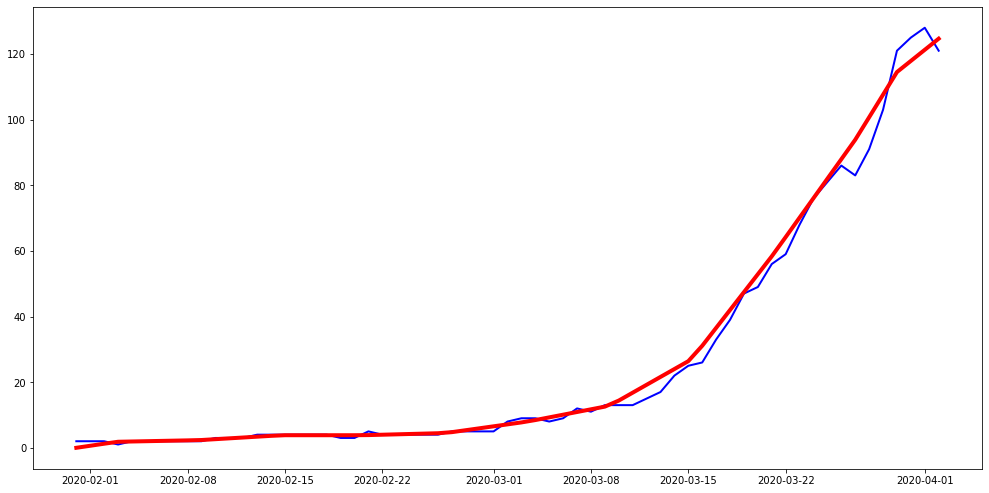

In [ ]:
fig = plt.figure(figsize=(17,8.5))
ax = fig.add_subplot(111)

ax.plot(temp_daily_data['date'],temp_daily_data['daily_hospitalization'],'b',label='original',linewidth=2)
ax.plot(temp_daily_data['date'],test['daily_hospitalization'],'r',label='interpolated',linewidth=4)


In [ ]:

period_info=8
R=7



complete_pandemic_data_weekly_mpi=replenishment_func_3(complete_pandemic_data,period_info)
i=1
test_data=complete_pandemic_data.iloc[0:i*R,]

complete_pandemic_data_weekly_mpi=replenishment_func_5(test_data,period_info)


from scipy.interpolate import interp1d

interpolation_kind='linear'
#creating a separate dataframe for a weekly pandemic data with correct days as its index
complete_pandemic_data_daily_inter_1_2=provincial_data_CIHI['daily_Hospitalizations']
complete_pandemic_data_daily_inter_1_2=complete_pandemic_data_daily_inter_1_2.to_frame().drop(columns='daily_Hospitalizations')

#assiging the overlappped data into the dataframe
complete_pandemic_data_daily_inter_1_2['daily_cases']=daily_cases
complete_pandemic_data_daily_inter_1_2['daily_cases_cumulative']=daily_cases_cumulative
complete_pandemic_data_daily_inter_1_2['daily_admitted_H']=linear_interpolation_3(complete_pandemic_data['daily_admitted_H'],
                                                                            complete_pandemic_data_weekly_1_2['daily_admitted_H'],
                                                                            period_info,interpolation_kind)
complete_pandemic_data_daily_inter_1_2['daily_discharge']=linear_interpolation_3(complete_pandemic_data['daily_discharge'],
                                                                           complete_pandemic_data_weekly_1_2['daily_discharge'],
                                                                           period_info,interpolation_kind)
complete_pandemic_data_daily_inter_1_2['daily_hospitalization']=linear_interpolation_3(complete_pandemic_data['daily_hospitalization'],
                                                                                 complete_pandemic_data_weekly_1_2['daily_hospitalization'],
                                                                                 period_info,interpolation_kind)





In [ ]:
 from scipy import interpolate

def linear_interpolation_3 (sr_origin,sr_grouped,period_info_intpl,inter_kind):

  #df_origin=test#complete_pandemic_data['daily_admitted_H']
  sr_grouped=sr_grouped.reset_index()
  limit_complete_period=math.floor(len(sr_origin)/period_info_intpl)
  limit_complete_total=math.ceil(len(sr_origin)/period_info_intpl)

  # Creating two separate dataframe based on the completeness of the periods
  df_temp_1=sr_grouped.iloc[:limit_complete_period+1,]
  df_temp_2=sr_grouped.iloc[limit_complete_period:limit_complete_total+1,]

  # x and y of the data that interpolation will be based on
  x_temp_1 = df_temp_1.iloc[:,0]
  x_temp_2 = df_temp_2.iloc[:,0]
  y_temp_1 = df_temp_1.iloc[:,1]
  y_temp_2 = df_temp_2.iloc[:,1]

  if len(df_temp_2)>1:
    
    x_temp_2.iloc[1]=x_temp_2.iloc[0]+len(sr_origin[limit_complete_period*period_info_intpl:])/period_info_intpl

    x_adj=x_temp_1.append(x_temp_2.iloc[1:])
    y_adj=y_temp_1.append(y_temp_2.iloc[1:])

    x_adj[1:limit_complete_total]=x_adj[1:limit_complete_total]-0.5
    x_adj[limit_complete_total]=x_adj[limit_complete_total]-(len(sr_origin[limit_complete_period*period_info_intpl:])/period_info_intpl)/2

    x_origin_1=np.linspace(x_temp_1.iloc[0], x_temp_2.iloc[-2], num=limit_complete_period*period_info_intpl, endpoint=True)    
    x_origin_2=(np.linspace(x_temp_2.iloc[-2], x_adj.iloc[-1], num=len(sr_origin[limit_complete_period*period_info_intpl:])+1, endpoint=True))[1:]
    x_origin_new=np.concatenate([x_origin_1,x_origin_2])

    y_interpy_temp_1 = interp1d(x_adj, y_adj,kind=inter_kind)
    final_array=y_interpy_temp_1(x_origin_new)

  elif len(df_temp_2)==1:

    x_adj=x_temp_1
    x_adj[1:limit_complete_total]=x_temp_1[1:(limit_complete_total)]-0.5
    x_origin_1=np.linspace(df_temp_1.iloc[0,0], df_temp_1.iloc[-1,0], num=limit_complete_period*period_info_intpl, endpoint=True)    
    y_interpy_temp_1 = interp1d(x_adj, y_temp_1,kind=inter_kind)
    final_array=y_interpy_temp_1(x_origin_1)

  return final_array

###### Method II:

In [ ]:
# Computing the weekly data, in this section we simply sum the data every period_info interval
# complete_pandemic_data.to_csv('pandemic_data.csv')

# groupby the data frame to get the seven day sum
# and divide everything by 7 since we want the average 
complete_pandemic_data_weekly_2=(complete_pandemic_data.groupby(complete_pandemic_data.index // 7).sum())

# adding a row of zero for time zero
complete_pandemic_data_weekly_2.loc[len(complete_pandemic_data_weekly_2)] = 0
complete_pandemic_data_weekly_2 = round(complete_pandemic_data_weekly_2.shift()).apply(np.int64)
complete_pandemic_data_weekly_2.loc[0] = 0

In [ ]:
period_info=7

from scipy.interpolate import interp1d

interpolation_kind='cubic'
#creating a separate dataframe for a weekly pandemic data with correct days as its index
complete_pandemic_data_daily_inter_2_2=provincial_data_CIHI['daily_Hospitalizations'][:119]
complete_pandemic_data_daily_inter_2_2=complete_pandemic_data_daily_inter_2_2.to_frame().drop(columns='daily_Hospitalizations')

#assiging the overlappped data into the dataframe
complete_pandemic_data_daily_inter_2_2['daily_cases']=daily_cases[:119]
complete_pandemic_data_daily_inter_2_2['daily_cases_cumulative']=daily_cases_cumulative[:119]
complete_pandemic_data_daily_inter_2_2['daily_admitted_H']=linear_interpolation_2(complete_pandemic_data['daily_admitted_H'][:119],
                                                                            complete_pandemic_data_weekly_1_2['daily_admitted_H'][:18],
                                                                            period_info,interpolation_kind)
complete_pandemic_data_daily_inter_2_2['daily_discharge']=linear_interpolation_2(complete_pandemic_data['daily_discharge'][:119],
                                                                           complete_pandemic_data_weekly_1_2['daily_discharge'][:18],
                                                                           period_info,interpolation_kind)
complete_pandemic_data_daily_inter_2_2['daily_hospitalization']=linear_interpolation_2(complete_pandemic_data['daily_hospitalization'][:119],
                                                                                 complete_pandemic_data_weekly_1_2['daily_hospitalization'][:18],
                                                                                 period_info,interpolation_kind)





In [ ]:
#creating a dataframe to assign the new interpolated data into
complete_pandemic_data_daily_inter_2=complete_pandemic_data.set_index('date').copy()
for j in range(len(complete_pandemic_data_daily_inter_2.columns)):
  for i in range(1,math.ceil(len(complete_pandemic_data_daily_inter_2)/period_info)+1):
    complete_pandemic_data_daily_inter_2.iloc[(i-1)*period_info:i*period_info,j]=complete_pandemic_data_weekly_2.iloc[i,j]/len(complete_pandemic_data_daily_inter_2.iloc[(i-1)*period_info:i*period_info,j])

In [ ]:
from scipy.interpolate import interp1d



period_info=10
interpolation_kind='linear'

dict_of_interpolated_data = {}

for i in range(1,math.ceil(len(complete_pandemic_data)/period_info)+1):
  temp_daily_data=complete_pandemic_data.iloc[0:i*period_info,]
  complete_pandemic_data_weekly_mpi=replenishment_func_5(temp_daily_data,period_info)

  interpolated_data=provincial_data_CIHI['daily_Hospitalizations'].iloc[0:i*period_info,]
  interpolated_data=interpolated_data.to_frame().drop(columns='daily_Hospitalizations')

  interpolated_data['daily_cases']=daily_cases[0:i*period_info]
  interpolated_data['daily_cases_cumulative']=daily_cases_cumulative[0:i*period_info]

  interpolated_data['daily_admitted_H']=linear_interpolation_4(temp_daily_data['daily_admitted_H'],
                                                                            complete_pandemic_data_weekly_mpi['daily_admitted_H'],
                                                                            period_info,interpolation_kind)

  interpolated_data['daily_discharge']=linear_interpolation_4(temp_daily_data['daily_discharge'],
                                                                            complete_pandemic_data_weekly_mpi['daily_discharge'],
                                                                            period_info,interpolation_kind)
  interpolated_data['daily_hospitalization']=linear_interpolation_4(temp_daily_data['daily_hospitalization'],
                                                                                  complete_pandemic_data_weekly_mpi['daily_hospitalization'],
                                                                                  period_info,interpolation_kind)
  dict_of_interpolated_data["df_interpolated_epoch_{}".format(i)]=interpolated_data.copy()
  interpolated_data=interpolated_data.drop(interpolated_data.iloc[:,:], inplace = True, axis = 1)
  


  

In [ ]:
test=dict_of_interpolated_data['df_interpolated_epoch_13']['daily_hospitalization']

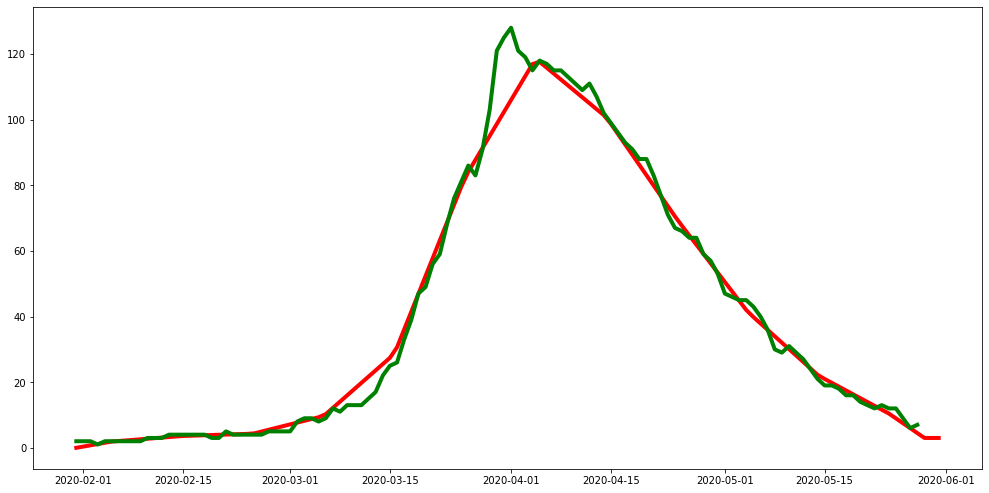

In [ ]:
fig = plt.figure(figsize=(17,8.5))
ax = fig.add_subplot(111)

#ax.plot(complete_pandemic_data_daily_inter_2.index[:119],complete_pandemic_data_daily_inter_2['daily_hospitalization'][:119],'b',label='new method',linewidth=2)
ax.plot(test.index,test,'r',label='old method',linewidth=4)
ax.plot(test.index[:119],complete_pandemic_data['daily_hospitalization'][:119],'g',label='new method',linewidth=4)
#ax.plot(complete_pandemic_data_daily_inter_2.index[:119],complete_pandemic_data_daily_inter_1['daily_hospitalization'][:119],'y',label='new method',linewidth=2)
#ax.plot(complete_pandemic_data_daily_inter_2.index[:119],complete_pandemic_data_daily_inter_2_2['daily_hospitalization'][:119],'p',label='new method',linewidth=2)


In [ ]:
fig = plt.figure(figsize=(17,8.5))
ax = fig.add_subplot(111)


ax.plot(complete_pandemic_data_daily_inter_2.index[:119],complete_pandemic_data_daily_inter_2['daily_hospitalization'][:119],'b',label='new method',linewidth=2)
#ax.plot(complete_pandemic_data_daily_inter_2.index[:119],y_new_inter,'r',label='old method',linewidth=2)
ax.plot(complete_pandemic_data_daily_inter_2.index[:119],complete_pandemic_data['daily_hospitalization'][:119],'g',label='new method',linewidth=2)


In [ ]:
fig = plt.figure(figsize=(17,8.5))
ax = fig.add_subplot(111)

ax.plot(complete_pandemic_data_daily_inter_2.index,complete_pandemic_data_daily_inter_2['daily_hospitalization'],'b',label='new method 1',linewidth=2)
ax.plot(complete_pandemic_data_daily_inter_2.index,complete_pandemic_data_daily_inter_1['daily_hospitalization'],'r',label='old method',linewidth=2)
ax.plot(complete_pandemic_data_daily_inter_2.index,complete_pandemic_data_daily_inter_1_2['daily_hospitalization'],'g',label='new method 2',linewidth=2)


plt.title('new vs old',fontsize=16)
plt.xlabel('Time (days)',fontsize=16)
plt.ylabel('Hospitalization',fontsize=16)



plt.legend(fontsize=13)

##### Forecast

In [ ]:
# summing the data over 7 day interval, starting with day 1, this part will discard whcih day we will start from 
# either monday or any other day,

#creating a separate dataframe for a weekly pandemic data with correct days as its index
complete_pandemic_data=provincial_data_CIHI['daily_Hospitalizations']
complete_pandemic_data=complete_pandemic_data.to_frame().drop(columns='daily_Hospitalizations')

#assiging the overlappped data into the dataframe
complete_pandemic_data['daily_cases']=daily_cases
complete_pandemic_data['daily_cases_cumulative']=daily_cases_cumulative
complete_pandemic_data['daily_admitted_H']=daily_admitted_H
complete_pandemic_data['daily_discharge']=daily_discharge
complete_pandemic_data['daily_hospitalization']=daily_hospitalization

#reseting the index and and rename it as the date column
complete_pandemic_data=complete_pandemic_data.reset_index().rename(columns = {'index':'date'}, inplace = False)

# Formating the value of date into date format
complete_pandemic_data['date'] = pd.to_datetime(complete_pandemic_data['date'],format='%Y-%m-%d')
#complete_pandemic_data['week_number'] = complete_pandemic_data['date'].dt.week
#complete_pandemic_data['year'] = complete_pandemic_data['date'].dt.year

In [ ]:
################################

105.0

In [ ]:
(variable_period_info_df.iloc[18,:].dropna()).astype(int)

0      1
1     22
2      6
3      3
4     11
5      7
6     16
7      5
8      6
9     21
10    20
11     3
Name: 18, dtype: int64

In [ ]:
variable_period_info_df=pd.read_csv('variable 10000 period info.csv')
variable_period_info_df=variable_period_info_df.drop(columns='Unnamed: 0')

In [ ]:
complete_vpi_SIR_forecast=pd.DataFrame()
start_it=19
end_it=20

for k in range(start_it,end_it):
  data_for_grouping=complete_pandemic_data.copy()
  temp_index_grouped_origin=(variable_period_info_df.iloc[k,:].dropna()).astype(int)
  data_for_grouping['grouping_index']=data_for_grouping['daily_cases']
  data_for_grouping['grouping_index']=np.nan
  s0 = pd.Series([0])
  temp_index_grouped=(s0.append(temp_index_grouped_origin, ignore_index=True)).astype(int)

  for i in range(1,len(temp_index_grouped)):
    data_for_grouping['grouping_index'][temp_index_grouped[0:i].sum():temp_index_grouped[0:i+1].sum()]=i-1#temp_index_grouped[i]

  df_grouped=(data_for_grouping.groupby(data_for_grouping['grouping_index'],sort=False).sum()).div(temp_index_grouped_origin.values,axis=0)#/len(data_for_grouping)

  daily_grouped_data=data_for_grouping.set_index('grouping_index')
  daily_grouped_data.iloc[:,1:6]=df_grouped
  daily_grouped_data_SIR=daily_grouped_data.set_index('date').dropna()
  daily_grouped_data_SIR



  #creating a dataframe with correct index and to put the results in
  daily_hospitalization=provincial_data_CIHI['daily_Hospitalizations']
  hospitalization_data_SIR_forecast=daily_hospitalization.to_frame()

  #complete_interpolated_pandemic_data=complete_pandemic_data_daily_inter_1_2.copy()

  #period_info=7

  for i in range(1,len(temp_index_grouped)):
    # Since the curve fitting cannot be applied to dat with only 1 day, we simply ignore the forecasting process for
    # day=1 and move to the next one
    if temp_index_grouped[i]==1:
      hospitalization_data_SIR_forecast['forecast with 1 days']=np.full(122, 0, dtype=int)
    else:
      # SECTION 1
      #========================================================================================================================
      #fitting the curve on the first 120 days of pandemic

      #Creating initial guesses and upper and lower bound for the parameters that model needs to estimate
      #first 50 days
      params_init_min_max = Parameters()
      params_init_min_max.add("R_0_start",   min = 1.5,    max = 10   )
      params_init_min_max.add("x0",          min = 50,      max = 120    )
      #params_init_min_max.add("k",            min = 0.1,   max = 5  )
      params_init_min_max.add("R_0_end",     min = 0.3,    max = 10     )
      #params_init_min_max.add("alpha",       min = 0.003,  max = 0.05   )
      params_init_min_max.add("rate_OTH",         min = 0.1,    max = 0.7    )
      params_init_min_max.add("rate_H",         min = 0.1,    max = 0.7    )
      #params_init_min_max.add("rho_H",         min = 0.01,    max = 0.7    )

      #Fixed parameters
      k_constant=1.0
      #rho=0.13
      sigma=1/5.1
      gamma_D=1/12.1689
      alpha_H = 0.14876
      prob_H = 0.188885

      # setting the initial values of each compartment
      start_point_1 = [population_Region,1,0,0,0,0,0,0,0,0]
      starting_data = start_point_1

      # setting up the date on which the curve fitting function will be perfomed
      Start_day_training = 0
      end_day_training = temp_index_grouped[0:i+1].sum()
      start_day_estimation = end_day_training

      complete_interpolated_pandemic_data=daily_grouped_data_SIR.iloc[0:temp_index_grouped[0:i+1].sum(),:]

      #This is the array of number of each compartment that needs to be fitted on the real data
      # 7  : Cumulative number of cases
      # 8  : Daily number of cases 
      # 9  : Daily admission to hospital
      # 10 : Daily number of discharge at hospitals
      # 5  : Daily Number of hospitalization
      Compartment_train = [8,9,10,5]

      #daily_death_H = provincial_data_CIHI["Deaths12"].values[::1]
      #daily_recovered_H = provincial_data_CIHI["Discharges11"].values[::1]
      #daily_admitted_H


      day_start=Start_day_training
      day_end=end_day_training


      # perfoming the curve fitting function
      #k = true k is being estimated
      #k = false k is constant
      # NOTE 1 : do NOT change the ordering sequence of you input the data inside model
      Result_curve_fitting_1=model_fitting_function_multi(training_data1_cumulative = complete_interpolated_pandemic_data['daily_cases_cumulative'],
                                                          training_data1 = complete_interpolated_pandemic_data['daily_cases'],
                                                          training_data2 = complete_interpolated_pandemic_data['daily_admitted_H'], 
                                                          training_data3 = complete_interpolated_pandemic_data['daily_discharge'],
                                                          training_data4 = complete_interpolated_pandemic_data['daily_hospitalization'],
                                                          outbreak_shift = 0,
                                                          compartment_array = Compartment_train,
                                                          initial_parameter= params_init_min_max,
                                                          day_start=Start_day_training,
                                                          day_end=end_day_training,
                                                          k_inclusion=False,
                                                          brute_step=4,
                                                          graphs='no')

      #presentation_SIR_hospitalization()
      compart_scenarios=5
      day_start_scenarios = 0
      day_end_scenarios = len(hospitalization_data_SIR_forecast)
      parameter_scenarios = Result_curve_fitting_1[1]
      estimated_data_for_table = ((Model(day_start=day_start_scenarios,
                                      day_end = day_end_scenarios,
                                      total_population=total_population,
                                      R_0_start = parameter_scenarios.params['R_0_start'].value,
                                      x0 = parameter_scenarios.params['x0'].value,
                                      rate_OTH = parameter_scenarios.params['rate_OTH'].value,
                                      rate_H = parameter_scenarios.params['rate_H'].value,
                                      starting_data = start_point_1,
                                      k= k_constant,
                                      R_0_end = parameter_scenarios.params['R_0_end'].value))[compart_scenarios])[Start_day_training:day_end_scenarios]#:end_day_training]

      #putting the simulated data into the dataframe
      hospitalization_data_SIR_forecast['forecast with %d days'%end_day_training]=estimated_data_for_table

  complete_vpi_SIR_forecast=complete_vpi_SIR_forecast.append(hospitalization_data_SIR_forecast,sort=False)
  #dict_variable_period_info_SIR_forecast['forecast SIR iteration %d'%k]=hospitalization_data_SIR_forecast
  #hospitalization_data_SIR_forecast.to_csv('forecast SIR with period info of %d.csv'%period_info)

complete_vpi_SIR_forecast.to_csv('result of SIR forecast vpi %dto%d.csv'%(start_it,end_it))

In [ ]:
complete_vpi_SIR_forecast.to_csv('result of SIR forecast vpi 220,230.csv')

In [ ]:
test1.to_csv('result of SIR forecast iteration 0.csv')
test2.to_csv('result of SIR forecast iteration 1.csv')

In [ ]:
df_SIR_forecast_results_variable=df_SIR_forecast_results_variable.rename(columns={'Unnamed: 0':'Date'})
#setting the date as the index of the dataframe
df_SIR_forecast_results_variable=df_SIR_forecast_results_variable.set_index(df_SIR_forecast_results_variable['Date'])

In [ ]:
complete_vpi_SIR_forecast

,daily_Hospitalizations,forecast with 12 days,forecast with 24 days,forecast with 48 days,forecast with 72 days,forecast with 78 days,forecast with 87 days,forecast with 91 days,forecast with 105 days,forecast with 9 days,forecast with 36 days,forecast with 37 days,forecast with 42 days,forecast with 47 days,forecast with 51 days,forecast with 65 days,forecast with 73 days,forecast with 100 days,forecast with 21 days,forecast with 75 days,forecast with 104 days,forecast with 109 days,forecast with 113 days,forecast with 19 days,forecast with 35 days,forecast with 64 days,forecast with 90 days,forecast with 117 days,forecast with 2 days,forecast with 13 days,forecast with 15 days,forecast with 56 days,forecast with 68 days,forecast with 74 days,forecast with 116 days,forecast with 40 days,forecast with 62 days,forecast with 103 days,forecast with 108 days,forecast with 22 days,forecast with 45 days,forecast with 70 days,forecast with 85 days,forecast with 88 days,forecast with 96 days,forecast with 107 days,forecast with 18 days,forecast with 39 days,forecast with 43 days,forecast with 54 days,forecast with 84 days
2020-01-31,2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-02-01,2,0.011173,0.009814,0.009618,0.009868,0.001644,0.001644,0.009698,0.009640,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-02-02,2,0.039665,0.032718,0.030006,0.031458,0.005926,0.005926,0.030552,0.030250,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-02-03,1,0.081396,0.062747,0.054913,0.058662,0.012177,0.012177,0.056527,0.055838,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-02-04,2,0.135311,0.097011,0.082188,0.089310,0.020035,0.020035,0.085630,0.084478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-27,6,NaN,NaN,NaN,15.196951,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.082877,47.007021,303864.995701,59074.756501,36496.449671,37.627030
2020-05-28,7,NaN,NaN,NaN,14.434966,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24.204646,43.754947,283997.600399,66553.606030,33639.993168,36.600337
2020-05-29,6,NaN,NaN,NaN,13.708660,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.355101,40.719154,265072.607833,74909.428842,31004.869187,35.599353
2020-05-30,3,NaN,NaN,NaN,13.016583,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.533477,37.886135,247109.277037,84226.559235,28574.324556,34.623622


In [ ]:
test0=pd.read_csv('result of SIR forecast iteration 0.csv')
test1=pd.read_csv('result of SIR forecast iteration 1.csv')
df_SIR_forecast_results_variable=test0.append(test1,sort=False)
df_SIR_forecast_results_variable

,Unnamed: 0,daily_Hospitalizations,forecast with 6 days,forecast with 12 days,forecast with 28 days,forecast with 33 days,forecast with 42 days,forecast with 60 days,forecast with 86 days,forecast with 105 days,forecast with 21 days,forecast with 48 days,forecast with 76 days,forecast with 98 days,forecast with 118 days
0,2020-01-31,2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN
1,2020-02-01,2,0.011281,0.011173,0.011099,0.010539,0.011071,0.010361,0.001644,0.009517,NaN,NaN,NaN,NaN,NaN
2,2020-02-02,2,0.041188,0.039665,0.038655,0.035152,0.038424,0.034156,0.005926,0.029861,NaN,NaN,NaN,NaN,NaN
3,2020-02-03,1,0.088353,0.081396,0.076921,0.067429,0.076138,0.065089,0.012177,0.055103,NaN,NaN,NaN,NaN,NaN
4,2020-02-04,2,0.155726,0.135311,0.122726,0.104250,0.120868,0.100377,0.020035,0.083325,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117,2020-05-27,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,363888.404883,954214.981851,50.670604,15.196951,23.776966
118,2020-05-28,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,337202.320974,946751.032917,49.633567,14.434966,22.940361
119,2020-05-29,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,312294.191408,930108.510092,48.615416,13.708660,22.131227
120,2020-05-30,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,289075.802923,906121.124889,47.615998,13.016583,21.348827


ValueError: ignored

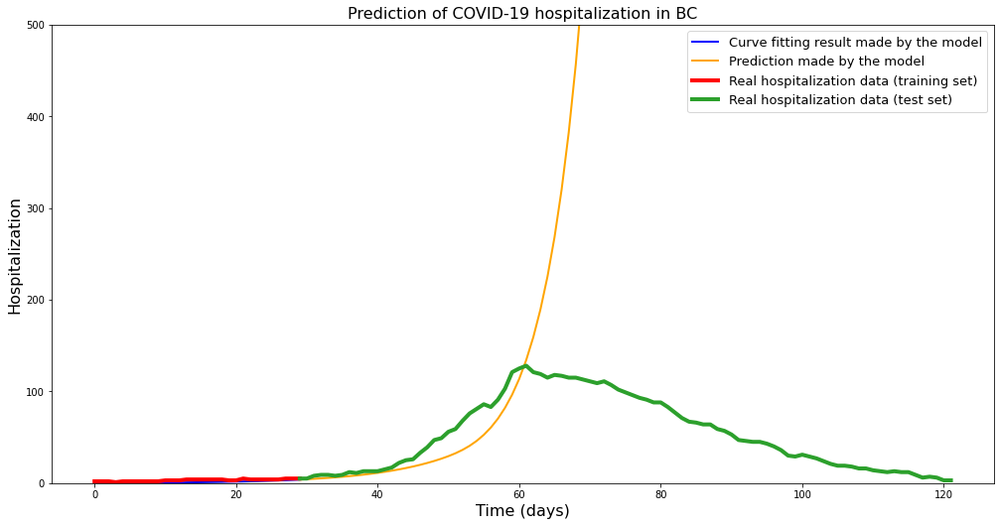

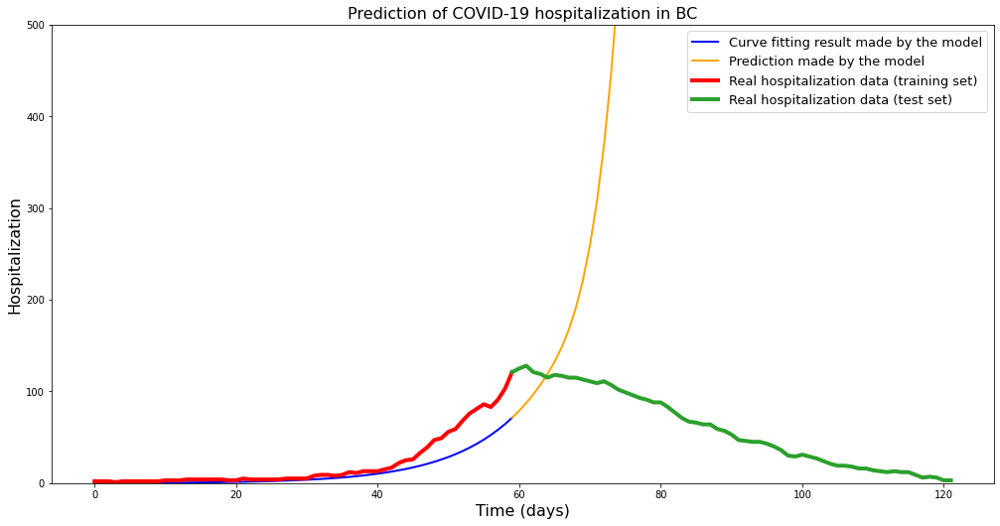

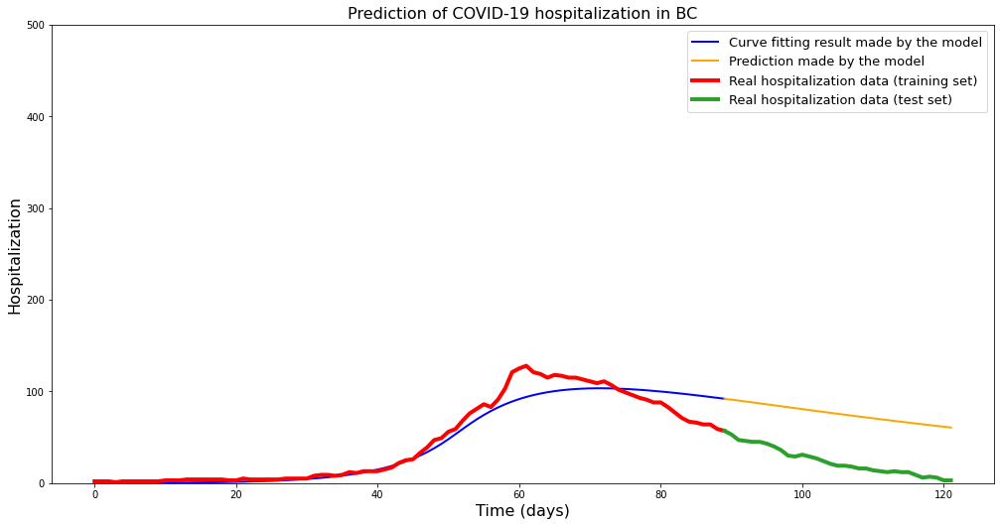

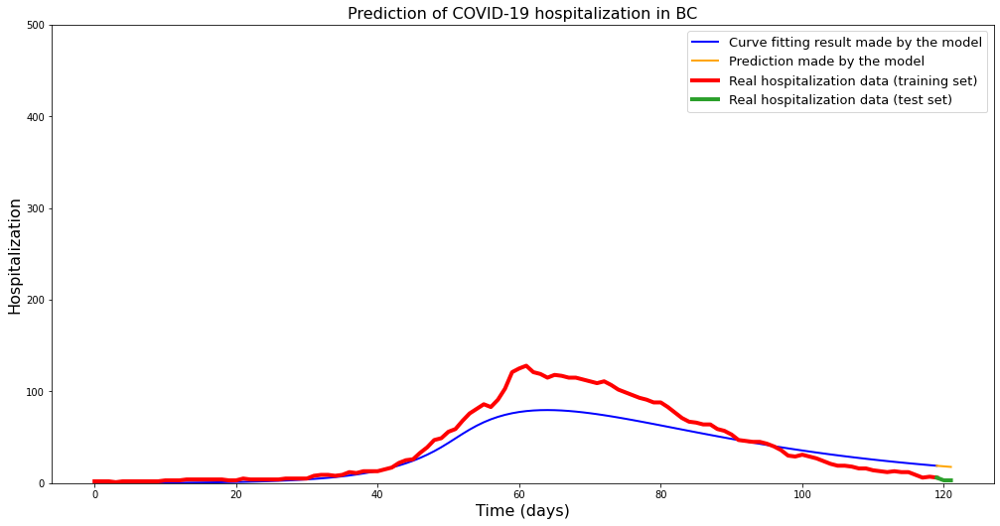

In [ ]:

#creating a dataframe with correct index and to put the results in
daily_hospitalization=provincial_data_CIHI['daily_Hospitalizations']
hospitalization_data_SIR_forecast=daily_hospitalization.to_frame()

#complete_interpolated_pandemic_data=complete_pandemic_data_daily_inter_1_2.copy()

#period_info=7

for i in range(1,math.ceil(len(hospitalization_data_SIR_forecast)/period_info)+1):
  # SECTION 1
  #========================================================================================================================
  #fitting the curve on the first 120 days of pandemic

  #Creating initial guesses and upper and lower bound for the parameters that model needs to estimate
  #first 50 days
  params_init_min_max = Parameters()
  params_init_min_max.add("R_0_start",   min = 1.5,    max = 10   )
  params_init_min_max.add("x0",          min = 50,      max = 120    )
  #params_init_min_max.add("k",            min = 0.1,   max = 5  )
  params_init_min_max.add("R_0_end",     min = 0.3,    max = 10     )
  #params_init_min_max.add("alpha",       min = 0.003,  max = 0.05   )
  params_init_min_max.add("rate_OTH",         min = 0.1,    max = 0.7    )
  params_init_min_max.add("rate_H",         min = 0.1,    max = 0.7    )
  #params_init_min_max.add("rho_H",         min = 0.01,    max = 0.7    )

  #Fixed parameters
  k_constant=1.0
  #rho=0.13
  sigma=1/5.1
  gamma_D=1/12.1689
  alpha_H = 0.14876
  prob_H = 0.188885

  # setting the initial values of each compartment
  start_point_1 = [population_Region,1,0,0,0,0,0,0,0,0]
  starting_data = start_point_1

  # setting up the date on which the curve fitting function will be perfomed
  Start_day_training = 0
  end_day_training = (i*period_info)
  start_day_estimation = end_day_training

  complete_interpolated_pandemic_data=dict_of_interpolated_data[('df_interpolated_epoch_%d'%i)]

  #This is the array of number of each compartment that needs to be fitted on the real data
  # 7  : Cumulative number of cases
  # 8  : Daily number of cases 
  # 9  : Daily admission to hospital
  # 10 : Daily number of discharge at hospitals
  # 5  : Daily Number of hospitalization
  Compartment_train = [8,9,10,5]

  #daily_death_H = provincial_data_CIHI["Deaths12"].values[::1]
  #daily_recovered_H = provincial_data_CIHI["Discharges11"].values[::1]
  #daily_admitted_H


  day_start=Start_day_training
  day_end=end_day_training


  # perfoming the curve fitting function
  #k = true k is being estimated
  #k = false k is constant
  # NOTE 1 : do NOT change the ordering sequence of you input the data inside model
  Result_curve_fitting_1=model_fitting_function_multi(training_data1_cumulative = complete_interpolated_pandemic_data['daily_cases_cumulative'],
                                                      training_data1 = complete_interpolated_pandemic_data['daily_cases'],
                                                      training_data2 = complete_interpolated_pandemic_data['daily_admitted_H'], 
                                                      training_data3 = complete_interpolated_pandemic_data['daily_discharge'],
                                                      training_data4 = complete_interpolated_pandemic_data['daily_hospitalization'],
                                                      outbreak_shift = 0,
                                                      compartment_array = Compartment_train,
                                                      initial_parameter= params_init_min_max,
                                                      day_start=Start_day_training,
                                                      day_end=end_day_training,
                                                      k_inclusion=False,
                                                      brute_step=4,
                                                      graphs='no')

  presentation_SIR_hospitalization()
  compart_scenarios=5
  day_start_scenarios = 0
  day_end_scenarios = len(hospitalization_data_SIR_forecast)
  parameter_scenarios = Result_curve_fitting_1[1]
  estimated_data_for_table = ((Model(day_start=day_start_scenarios,
                                  day_end = day_end_scenarios,
                                  total_population=total_population,
                                  R_0_start = parameter_scenarios.params['R_0_start'].value,
                                  x0 = parameter_scenarios.params['x0'].value,
                                  rate_OTH = parameter_scenarios.params['rate_OTH'].value,
                                  rate_H = parameter_scenarios.params['rate_H'].value,
                                  starting_data = start_point_1,
                                  k= k_constant,
                                  R_0_end = parameter_scenarios.params['R_0_end'].value))[compart_scenarios])[Start_day_training:day_end_scenarios]#:end_day_training]

  #putting the simulated data into the dataframe
  hospitalization_data_SIR_forecast['forecast with %d days'%end_day_training]=estimated_data_for_table


hospitalization_data_SIR_forecast.to_csv('forecast SIR with period info of %d.csv'%period_info)

In [ ]:
hospitalization_data_SIR_forecast.to_csv('forecast SIR with period info of %d.csv'%period_info)

In [ ]:
hospitalization_data_SIR_forecast

,daily_Hospitalizations,forecast with 8 days,forecast with 16 days,forecast with 24 days,forecast with 32 days,forecast with 40 days,forecast with 48 days,forecast with 56 days,forecast with 64 days,forecast with 72 days,forecast with 80 days,forecast with 88 days,forecast with 96 days,forecast with 104 days,forecast with 112 days,forecast with 120 days
2020-01-31,2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2020-02-01,2,0.011173,0.011173,0.010506,0.011082,0.011087,0.010487,0.009569,0.010848,0.009949,0.001644,0.001644,0.009686,0.009663,0.009657,0.009655
2020-02-02,2,0.039665,0.039665,0.036724,0.038542,0.038548,0.035434,0.030038,0.037059,0.031898,0.005926,0.005926,0.030487,0.030363,0.030328,0.030320
2020-02-03,1,0.081396,0.081396,0.073735,0.076529,0.076534,0.068840,0.055472,0.072559,0.059707,0.012177,0.012177,0.056368,0.056074,0.055987,0.055966
2020-02-04,2,0.135311,0.135311,0.119251,0.121735,0.121762,0.107778,0.083970,0.114180,0.091123,0.020035,0.020035,0.085340,0.084826,0.084667,0.084625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-05-27,6,928.646348,928.646348,672399.352152,18649.302412,340596.233956,4477.806007,22.558936,272576.807363,22.442406,15.196951,15.196951,22.994688,20.490449,18.885190,18.144976
2020-05-28,7,864.300469,864.300469,641006.168644,20382.616057,315629.503435,4323.037986,21.719041,315141.665549,21.523410,14.434966,14.434966,22.104317,19.639025,18.060890,17.333522
2020-05-29,6,804.237090,804.237090,609649.329814,22272.780062,292326.800308,4169.788172,20.908404,360974.489248,20.639571,13.708660,13.708660,21.246120,18.820693,17.270292,16.556081
2020-05-30,3,748.189034,748.189034,578569.536745,24333.163249,270605.040464,4018.511488,20.126174,409372.584741,19.789753,13.016583,13.016583,20.419127,18.034361,16.512211,15.811420


### Data presentation (Real data with forecast)

In [ ]:

def presentation_SIR_hospitalization():

  #RESULT PRESENTATIONS
  #============================================================================================================
  #INPUT SECTION
  #===============================================================================
  #input different scenarios for when the plato happens (in days:)
  #X0_range=[55]
  parameter_scenarios = Result_curve_fitting_1[1]
  X0_range=[parameter_scenarios.params['x0'].value]
  #input different scenarios for how much the R0 will after the plato:
  #R0end_range=[0.8,3.86391]
  R0end_range=[parameter_scenarios.params['R_0_end'].value]
  #Starting point from the last curve fitting process:
  start_point_scenarios = start_point_1

  # IMPORTANT: you need to change these parameters ot the those of the last fitting process:
  #==================================================
  parameter_scenarios = Result_curve_fitting_1[1]
  k_scenarios=k_constant
  sigma_scenarios=sigma
  #gamma_scenarios=gamma
  day_start_scenarios = 0
  day_end_scenarios = 122

  #==================================================
  #which compartment do you want to see:

  # 7  : Cumulative number of cases
  # 8  : Daily number of cases 
  # 9  : Daily admission to hospital
  # 10 : Daily number of discharge at hospitals
  # 5  : Daily Number of hospitalization

  compart_scenarios = 5
  #===============================================================================


  #PLOTTING FUNCTION
  #===============================================================================
  t_scenarios = np.linspace(day_start_scenarios, day_end_scenarios-1, (day_end_scenarios-day_start_scenarios))

  #selectin the real data related to the requested compartment 
  if compart_scenarios == 7:
    real_data_scenario = daily_cases_cumulative[day_start_scenarios:day_end_scenarios]
  elif compart_scenarios == 8:
    real_data_scenario = daily_cases[day_start_scenarios:day_end_scenarios]
  elif compart_scenarios == 9:
    real_data_scenario = daily_admitted_H[day_start_scenarios:day_end_scenarios]
  elif compart_scenarios == 10:
    real_data_scenario = daily_discharge[day_start_scenarios:day_end_scenarios]
  elif compart_scenarios == 5:
    real_data_scenario = daily_hospitalization[day_start_scenarios:day_end_scenarios]


  fig = plt.figure(figsize=(17,8.5))
  ax = fig.add_subplot(111)



  ax.plot (t_scenarios[Start_day_training:end_day_training],((Model(day_start=day_start_scenarios,
                                  day_end = day_end_scenarios,
                                  total_population=total_population,
                                  R_0_start = parameter_scenarios.params['R_0_start'].value,
                                  x0=X0_range[0],
                                  rate_OTH = parameter_scenarios.params['rate_OTH'].value,
                                  rate_H = parameter_scenarios.params['rate_H'].value,
                                  starting_data = start_point_scenarios,
                                  k= k_scenarios,
                                  R_0_end = R0end_range[0]))[compart_scenarios])[Start_day_training:end_day_training],'b',label='Curve fitting result made by the model',linewidth=2)
  ax.plot (t_scenarios[(end_day_training-1):day_end_scenarios],((Model(day_start=day_start_scenarios,
                                  day_end = day_end_scenarios,
                                  total_population=total_population,
                                  R_0_start = parameter_scenarios.params['R_0_start'].value,
                                  x0=X0_range[0],
                                  rate_OTH = parameter_scenarios.params['rate_OTH'].value,
                                  rate_H = parameter_scenarios.params['rate_H'].value,
                                  starting_data = start_point_scenarios,
                                  k= k_scenarios,
                                  R_0_end = R0end_range[0]))[compart_scenarios])[(end_day_training-1):day_end_scenarios],'orange',label='Prediction made by the model',linewidth=2)

      #ax.set_xlim(xmin=0)
      #ax.set_ylim(ymax=200)

  #Start_day_training = 0
  #end_day_training = 50

  #plotting the training set of data
  ax.plot(t_scenarios[Start_day_training:end_day_training], real_data_scenario[Start_day_training:end_day_training], 'r',label='Real hospitalization data (training set)',linewidth=4)
  #plotting the test set of data
  ax.plot(t_scenarios[(end_day_training-1):day_end_scenarios], real_data_scenario[(end_day_training-1):day_end_scenarios], 'C12',label='Real hospitalization data (test set)',linewidth=4)

  ax.set_ylim(ymin=0,ymax=500)
  plt.title('Prediction of COVID-19 hospitalization in BC',fontsize=16)
  plt.xlabel('Time (days)',fontsize=16)
  plt.ylabel('Hospitalization',fontsize=16)



  plt.legend(fontsize=13)

  plt.savefig('Prediction based on the first %d days'%end_day_training,dpi=300)

  return


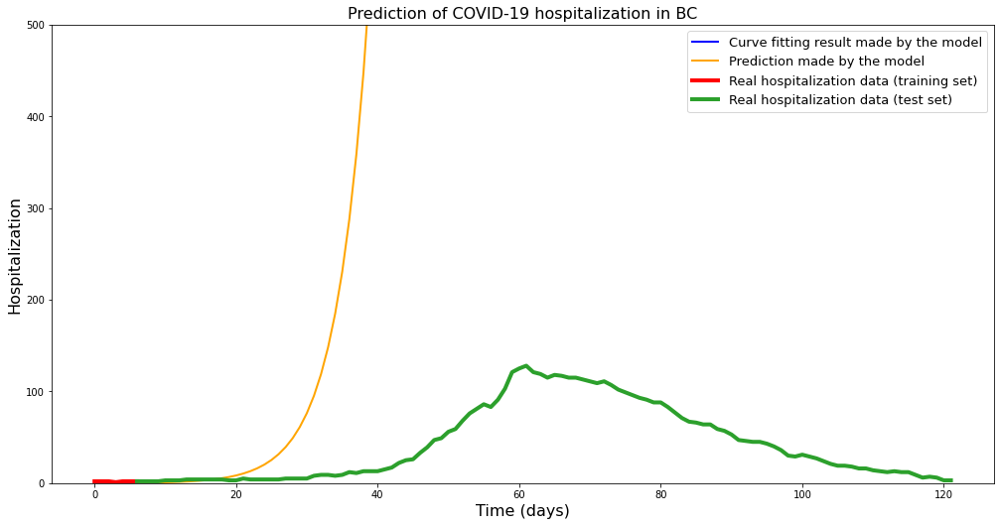

In [ ]:
#RESULT PRESENTATIONS
#============================================================================================================
#INPUT SECTION
#===============================================================================
#input different scenarios for when the plato happens (in days:)
#X0_range=[55]
parameter_scenarios = Result_curve_fitting_1[1]
X0_range=[parameter_scenarios.params['x0'].value]
#input different scenarios for how much the R0 will after the plato:
#R0end_range=[0.8,3.86391]
R0end_range=[parameter_scenarios.params['R_0_end'].value]
#Starting point from the last curve fitting process:
start_point_scenarios = start_point_1

# IMPORTANT: you need to change these parameters ot the those of the last fitting process:
#==================================================
parameter_scenarios = Result_curve_fitting_1[1]
k_scenarios=k_constant
sigma_scenarios=sigma
#gamma_scenarios=gamma
day_start_scenarios = 0
day_end_scenarios = 122

#==================================================
#which compartment do you want to see:

# 7  : Cumulative number of cases
# 8  : Daily number of cases 
# 9  : Daily admission to hospital
# 10 : Daily number of discharge at hospitals
# 5  : Daily Number of hospitalization

compart_scenarios = 5
#===============================================================================


#PLOTTING FUNCTION
#===============================================================================
t_scenarios = np.linspace(day_start_scenarios, day_end_scenarios-1, (day_end_scenarios-day_start_scenarios))

#selectin the real data related to the requested compartment 
if compart_scenarios == 7:
  real_data_scenario = daily_cases_cumulative[day_start_scenarios:day_end_scenarios]
elif compart_scenarios == 8:
  real_data_scenario = daily_cases[day_start_scenarios:day_end_scenarios]
elif compart_scenarios == 9:
  real_data_scenario = daily_admitted_H[day_start_scenarios:day_end_scenarios]
elif compart_scenarios == 10:
  real_data_scenario = daily_discharge[day_start_scenarios:day_end_scenarios]
elif compart_scenarios == 5:
  real_data_scenario = daily_hospitalization[day_start_scenarios:day_end_scenarios]


fig = plt.figure(figsize=(17,8.5))
ax = fig.add_subplot(111)



ax.plot (t_scenarios[Start_day_training:end_day_training],((Model(day_start=day_start_scenarios,
                                day_end = day_end_scenarios,
                                total_population=total_population,
                                R_0_start = parameter_scenarios.params['R_0_start'].value,
                                x0=X0_range[0],
                                rate_OTH = parameter_scenarios.params['rate_OTH'].value,
                                rate_H = parameter_scenarios.params['rate_H'].value,
                                starting_data = start_point_scenarios,
                                k= k_scenarios,
                                R_0_end = R0end_range[0]))[compart_scenarios])[Start_day_training:end_day_training],'b',label='Curve fitting result made by the model',linewidth=2)
ax.plot (t_scenarios[(end_day_training-1):day_end_scenarios],((Model(day_start=day_start_scenarios,
                                day_end = day_end_scenarios,
                                total_population=total_population,
                                R_0_start = parameter_scenarios.params['R_0_start'].value,
                                x0=X0_range[0],
                                rate_OTH = parameter_scenarios.params['rate_OTH'].value,
                                rate_H = parameter_scenarios.params['rate_H'].value,
                                starting_data = start_point_scenarios,
                                k= k_scenarios,
                                R_0_end = R0end_range[0]))[compart_scenarios])[(end_day_training-1):day_end_scenarios],'orange',label='Prediction made by the model',linewidth=2)

    #ax.set_xlim(xmin=0)
    #ax.set_ylim(ymax=200)

#Start_day_training = 0
#end_day_training = 50

#plotting the training set of data
ax.plot(t_scenarios[Start_day_training:end_day_training], real_data_scenario[Start_day_training:end_day_training], 'r',label='Real hospitalization data (training set)',linewidth=4)
#plotting the test set of data
ax.plot(t_scenarios[(end_day_training-1):day_end_scenarios], real_data_scenario[(end_day_training-1):day_end_scenarios], 'C12',label='Real hospitalization data (test set)',linewidth=4)

ax.set_ylim(ymin=0,ymax=500)
plt.title('Prediction of COVID-19 hospitalization in BC',fontsize=16)
plt.xlabel('Time (days)',fontsize=16)
plt.ylabel('Hospitalization',fontsize=16)



plt.legend(fontsize=13)

plt.savefig('Prediction based on the first %d days'%end_day_training,dpi=300)




### Data presentation (Real data without forecast)

No handles with labels found to put in legend.


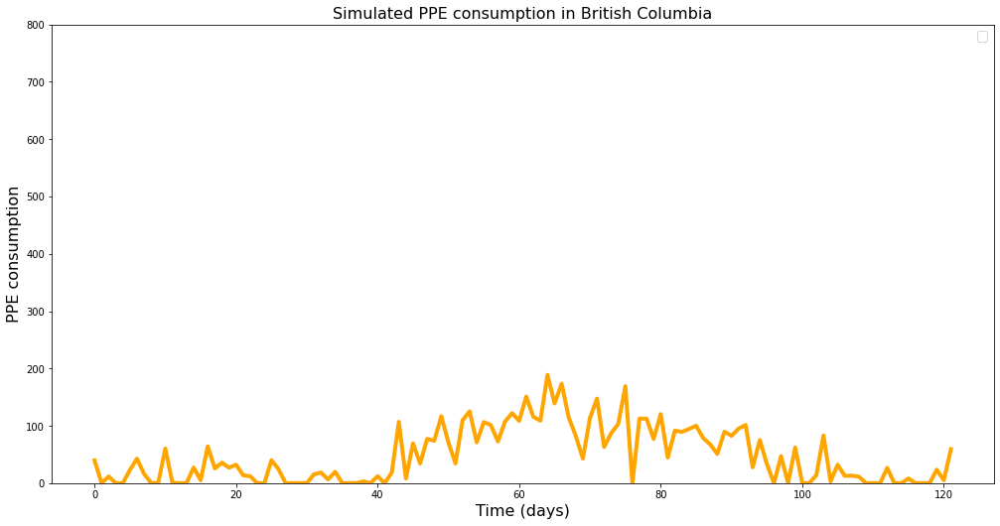

In [ ]:
# IMPORTANT NOTE: RUN WITH CAUTION
#RESULT PRESENTATIONS
#============================================================================================================
#INPUT SECTION
#===============================================================================
#input different scenarios for when the plato happens (in days:)
#X0_range=[55]
#parameter_scenarios = Result_curve_fitting_1[1]
#X0_range=[parameter_scenarios.params['x0'].value]
#input different scenarios for how much the R0 will after the plato:
#R0end_range=[0.8,3.86391]
#R0end_range=[parameter_scenarios.params['R_0_end'].value]
#Starting point from the last curve fitting process:
#start_point_scenarios = start_point_1

real_data_scenario=y.copy()
day_start_scenarios=0
day_end_scenarios=len(real_data_scenario)

#==================================================
#which compartment do you want to see:

# 7  : Cumulative number of cases
# 8  : Daily number of cases 
# 9  : Daily admission to hospital
# 10 : Daily number of discharge at hospitals
# 5  : Daily Number of hospitalization

compart_scenarios = 5
#===============================================================================


#PLOTTING FUNCTION
#===============================================================================
#t_scenarios = np.linspace(day_start_scenarios, day_end_scenarios-1, (day_end_scenarios-day_start_scenarios))
t_scenarios = np.linspace(day_start_scenarios, day_end_scenarios-1, (day_end_scenarios-day_start_scenarios))




fig = plt.figure(figsize=(17,8.5))
ax = fig.add_subplot(111)

    #ax.set_xlim(xmin=0)
    #ax.set_ylim(ymax=200)

#Start_day_training = 0
#end_day_training = 50

#plotting the training set of data
ax.plot(t_scenarios[day_start_scenarios:day_end_scenarios], real_data_scenario, 'orange',linewidth=4)

ax.set_ylim(ymin=0,ymax=800)
plt.title('Simulated PPE consumption in British Columbia',fontsize=16)
plt.xlabel('Time (days)',fontsize=16)
plt.ylabel('PPE consumption',fontsize=16)



plt.legend(fontsize=13)

plt.savefig('Simulated PPE consumption in British Columbia in BC',dpi=300)




### Data saving module

In [ ]:
# >>>>> IMPORTANT NOTE: this code should be run only ONCE <<<<<
#creating a dataframe with correct index and to put the results in
daily_hospitalization=provincial_data_CIHI['daily_Hospitalizations']
hospitalization_data_SIR_forecast=daily_hospitalization.to_frame()

In [ ]:
#in this section, we will use the parameters found by the model to produce data for 
#the desired compartment specified in the previous section
estimated_data = ((Model(day_start=day_start_scenarios,
                                day_end = day_end_scenarios,
                                total_population=total_population,
                                R_0_start = parameter_scenarios.params['R_0_start'].value,
                                x0=X0_range[0],
                                rate_OTH = parameter_scenarios.params['rate_OTH'].value,
                                rate_H = parameter_scenarios.params['rate_H'].value,
                                starting_data = start_point_scenarios,
                                k= k_scenarios,
                                R_0_end = R0end_range[0]))[compart_scenarios])[Start_day_training:day_end_scenarios]#:end_day_training]

#putting the simulated data into the dataframe
hospitalization_data_SIR_forecast['forecast with %d days'%end_day_training]=estimated_data
hospitalization_data_SIR_forecast.head()

,daily_Hospitalizations,forecast with 112 days
2020-01-31,2,0.000000
2020-02-01,2,0.009646
2020-02-02,2,0.030276
2020-02-03,1,0.055871
2020-02-04,2,0.084479


In [ ]:
#Exporting the data into the a csv file which will be saved into the drive
hospitalization_data_SIR_forecast.to_csv('drive/My Drive/HEC CLASSES/forecast SIR.csv')

# Periodic Review System

## Parameters, coefficients, initial state

In [ ]:
# Parameters, coefficients, initial state
#==============================================================================
# >>> USER INPUT <<<

# in this section we simulate the demand/consumption of medical supplies 

#protocol coef is the coefficient that will be multiplied by the hospitalization to get the consumption data.
#this coefficient is derived from government protocols and can be dynamics and changes through time
#For simplicity we have used a constant at this point 
try:
  protocol_coef=protocol_coef
except NameError:
  protocol_coef=4.5

#setting the LENGTH OF PERIOD for each epoch 
# this means that epochs R days apart, the unit is in (days)
try:
  R=R
except NameError:
  R=7

# setting the LEAD TIME for each order 
# NOTE: the order arrives at the end pf the day, therefore it will be used as a supply for the next day demand
# the unit is (days)
try:
  L=L
except NameError:
  L=5
  
# desired fill rate of inventory 
fill_rate=0.95 

# Cycle service level
try:
  service_level=service_level
except NameError:
  service_level=0.99

# Holding cost per unit
c_h=0.5 #dollars per unit

# Ordering cost per order
c_o= 1000 #500 #dollars per order

# Unit cost per unit
c_u= 10 #dollars per unit

# Shortage cost
c_s= 60 #20 #dollars per unit

#initial inventory on hand should be specified by the user
try:
  initial_inventory=initial_inventory
except NameError:
  initial_inventory=300 #100

#supplier has minimum and maximum order quantity
try:
  suppliers_capacity_min=suppliers_capacity_min
except NameError:
  suppliers_capacity_min=600 #200

try:
  suppliers_capacity_max=suppliers_capacity_max
except NameError:
  suppliers_capacity_max= 3000 #1000


#the inventory has a maximum capacity corresponding to space area, budget, political concern and ...

try:
  inventory_capactiy=inventory_capactiy
except NameError:
  inventory_capactiy=10000 #2000

# How many items are in a box:
item_in_box=20
# How many items are in a pallet:
box_in_pallet=40

item_in_pallet= item_in_box * box_in_pallet

#creating an inventory data frame, this will be used  for all scenarios, the index of this data frame is the epoch number
# the real cost is defined as total cost without shortage cost
inventory_data = pd.DataFrame(np.array([[0,initial_inventory,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]]),columns=['consumption in last epoch',
                                                                                              'current',
                                                                                              'order',
                                                                                              'shortage',
                                                                                              'std of previous epoch',
                                                                                              'std from beginning',
                                                                                              'holding cost',
                                                                                              'ordering cost',
                                                                                              'unit cost',
                                                                                              'shortage cost',
                                                                                              'total cost',
                                                                                              'real cost',
                                                                                              'MAE',
                                                                                              'MAPE',
                                                                                               'percentage bias of previous epoch',
                                                                                               'Actual order',
                                                                                               'Safety Stock',
                                                                                               'Z serivce level',
                                                                                               'standard Dev'])


inventory_data

,consumption in last epoch,current,order,shortage,std of previous epoch,std from beginning,holding cost,ordering cost,unit cost,shortage cost,total cost,real cost,MAE,MAPE,percentage bias of previous epoch,Actual order,Safety Stock,Z serivce level,standard Dev
0,0,300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## Data simulation

In [ ]:
#DATA SIMULATION
#==============================================================================
#For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.

provincial_data_CIHI['daily_consumption']=protocol_coef * provincial_data_CIHI['daily_Hospitalizations']
provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()

In [ ]:
provincial_data_CIHI

,Hospital Admissions2,Hospital ALOS16 (in days),Discharges11,Deaths12,hospital_influx,discharge,daily_Hospitalizations,daily_consumption,cumulative_daily_consumption
2020-01-31,0,0.00000000,0,0,0,0,2,8.00000000,8.00000000
2020-02-01,0,0.00000000,0,0,0,0,2,8.00000000,16.00000000
2020-02-02,0,0.00000000,0,0,0,0,2,8.00000000,24.00000000
2020-02-03,0,4.00000000,1,0,-1,1,1,4.00000000,28.00000000
2020-02-04,1,0.00000000,0,0,1,0,2,8.00000000,36.00000000
...,...,...,...,...,...,...,...,...,...
2020-05-27,3,127.33000000,5,1,-3,6,6,24.00000000,19676.00000000
2020-05-28,3,26.00000000,2,0,1,2,7,28.00000000,19704.00000000
2020-05-29,2,39.00000000,3,0,-1,3,6,24.00000000,19728.00000000
2020-05-30,2,69.00000000,4,1,-3,5,3,12.00000000,19740.00000000


In [ ]:
# >>>USER INPUT<<<
# in this section we assign the desired data to a variable 'y' which will be used throughout this section 
# ======================================================================================================
forecast_data_1 = provincial_data_CIHI.copy()

import warnings
import matplotlib.pyplot as plt

# Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
consumption_date_type='daily_consumption'

y = forecast_data_1[consumption_date_type]
y_cumulative = forecast_data_1['cumulative_daily_consumption']

### Monthly average of the real data

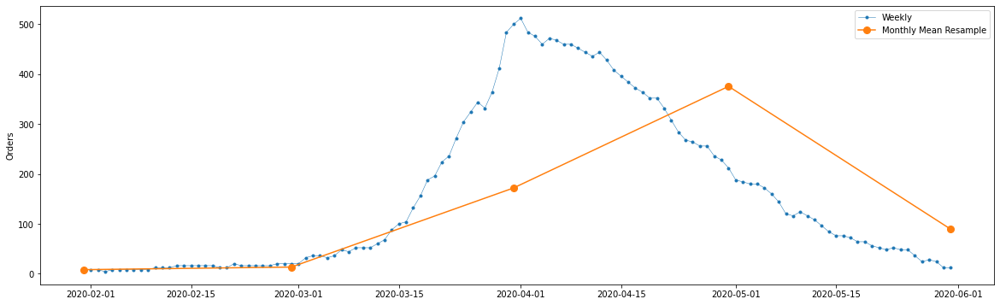

In [ ]:

fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(y,marker='.', linestyle='-', linewidth=0.5, label='Weekly')
ax.plot(y.resample('M').mean(),marker='o', markersize=8, linestyle='-', label='Monthly Mean Resample')
ax.set_ylabel('Orders')
ax.legend();

### Seasonal decomposition of data

In [ ]:
import statsmodels.api as sm

# graphs to show seasonal_decompose
def seasonal_decompose (y):
    decomposition = sm.tsa.seasonal_decompose(y, model='additive',extrapolate_trend='freq')
    fig = decomposition.plot()
    fig.set_size_inches(14,7)
    plt.show()

### Stationary test of data

In [ ]:

### plot for Rolling Statistic for testing Stationarity
def test_stationarity(timeseries, title):
    
    #Determing rolling statistics
    rolmean = pd.Series(timeseries).rolling(window=12).mean() 
    rolstd = pd.Series(timeseries).rolling(window=12).std()
    
    fig, ax = plt.subplots(figsize=(16, 4))
    ax.plot(timeseries, label= title)
    ax.plot(rolmean, label='rolling mean');
    ax.plot(rolstd, label='rolling std (x10)');
    ax.legend()

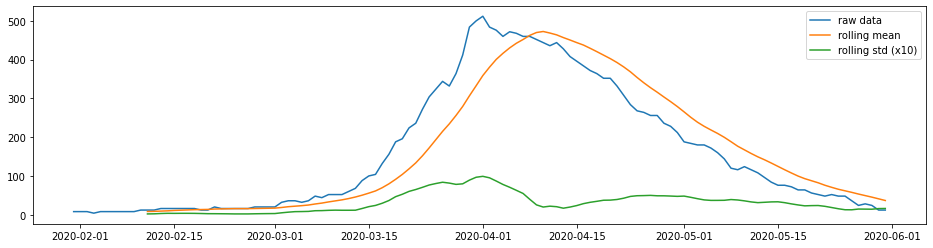

In [ ]:
# Rolling mean of the data
pd.options.display.float_format = '{:.8f}'.format
test_stationarity(y,'raw data')

## Forecasting:

### Simple Exponential smoothing method

In [ ]:
import numpy as np
from statsmodels.tsa.api import SimpleExpSmoothing 

def ses(y, y_to_train,y_to_test,smoothing_level,predict_date):
    y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    fit1 = SimpleExpSmoothing(y_to_train).fit(smoothing_level=smoothing_level,optimized=False)
    fcast1 = fit1.forecast(predict_date).rename(r'$\alpha={}$'.format(smoothing_level))
    # specific smoothing level
    fcast1.plot(marker='o', color='blue', legend=True)
    fit1.fittedvalues.plot(marker='o',  color='blue')
    mse1 = ((fcast1 - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of our forecasts with smoothing level of {} is {}'.format(smoothing_level,round(np.sqrt(mse1), 2)))
    
    ## auto optimization
    fit2 = SimpleExpSmoothing(y_to_train).fit()
    fcast2 = fit2.forecast(predict_date).rename(r'$\alpha=%s$'%fit2.model.params['smoothing_level'])
    # plot
    fcast2.plot(marker='o', color='green', legend=True)
    fit2.fittedvalues.plot(marker='o', color='green')
    
    mse2 = ((fcast2 - y_to_test) ** 2).mean()
    print('The Root Mean Squared Error of our forecasts with auto optimization is {}'.format(round(np.sqrt(mse2), 2)))
    
    plt.show()

### Holt method

In [ ]:
from statsmodels.tsa.api import Holt
import scipy.stats as st
import sys

def holt_2(y,y_to_train_holt,y_to_test_holt,epoch_number,previous_epoch): #,CC_deviation_holt=None):
    #y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    # This condition is in placed for the last epoch, if the last epoch is on the last day of the horizon 
    # then, there will be no more day to forecast after that, therefore, it should return and empty series
    # Since the holt function can not do this, we defined a conditional code, to solve this problem
    if holt_data=='normal':
      y_to_train_holt=y_to_train_holt
      y_to_test_holt=y_to_test_holt
    elif holt_data=='cumulative':
      y_to_train_holt=y_to_train_holt.cumsum()
      y_to_test_holt=y_to_test_holt.cumsum()
    else:
      print("Specify the type of data to be used by holt method: 'normal' or 'cumulative'")
      sys.exit()

    
    if (len(y)-epoch_number*R) > 0:
      number_of_predict_date=len(y_to_test_holt)
      fit1 = Holt(y_to_train_holt).fit()
      fcast1 = fit1.forecast(number_of_predict_date).rename("Holt's linear trend")   
      #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
      rmse1 = round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2)
      MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
      MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
      # Caluclating the percentage bias only for the interval within each epoch
      # becuase this is the interval the inventory function is based on 
      percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
    else:
      fcast1=y_to_val
      rmse1= round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2) 
      MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
      MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
      percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
    
    # once the forecast is made, id the data is cumulative, we need to adjust it back to the normal way
    if holt_data=='cumulative':
      temp_sr_rev = (y_to_train_holt.append(fcast1))[i:]
      fcast1 = pd.Series(np.diff(temp_sr_rev))


    #if CC_deviation_holt is None:
    #  CC_dev_holt = 0
    #else:
    #  CC_dev_holt = CC_deviation_holt/100
    CC_dev_holt=0
    
    # removing the negative data 
    fcast1 [fcast1 <0]=0  

    return fcast1*(1+CC_dev_holt),rmse1,MAPE,percentage_bias_holt,MAE

In [ ]:
from statsmodels.tsa.api import Holt
import scipy.stats as st

def holt(y,y_to_train_holt,y_to_test_holt,epoch_number,previous_epoch): #,CC_deviation_holt=None):
    #y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    # This condition is in placed for the last epoch, if the last epoch is on the last day of the horizon 
    # then, there will be no more day to forecast after that, therefore, it should return and empty series
    # Since the holt function can not do this, we defined a conditional code, to solve this problem
    if (len(y)-epoch_number*R) > 0:
      number_of_predict_date=len(y_to_test_holt)
      fit1 = Holt(y_to_train_holt).fit()
      fcast1 = fit1.forecast(number_of_predict_date).rename("Holt's linear trend")   
      #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
      rmse1 = round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2)
      MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
      MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
      # Caluclating the percentage bias only for the interval within each epoch
      # becuase this is the interval the inventory function is based on 
      percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
    else:
      fcast1=y_to_val
      rmse1= round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2) 
      MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
      MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
      percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
    
    if hospitalization_data_type=='cumulative_daily_consumption':
      dumy_set_1=fcast1-previous_epoch[-1]
      dumy_set_2=fcast1-previous_epoch[-1]
    
      for j in range(len(dumy_set_1)-1):
        dumy_set_1=fcast1-previous_epoch[-1]
        dumy_set_2[j+1]=dumy_set_1[j+1]-dumy_set_1[j]

      fcast1=dumy_set_2

    #if CC_deviation_holt is None:
    #  CC_dev_holt = 0
    #else:
    #  CC_dev_holt = CC_deviation_holt/100
    CC_dev_holt=0
    
    # removing the negative data 
    fcast1 [fcast1 <0]=0  

    return fcast1*(1+CC_dev_holt),rmse1,MAPE,percentage_bias_holt,MAE

In [ ]:
def holt_lagged(y_set_holt,y_to_test_holt,epoch_number,previous_epoch,lagged_epoch): #,CC_deviation_holt=None):
    #y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    # This condition is in placed for the last epoch, if the last epoch is on the last day of the horizon 
    # then, there will be no more day to forecast after that, therefore, it should return and empty series
    # Since the holt function can not do this, we defined a conditional code, to solve this problem

    if lagged_epoch >= epoch_number:
      # if the lag number is bigger or equal to the number of current epoch, then the forecast is zero since there is
      # no data to work with 
      holt_temp_df=y_to_test_holt.to_frame()
      holt_temp_df['holt_forecast']=0
      fcast1=holt_temp_df['holt_forecast']
      rmse1 = round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2)
      MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
      MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
      percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
    else:
      # applying the lagged epoch number to the training set
      y_to_train_holt = y_set_holt[0:(epoch_number-lagged_epoch)*R]

      if (len(y_set_holt)-epoch_number*R) > 0:
        number_of_predict_date=len(y_to_test_holt)+lagged_epoch*R
        fit1 = Holt(y_to_train_holt).fit()
        fcast1 = fit1.forecast(number_of_predict_date).rename("Holt's linear trend")   
        # getting the days that are actually required for forecasting based on the array of "y_to_test_holt"
        fcast1=fcast1[-(len(y_to_test_holt)):]
        #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
        rmse1 = round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2)
        MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
        MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
        # Caluclating the percentage bias only for the interval within each epoch
        # becuase this is the interval the inventory function is based on 
        percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
      else:
        fcast1=y_to_val
        rmse1= round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2) 
        MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
        MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
        percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
      

    #if CC_deviation_holt is None:
    #  CC_dev_holt = 0
    #else:
    #  CC_dev_holt = CC_deviation_holt/100
    CC_dev_holt=0
    
    # removing the negative data 
    fcast1 [fcast1 <0]=0  

    return fcast1*(1+CC_dev_holt),rmse1,MAPE,percentage_bias_holt,MAE

In [ ]:
def holt_lagged_daily(y_set_holt,y_to_test_holt,epoch_number,previous_epoch,lagged_daily): #,CC_deviation_holt=None):
    #y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    # This condition is in placed for the last epoch, if the last epoch is on the last day of the horizon 
    # then, there will be no more day to forecast after that, therefore, it should return and empty series
    # Since the holt function can not do this, we defined a conditional code, to solve this problem

    if lagged_daily >= epoch_number*R:
      # if the lag number is bigger or equal to the number of current epoch, then the forecast is zero since there is
      # no data to work with 
      holt_temp_df=y_to_test_holt.to_frame()
      holt_temp_df['holt_forecast']=0
      fcast1=holt_temp_df['holt_forecast']
      rmse1 = round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2)
      MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
      MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
      percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
    else:
      # applying the lagged epoch number to the training set
      y_to_train_holt = y_set_holt[0:(epoch_number*R)-lagged_daily]

      if (len(y_set_holt)-epoch_number*R) > 0:
        if len(y_to_train_holt)<2:
          fcast1=y_to_test_holt.to_frame()
          fcast1['holt_forecast']=max(y_to_train_holt)
          fcast1=fcast1['holt_forecast']
          rmse1 = round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2)
          MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
          MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
          # Caluclating the percentage bias only for the interval within each epoch
          # becuase this is the interval the inventory function is based on 
          percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
        else:
          number_of_predict_date=len(y_to_test_holt)+lagged_daily
          fit1 = Holt(y_to_train_holt).fit()
          fcast1 = fit1.forecast(number_of_predict_date).rename("Holt's linear trend")   
          # getting the days that are actually required for forecasting based on the array of "y_to_test_holt"
          fcast1=fcast1[-(len(y_to_test_holt)):]
          #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
          rmse1 = round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2)
          MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
          MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
          # Caluclating the percentage bias only for the interval within each epoch
          # becuase this is the interval the inventory function is based on 
          percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
      else:
        fcast1=y_to_val
        rmse1= round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2) 
        MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
        MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
        percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
      

    #if CC_deviation_holt is None:
    #  CC_dev_holt = 0
    #else:
    #  CC_dev_holt = CC_deviation_holt/100
    CC_dev_holt=0
    
    # removing the negative data 
    fcast1 [fcast1 <0]=0  

    return fcast1*(1+CC_dev_holt),rmse1,MAPE,percentage_bias_holt,MAE

In [ ]:
from statsmodels.tsa.api import Holt
import scipy.stats as st
import sys

def holt_3(y_set_holt,y_to_train_holt,y_to_test_holt,period_info_holt): #,CC_deviation_holt=None):
    #y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    # This condition is in placed for the last epoch, if the last epoch is on the last day of the horizon 
    # then, there will be no more day to forecast after that, therefore, it should return and empty series
    # Since the holt function can not do this, we defined a conditional code, to solve this problem
    if holt_data=='normal':
      y_to_train_holt=y_to_train_holt
      y_to_test_holt=y_to_test_holt
    elif holt_data=='cumulative':
      y_to_train_holt=y_to_train_holt.cumsum()
      y_to_test_holt=y_to_test_holt.cumsum()
    else:
      print("Specify the type of data to be used by holt method: 'normal' or 'cumulative'")
      sys.exit()

    if period_info_holt==0:
      fcast1=y_to_test_holt.copy()
      fcast1.iloc[:]=0

      rmse1= round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2) 
      MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
      MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
      percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
    else:
    # total number of periods (based on the specified period_info) that the forecast should be made
      number_of_predict_date=math.ceil((len(y_set_holt)-period_info_holt*period_info)/period_info)
      if number_of_predict_date > 0:
        fit1 = Holt(y_to_train_holt).fit()
        fcast = fit1.forecast(number_of_predict_date).rename("Holt's linear trend") 
        
        # Putting the train data and forecast data (which is based on the period_info) into a one series
        complete_fcast1=(pd.concat([y_to_train_holt, fcast])).copy()
        # creating a copy of the y_set_holt to place the forecast data into
        temp_holt=y_set_holt.copy()

        #Looping through the copy of Y_set_data which is the daily data and place the average forecast data into it
        for period_in_period_info in range(1,len(complete_fcast1)):
          temp_holt[(period_in_period_info-1)*period_info:period_in_period_info*period_info]=complete_fcast1[period_in_period_info]/period_info

        # filtering the forecast data based on the index of the y_to_test_holt to get the correct number of days 
        fcast1=(pd.concat([y_to_test_holt,temp_holt], axis=1, join="inner")).iloc[:,1]

        rmse1 = round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2)
        MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
        MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
        # Caluclating the percentage bias only for the interval within each epoch
        # becuase this is the interval the inventory function is based on 
        percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)

      else:
        fcast1=y_to_test_holt
        rmse1= round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2) 
        MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
        MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
        percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
    
    # removing the negative data 
    fcast1 [fcast1 <0]=0  

    return fcast1,rmse1,MAPE,percentage_bias_holt,MAE

In [ ]:
from statsmodels.tsa.api import Holt
import scipy.stats as st
import sys

def holt_4(y_set_holt,y_to_train_holt,y_to_test_holt): #,CC_deviation_holt=None):
    #y.plot(marker='o', color='black', legend=True, figsize=(14, 7))
    
    # This condition is in placed for the last epoch, if the last epoch is on the last day of the horizon 
    # then, there will be no more day to forecast after that, therefore, it should return and empty series
    # Since the holt function can not do this, we defined a conditional code, to solve this problem
    if holt_data=='normal':
      y_to_train_holt=y_to_train_holt
      y_to_test_holt=y_to_test_holt
    elif holt_data=='cumulative':
      y_to_train_holt=y_to_train_holt.cumsum()
      y_to_test_holt=y_to_test_holt.cumsum()
    else:
      print("Specify the type of data to be used by holt method: 'normal' or 'cumulative'")
      sys.exit()

    # if there is no information for the forecast to be trained, then the forecast is zero
    if len(y_to_train_holt)==0:
      fcast1=y_to_test_holt.copy()
      fcast1.iloc[:]=0

      rmse1= round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2) 
      MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
      MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
      percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
    
    # if there is only one day of information for the forecast to be trained, then the forecast is a constant value of that day
    elif len(y_to_train_holt)==1:

      fcast1=y_to_test_holt.copy()
      fcast1.iloc[:]=y_to_train_holt[0]

      rmse1= round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2) 
      MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
      MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
      percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)

    else:
    # total number of periods (based on the specified period_info) that the forecast should be made
      number_of_predict_date=len(y_set_holt)-len(y_to_train_holt)
      if number_of_predict_date > 0:
        fit1 = Holt(y_to_train_holt).fit()
        fcast = fit1.forecast(number_of_predict_date).rename("Holt's linear trend") 
        
        # Putting the train data and forecast data (which is based on the period_info) into a one series
        complete_fcast1=(pd.concat([y_to_train_holt, fcast], ignore_index=True)).copy()
        complete_fcast1.index=y_set.index
        # creating a copy of the y_set_holt to place the forecast data into
        #temp_holt=y_set_holt.copy()

        #Looping through the copy of Y_set_data which is the daily data and place the average forecast data into it
        #for period_in_period_info in range(1,len(complete_fcast1)):
        #  temp_holt[(period_in_period_info-1)*period_info:period_in_period_info*period_info]=complete_fcast1[period_in_period_info]/period_info

        # filtering the forecast data based on the index of the y_to_test_holt to get the correct number of days 
        fcast1=(pd.concat([y_to_test_holt,complete_fcast1], axis=1, join="inner")).iloc[:,1]

        rmse1 = round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2)
        MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
        MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
        # Caluclating the percentage bias only for the interval within each epoch
        # becuase this is the interval the inventory function is based on 
        percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)

      else:
        fcast1=y_to_test_holt
        rmse1= round(np.sqrt(((fcast1 - y_to_test_holt) ** 2).mean()), 2) 
        MAPE =  round(np.abs(((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100, 2)
        MAE =  round(np.abs((fcast1 - y_to_test_holt).mean()), 2)
        percentage_bias_holt=round((((fcast1 - y_to_test_holt)/y_to_test_holt).mean())*100,2)
    
    # removing the negative data 
    fcast1 [fcast1 <0]=0  

    return fcast1,rmse1,MAPE,percentage_bias_holt,MAE

### Myopic forecast

In [ ]:
def myopic_forecast_method(y_to_test): #,CC_deviation_naive=None):
  #taking the maximum of last 2 epoch


  #Turning the column of naive forecast in the dumy dataframe into a series
  fcast1=y_to_test

  #if CC_deviation_naive is None:
  #  CC_dev_naive = 0
  #else:
  #  CC_dev_naive = CC_deviation_naive/100
  CC_dev_myopic=0
  
  #computing the RSME of the forecast
  #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
  rmse_myopic_1 = 0
  MAPE_myopic =  0
  MAE_myopic =  0

  # Caluclating the percentage bias only for the interval within each epoch
  # becuase this is the interval the inventory function is based on 
  percentage_bias_myopic=0

  # removing the negative data 
  fcast1 [fcast1 <0]=0  

  return fcast1*(1+CC_dev_myopic),rmse_myopic_1,MAPE_myopic,percentage_bias_myopic,MAE_myopic

### Naive method

In [ ]:
def naive_forecast_method(y_to_train,y_to_test): #,CC_deviation_naive=None):
  #taking the maximum of last 2 epoch
  max_in_train=max(y_to_train)

  #creating a dataframe to include the naive forecast, primary reason for this command is to assign the appropriate index to the naive forecast
  naive_temp_df=y_to_test.to_frame()
  naive_temp_df['naive_forecast']=max_in_train

  #Turning the column of naive forecast in the dumy dataframe into a series
  naive_temp_sr=naive_temp_df['naive_forecast']

  #if CC_deviation_naive is None:
  #  CC_dev_naive = 0
  #else:
  #  CC_dev_naive = CC_deviation_naive/100
  CC_dev_naive=0
  
  #computing the RSME of the forecast
  #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
  rmse_naive_1 = round(np.sqrt(((naive_temp_sr - y_to_test) ** 2).mean()), 2)
  MAPE_naive =  round(np.abs(((naive_temp_sr - y_to_test)/y_to_test).mean())*100, 2)
  MAE_naive =  round(np.abs((naive_temp_sr - y_to_test).mean()), 2)

  # Caluclating the percentage bias only for the interval within each epoch
  # becuase this is the interval the inventory function is based on 
  percentage_bias_naive=round((((naive_temp_sr - y_to_test)/y_to_test).mean())*100,2)

  # removing the negative data 
  naive_temp_sr [naive_temp_sr <0]=0  

  return naive_temp_sr*(1+CC_dev_naive),rmse_naive_1,MAPE_naive,percentage_bias_naive,MAE_naive

In [ ]:
def naive_forecast_method_lagged(y_set_naive,y_to_test,epoch_number_naive,lagged_epoch): #,CC_deviation_naive=None):
  #taking the maximum of last 2 epoch
  
  if lagged_epoch >= epoch_number_naive:
  #creating a dataframe to include the naive forecast, primary reason for this command is to assign the appropriate index to the naive forecast
    naive_temp_df=y_to_test.to_frame()
    naive_temp_df['naive_forecast']=0
  else:
    y_to_train = y_set_naive[max(0,(epoch_number_naive-lagged_epoch)-2)*R:(epoch_number_naive-lagged_epoch)*R]

    max_in_train=max(y_to_train)

  #creating a dataframe to include the naive forecast, primary reason for this command is to assign the appropriate index to the naive forecast
    naive_temp_df=y_to_test.to_frame()
    naive_temp_df['naive_forecast']=max_in_train

  #Turning the column of naive forecast in the dumy dataframe into a series
  naive_temp_sr=naive_temp_df['naive_forecast']

  #if CC_deviation_naive is None:
  #  CC_dev_naive = 0
  #else:
  #  CC_dev_naive = CC_deviation_naive/100
  CC_dev_naive=0

  #computing the RSME of the forecast
  #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
  rmse_naive_1 = round(np.sqrt(((naive_temp_sr - y_to_test) ** 2).mean()), 2)
  MAPE_naive =  round(np.abs(((naive_temp_sr - y_to_test)/y_to_test).mean())*100, 2)
  MAE_naive =  round(np.abs((naive_temp_sr - y_to_test).mean()), 2)

  # Caluclating the percentage bias only for the interval within each epoch
  # becuase this is the interval the inventory function is based on 
  percentage_bias_naive=round((((naive_temp_sr - y_to_test)/y_to_test).mean())*100,2)

  # removing the negative data 
  naive_temp_sr [naive_temp_sr <0]=0  

  return naive_temp_sr*(1+CC_dev_naive),rmse_naive_1,MAPE_naive,percentage_bias_naive,MAE_naive

In [ ]:
def naive_forecast_method_lagged_daily(y_set_naive,y_to_test,epoch_number_naive,lagged_daily): #,CC_deviation_naive=None):
  #taking the maximum of last 2 epoch
  
  if lagged_daily >= epoch_number_naive*R:
  #creating a dataframe to include the naive forecast, primary reason for this command is to assign the appropriate index to the naive forecast
    naive_temp_df=y_to_test.to_frame()
    naive_temp_df['naive_forecast']=0
  else:
    y_to_train = y_set_naive[max(0,(epoch_number_naive-2)*R-lagged_daily):(epoch_number_naive*R-lagged_daily)]

    max_in_train=max(y_to_train)

  #creating a dataframe to include the naive forecast, primary reason for this command is to assign the appropriate index to the naive forecast
    naive_temp_df=y_to_test.to_frame()
    naive_temp_df['naive_forecast']=max_in_train

  #Turning the column of naive forecast in the dumy dataframe into a series
  naive_temp_sr=naive_temp_df['naive_forecast']

  #if CC_deviation_naive is None:
  #  CC_dev_naive = 0
  #else:
  #  CC_dev_naive = CC_deviation_naive/100
  CC_dev_naive=0

  #computing the RSME of the forecast
  #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
  rmse_naive_1 = round(np.sqrt(((naive_temp_sr - y_to_test) ** 2).mean()), 2)
  MAPE_naive =  round(np.abs(((naive_temp_sr - y_to_test)/y_to_test).mean())*100, 2)
  MAE_naive =  round(np.abs((naive_temp_sr - y_to_test).mean()), 2)

  # Caluclating the percentage bias only for the interval within each epoch
  # becuase this is the interval the inventory function is based on 
  percentage_bias_naive=round((((naive_temp_sr - y_to_test)/y_to_test).mean())*100,2)

  # removing the negative data 
  naive_temp_sr [naive_temp_sr <0]=0  

  return naive_temp_sr*(1+CC_dev_naive),rmse_naive_1,MAPE_naive,percentage_bias_naive,MAE_naive

In [ ]:
def naive_forecast_method_replenished(y_to_train,y_to_test): #,CC_deviation_naive=None):
  #taking the maximum of last 2 epoch
  max_in_train=(max(y_to_train))/period_info

  #creating a dataframe to include the naive forecast, primary reason for this command is to assign the appropriate index to the naive forecast
  naive_temp_df=y_to_test.to_frame()
  naive_temp_df['naive_forecast']=max_in_train

  #Turning the column of naive forecast in the dumy dataframe into a series
  naive_temp_sr=naive_temp_df['naive_forecast']

  #if CC_deviation_naive is None:
  #  CC_dev_naive = 0
  #else:
  #  CC_dev_naive = CC_deviation_naive/100
  CC_dev_naive=0
  
  #computing the RSME of the forecast
  #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
  rmse_naive_1 = round(np.sqrt(((naive_temp_sr - y_to_test) ** 2).mean()), 2)
  MAPE_naive =  round(np.abs(((naive_temp_sr - y_to_test)/y_to_test).mean())*100, 2)
  MAE_naive =  round(np.abs((naive_temp_sr - y_to_test).mean()), 2)

  # Caluclating the percentage bias only for the interval within each epoch
  # becuase this is the interval the inventory function is based on 
  percentage_bias_naive=round((((naive_temp_sr - y_to_test)/y_to_test).mean())*100,2)

  # removing the negative data 
  naive_temp_sr [naive_temp_sr <0]=0  

  return naive_temp_sr*(1+CC_dev_naive),rmse_naive_1,MAPE_naive,percentage_bias_naive,MAE_naive

In [ ]:
def naive_forecast_method_replenished_variable(y_to_train,y_to_test): #,CC_deviation_naive=None):
  #taking the maximum of last 2 epoch
  if len(y_to_train)==0:
    #creating a dataframe to include the naive forecast, primary reason for this command is to assign the appropriate index to the naive forecast
    naive_temp_df=y_to_test.to_frame()
    naive_temp_df['naive_forecast']=0

    #Turning the column of naive forecast in the dumy dataframe into a series
    naive_temp_sr=naive_temp_df['naive_forecast']
  else:
    max_in_train=max(y_to_train)

    #creating a dataframe to include the naive forecast, primary reason for this command is to assign the appropriate index to the naive forecast
    naive_temp_df=y_to_test.to_frame()
    naive_temp_df['naive_forecast']=max_in_train

    #Turning the column of naive forecast in the dumy dataframe into a series
    naive_temp_sr=naive_temp_df['naive_forecast']

  #if CC_deviation_naive is None:
  #  CC_dev_naive = 0
  #else:
  #  CC_dev_naive = CC_deviation_naive/100
  CC_dev_naive=0
  
  #computing the RSME of the forecast
  #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
  rmse_naive_1 = round(np.sqrt(((naive_temp_sr - y_to_test) ** 2).mean()), 2)
  MAPE_naive =  round(np.abs(((naive_temp_sr - y_to_test)/y_to_test).mean())*100, 2)
  MAE_naive =  round(np.abs((naive_temp_sr - y_to_test).mean()), 2)

  # Caluclating the percentage bias only for the interval within each epoch
  # becuase this is the interval the inventory function is based on 
  percentage_bias_naive=round((((naive_temp_sr - y_to_test)/y_to_test).mean())*100,2)

  # removing the negative data 
  naive_temp_sr [naive_temp_sr <0]=0  

  return naive_temp_sr*(1+CC_dev_naive),rmse_naive_1,MAPE_naive,percentage_bias_naive,MAE_naive


### SIR forecasting method

In [ ]:
# Forecasting Hospitalization with SIR model
# IMPORTANT NOTE: USER INPUT
# ==============================================================================================

#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
SIR_forecast_df=pd.read_csv('forecast SIR without cumulative-complete 18 epochs.csv')


#setting the date as the index of the dataframe
SIR_forecast_df=SIR_forecast_df.set_index(y.index).drop(columns='Date')
#rounding up the value of forecast in the data frame 
#SIR_forecast_df=np.ceil(SIR_forecast_df) 

In [ ]:
#this function select the desired interval from the data frame which includes all the forecast for the SIR model
#later if the user wants to include the dynamic coefficient of consumption, coeff can be be changed
def SIR_forecast_model(epoch_number,y_to_test,CC_deviation_SIR=None,epoch_number_2=None):
  if CC_deviation_SIR is None:
    CC = protocol_coef
  else:
    CC = protocol_coef*(1+CC_deviation_SIR/100)
  
  if epoch_number_2 is None:
    epoch_number_2 = epoch_number

# this condition is for the first period for those period_info that do not have info 
  if epoch_number==0:

    forecast_sir_sr=SIR_forecast_df.iloc[:,epoch_number]
    forecast_sir_sr.iloc[:]=0
    forecast_sir_sr=(forecast_sir_sr[(epoch_number_2)*R:(epoch_number_2)*R+(R+L)])* CC

  elif epoch_number>0:

    forecast_sir_sr=SIR_forecast_df.iloc[:,epoch_number]
    forecast_sir_sr=(forecast_sir_sr[(epoch_number_2)*R:(epoch_number_2)*R+(R+L)])* CC



  
  #computing the RSME of the forecast
  #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
  rmse_sir_1 = round(np.sqrt(((forecast_sir_sr - y_to_test) ** 2).mean()), 2)
  MAPE_SIR =  round(np.abs(((forecast_sir_sr - y_to_test)/y_to_test).mean())*100, 2)
  MAE_SIR =  round(np.abs((forecast_sir_sr - y_to_test).mean()), 2)

  # Caluclating the percentage bias only for the interval within each epoch
  # becuase this is the interval the inventory function is based on 
  percentage_bias_SIR=round((((forecast_sir_sr - y_to_test)/y_to_test).mean())*100,2)

  # removing the negative data 
  forecast_sir_sr [forecast_sir_sr <0]=0  
  
  return forecast_sir_sr,rmse_sir_1,MAPE_SIR,percentage_bias_SIR,MAE_SIR


In [ ]:
#this function select the desired interval from the data frame which includes all the forecast for the SIR model
#later if the user wants to include the dynamic coefficient of consumption, coeff can be be changed
def SIR_forecast_model_devited(epoch_number,y_to_test,CC_deviation_SIR):
  
  CC = protocol_coef*(CC_deviation_SIR/100)
  epoch_number_2=epoch_number
# this condition is for the first period for those period_info that do not have info 
  if epoch_number==0:

    forecast_sir_sr=SIR_forecast_df.iloc[:,epoch_number]
    forecast_sir_sr.iloc[:]=0
    forecast_sir_sr=(forecast_sir_sr[(epoch_number_2)*R:(epoch_number_2)*R+(R+L)])* CC

  elif epoch_number>0:

    forecast_sir_sr=SIR_forecast_df.iloc[:,epoch_number]
    forecast_sir_sr=(forecast_sir_sr[(epoch_number_2)*R:(epoch_number_2)*R+(R+L)])* CC



  
  #computing the RSME of the forecast
  #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
  rmse_sir_1 = round(np.sqrt(((forecast_sir_sr - y_to_test) ** 2).mean()), 2)
  MAPE_SIR =  round(np.abs(((forecast_sir_sr - y_to_test)/y_to_test).mean())*100, 2)
  MAE_SIR =  round(np.abs((forecast_sir_sr - y_to_test).mean()), 2)

  # Caluclating the percentage bias only for the interval within each epoch
  # becuase this is the interval the inventory function is based on 
  percentage_bias_SIR=round((((forecast_sir_sr - y_to_test)/y_to_test).mean())*100,2)

  # removing the negative data 
  forecast_sir_sr [forecast_sir_sr <0]=0  
  
  return forecast_sir_sr,rmse_sir_1,MAPE_SIR,percentage_bias_SIR,MAE_SIR


In [ ]:


#this function select the desired interval from the data frame which includes all the forecast for the SIR model
#later if the user wants to include the dynamic coefficient of consumption, coeff can be be changed
def SIR_forecast_model_lagged(epoch_number,y_to_test,lagged_epoch,CC_deviation_SIR=None):
  if CC_deviation_SIR is None:
    CC = protocol_coef
  else:
    CC = protocol_coef*(1+CC_deviation_SIR/100)
  #CC=protocol_coef*(1+CC_deviation/100)
  
  if lag >= epoch_number : 
  #creating a dataframe to include the sir forecast, primary reason for this command is to assign the appropriate index to the naive forecast
    SIR_temp_df=y_to_test.to_frame()
    SIR_temp_df['SIR_forecast']=0
    forecast_sir_sr= SIR_temp_df['SIR_forecast']
  else:
    forecast_sir_sr=SIR_forecast_df.iloc[:,epoch_number-lagged_epoch]
    forecast_sir_sr=(forecast_sir_sr[(epoch_number)*R:(epoch_number)*R+(R+L)])* CC
  
  #computing the RSME of the forecast
  #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
  rmse_sir_1 = round(np.sqrt(((forecast_sir_sr - y_to_test) ** 2).mean()), 2)
  MAPE_SIR =  round(np.abs(((forecast_sir_sr - y_to_test)/y_to_test).mean())*100, 2)
  MAE_SIR =  round(np.abs((forecast_sir_sr - y_to_test).mean()), 2)

  # Caluclating the percentage bias only for the interval within each epoch
  # becuase this is the interval the inventory function is based on 
  percentage_bias_SIR=round((((forecast_sir_sr - y_to_test)/y_to_test).mean())*100,2)

  # removing the negative data 
  forecast_sir_sr [forecast_sir_sr <0]=0  
  
  return forecast_sir_sr,rmse_sir_1,MAPE_SIR,percentage_bias_SIR,MAE_SIR


In [ ]:


#this function select the desired interval from the data frame which includes all the forecast for the SIR model
#later if the user wants to include the dynamic coefficient of consumption, coeff can be be changed
def SIR_forecast_model_lagged_daily(epoch_number,y_to_test,lagged_daily,CC_deviation_SIR=None):
  if CC_deviation_SIR is None:
    CC = protocol_coef
  else:
    CC = protocol_coef*(1+CC_deviation_SIR/100)
  #CC=protocol_coef*(1+CC_deviation/100)
  
  if lagged_daily >= epoch_number*R : 
  #creating a dataframe to include the sir forecast, primary reason for this command is to assign the appropriate index to the naive forecast
    SIR_temp_df=y_to_test.to_frame()
    SIR_temp_df['SIR_forecast']=0
    forecast_sir_sr= SIR_temp_df['SIR_forecast']
  else:
    # this code is to evaluate the last epoch,
    if epoch_number == math.ceil(len(y)/R):
      forecast_sir_sr = SIR_forecast_df.iloc[:,-1-lagged_daily]
      forecast_sir_sr =(forecast_sir_sr[(epoch_number)*R:(epoch_number)*R+(R+L)])* CC
    else:
      forecast_sir_sr = SIR_forecast_df.iloc[:,epoch_number*R-lagged_daily]
      forecast_sir_sr = (forecast_sir_sr[(epoch_number)*R:(epoch_number)*R+(R+L)])* CC
    
  #computing the RSME of the forecast
  #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
  rmse_sir_1 = round(np.sqrt(((forecast_sir_sr - y_to_test) ** 2).mean()), 2)
  MAPE_SIR =  round(np.abs(((forecast_sir_sr - y_to_test)/y_to_test).mean())*100, 2)
  MAE_SIR =  round(np.abs((forecast_sir_sr - y_to_test).mean()), 2)

  # Caluclating the percentage bias only for the interval within each epoch
  # becuase this is the interval the inventory function is based on 
  percentage_bias_SIR=round((((forecast_sir_sr - y_to_test)/y_to_test).mean())*100,2)

  # removing the negative data 
  forecast_sir_sr [forecast_sir_sr <0]=0  
  
  return forecast_sir_sr,rmse_sir_1,MAPE_SIR,percentage_bias_SIR,MAE_SIR


In [ ]:
#this function select the desired interval from the data frame which includes all the forecast for the SIR model
#later if the user wants to include the dynamic coefficient of consumption, coeff can be be changed
def SIR_forecast_model_variable_period_info(period_info_var,y_to_test,epoch_number):


# this condition is for the first period for those period_info that do not have info 
  if period_info_var==0:

    forecast_sir_sr=y_to_test.copy()
    forecast_sir_sr.iloc[:]=0

  elif period_info_var>0:

    forecast_sir_sr=SIR_forecast_df.iloc[:,period_info_var]
    forecast_sir_sr=(forecast_sir_sr[(epoch_number)*R:(epoch_number)*R+(R+L)])

  forecast_sir_sr.index=y_to_test.index

  
  #computing the RSME of the forecast
  #Note: this error at the current epoch has not been realized yet, hence it should be used in the next epoch calculation
  rmse_sir_1 = round(np.sqrt(((forecast_sir_sr - y_to_test) ** 2).mean()), 2)
  MAPE_SIR =  round(np.abs(((forecast_sir_sr - y_to_test)/y_to_test).mean())*100, 2)
  MAE_SIR =  round(np.abs((forecast_sir_sr - y_to_test).mean()), 2)

  # Caluclating the percentage bias only for the interval within each epoch
  # becuase this is the interval the inventory function is based on 
  percentage_bias_SIR=round((((forecast_sir_sr - y_to_test)/y_to_test).mean())*100,2)

  # removing the negative data 
  forecast_sir_sr [forecast_sir_sr <0]=0  
  
  return forecast_sir_sr,rmse_sir_1,MAPE_SIR,percentage_bias_SIR,MAE_SIR


## Periodic Review Function

In [ ]:
#PERIODIC REVIEW SYSTEM
#==============================================================================================================
def peridoic_review(y_previous_epoch,inventory_data_pre,prediction_data,epoch_number):


   
  #INVENTORY LEVEL AND SHORTAGE
  #========================================================================================
  #This section compute the inventory level at the end of last epoch and shortage during the the last epoch
  #The order that is placed at [math.ceil(L/R)] ago is to be arrive between this epoch_number and the last one
  
  # this code should be re-written as:
  #if epoch_number-math.ceil(L/R) => 0 :
  #  order_arrival=inventory_data_pre['order'][epoch_number-math.ceil(L/R)]
  #else:
  #  order_arrival=0
    
  order_arrival=inventory_data_pre['order'][max(0,epoch_number-math.ceil(L/R))]

  #To include the arrival of the orders that arrives between the two epochs, we break the inventory level into two parts: before and after
  # (L-math.floor(L/R)*R) gives us the number of days after the previous epoch that the inventory system has recieved the order which was placed at 
  # the order which was placed at [math.ceil(L/R)] ago.
  inventory_before_arrival = max(0,(inventory_data_pre['current'][epoch_number-1]-y_previous_epoch[:(L-math.floor(L/R)*R)].sum()))
  inventory_after_arrival  = max(0,((inventory_before_arrival+order_arrival)-y_previous_epoch[(L-math.floor(L/R)*R):].sum()))

  shortage_before_arrival  = max(0,(y_previous_epoch[:(L-math.floor(L/R)*R)].sum()-inventory_data_pre['current'][epoch_number-1]))
  shortage_after_arrival   = max(0,(y_previous_epoch[(L-math.floor(L/R)*R):].sum()-(inventory_before_arrival+order_arrival)))

  shortage = math.ceil(shortage_before_arrival  + shortage_after_arrival)
  current = inventory_after_arrival
  
  #SAFETY STOCK
  #========================================================================================
  z_service_level = st.norm.ppf(service_level)
  #the way that model was coded, the std deviation of each row represents the std of the previous epoch which is what we want
  #Use one of these two for standard deviation:
  #      std of previous epoch
  #      std from beginning
  
  try:
    type_std_system=type_std_system
  except NameError:
    type_std_system='std of previous epoch'
  
  std_system = inventory_data_pre[type_std_system][epoch_number-1]
  
  safety_stock = z_service_level * std_system * np.sqrt(R+L)

  #Actual order
  #========================================================================================
  # This section will store the actual quantity that needs to be ordered without any of the above constraints:
  actual_order=math.ceil(max(prediction_data[0].sum() + safety_stock - current,0))

  #ORDER PLACEMENT
  #========================================================================================
  # This condition makes sure the system will not place an order that will be recieved outside of the time horizon. 
  if len(y)-(epoch_number*R) > L:
    if actual_order > 0:
      #supplier's constraint
      order = min(suppliers_capacity_max, max(suppliers_capacity_min,actual_order ))
      
      # orders have to be in terms of pallet quantity
      order = (math.ceil(order/item_in_pallet)) * item_in_pallet
    else:
      order = 0
    #inventory capacity constraint
    #if (order+current-prediction_data[0][:L].sum())>inventory_capactiy:
    #  order=0
  else:
    order = 0 
  
  
  #COSTS:
  #========================================================================================
  # holding cost:
  holding_temp_df=y_previous_epoch.to_frame()
  holding_temp_df['inventory at the end of day']=0
  holding_temp_df['inventory at the end of day'][0]=max(0,inventory_data_pre['current'][epoch_number-1]-holding_temp_df['daily_consumption'][0])
  for k in range(1,len(y_previous_epoch)):
    if k != ((L-math.floor(L/R)*R)-1):
      holding_temp_df['inventory at the end of day'][k]=max(0,holding_temp_df['inventory at the end of day'][k-1]-holding_temp_df['daily_consumption'][k])
    else:
      holding_temp_df['inventory at the end of day'][k]=max(0,holding_temp_df['inventory at the end of day'][k-1]
                                                            +order_arrival-holding_temp_df['daily_consumption'][k])

  holding_temp_df['daily holding cost']=holding_temp_df['inventory at the end of day']*c_h
  holding_cost_previous_epoch=holding_temp_df['daily holding cost'].sum()
  #====================================================================
  # ordering cost
  if order > 0:
    ordering_cost_previous_epoch = c_o
  else:
    ordering_cost_previous_epoch = 0
  #====================================================================
  # unit cost:
  unit_cost_previous_epoch = order * c_u
  #====================================================================
  #shortage cost:
  shortage_cost_previous_epoch = shortage * c_s
  #====================================================================
  #total cost
  real_cost_previous_epoch = (holding_cost_previous_epoch + 
                               ordering_cost_previous_epoch + 
                               unit_cost_previous_epoch)
  #====================================================================
  #total cost
  total_cost_previous_epoch = (real_cost_previous_epoch +  
                               shortage_cost_previous_epoch)
  #===========================================================================================
  #computing the standard dev of system from the beginning 
  std_from_begin=(inventory_data_pre['std of previous epoch'].sum()+prediction_data[1])/epoch_number

  inventory_data_pre.loc[epoch_number]=[y_previous_epoch.sum(),
                                        round(current,2),
                                        round(order,2),
                                        round(shortage,2),
                                        round(prediction_data[1],2),
                                        round(std_from_begin,2),
                                        holding_cost_previous_epoch,
                                        ordering_cost_previous_epoch,
                                        unit_cost_previous_epoch,
                                        shortage_cost_previous_epoch,
                                        total_cost_previous_epoch,
                                        real_cost_previous_epoch,
                                        prediction_data[4],
                                        prediction_data[2],
                                        prediction_data[3],
                                        actual_order,
                                        safety_stock,
                                        z_service_level,
                                        std_system]


  return inventory_data_pre

## Inventory Simulation

### Inventory Sim with Naive

In [ ]:
# PERIODIC REVIEW SYSTEM with NAIVE forecasting
#====================================================================================================================
# creating a loop to through each epoch and make a forecast calculate the inventory level and move to the next epoch 
# Note, we will not make any forecast or decision for epoch=0

# in order to find how many epoch we have in each data-set, devide the number of days in your data set by the interval between eac epoch
# at this point we have igonre the remaining days of [len(y)-(math.floor((len(y)-(R+L))/R))]
# It is possible to include those remaining days by simple if statement
inventory_data_periodic_naive = inventory_data.copy()
inventory_data_periodic_naive.drop(inventory_data_periodic_naive.index[1:],0,inplace=True)

#choosing the round down (floor) will exclude the last epoch which another epoch has been added; 
# This way even if the the devision gives the rounded number the last epoch still will be included.

for i in range(1,math.ceil(len(y)/R)+1):
  y_to_train = y[max(0,i-2)*R:(i)*R]

  y_to_val = y[(i)*R:(i)*R+(R+L)]
  #y_set=y[0:(i+1)*R+(R+L)]
  prediction = naive_forecast_method(y_to_train,y_to_val)
  y_previous_epoch=y[(i-1)*R:(i)*R]
  epoch_no=i
  inventory_data_periodic_naive=peridoic_review(y_previous_epoch,inventory_data_periodic_naive,prediction,epoch_no)
inventory_data_periodic_naive




,consumption in last epoch,current,order,shortage,std of previous epoch,std from beginning,holding cost,ordering cost,unit cost,shortage cost,total cost,real cost,MAE,MAPE,percentage bias of previous epoch,Actual order,Safety Stock,Z serivce level,standard Dev
0,0.00000000,300.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
1,52.00000000,248.00000000,0.00000000,0.00000000,7.00000000,7.92000000,946.00000000,0.00000000,0.00000000,0.00000000,946.00000000,946.00000000,7.00000000,42.36000000,-42.36000000,0.00000000,0.00000000,1.77438191,0.00000000
2,76.00000000,172.00000000,5600.00000000,0.00000000,6.83000000,9.65000000,734.00000000,1000.00000000,56000.00000000,0.00000000,57734.00000000,57734.00000000,6.83000000,17.93000000,-17.93000000,273.00000000,60.84862405,1.77438191,7.00000000
3,104.00000000,68.00000000,5600.00000000,0.00000000,22.17000000,15.23000000,384.00000000,1000.00000000,56000.00000000,0.00000000,57384.00000000,57384.00000000,22.17000000,42.51000000,-42.51000000,376.00000000,59.37087175,1.77438191,6.83000000
4,120.00000000,0.00000000,5600.00000000,52.00000000,64.67000000,32.16000000,48.00000000,1000.00000000,56000.00000000,3120.00000000,60168.00000000,57048.00000000,64.67000000,58.95000000,-58.95000000,673.00000000,192.71628502,1.77438191,22.17000000
5,196.00000000,5464.00000000,0.00000000,60.00000000,138.50000000,56.73000000,13780.00000000,0.00000000,0.00000000,3600.00000000,17380.00000000,13780.00000000,138.50000000,63.15000000,-63.15000000,0.00000000,562.15435960,1.77438191,64.67000000
6,344.00000000,10720.00000000,0.00000000,0.00000000,241.33000000,86.96000000,32480.00000000,0.00000000,0.00000000,0.00000000,32480.00000000,32480.00000000,241.33000000,71.40000000,-71.40000000,0.00000000,1203.93349010,1.77438191,138.50000000
7,836.00000000,15484.00000000,0.00000000,0.00000000,210.33000000,101.54000000,50112.00000000,0.00000000,0.00000000,0.00000000,50112.00000000,50112.00000000,210.33000000,49.14000000,-49.14000000,0.00000000,2097.79977737,1.77438191,241.33000000
8,1900.00000000,13584.00000000,0.00000000,0.00000000,87.83000000,98.94000000,50750.00000000,0.00000000,0.00000000,0.00000000,50750.00000000,50750.00000000,87.83000000,19.23000000,-19.23000000,0.00000000,1828.32729944,1.77438191,210.33000000
9,3088.00000000,10496.00000000,5600.00000000,0.00000000,122.83000000,102.31000000,41788.00000000,1000.00000000,56000.00000000,0.00000000,98788.00000000,98788.00000000,122.83000000,36.81000000,36.81000000,2556.00000000,763.47637860,1.77438191,87.83000000


### Inventory Sim with Holt

In [ ]:
# PERIODIC REVIEW SYSTEM with HOLT forecasting
#====================================================================================================================
# creating a loop to through each epoch and make a forecast calculate the inventory level and move to the next epoch 
# Note, we will not make any forecast or decision for epoch=0

# in order to find how many epoch we have in each data-set, devide the number of days in your data set by the interval between eac epoch
# at this point we have igonre the remaining days of [len(y)-(math.floor((len(y)-(R+L))/R))]
# It is possible to include those remaining days by simple if statement
inventory_data_periodic_Holt = inventory_data
inventory_data_periodic_Holt.drop(inventory_data_periodic_Holt.index[1:],0,inplace=True)

#hospitalization_data_type='daily_consumption'

try:
  hospitalization_data_type=hospitalization_data_type
except NameError:
  hospitalization_data_type='daily_consumption'

if hospitalization_data_type=='daily_consumption':
  y_holt=y
else:
  y_holt=y_cumulative


for i in range(1,math.ceil(len(y)/R)+1):
  y_to_train = y_holt[0:(i)*R]
  y_to_val = y_holt[(i)*R:(i)*R+(R+L)]
  y_set=y_holt[0:(i)*R+(R+L)]
  y_previous_epoch_holt=y_holt[(i-1)*R:(i)*R]
  prediction = holt(y_set, y_to_train,y_to_val,i,y_previous_epoch_holt)
  y_previous_epoch=y[(i-1)*R:(i)*R]
  epoch_no=i
  inventory_data_periodic_Holt=peridoic_review(y_previous_epoch,inventory_data_periodic_Holt,prediction,epoch_no)
inventory_data_periodic_Holt


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)


,consumption in last epoch,current,order,shortage,std of previous epoch,std from beginning,holding cost,ordering cost,unit cost,shortage cost,total cost,real cost,MAE,MAPE,percentage bias of previous epoch,Actual order,Safety Stock,Z serivce level,standard Dev
0,0.00000000,300.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
1,52.00000000,248.00000000,0.00000000,0.00000000,7.57000000,8.43000000,946.00000000,0.00000000,0.00000000,0.00000000,946.00000000,946.00000000,7.57000000,46.48000000,-46.48000000,0.00000000,0.00000000,1.77438191,0.00000000
2,76.00000000,172.00000000,5600.00000000,0.00000000,10.85000000,9.96000000,734.00000000,1000.00000000,56000.00000000,0.00000000,57734.00000000,57734.00000000,10.85000000,56.82000000,56.82000000,703.00000000,65.80344058,1.77438191,7.57000000
3,104.00000000,68.00000000,5600.00000000,0.00000000,23.20000000,16.69000000,384.00000000,1000.00000000,56000.00000000,0.00000000,57384.00000000,57384.00000000,23.20000000,48.86000000,-48.86000000,386.00000000,94.31536727,1.77438191,10.85000000
4,120.00000000,0.00000000,5600.00000000,52.00000000,61.30000000,32.51000000,48.00000000,1000.00000000,56000.00000000,3120.00000000,60168.00000000,57048.00000000,61.30000000,55.87000000,-55.87000000,763.00000000,201.66972542,1.77438191,23.20000000
5,196.00000000,5464.00000000,0.00000000,60.00000000,132.81000000,55.68000000,13780.00000000,0.00000000,0.00000000,3600.00000000,17380.00000000,13780.00000000,132.81000000,60.95000000,-60.95000000,0.00000000,532.86009345,1.77438191,61.30000000
6,344.00000000,10720.00000000,0.00000000,0.00000000,203.96000000,79.25000000,32480.00000000,0.00000000,0.00000000,0.00000000,32480.00000000,32480.00000000,203.96000000,59.97000000,-59.97000000,0.00000000,1154.47225141,1.77438191,132.81000000
7,836.00000000,15484.00000000,0.00000000,0.00000000,120.94000000,87.46000000,50112.00000000,0.00000000,0.00000000,0.00000000,50112.00000000,50112.00000000,120.94000000,28.01000000,28.01000000,0.00000000,1772.95505156,1.77438191,203.96000000
8,1900.00000000,13584.00000000,5600.00000000,0.00000000,217.00000000,106.25000000,50750.00000000,1000.00000000,56000.00000000,0.00000000,107750.00000000,107750.00000000,217.00000000,53.89000000,53.89000000,3040.00000000,1051.29037034,1.77438191,120.94000000
9,3088.00000000,10496.00000000,8800.00000000,0.00000000,304.84000000,126.11000000,41788.00000000,1000.00000000,88000.00000000,0.00000000,130788.00000000,130788.00000000,304.84000000,91.57000000,91.57000000,8047.00000000,1886.30734550,1.77438191,217.00000000


In [ ]:
i=2
y_to_train = y_holt[0:(i)*R]
y_to_val = y_holt[(i)*R:(i)*R+(R+L)]
y_set=y_holt[0:(i)*R+(R+L)]
y_previous_epoch_holt=y_holt[(i-1)*R:(i)*R]
prediction = holt(y_set, y_to_train,y_to_val,i,y_previous_epoch_holt)
y_previous_epoch=y[(i-1)*R:(i)*R]
epoch_no=i

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)


### Inventory Sim with SIR

In [ ]:
# PERIODIC REVIEW SYSTEM with SIR forecasting model
#====================================================================================================================
#for this model to work, the csv file needs the follwoing conditions:
#     1.the index should be the desired date of studies
#     2.each column should contain the forecast data for the entire horizen 
#     3.the columns should represent the epochs in the incremental fashion, (ex: column1==> epoch n, column2==> epoch n+1, column3==> epoch n+3, .... )

# creating a loop to through each epoch and make a forecast calculate the inventory level and move to the next epoch 
# Note, we will not make any forecast or decision for epoch=0

# in order to find how many epoch we have in each data-set, devide the number of days in your data set by the interval between eac epoch
# at this point we have igonre the remaining days of [len(y)-(math.floor((len(y)-(R+L))/R))]
# It is possible to include those remaining days by simple if statement
inventory_data_periodic_SIR = inventory_data.copy()
inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)




for i in range(1,math.ceil(len(y)/R)+1):
  y_to_train = y[0:(i)*R]
  y_to_val = y[(i)*R:(i)*R+(R+L)]
  y_set=y[0:(i)*R+(R+L)]
  prediction = SIR_forecast_model(i,y_to_val)
  y_previous_epoch=y[(i-1)*R:(i)*R]
  epoch_no=i
  inventory_data_periodic_SIR=peridoic_review(y_previous_epoch,inventory_data_periodic_SIR,prediction,epoch_no)
inventory_data_periodic_SIR

,consumption in last epoch,current,order,shortage,std of previous epoch,std from beginning,holding cost,ordering cost,unit cost,shortage cost,total cost,real cost,MAE,MAPE,percentage bias of previous epoch,Actual order,Safety Stock,Z serivce level,standard Dev
0,0.00000000,300.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
1,52.00000000,248.00000000,5600.00000000,0.00000000,48.64000000,93.65000000,946.00000000,1000.00000000,56000.00000000,0.00000000,57946.00000000,57946.00000000,48.64000000,256.51000000,256.51000000,1280.00000000,0.00000000,1.77438191,0.00000000
2,76.00000000,172.00000000,8000.00000000,0.00000000,277.00000000,258.60000000,734.00000000,1000.00000000,80000.00000000,0.00000000,81734.00000000,81734.00000000,277.00000000,858.75000000,858.75000000,7447.00000000,422.81101053,1.77438191,48.64000000
3,104.00000000,68.00000000,5600.00000000,0.00000000,30.79000000,120.89000000,384.00000000,1000.00000000,56000.00000000,0.00000000,57384.00000000,57384.00000000,30.79000000,77.73000000,-77.73000000,2517.00000000,2407.86698020,1.77438191,277.00000000
4,120.00000000,5548.00000000,0.00000000,0.00000000,34.55000000,100.42000000,13998.00000000,0.00000000,0.00000000,0.00000000,13998.00000000,13998.00000000,34.55000000,37.45000000,37.45000000,0.00000000,267.64701921,1.77438191,30.79000000
5,196.00000000,13352.00000000,0.00000000,0.00000000,24.59000000,90.64000000,39068.00000000,0.00000000,0.00000000,0.00000000,39068.00000000,39068.00000000,24.59000000,11.46000000,11.46000000,0.00000000,300.33142298,1.77438191,34.55000000
6,344.00000000,18608.00000000,0.00000000,0.00000000,127.82000000,93.15000000,60088.00000000,0.00000000,0.00000000,0.00000000,60088.00000000,60088.00000000,127.82000000,45.04000000,-45.04000000,0.00000000,213.75252362,1.77438191,24.59000000
7,836.00000000,17772.00000000,13600.00000000,0.00000000,841.87000000,261.18000000,63720.00000000,1000.00000000,136000.00000000,0.00000000,200720.00000000,200720.00000000,841.87000000,187.21000000,187.21000000,13104.00000000,1111.09587512,1.77438191,127.82000000
8,1900.00000000,15872.00000000,46400.00000000,0.00000000,1832.22000000,492.22000000,58758.00000000,1000.00000000,464000.00000000,0.00000000,523758.00000000,523758.00000000,1832.22000000,458.67000000,458.67000000,45784.00000000,7318.09016109,1.77438191,841.87000000
9,3088.00000000,12784.00000000,12000.00000000,0.00000000,25.33000000,360.85000000,49796.00000000,1000.00000000,120000.00000000,0.00000000,170796.00000000,170796.00000000,25.33000000,5.90000000,-5.90000000,11875.00000000,15926.86656485,1.77438191,1832.22000000


In [ ]:
prediction

(Series([], Freq: D, Name: forecast with 122 days, dtype: float64),
 nan,
 nan,
 nan,
 nan)

In [ ]:
SIR_forecast_df.iloc[:,3]

2020-01-31   0.00000000
2020-02-01   0.01106492
2020-02-02   0.03818883
2020-02-03   0.07489776
2020-02-04   0.11717939
                ...    
2020-05-27   0.17706243
2020-05-28   0.16468996
2020-05-29   0.15315276
2020-05-30   0.14239736
2020-05-31   0.13237340
Freq: D, Name: forecast with 21 days, Length: 122, dtype: float64

In [ ]:
prediction[0]

Series([], Freq: D, Name: forecast with 122 days, dtype: float64)

## Noise creator functions

### Noise creator on the overall consumption

In [ ]:
def noise_creator_on_overall_consumption(data_without_noise,mean_type):
  
  #Creating an empty series to put the data with noise in
  data_with_noise=data_without_noise[0:0]

  #computing the max and mean of the data once to not to compute it everytime
  max_of_data_without_noise=data_without_noise.max()
  mean_of_data_without_noise=data_without_noise.mean()

  #depending on the type of mean in the system, different noise is added to the data
  if mean_type=='mean_each_epoch':
    
    #dividing the length of data by the epoch period will provide with the number of epochs in the horizon
    #we are rounding it to accomodate for days after the last epoch
    for i in range(math.ceil(len(data_without_noise)/R)):
      #temproray seires to place data with noise in
      temp_data=data_without_noise[i*R:(i+1)*R]
     
      #taking the mean of each epoch
      mean_val=temp_data.mean()
     
      #computing the sigma value based on the specified mean 
      sigma_noise=mean_val*percentage_of_variation
      
      #creating noise with normal distribution
      noise=np.random.normal(deviation_percentage_from_mean * mean_val , sigma_noise, temp_data.shape) 
      temp_data=temp_data+noise
     
      #Since the demand cannot be negative, we need to replace them with zero 
      temp_data[temp_data<0]=0
     
      #appending the new set into the previous epochs
      data_with_noise=data_with_noise.append(temp_data)
  
  elif mean_type=='max_each_epoch':
    #in this method we choose the maximum of each epoch as the mean for the noise
    #this method is more conservative than the preivous methods
    for i in range(math.ceil(len(data_without_noise)/R)):
      temp_data=data_without_noise[i*R:(i+1)*R]
     
      #taking the max of each epoch
      max_val=temp_data.max()
      
      sigma_noise=max_val*percentage_of_variation
      noise=np.random.normal(deviation_percentage_from_mean * max_val, sigma_noise, temp_data.shape) 
      temp_data=temp_data+noise
      temp_data[temp_data<0]=0

      data_with_noise=data_with_noise.append(temp_data)

  elif mean_type=='max_all_epoch':

    #in this method we choose the overall maximum of data as the mean for the noise
    #this method is the most conservative among all the preivous methods
        
    data_with_noise = data_without_noise[0:0]
    sigma_noise = max_of_data_without_noise * percentage_of_variation
    noise=np.random.normal(deviation_percentage_from_mean * max_of_data_without_noise, sigma_noise, data_without_noise.shape)
    data_with_noise=data_without_noise+noise
    data_with_noise[data_with_noise<0]=0
  
  elif mean_type=='mean_all_epoch':

    #in this method we choose the overall mean of data as the mean for the noise
        
    data_with_noise = data_without_noise[0:0]
    sigma_noise = mean_of_data_without_noise * percentage_of_variation
    noise=np.random.normal(deviation_percentage_from_mean * mean_of_data_without_noise, sigma_noise, data_without_noise.shape)
    data_with_noise=data_without_noise+noise
    data_with_noise[data_with_noise<0]=0
  
  
  return data_with_noise.apply(np.ceil)

### Noise creator on CC with SNR:

In [ ]:
def noise_creator_with_SNR(daily_hospitalization_for_noise_addition,specified_CC):
  
  #Creating an empty series to put the data with noise in
  simulated_data=daily_hospitalization_for_noise_addition[0:0]

  #depending on the type of mean in the system, different noise is added to the data
  if noise_addition=='no':
    
    simulated_data = daily_hospitalization_for_noise_addition

  elif noise_addition == 'yes':

    simulated_data = daily_hospitalization_for_noise_addition[0:0]
    
    # calcualting the standard deviation for noise creation based on the specified signal to noise ratio
    sigma_noise=specified_CC/SNR
    
    # based on the std, generate the noise for coefficient of consumption for each day in our data set
    noise_for_CC=np.random.normal(0, sigma_noise, daily_hospitalization_for_noise_addition.shape)

    # adding the noise to CC of each day 
    daily_CC_with_noise=noise_for_CC+specified_CC

    #daily_CC_with_noise_devi=noise_for_CC+specified_CC*(1+dev)

    # simulating data with the CC that has added noise
    simulated_data=daily_hospitalization_for_noise_addition * daily_CC_with_noise

    # removing the negative data 
    simulated_data [simulated_data <0]=0  

    simulated_data=simulated_data.replace(0,1)
  
  return simulated_data.apply(np.ceil)

### Noise creator on CC with SNR and CC deviation:

In [ ]:
def noise_creator_with_SNR_CCdev_1(daily_hospitalization_for_noise_addition,simulated_SNR,specified_CC):
  
  #Creating an empty series to put the data with noise in
  simulated_data=daily_hospitalization_for_noise_addition[0:0]

  #depending on the type of mean in the system, different noise is added to the data
  if noise_addition=='no':
    
    simulated_data = daily_hospitalization_for_noise_addition

  elif noise_addition == 'yes':

    simulated_data = daily_hospitalization_for_noise_addition[0:0]
    
    # calcualting the standard deviation for noise creation based on the specified signal to noise ratio
    sigma_noise=specified_CC/SNR
    
    # based on the std, generate the noise for coefficient of consumption for each day in our data set
    noise_for_CC=np.random.normal(0, sigma_noise, daily_hospitalization_for_noise_addition.shape)
  
  return noise_for_CC

In [ ]:
def noise_creator_with_SNR_CCdev_2(daily_hospitalization_for_noise_addition,specified_CC,CCdev,simulated_noise):
  
  #Creating an empty series to put the data with noise in
  simulated_data=daily_hospitalization_for_noise_addition[0:0]

  #depending on the type of mean in the system, different noise is added to the data
  if noise_addition=='no':
    
    simulated_data = daily_hospitalization_for_noise_addition

  elif noise_addition == 'yes':

    simulated_data = daily_hospitalization_for_noise_addition[0:0]
    
    # UN-deviated simulated data
    #==========================================
    # using previously simulated noise, adding the noise to CC of each day 
    daily_CC_with_noise = simulated_noise + specified_CC

    # simulating data with the CC that has added noise
    simulated_data = daily_hospitalization_for_noise_addition * daily_CC_with_noise
    
    # deviated simulated data
    #==========================================
    # adding the computed noise to the devaited CC
    # Method I:
    #daily_CC_with_noise_CCdev = simulated_noise + specified_CC*(1+CCdev/100)
    # Method II:
    daily_CC_with_noise_CCdev = (simulated_noise + specified_CC)*(1+CCdev/100)

    # 0 to 200 % 
    daily_CC_with_noise_CCdev = (simulated_noise + specified_CC)*(CCdev/100)

    #simulating adjusted data with devaited CC that has added noise
    simulated_data_dev = daily_hospitalization_for_noise_addition * daily_CC_with_noise_CCdev

    # removing the negative data 
    simulated_data [simulated_data <0]=0  
    simulated_data_dev [simulated_data_dev <0]=0  
    # replacing the 0 demand with 1 to calcualted the relative error
    simulated_data=simulated_data.replace(0,1)
    #simulated_data_dev=simulated_data_dev.replace(0,1)
  
  return simulated_data.apply(np.ceil),simulated_data_dev.apply(np.ceil)

In [ ]:
def noise_creator_for_basic_scenario(daily_hospitalization_for_noise_addition,simulated_SNR,specified_CC):
  
  #Creating an empty series to put the data with noise in
  simulated_data=daily_hospitalization_for_noise_addition[0:0]

  #depending on the type of mean in the system, different noise is added to the data
  if noise_addition=='no':
    
    simulated_data = daily_hospitalization_for_noise_addition

  elif noise_addition == 'yes':

    simulated_data = daily_hospitalization_for_noise_addition[0:0]
    
    # calcualting the standard deviation for noise creation based on the specified signal to noise ratio
    sigma_noise=specified_CC/simulated_SNR
    
   #simulated_SNR=specified_CC/sigma_noise


    # based on the std, generate the noise for coefficient of consumption for each day in our data set
    noise_for_CC=np.random.normal(0, sigma_noise, daily_hospitalization_for_noise_addition.shape)
    
    simulated_data=daily_hospitalization_for_noise_addition *(noise_for_CC+specified_CC)

    # removing the negative data 
    simulated_data [simulated_data <0]=0  

    simulated_data=simulated_data.replace(0,1)


  return simulated_data.apply(np.ceil), noise_for_CC


## Plots Comarison function

In [ ]:
#protocol_coef_variation=[3,3.5,4,4.5,5]
#service_level_variation

def comparison_plots(data_for_comparison):

  if len(service_level_variation) ==1:
    df_comparison_coeff_chart_shortage=data_for_comparison[['Forecast method','Shortage','Protocol coefficient']]
    df_comparison_coeff_real_cost=data_for_comparison[['Forecast method','Real cost','Protocol coefficient']]

    plt.figure(figsize=(14,7))
    

    plt.subplot(1, 2, 1)
    #this part plots different Protocol coefficient and their related shortages
    #plt.figure(figsize=(17,8.5))
    chart=sns.barplot(x="Protocol coefficient", 
                y="Shortage", 
                hue="Forecast method", 
                data=df_comparison_coeff_chart_shortage,palette=["C0", "C1", "C2"])

    chart.set_xticklabels(chart.get_xmajorticklabels(), fontsize = 14)
    #chart.set_yticklabels(chart.get_ymajorticklabels(), fontsize = 12)
    plt.ylabel("Shortage", size=16)
    plt.xlabel("Protocol coefficient", size=16)
    plt.title("Total number of shortage with different protocol coefficient", size=18)
    plt.legend(fontsize=13)

    plt.subplot(1, 2, 2)
    #this part plots different Protocol coefficient and their related real costs
    #plt.figure(figsize=(17,8.5))
    chart=sns.barplot(x="Protocol coefficient", 
                y="Real cost", 
                hue="Forecast method", 
                data=df_comparison_coeff_real_cost,palette=["C0", "C1", "C2"])

    chart.set_xticklabels(chart.get_xmajorticklabels(), fontsize = 14)
    #chart.set_yticklabels(chart.get_ymajorticklabels(), fontsize = 12)
    plt.ylabel("Real cost", size=16)
    plt.xlabel("Protocol coefficient", size=16)
    plt.title("Real cost with different protocol coefficient", size=18)
    plt.legend(fontsize=13)

  elif len(protocol_coef_variation) ==1:
    df_comparison_SC_chart_shortage=data_for_comparison[['Forecast method','Shortage','Service level - specified']]
    df_comparison_SC_real_cost=data_for_comparison[['Forecast method','Real cost','Service level - specified']]

    plt.figure(figsize=(14,7))
    

    plt.subplot(1, 2, 1)
    #this part plots different Protocol coefficient and their related shortages
    #plt.figure(figsize=(17,8.5))
    chart=sns.barplot(x="Service level - specified", 
              y="Shortage", 
              hue="Forecast method", 
              data=df_comparison_SC_chart_shortage,palette=["C0", "C1", "C2"])

    chart.set_xticklabels(chart.get_xmajorticklabels(), fontsize = 14)
    #chart.set_yticklabels(chart.get_ymajorticklabels(), fontsize = 12)
    plt.ylabel("Shortage", size=16)
    plt.xlabel("Service level", size=16)
    plt.title("Total number of shortage with different Service levels", size=18)
    plt.legend(fontsize=13)
    

    plt.subplot(1, 2, 2)
    #this part plots different Protocol coefficient and their related real costs
    #plt.figure(figsize=(17,8.5))
    #plt.figure(figsize=(17,8.5))
    chart=sns.barplot(x="Service level - specified", 
                y="Real cost", 
                hue="Forecast method", 
                data=df_comparison_SC_real_cost,palette=["C0", "C1", "C2"])

    chart.set_xticklabels(chart.get_xmajorticklabels(), fontsize = 14)

    plt.ylabel("Real cost", size=16)
    plt.xlabel("Service level", size=16)
    plt.title("Real cost with different Service levels", size=16)
    plt.legend(fontsize=13)





# Scenario simulation

## Dataframe creation

In [ ]:
#Creating a tuple to put all the results in
#results=(inventory_data_periodic_SIR,inventory_data_periodic_Holt,inventory_data_periodic_naive)
forecast_names = pd.DataFrame(np.array([['SIR'],['Holt'],['Naive']]), columns=['Forecast Method'])

In [ ]:
#Creating a data frame to put the filtered resutls in

inventory_data_result = pd.DataFrame(data=[[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]], columns=['Forecast method',
                                                                          'Shortage',
                                                                          'Total cost',
                                                                          'Real cost',
                                                                          'Number of orders',
                                                                          'Inventory level at the last epoch',
                                                                          'Total demand',
                                                                          'Protocol coefficient',
                                                                          'Service level - specified',
                                                                          'Service level - achieved',
                                                                          'Number of epochs with shortage',
                                                                          'Total holding cost',
                                                                          'Total unit cost',
                                                                          'Total ordering cost',
                                                                          'Total shortage cost',
                                                                          'Total number of units ordered'])
inventory_data_result

,Forecast method,Shortage,Total cost,Real cost,Number of orders,Inventory level at the last epoch,Total demand,Protocol coefficient,Service level - specified,Service level - achieved,Number of epochs with shortage,Total holding cost,Total unit cost,Total ordering cost,Total shortage cost,Total number of units ordered
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Creating a data frame to put the filtered resutls in

inventory_data_result_scenarios_empty = pd.DataFrame( data=[[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,
                                                             0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,
                                                             0,0,0,0,0,0,0,0,0,0,0]],columns=['Lead time',
                                                                          'SNR',
                                                                          'Protocol coefficient',
                                                                          'Suppliers minimum capacity',
                                                                          'Suppliers maximum capacity',
                                                                          'Inventory capacity',
                                                                          'Specified service level',
                                                                          'SIR forecast: Shortage',
                                                                          'SIR forecast: Inventory level at the end',
                                                                          'SIR forecast: Achieved service level',
                                                                          'SIR forecast: Number of epochs with shortage',
                                                                          'SIR forecast: Total number of units ordered',
                                                                          'SIR forecast: Number of orders',
                                                                          'SIR forecast: Real cost',
                                                                          'SIR forecast: Total cost',
                                                                          'SIR forecast: Average effective percentage bias',
                                                                          'SIR forecast: Effective no. of epochs with under-forecast',
                                                                          'SIR forecast: Effective no. of epochs with over-forecast',
                                                                          'SIR forecast: Percentage of Effective no. of epochs with over-forecast',
                                                                          'SIR forecast: Effective RMSE',
                                                                          'SIR forecast: RMSE',
                                                                          'SIR forecast: Effective MAPE',
                                                                          'SIR forecast: MAPE',
                                                                          'SIR forecast: Effective MAE',
                                                                          'SIR forecast: MAE',
                                                                          'Holt forecast: Shortage',
                                                                          'Holt forecast: Inventory level at the end',
                                                                          'Holt forecast: Achieved service level',
                                                                          'Holt forecast: Number of epochs with shortage',
                                                                          'Holt forecast: Total number of units ordered',
                                                                          'Holt forecast: Number of orders',
                                                                          'Holt forecast: Real cost',
                                                                          'Holt forecast: Total cost',
                                                                          'Holt forecast: Average effective percentage bias',
                                                                          'Holt forecast: Effective no. of epochs with under-forecast',
                                                                          'Holt forecast: Effective no. of epochs with over-forecast',
                                                                          'Holt forecast: Percentage of Effective no. of epochs with over-forecast',
                                                                          'Holt forecast: Effective RMSE',
                                                                          'Holt forecast: RMSE',
                                                                          'Holt forecast: Effective MAPE',
                                                                          'Holt forecast: MAPE',
                                                                          'Holt forecast: Effective MAE',
                                                                          'Holt forecast: MAE',
                                                                          'Naive forecast: Shortage',
                                                                          'Naive forecast: Inventory level at the end',
                                                                          'Naive forecast: Achieved service level',
                                                                          'Naive forecast: Number of epochs with shortage',
                                                                          'Naive forecast: Total number of units ordered',
                                                                          'Naive forecast: Number of orders',
                                                                          'Naive forecast: Real cost',
                                                                          'Naive forecast: Total cost',
                                                                          'Naive forecast: Average effective percentage bias',
                                                                          'Naive forecast: Effective no. of epochs with under-forecast',
                                                                          'Naive forecast: Effective no. of epochs with over-forecast',
                                                                          'Naive forecast: Percentage of Effective no. of epochs with over-forecast',
                                                                          'Naive forecast: Effective RMSE',
                                                                          'Naive forecast: RMSE',
                                                                          'Naive forecast: Effective MAPE',
                                                                          'Naive forecast: MAPE',
                                                                          'Naive forecast: Effective MAE',
                                                                          'Naive forecast: MAE',
                                                                          'Total demand/consumption'])
inventory_data_result_scenarios_empty

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,...,Naive forecast: Effective no. of epochs with under-forecast,Naive forecast: Effective no. of epochs with over-forecast,Naive forecast: Percentage of Effective no. of epochs with over-forecast,Naive forecast: Effective RMSE,Naive forecast: RMSE,Naive forecast: Effective MAPE,Naive forecast: MAPE,Naive forecast: Effective MAE,Naive forecast: MAE,Total demand/consumption
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Creating a data frame to put the filtered resutls in

inventory_data_result_scenarios_combine_empty = pd.DataFrame( data=[[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,
                                                             0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,
                                                             0,0,0,0,0,0,0,0,0,0,0,0]],columns=['Lead time',
                                                                          'SNR',
                                                                          'Protocol coefficient',
                                                                          'Suppliers minimum capacity',
                                                                          'Suppliers maximum capacity',
                                                                          'Inventory capacity',
                                                                          'Specified service level',
                                                                          'SIR forecast: Shortage',
                                                                          'SIR forecast: Inventory level at the end',
                                                                          'SIR forecast: Achieved service level',
                                                                          'SIR forecast: Number of epochs with shortage',
                                                                          'SIR forecast: Total number of units ordered',
                                                                          'SIR forecast: Number of orders',
                                                                          'SIR forecast: Real cost',
                                                                          'SIR forecast: Total cost',
                                                                          'SIR forecast: Average effective percentage bias',
                                                                          'SIR forecast: Effective no. of epochs with under-forecast',
                                                                          'SIR forecast: Effective no. of epochs with over-forecast',
                                                                          'SIR forecast: Percentage of Effective no. of epochs with over-forecast',
                                                                          'SIR forecast: Effective RMSE',
                                                                          'SIR forecast: EMSE',
                                                                          'SIR forecast: Effective MAPE',
                                                                          'SIR forecast: MAPE',
                                                                          'SIR forecast: Effective MAE',
                                                                          'SIR forecast: MAE',
                                                                          'Holt forecast: Shortage',
                                                                          'Holt forecast: Inventory level at the end',
                                                                          'Holt forecast: Achieved service level',
                                                                          'Holt forecast: Number of epochs with shortage',
                                                                          'Holt forecast: Total number of units ordered',
                                                                          'Holt forecast: Number of orders',
                                                                          'Holt forecast: Real cost',
                                                                          'Holt forecast: Total cost',
                                                                          'Holt forecast: Average effective percentage bias',
                                                                          'Holt forecast: Effective no. of epochs with under-forecast',
                                                                          'Holt forecast: Effective no. of epochs with over-forecast',
                                                                          'Holt forecast: Percentage of Effective no. of epochs with over-forecast',
                                                                          'Holt forecast: Effective RMSE',
                                                                          'Holt forecast: EMSE',
                                                                          'Holt forecast: Effective MAPE',
                                                                          'Holt forecast: MAPE',
                                                                          'Holt forecast: Effective MAE',
                                                                          'Holt forecast: MAE',
                                                                          'Naive forecast: Shortage',
                                                                          'Naive forecast: Inventory level at the end',
                                                                          'Naive forecast: Achieved service level',
                                                                          'Naive forecast: Number of epochs with shortage',
                                                                          'Naive forecast: Total number of units ordered',
                                                                          'Naive forecast: Number of orders',
                                                                          'Naive forecast: Real cost',
                                                                          'Naive forecast: Total cost',
                                                                          'Naive forecast: Average effective percentage bias',
                                                                          'Naive forecast: Effective no. of epochs with under-forecast',
                                                                          'Naive forecast: Effective no. of epochs with over-forecast',
                                                                          'Naive forecast: Percentage of Effective no. of epochs with over-forecast',
                                                                          'Naive forecast: Effective RMSE',
                                                                          'Naive forecast: EMSE',
                                                                          'Naive forecast: Effective MAPE',
                                                                          'Naive forecast: MAPE',
                                                                          'Naive forecast: Effective MAE',
                                                                          'Naive forecast: MAE',
                                                                          'Total demand/consumption',
                                                                          'CC deviation'])
inventory_data_result_scenarios_combine_empty

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,...,Naive forecast: Effective no. of epochs with over-forecast,Naive forecast: Percentage of Effective no. of epochs with over-forecast,Naive forecast: Effective RMSE,Naive forecast: EMSE,Naive forecast: Effective MAPE,Naive forecast: MAPE,Naive forecast: Effective MAE,Naive forecast: MAE,Total demand/consumption,CC deviation
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Creating a data frame to put the filtered resutls in

inventory_data_result_scenarios_CC_dev_empty = pd.DataFrame(data=[[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]],columns=['CC deviation',
                                                                          'Protocol coefficient',
                                                                          'Specified service level',
                                                                          'SIR forecast: Shortage',
                                                                          'SIR forecast: Inventory level at the end',
                                                                          'SIR forecast: Achieved service level',
                                                                          'SIR forecast: Number of epochs with shortage',
                                                                          'SIR forecast: Total number of units ordered',
                                                                          'SIR forecast: Number of orders',
                                                                          'SIR forecast: Real cost',
                                                                          'SIR forecast: Total cost',
                                                                          'Holt forecast: Shortage',
                                                                          'Holt forecast: Inventory level at the end',
                                                                          'Holt forecast: Achieved service level',
                                                                          'Holt forecast: Number of epochs with shortage',
                                                                          'Holt forecast: Total number of units ordered',
                                                                          'Holt forecast: Number of orders',
                                                                          'Holt forecast: Real cost',
                                                                          'Holt forecast: Total cost',
                                                                          'Naive forecast: Shortage',
                                                                          'Naive forecast: Inventory level at the end',
                                                                          'Naive forecast: Achieved service level',
                                                                          'Naive forecast: Number of epochs with shortage',
                                                                          'Naive forecast: Total number of units ordered',
                                                                          'Naive forecast: Number of orders',
                                                                          'Naive forecast: Real cost',
                                                                          'Naive forecast: Total cost',
                                                                          'Total demand/consumption'])
inventory_data_result_scenarios_CC_dev_empty

,CC deviation,Protocol coefficient,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,SIR forecast: Number of epochs with shortage,SIR forecast: Total number of units ordered,SIR forecast: Number of orders,SIR forecast: Real cost,...,Holt forecast: Total cost,Naive forecast: Shortage,Naive forecast: Inventory level at the end,Naive forecast: Achieved service level,Naive forecast: Number of epochs with shortage,Naive forecast: Total number of units ordered,Naive forecast: Number of orders,Naive forecast: Real cost,Naive forecast: Total cost,Total demand/consumption
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
#Creating a data frame to put the filtered resutls in

sim_scenarios_empty = pd.DataFrame( data=[[0,0,0,0,0,0,0,0]],columns=['Min pallet',
                                                                          'Max pallet',
                                                                          'Protocol coefficient',
                                                                          'Lead time',
                                                                          'Inventory capacity (in pallet)',
                                                                          'Specified service level',
                                                                          'SNR',
                                                                          'Lag'])
sim_scenarios_empty

,Min pallet,Max pallet,Protocol coefficient,Lead time,Inventory capacity (in pallet),Specified service level,SNR,Lag
0,0,0,0,0,0,0,0,0


### Plotting functions for simulated with noise

In [ ]:
def plot_raw_data (data_to_plot):

  real_data_scenario=data_to_plot.copy()
  day_start_scenarios=0
  day_end_scenarios=len(real_data_scenario)


  #PLOTTING FUNCTION
  #===============================================================================
  #t_scenarios = np.linspace(day_start_scenarios, day_end_scenarios-1, (day_end_scenarios-day_start_scenarios))
  t_scenarios = np.linspace(day_start_scenarios, day_end_scenarios-1, (day_end_scenarios-day_start_scenarios))

  #Choose one of the following methods for the noise calculation
  #       mean_each_epoch
  #       max_each_epoch
  #       max_all_epoch
  #       mean_all_epoch
  if mean_type_for_noise=='mean_each_epoch':
    mean_used_for_noise='mean of each epoch'
  elif mean_type_for_noise=='max_each_epoch':
    mean_used_for_noise='max of each epoch'
  elif mean_type_for_noise=='max_all_epoch':
    mean_used_for_noise='max value among all days'
  elif mean_type_for_noise=='mean_all_epoch':
    mean_used_for_noise='mean value of all days'

  fig = plt.figure(figsize=(17,8.5))
  ax = fig.add_subplot(111)

      #ax.set_xlim(xmin=0)
      #ax.set_ylim(ymax=200)

  #Start_day_training = 0
  #end_day_training = 50

  #plotting the training set of data
  ax.plot(t_scenarios[day_start_scenarios:day_end_scenarios], real_data_scenario, 'orange',linewidth=4)

  ax.set_ylim(ymin=0,ymax=800)
  plt.title('Hospitalization with noise of %d%% variation from mean (%s) in British Columbia'%((percentage_of_variation*100),mean_used_for_noise),fontsize=16)
  plt.xlabel('Time (days)',fontsize=16)
  plt.ylabel('Hospitalization',fontsize=16)
  plt.legend(fontsize=13)

  #plt.savefig('Hospitalization with noise in British Columbia in BC',dpi=300)

In [ ]:
def plot_raw_data_SNR (data_to_plot):

  real_data_scenario=data_to_plot.copy()
  day_start_scenarios=0
  day_end_scenarios=len(real_data_scenario)


  #PLOTTING FUNCTION
  #===============================================================================
  #t_scenarios = np.linspace(day_start_scenarios, day_end_scenarios-1, (day_end_scenarios-day_start_scenarios))
  t_scenarios = np.linspace(day_start_scenarios, day_end_scenarios-1, (day_end_scenarios-day_start_scenarios))

  #Choose one of the following methods for the noise calculation
  #       mean_each_epoch
  #       max_each_epoch
  #       max_all_epoch
  #       mean_all_epoch


  fig = plt.figure(figsize=(17,8.5))
  ax = fig.add_subplot(111)

      #ax.set_xlim(xmin=0)
      #ax.set_ylim(ymax=200)

  #Start_day_training = 0
  #end_day_training = 50

  #plotting the training set of data
  ax.plot(t_scenarios[day_start_scenarios:day_end_scenarios], real_data_scenario, 'orange',linewidth=4)

  ax.set_ylim(ymin=0,ymax=800)
  plt.title('Simulated consumption data in British Columbia(SNR of %s and CC of %s)'%(SNR,protocol_coef),fontsize=16)
  plt.xlabel('Time (days)',fontsize=16)
  plt.ylabel('Consumption',fontsize=16)
  plt.legend(fontsize=13)

  #plt.savefig('Hospitalization with noise in British Columbia in BC',dpi=300)

In [ ]:
def plot_raw_data_without_noise (data_to_plot,coef_Cons):

  real_data_scenario=data_to_plot.copy()
  day_start_scenarios=0
  day_end_scenarios=len(real_data_scenario)


  #PLOTTING FUNCTION
  #===============================================================================
  #t_scenarios = np.linspace(day_start_scenarios, day_end_scenarios-1, (day_end_scenarios-day_start_scenarios))
  t_scenarios = np.linspace(day_start_scenarios, day_end_scenarios-1, (day_end_scenarios-day_start_scenarios))

  #Choose one of the following methods for the noise calculation
  #       mean_each_epoch
  #       max_each_epoch
  #       max_all_epoch
  #       mean_all_epoch

  fig = plt.figure(figsize=(17,8.5))
  ax = fig.add_subplot(111)

      #ax.set_xlim(xmin=0)
      #ax.set_ylim(ymax=200)

  #Start_day_training = 0
  #end_day_training = 50

  #plotting the training set of data
  ax.plot(t_scenarios[day_start_scenarios:day_end_scenarios], real_data_scenario, 'orange',linewidth=4)

  ax.set_ylim(ymin=0,ymax=800)
  plt.title('Simulated consumption of PPE in British Columbia (without noise and CC of %d)'%(coef_Cons),fontsize=16)
  plt.xlabel('Time (days)',fontsize=16)
  plt.ylabel('Consumption',fontsize=16)
  plt.legend(fontsize=13)

  #plt.savefig('Hospitalization with noise in British Columbia in BC',dpi=300)

In [ ]:
empty_inventory_data_result=inventory_data_result.iloc[0:0].copy()

In [ ]:
empty_inventory_data_result

,Forecast method,Shortage,Total cost,Real cost,Number of orders,Inventory level at the last epoch,Total demand,Protocol coefficient,Service level - specified,Service level - achieved,Number of epochs with shortage,Total holding cost,Total unit cost,Total ordering cost,Total shortage cost,Total number of units ordered


## Basic Scenarios

### Basic Scenario 1: with random noise on overall consumption

#### Scenario selection - random noise on overall consumption

In [ ]:

#Scenario range
#=======================================================================================
protocol_coef_variation=[3,3.5,4,4.5,5]
service_level_variation=[0.90]#,0.950,0.970,0.9900,0.99900]


#STANDARD DEVIATION TYPE
#=======================================================================================
#Choose one of the following method for the standard deviation

  #      std of previous epoch
  #      std from beginning
type_std_system='std of previous epoch'


#suppliers_capacity_max = 5000

#NOSIE SELECTION
#=======================================================================================
percentage_of_variation=0.2
mu_noise=0
#Choose one of the following methods for the noise calculation
#       mean_each_epoch
#       max_each_epoch
#       max_all_epoch
#       mean_all_epoch
mean_type_for_noise='max_each_epoch'

# Choose a percentage that simulated data should deviate from the mean, 
#for lower limit enter the negative number
deviation_percentage_from_mean=0

#### Scenario creation

In [ ]:
#provincial_data_CIHI['daily_Hospitalizations']= noise_creator_on_overall_consumption(provincial_data_CIHI['daily_Hospitalizations'],mean_type_for_noise)
#provincial_data_CIHI['daily_Hospitalizations']

In [ ]:
#this code will pass a clean table to the loop by removing all the rows of the dataframes
complete_inventory_results=inventory_data_result.iloc[0:0].copy()

#we add the noise to the number of hospitalization because the noise level should be the same for different protocols
raw_data_with_noise= noise_creator_on_overall_consumption(provincial_data_CIHI['daily_Hospitalizations'],
                                                              mean_type_for_noise)

for k in range(len(protocol_coef_variation)):

  #DATA SIMULATION
  #==============================================================================
  #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
  #noise recalculation should only be applied if we have have different coefficient of protocol, 
  #otherwise noise should stya the same, thats why it is outside of the loop
  
  protocol_coef = protocol_coef_variation[k]
  provincial_data_CIHI['daily_consumption']=protocol_coef * raw_data_with_noise
  provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()


  for j in range(len(service_level_variation)):
    
    service_level = service_level_variation[j]


    # >>>USER INPUT<<<
    # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
    # ======================================================================================================
    forecast_data_1 = provincial_data_CIHI.copy()

    # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
    consumption_date_type='daily_consumption'

    y = forecast_data_1[consumption_date_type]
    y_cumulative = forecast_data_1['cumulative_daily_consumption']

    # PERIODIC REVIEW SYSTEM with NAIVE forecasting
    #====================================================================================================================

    inventory_data_periodic_naive = inventory_data.copy()
    inventory_data_periodic_naive.drop(inventory_data_periodic_naive.index[1:],0,inplace=True)


    for i in range(1,math.ceil(len(y)/R)+1):
      y_to_train = y[max(0,i-2)*R:(i)*R]

      y_to_val = y[(i)*R:(i)*R+(R+L)]
      #y_set=y[0:(i+1)*R+(R+L)]
      prediction = naive_forecast_method(y_to_train,y_to_val)
      y_previous_epoch=y[(i-1)*R:(i)*R]
      epoch_no=i
      inventory_data_periodic_naive=peridoic_review(y_previous_epoch,inventory_data_periodic_naive,prediction,epoch_no)

    # PERIODIC REVIEW SYSTEM with HOLT forecasting
    #====================================================================================================================

    inventory_data_periodic_Holt = inventory_data
    inventory_data_periodic_Holt.drop(inventory_data_periodic_Holt.index[1:],0,inplace=True)

    #hospitalization_data_type='daily_consumption'

    try:
      hospitalization_data_type=hospitalization_data_type
    except NameError:
      hospitalization_data_type='daily_consumption'

    if hospitalization_data_type=='daily_consumption':
      y_holt=y
    else:
      y_holt=y_cumulative


    for i in range(1,math.ceil(len(y)/R)+1):
      y_to_train = y_holt[0:(i)*R]
      y_to_val = y_holt[(i)*R:(i)*R+(R+L)]
      y_set=y_holt[0:(i)*R+(R+L)]
      y_previous_epoch_holt=y_holt[(i-1)*R:(i)*R]
      prediction = holt(y_set, y_to_train,y_to_val,i,y_previous_epoch_holt)
      y_previous_epoch=y[(i-1)*R:(i)*R]
      epoch_no=i
      inventory_data_periodic_Holt=peridoic_review(y_previous_epoch,inventory_data_periodic_Holt,prediction,epoch_no)

    # PERIODIC REVIEW SYSTEM with SIR forecasting model
    #====================================================================================================================

    inventory_data_periodic_SIR = inventory_data.copy()
    inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)


    for i in range(1,math.ceil(len(y)/R)+1):
      y_to_train = y[0:(i)*R]
      y_to_val = y[(i)*R:(i)*R+(R+L)]
      y_set=y[0:(i)*R+(R+L)]
      prediction = SIR_forecast_model(i,y_set)
      y_previous_epoch=y[(i-1)*R:(i)*R]
      epoch_no=i
      inventory_data_periodic_SIR=peridoic_review(y_previous_epoch,inventory_data_periodic_SIR,prediction,epoch_no)

    results=(inventory_data_periodic_SIR,inventory_data_periodic_Holt,inventory_data_periodic_naive)
    for i in range(len(results)):
        inventory_data_result.loc[i]=[forecast_names['Forecast Method'][i],
                                      results[i]['shortage'].sum(),
                                      results[i]['total cost'].sum(),
                                      results[i]['real cost'].sum(),
                                      (results[i]['order'] != 0).sum(),
                                      results[i]['current'].iloc[-1],
                                      results[i]['consumption in last epoch'].sum(),
                                      protocol_coef,
                                      service_level,
                                      round((1-(results[i]['shortage'] != 0).sum()/len(results[i]['shortage']-1)),2),
                                      (results[i]['shortage'] != 0).sum(),
                                      results[i]['holding cost'].sum(),
                                      results[i]['unit cost'].sum(),
                                      results[i]['ordering cost'].sum(),
                                      results[i]['shortage cost'].sum(),
                                      results[i]['order'].sum()]

    complete_inventory_results=complete_inventory_results.append([inventory_data_result])


    print(inventory_data_periodic_Holt['holding cost'].sum(),
      inventory_data_periodic_Holt['unit cost'].sum(),
      inventory_data_periodic_Holt['ordering cost'].sum())


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)


119253.0 175680.0 16000.0


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)


114372.0 199320.0 16000.0


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)


110014.0 217480.0 16000.0


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)


103166.0 231860.0 16000.0


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)


100631.0 245960.0 16000.0


### Basic Scenarios 2: with random noise with SNR on CC

#### Scenario selection - random noise with SNR on CC

In [ ]:

#Scenario range
#=======================================================================================
protocol_coef_variation=[4] #,3.5,4,4.5,5]
service_level_variation=[0.90]#,0.950,0.970,0.9900,0.99900]


#STANDARD DEVIATION TYPE
#=======================================================================================
#Choose one of the following method for the standard deviation

  #      std of previous epoch
  #      std from beginning
type_std_system='std of previous epoch'


#suppliers_capacity_max = 5000

#NOSIE SELECTION
#=======================================================================================
#Do you want to have noise added to the data?
#     'yes'     if you want to add noise to the data 
#     'no'      if you do NOT want to add noise
noise_addition='yes'

#specify the desired SNR 

SNR= 2

#Re-active Coefficient of consumption (CC) in SIR forecasting
#======================================================================================= 
# Do you want to increase\decrease CC in antipication of consumption deviation from protocols?
# NOTE: 
#   1. The values are in percentage; e.g. 20 => 20% 
#   2. For reduction simply put the negative sign

SIR_forecast_CC_dev=[100,50,0,-200]


L=5

#### Scenario creation

In [ ]:
#this code will pass a clean table to the loop by removing all the rows of the dataframes
complete_inventory_results=inventory_data_result.iloc[0:0].copy()
inventory_data_result = inventory_data_result.iloc[0:0].copy()

for k in range(len(protocol_coef_variation)):

  #DATA SIMULATION
  #==============================================================================
  #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
  #noise recalculation should only be applied if we have have different coefficient of protocol, 
  #otherwise noise should stya the same, thats why it is outside of the loop
  
  protocol_coef = protocol_coef_variation[k]
  provincial_data_CIHI['daily_consumption']=noise_creator_with_SNR(provincial_data_CIHI['daily_Hospitalizations'],
                                                                   protocol_coef)
  provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()


  for j in range(len(service_level_variation)):
    
    service_level = service_level_variation[j]


    # >>>USER INPUT<<<
    # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
    # ======================================================================================================
    forecast_data_1 = provincial_data_CIHI.copy()

    # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
    consumption_date_type='daily_consumption'

    y = forecast_data_1[consumption_date_type]
    y_cumulative = forecast_data_1['cumulative_daily_consumption']

    # PERIODIC REVIEW SYSTEM with NAIVE forecasting
    #====================================================================================================================

    inventory_data_periodic_naive = inventory_data.copy()
    inventory_data_periodic_naive.drop(inventory_data_periodic_naive.index[1:],0,inplace=True)


    for i in range(1,math.ceil(len(y)/R)+1):
      y_to_train = y[max(0,i-2)*R:(i)*R]

      y_to_val = y[(i)*R:(i)*R+(R+L)]
      #y_set=y[0:(i+1)*R+(R+L)]
      prediction = naive_forecast_method(y_to_train,y_to_val)
      y_previous_epoch=y[(i-1)*R:(i)*R]
      epoch_no=i
      inventory_data_periodic_naive=peridoic_review(y_previous_epoch,inventory_data_periodic_naive,prediction,epoch_no)

    # PERIODIC REVIEW SYSTEM with HOLT forecasting
    #====================================================================================================================

    inventory_data_periodic_Holt = inventory_data
    inventory_data_periodic_Holt.drop(inventory_data_periodic_Holt.index[1:],0,inplace=True)

    #hospitalization_data_type='daily_consumption'

    try:
      hospitalization_data_type=hospitalization_data_type
    except NameError:
      hospitalization_data_type='daily_consumption'

    if hospitalization_data_type=='daily_consumption':
      y_holt=y
    else:
      y_holt=y_cumulative


    for i in range(1,math.ceil(len(y)/R)+1):
      y_to_train = y_holt[0:(i)*R]
      y_to_val = y_holt[(i)*R:(i)*R+(R+L)]
      y_set=y_holt[0:(i)*R+(R+L)]
      y_previous_epoch_holt=y_holt[(i-1)*R:(i)*R]
      prediction = holt(y_set, y_to_train,y_to_val,i,y_previous_epoch_holt)
      y_previous_epoch=y[(i-1)*R:(i)*R]
      epoch_no=i
      inventory_data_periodic_Holt=peridoic_review(y_previous_epoch,inventory_data_periodic_Holt,prediction,epoch_no)

    # PERIODIC REVIEW SYSTEM with SIR forecasting model
    #====================================================================================================================

    #inventory_data_periodic_SIR = inventory_data.copy()
    #inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)

    #Creating a dict comprehension to place the dataframes into
    SIR_inventory_dict= {'SIR_dev_{}'.format(dev): pd.DataFrame() for dev in SIR_forecast_CC_dev}

    for d in range(len(SIR_forecast_CC_dev)):

      inventory_data_periodic_SIR = inventory_data.copy()
      inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)
      
      for i in range(1,math.ceil(len(y)/R)+1):
        y_to_train = y[0:(i)*R]
        y_to_val = y[(i)*R:(i)*R+(R+L)]
        y_set=y[0:(i)*R+(R+L)]
        prediction = SIR_forecast_model(i,y_set,SIR_forecast_CC_dev[d])
        y_previous_epoch=y[(i-1)*R:(i)*R]
        epoch_no=i
        inventory_data_periodic_SIR=peridoic_review(y_previous_epoch,inventory_data_periodic_SIR,prediction,epoch_no)
    
      SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[d])]=inventory_data_periodic_SIR

    #creating a data frame for the names of the methods used
    forecast_names = pd.DataFrame(np.array([['Holt'],['Naive']]), columns=['Forecast Method'])
    #adding different variation of SIR methods
    for i in range(len(SIR_forecast_CC_dev)):
      forecast_names.loc[i+2]=['SIR with deviation of {}%'.format(SIR_forecast_CC_dev[i])]

    results=(inventory_data_periodic_Holt,inventory_data_periodic_naive)
    
    for i in range(len(forecast_names)):
        if i <=1:
          inventory_data_result.loc[i]=[forecast_names['Forecast Method'][i],
                                        results[i]['shortage'].sum(),
                                        results[i]['total cost'].sum(),
                                        results[i]['real cost'].sum(),
                                        (results[i]['order'] != 0).sum(),
                                        results[i]['current'].iloc[-1],
                                        results[i]['consumption in last epoch'].sum(),
                                        protocol_coef,
                                        service_level,
                                        round((1-(results[i]['shortage'] != 0).sum()/len(results[i]['shortage']-1)),2),
                                        (results[i]['shortage'] != 0).sum(),
                                        results[i]['holding cost'].sum(),
                                        results[i]['unit cost'].sum(),
                                        results[i]['ordering cost'].sum(),
                                        results[i]['shortage cost'].sum(),
                                        results[i]['order'].sum()]
        elif i >=1:
          inventory_data_result.loc[i]=[forecast_names['Forecast Method'][i],
                                        SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[i-2])]['shortage'].sum(),
                                        SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[i-2])]['total cost'].sum(),
                                        SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[i-2])]['real cost'].sum(),
                                        (SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[i-2])]['order'] != 0).sum(),
                                        SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[i-2])]['current'].iloc[-1],
                                        SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[i-2])]['consumption in last epoch'].sum(),
                                        protocol_coef,
                                        service_level,
                                        round((1-(SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[i-2])]['shortage'] != 0).sum()/len(SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[i-2])]['shortage']-1)),2),
                                        (SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[i-2])]['shortage'] != 0).sum(),
                                        SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[i-2])]['holding cost'].sum(),
                                        SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[i-2])]['unit cost'].sum(),
                                        SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[i-2])]['ordering cost'].sum(),
                                        SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[i-2])]['shortage cost'].sum(),
                                        SIR_inventory_dict['SIR_dev_{}'.format(SIR_forecast_CC_dev[i-2])]['order'].sum()]


                  

    complete_inventory_results=complete_inventory_results.append([inventory_data_result])


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)


### Basic Scenarios 3: with complete ranges on % of devaition

#### Parameter seclection

In [ ]:

#Scenario range
#=======================================================================================
protocol_coef_variation=[4,5,6]       #,3.5,4,4.5,5]
service_level_variation=[0.95]    #,0.950,0.970,0.9900,0.99900]


#STANDARD DEVIATION TYPE
#=======================================================================================
#Choose one of the following method for the standard deviation

  #      std of previous epoch
  #      std from beginning
type_std_system='std of previous epoch'


# SUPPLIER'S CONSTRAINTS:
#====================================
# How many items are in a box:
item_in_box=20
# How many items are in a pallet:
box_in_pallet=40
# What is the minimum order pallet:
minimum_pallet= 1
# What is the maximum order pallet:
maximum_pallet = 10
# What is the maximum capacity of inventory space?
inventory_capactiy_in_pallet=50

# LEAD TIME:
#====================================
L=20 #days

#NOSIE SELECTION
#=======================================================================================
#Do you want to have noise added to the data?
#     'yes'     if you want to add noise to the data 
#     'no'      if you do NOT want to add noise
noise_addition='yes'

#specify the desired Signal to noise ratio (SNR):

SNR= 2

#Re-active Coefficient of consumption (CC) in SIR forecasting
#======================================================================================= 
# Do you want to increase\decrease CC in antipication of consumption deviation from protocols?
# NOTE: 
#   1. The values are in percentage; e.g. 20 => 20% 
#   2. These values indicates what we assume the deviation should from the prediction
     # for example if the prediction is at 20 consumption for a single, we think the consumption is 
     # 20% lower (or higher); therefore the planning is based on our assumed consumption and not the exact prediction
#   3. For lower assumption of consumption simply put the negative sign

# What is the upper limit of deviation?
CC_dev_upper_limit=100
# What is the lower limit of devation?
CC_dev_lower_limit=-100
# what is the steps?
CC_dev_step=25

#SIR_forecast_CC_dev=[100,50,0,-200]



#### Scenario creation

In [ ]:
# These varibales are being used by the periodic review function:
item_in_pallet= item_in_box * box_in_pallet
suppliers_capacity_min= item_in_pallet * minimum_pallet
suppliers_capacity_max= item_in_pallet * maximum_pallet
inventory_capactiy= inventory_capactiy_in_pallet * item_in_pallet

# Creating a list of desired steps for different C deviations
List_CC_dev_step=np.arange(CC_dev_lower_limit,(CC_dev_upper_limit+CC_dev_step), CC_dev_step).tolist()

inventory_data_result_scenarios_CC_dev=inventory_data_result_scenarios_CC_dev_empty.copy()
temp_df_inventory_scenarios_CC_dev=inventory_data_result_scenarios_CC_dev.iloc[0:0].copy()
#Creating an empty dataframe to place the final data in
complete_inventory_results_scenarios_CC_dev=pd.DataFrame()

for k in range(len(protocol_coef_variation)):
  # Clearing the temporary data
  temp_df_inventory_scenarios_CC_dev=inventory_data_result_scenarios_CC_dev.iloc[0:0].copy()

  #DATA SIMULATION
  #==============================================================================
  #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
  #noise recalculation should only be applied if we have have different coefficient of protocol, 
  #otherwise noise should stya the same, thats why it is outside of the loop
  
  # Assigining the selected CC into its variable:
  protocol_coef = protocol_coef_variation[k]

  # Simulating the data based on the specified CC:
  provincial_data_CIHI['daily_consumption']=noise_creator_with_SNR(provincial_data_CIHI['daily_Hospitalizations'],protocol_coef)
  provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()

  for j in range(len(service_level_variation)):
    
    # Assigining the selected service level into its variable:
    service_level = service_level_variation[j]

    for CC_dev in range(len(List_CC_dev_step)):
      

      # >>>USER INPUT<<<
      # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
      # ======================================================================================================
      forecast_data_1 = provincial_data_CIHI.copy()

      # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
      consumption_date_type='daily_consumption'

      y = forecast_data_1[consumption_date_type]
      y_cumulative = forecast_data_1['cumulative_daily_consumption']

      # PERIODIC REVIEW SYSTEM with NAIVE forecasting
      #====================================================================================================================

      inventory_data_periodic_naive = inventory_data.copy()
      inventory_data_periodic_naive.drop(inventory_data_periodic_naive.index[1:],0,inplace=True)


      for i in range(1,math.ceil(len(y)/R)+1):
        y_to_train = y[max(0,i-2)*R:(i)*R]

        y_to_val = y[(i)*R:(i)*R+(R+L)]
        #y_set=y[0:(i+1)*R+(R+L)]
        prediction = naive_forecast_method(y_to_train,y_to_val,List_CC_dev_step[CC_dev])
        y_previous_epoch=y[(i-1)*R:(i)*R]
        epoch_no=i
        inventory_data_periodic_naive=peridoic_review(y_previous_epoch,inventory_data_periodic_naive,prediction,epoch_no)

      # PERIODIC REVIEW SYSTEM with HOLT forecasting
      #====================================================================================================================

      inventory_data_periodic_Holt = inventory_data
      inventory_data_periodic_Holt.drop(inventory_data_periodic_Holt.index[1:],0,inplace=True)

      #hospitalization_data_type='daily_consumption'

      try:
        hospitalization_data_type=hospitalization_data_type
      except NameError:
        hospitalization_data_type='daily_consumption'

      if hospitalization_data_type=='daily_consumption':
        y_holt=y
      else:
        y_holt=y_cumulative


      for i in range(1,math.ceil(len(y)/R)+1):
        y_to_train = y_holt[0:(i)*R]
        y_to_val = y_holt[(i)*R:(i)*R+(R+L)]
        y_set=y_holt[0:(i)*R+(R+L)]
        y_previous_epoch_holt=y_holt[(i-1)*R:(i)*R]
        prediction = holt(y_set, y_to_train,y_to_val,i,y_previous_epoch_holt,List_CC_dev_step[CC_dev])
        y_previous_epoch=y[(i-1)*R:(i)*R]
        epoch_no=i
        inventory_data_periodic_Holt=peridoic_review(y_previous_epoch,inventory_data_periodic_Holt,prediction,epoch_no)

      # PERIODIC REVIEW SYSTEM with SIR forecasting model
      #====================================================================================================================


      inventory_data_periodic_SIR = inventory_data.copy()
      inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)
      
      for i in range(1,math.ceil(len(y)/R)+1):
        y_to_train = y[0:(i)*R]
        y_to_val = y[(i)*R:(i)*R+(R+L)]
        y_set=y[0:(i)*R+(R+L)]
        prediction = SIR_forecast_model(i,y_set,List_CC_dev_step[CC_dev])
        y_previous_epoch=y[(i-1)*R:(i)*R]
        epoch_no=i
        inventory_data_periodic_SIR=peridoic_review(y_previous_epoch,inventory_data_periodic_SIR,prediction,epoch_no)

      results=(inventory_data_periodic_SIR,inventory_data_periodic_Holt,inventory_data_periodic_naive)
      
      # Putting everything into a dataframe
      #=========================================================================================================
      # putting in the main parameters of the scenarios in the data frames
      inventory_data_result_scenarios_CC_dev['CC deviation']=List_CC_dev_step[CC_dev]
      inventory_data_result_scenarios_CC_dev['Protocol coefficient']=protocol_coef
      inventory_data_result_scenarios_CC_dev['Specified service level']=service_level
      
      # The total demand/consumption is the same for all methods, so we can pick any of them, in this case, SIR was picked
      inventory_data_result_scenarios_CC_dev['Total demand/consumption']=inventory_data_periodic_SIR['consumption in last epoch'].sum()

      # Puttin the analysis data into the data frame:
      #=========================================================================================================
      results=(inventory_data_periodic_SIR,inventory_data_periodic_Holt,inventory_data_periodic_naive)
      
      for i in range(len(results)):
        inventory_data_result_scenarios_CC_dev.iloc[[0],[(i*8)+3]]=results[i]['shortage'].sum()
        inventory_data_result_scenarios_CC_dev.iloc[[0],[(i*8)+4]]=results[i]['current'].iloc[-1],
        inventory_data_result_scenarios_CC_dev.iloc[[0],[(i*8)+5]]=round((1-(results[i]['shortage'] != 0).sum()/len(results[i]['shortage']-1)),2)
        inventory_data_result_scenarios_CC_dev.iloc[[0],[(i*8)+6]]=(results[i]['shortage'] != 0).sum()
        inventory_data_result_scenarios_CC_dev.iloc[[0],[(i*8)+7]]=results[i]['order'].sum()
        inventory_data_result_scenarios_CC_dev.iloc[[0],[(i*8)+8]]=(results[i]['order'] != 0).sum()
        inventory_data_result_scenarios_CC_dev.iloc[[0],[(i*8)+9]]=results[i]['real cost'].sum()
        inventory_data_result_scenarios_CC_dev.iloc[[0],[(i*8)+10]]=results[i]['total cost'].sum()


      #inventory_data_result_scenarios_CC_dev  
      temp_df_inventory_scenarios_CC_dev=temp_df_inventory_scenarios_CC_dev.append([inventory_data_result_scenarios_CC_dev],ignore_index=True)

  temp_df_inventory_scenarios_CC_dev=temp_df_inventory_scenarios_CC_dev.add_suffix(' with CC of %d'%(protocol_coef))  
  complete_inventory_results_scenarios_CC_dev=pd.concat([complete_inventory_results_scenarios_CC_dev,temp_df_inventory_scenarios_CC_dev],axis=1)


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  Conver

In [ ]:
#Exporting the data into the a csv file which will be saved into the drive
complete_inventory_results_scenarios_CC_dev.to_csv('Inventory management results with %s different SNR scenarios and %s different CC.csv'%(((CC_dev_upper_limit-CC_dev_lower_limit)/CC_dev_step),len(protocol_coef_variation)))

#### Results

##### Importing Data

In [ ]:
#complete_inventory_results_scenarios_CC_dev

#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
complete_inventory_results_scenarios_CC_dev=pd.read_csv('Inventory management results with 400.0 different SNR scenarios and 3 different CC.csv')
#setting the date as the index of the dataframe
complete_inventory_results_scenarios_CC_dev=complete_inventory_results_scenarios_CC_dev.drop(columns='Unnamed: 0')
#rounding up the value of forecast in the data frame 
#SIR_forecast_df=np.ceil(SIR_forecast_df)
complete_inventory_results_scenarios_CC_dev=(complete_inventory_results_scenarios_CC_dev.copy().reset_index()).drop(columns='index')
#df_data_analysis = df_data_analysis.apply(pd.to_numeric)



complete_inventory_results_scenarios_CC_dev.head()

,CC deviation with CC of 4,Protocol coefficient with CC of 4,Specified service level with CC of 4,SIR forecast: Shortage with CC of 4,SIR forecast: Inventory level at the end with CC of 4,SIR forecast: Achieved service level with CC of 4,SIR forecast: Number of epochs with shortage with CC of 4,SIR forecast: Total number of units ordered with CC of 4,SIR forecast: Number of orders with CC of 4,SIR forecast: Real cost with CC of 4,SIR forecast: Total cost with CC of 4,Holt forecast: Shortage with CC of 4,Holt forecast: Inventory level at the end with CC of 4,Holt forecast: Achieved service level with CC of 4,Holt forecast: Number of epochs with shortage with CC of 4,Holt forecast: Total number of units ordered with CC of 4,Holt forecast: Number of orders with CC of 4,Holt forecast: Real cost with CC of 4,Holt forecast: Total cost with CC of 4,Naive forecast: Shortage with CC of 4,Naive forecast: Inventory level at the end with CC of 4,Naive forecast: Achieved service level with CC of 4,Naive forecast: Number of epochs with shortage with CC of 4,Naive forecast: Total number of units ordered with CC of 4,Naive forecast: Number of orders with CC of 4,Naive forecast: Real cost with CC of 4,Naive forecast: Total cost with CC of 4,Total demand/consumption with CC of 4,CC deviation with CC of 5,Protocol coefficient with CC of 5,Specified service level with CC of 5,SIR forecast: Shortage with CC of 5,SIR forecast: Inventory level at the end with CC of 5,SIR forecast: Achieved service level with CC of 5,SIR forecast: Number of epochs with shortage with CC of 5,SIR forecast: Total number of units ordered with CC of 5,SIR forecast: Number of orders with CC of 5,SIR forecast: Real cost with CC of 5,SIR forecast: Total cost with CC of 5,Holt forecast: Shortage with CC of 5,...,Holt forecast: Number of orders with CC of 5,Holt forecast: Real cost with CC of 5,Holt forecast: Total cost with CC of 5,Naive forecast: Shortage with CC of 5,Naive forecast: Inventory level at the end with CC of 5,Naive forecast: Achieved service level with CC of 5,Naive forecast: Number of epochs with shortage with CC of 5,Naive forecast: Total number of units ordered with CC of 5,Naive forecast: Number of orders with CC of 5,Naive forecast: Real cost with CC of 5,Naive forecast: Total cost with CC of 5,Total demand/consumption with CC of 5,CC deviation with CC of 6,Protocol coefficient with CC of 6,Specified service level with CC of 6,SIR forecast: Shortage with CC of 6,SIR forecast: Inventory level at the end with CC of 6,SIR forecast: Achieved service level with CC of 6,SIR forecast: Number of epochs with shortage with CC of 6,SIR forecast: Total number of units ordered with CC of 6,SIR forecast: Number of orders with CC of 6,SIR forecast: Real cost with CC of 6,SIR forecast: Total cost with CC of 6,Holt forecast: Shortage with CC of 6,Holt forecast: Inventory level at the end with CC of 6,Holt forecast: Achieved service level with CC of 6,Holt forecast: Number of epochs with shortage with CC of 6,Holt forecast: Total number of units ordered with CC of 6,Holt forecast: Number of orders with CC of 6,Holt forecast: Real cost with CC of 6,Holt forecast: Total cost with CC of 6,Naive forecast: Shortage with CC of 6,Naive forecast: Inventory level at the end with CC of 6,Naive forecast: Achieved service level with CC of 6,Naive forecast: Number of epochs with shortage with CC of 6,Naive forecast: Total number of units ordered with CC of 6,Naive forecast: Number of orders with CC of 6,Naive forecast: Real cost with CC of 6,Naive forecast: Total cost with CC of 6,Total demand/consumption with CC of 6
0,-100.00000000,4,0.95000000,5428.00000000,4397.00000000,0.74000000,5,19200.00000000,14,303510.50000000,629190.50000000,7028.00000000,6797.00000000,0.74000000,5,20000.00000000,14,344712.00000000,766392.00000000,7180.00000000,12549.00000000,0.68000000,6,25600.00000000,14,414268.00000000,845068.00000000,20531.00000000,-100.00000000,5,0.95000000,6240.00000000,6704.00000000,0.

##### Preliminary results analysis

In [ ]:
complete_inventory_results_scenarios_CC_dev.head()

,CC deviation with CC of 4,Protocol coefficient with CC of 4,Specified service level with CC of 4,SIR forecast: Shortage with CC of 4,SIR forecast: Inventory level at the end with CC of 4,SIR forecast: Achieved service level with CC of 4,SIR forecast: Number of epochs with shortage with CC of 4,SIR forecast: Total number of units ordered with CC of 4,SIR forecast: Number of orders with CC of 4,SIR forecast: Real cost with CC of 4,SIR forecast: Total cost with CC of 4,Holt forecast: Shortage with CC of 4,Holt forecast: Inventory level at the end with CC of 4,Holt forecast: Achieved service level with CC of 4,Holt forecast: Number of epochs with shortage with CC of 4,Holt forecast: Total number of units ordered with CC of 4,Holt forecast: Number of orders with CC of 4,Holt forecast: Real cost with CC of 4,Holt forecast: Total cost with CC of 4,Naive forecast: Shortage with CC of 4,Naive forecast: Inventory level at the end with CC of 4,Naive forecast: Achieved service level with CC of 4,Naive forecast: Number of epochs with shortage with CC of 4,Naive forecast: Total number of units ordered with CC of 4,Naive forecast: Number of orders with CC of 4,Naive forecast: Real cost with CC of 4,Naive forecast: Total cost with CC of 4,Total demand/consumption with CC of 4,CC deviation with CC of 5,Protocol coefficient with CC of 5,Specified service level with CC of 5,SIR forecast: Shortage with CC of 5,SIR forecast: Inventory level at the end with CC of 5,SIR forecast: Achieved service level with CC of 5,SIR forecast: Number of epochs with shortage with CC of 5,SIR forecast: Total number of units ordered with CC of 5,SIR forecast: Number of orders with CC of 5,SIR forecast: Real cost with CC of 5,SIR forecast: Total cost with CC of 5,Holt forecast: Shortage with CC of 5,...,Holt forecast: Number of orders with CC of 5,Holt forecast: Real cost with CC of 5,Holt forecast: Total cost with CC of 5,Naive forecast: Shortage with CC of 5,Naive forecast: Inventory level at the end with CC of 5,Naive forecast: Achieved service level with CC of 5,Naive forecast: Number of epochs with shortage with CC of 5,Naive forecast: Total number of units ordered with CC of 5,Naive forecast: Number of orders with CC of 5,Naive forecast: Real cost with CC of 5,Naive forecast: Total cost with CC of 5,Total demand/consumption with CC of 5,CC deviation with CC of 6,Protocol coefficient with CC of 6,Specified service level with CC of 6,SIR forecast: Shortage with CC of 6,SIR forecast: Inventory level at the end with CC of 6,SIR forecast: Achieved service level with CC of 6,SIR forecast: Number of epochs with shortage with CC of 6,SIR forecast: Total number of units ordered with CC of 6,SIR forecast: Number of orders with CC of 6,SIR forecast: Real cost with CC of 6,SIR forecast: Total cost with CC of 6,Holt forecast: Shortage with CC of 6,Holt forecast: Inventory level at the end with CC of 6,Holt forecast: Achieved service level with CC of 6,Holt forecast: Number of epochs with shortage with CC of 6,Holt forecast: Total number of units ordered with CC of 6,Holt forecast: Number of orders with CC of 6,Holt forecast: Real cost with CC of 6,Holt forecast: Total cost with CC of 6,Naive forecast: Shortage with CC of 6,Naive forecast: Inventory level at the end with CC of 6,Naive forecast: Achieved service level with CC of 6,Naive forecast: Number of epochs with shortage with CC of 6,Naive forecast: Total number of units ordered with CC of 6,Naive forecast: Number of orders with CC of 6,Naive forecast: Real cost with CC of 6,Naive forecast: Total cost with CC of 6,Total demand/consumption with CC of 6
0,-100,4,0.95000000,6071.00000000,7281.00000000,0.79000000,4,20800.00000000,14,386980.00000000,751240.00000000,6871.00000000,9681.00000000,0.79000000,4,22400.00000000,14,429552.50000000,841812.50000000,6871.00000000,14481.00000000,0.79000000,4,27200.00000000,14,492352.50000000,904612.50000000,19890.00000000,-100,5,0.95000000,7122.00000000,6065.00000000,0.68000000,6,24000.0

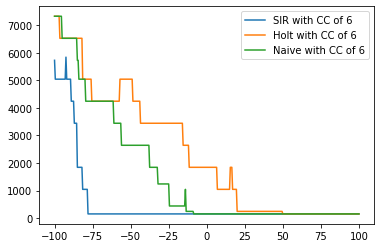

In [ ]:
x1=complete_inventory_results_scenarios_CC_dev['CC deviation with CC of %s'%(protocol_coef_variation[0])]
y1_SIR=complete_inventory_results_scenarios_CC_dev['SIR forecast: Shortage with CC of %s'%(protocol_coef_variation[0])]
y1_Holt=complete_inventory_results_scenarios_CC_dev['Holt forecast: Shortage with CC of %s'%(protocol_coef_variation[0])]
y1_Naive=complete_inventory_results_scenarios_CC_dev['Naive forecast: Shortage with CC of %s'%(protocol_coef_variation[0])]

plt.plot(x1, y1_SIR)
plt.plot(x1, y1_Holt)
plt.plot(x1, y1_Naive)

plt.legend(["SIR with CC of %s"%(protocol_coef_variation[0]),
            "Holt with CC of %s"%(protocol_coef_variation[0]),
            "Naive with CC of %s"%(protocol_coef_variation[0])])

Text(0, 0.5, 'Shortage')

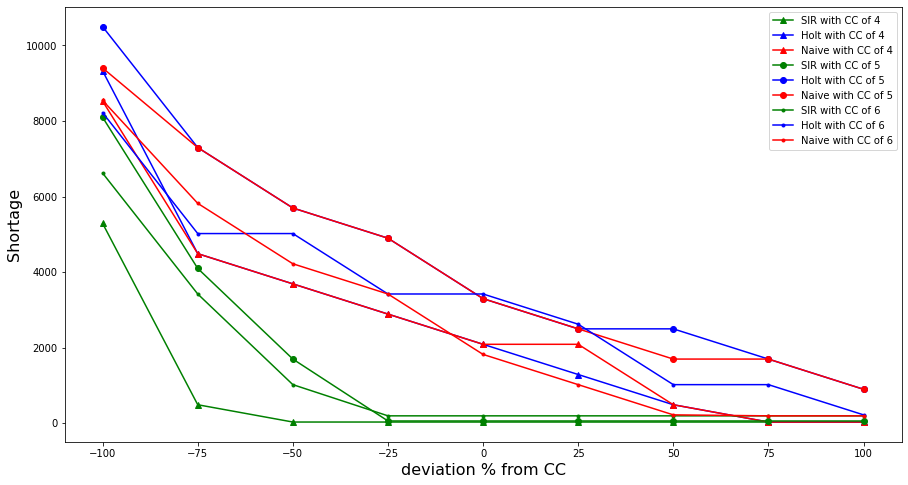

In [ ]:
# Maximum 4 pallet for supplier capacity

fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111)


x1=complete_inventory_results_scenarios_CC_dev['CC deviation with CC of %s'%(protocol_coef_variation[0])]
y1_SIR=complete_inventory_results_scenarios_CC_dev['SIR forecast: Shortage with CC of %s'%(protocol_coef_variation[0])]
y1_Holt=complete_inventory_results_scenarios_CC_dev['Holt forecast: Shortage with CC of %s'%(protocol_coef_variation[0])]
y1_Naive=complete_inventory_results_scenarios_CC_dev['Naive forecast: Shortage with CC of %s'%(protocol_coef_variation[0])]

plt.plot(x1, y1_SIR, color = 'green',label="SIR with CC of %s"%(protocol_coef_variation[0]),marker='^')
plt.plot(x1, y1_Holt, color = 'blue',label="Holt with CC of %s"%(protocol_coef_variation[0]),marker='^')
plt.plot(x1, y1_Naive, color = 'red',label="Naive with CC of %s"%(protocol_coef_variation[0]),marker='^')



x2=complete_inventory_results_scenarios_CC_dev['CC deviation with CC of %s'%(protocol_coef_variation[1])]
y2_SIR=complete_inventory_results_scenarios_CC_dev['SIR forecast: Shortage with CC of %s'%(protocol_coef_variation[1])]
y2_Holt=complete_inventory_results_scenarios_CC_dev['Holt forecast: Shortage with CC of %s'%(protocol_coef_variation[1])]
y2_Naive=complete_inventory_results_scenarios_CC_dev['Naive forecast: Shortage with CC of %s'%(protocol_coef_variation[1])]

plt.plot(x2, y2_SIR, color = 'green',label="SIR with CC of %s"%(protocol_coef_variation[1]),marker='o')
plt.plot(x2, y2_Holt, color = 'blue',label="Holt with CC of %s"%(protocol_coef_variation[1]),marker='o')
plt.plot(x2, y2_Naive, color = 'red',label="Naive with CC of %s"%(protocol_coef_variation[1]),marker='o')




x3=complete_inventory_results_scenarios_CC_dev['CC deviation with CC of %s'%(protocol_coef_variation[2])]
y3_SIR=complete_inventory_results_scenarios_CC_dev['SIR forecast: Shortage with CC of %s'%(protocol_coef_variation[2])]
y3_Holt=complete_inventory_results_scenarios_CC_dev['Holt forecast: Shortage with CC of %s'%(protocol_coef_variation[2])]
y3_Naive=complete_inventory_results_scenarios_CC_dev['Naive forecast: Shortage with CC of %s'%(protocol_coef_variation[2])]

plt.plot(x3, y3_SIR, color = 'green',label="SIR with CC of %s"%(protocol_coef_variation[0]),marker='.')
plt.plot(x3, y3_Holt, color = 'blue',label="Holt with CC of %s"%(protocol_coef_variation[0]),marker='.')
plt.plot(x3, y3_Naive, color = 'red',label="Naive with CC of %s"%(protocol_coef_variation[0]),marker='.')



plt.legend(["SIR with CC of %s"%(protocol_coef_variation[0]),
            "Holt with CC of %s"%(protocol_coef_variation[0]),
            "Naive with CC of %s"%(protocol_coef_variation[0]),
            "SIR with CC of %s"%(protocol_coef_variation[1]),
            "Holt with CC of %s"%(protocol_coef_variation[1]),
            "Naive with CC of %s"%(protocol_coef_variation[1]),
            "SIR with CC of %s"%(protocol_coef_variation[2]),
            "Holt with CC of %s"%(protocol_coef_variation[2]),
            "Naive with CC of %s"%(protocol_coef_variation[2])])

plt.xlabel('deviation % from CC',fontsize=16)
plt.ylabel('Shortage',fontsize=16)


In [ ]:
complete_inventory_results_scenarios_CC_dev.head()

,CC deviation with CC of 4,Protocol coefficient with CC of 4,Specified service level with CC of 4,SIR forecast: Shortage with CC of 4,SIR forecast: Inventory level at the end with CC of 4,SIR forecast: Achieved service level with CC of 4,SIR forecast: Number of epochs with shortage with CC of 4,SIR forecast: Total number of units ordered with CC of 4,SIR forecast: Number of orders with CC of 4,SIR forecast: Real cost with CC of 4,SIR forecast: Total cost with CC of 4,Holt forecast: Shortage with CC of 4,Holt forecast: Inventory level at the end with CC of 4,Holt forecast: Achieved service level with CC of 4,Holt forecast: Number of epochs with shortage with CC of 4,Holt forecast: Total number of units ordered with CC of 4,Holt forecast: Number of orders with CC of 4,Holt forecast: Real cost with CC of 4,Holt forecast: Total cost with CC of 4,Naive forecast: Shortage with CC of 4,Naive forecast: Inventory level at the end with CC of 4,Naive forecast: Achieved service level with CC of 4,Naive forecast: Number of epochs with shortage with CC of 4,Naive forecast: Total number of units ordered with CC of 4,Naive forecast: Number of orders with CC of 4,Naive forecast: Real cost with CC of 4,Naive forecast: Total cost with CC of 4,Total demand/consumption with CC of 4,CC deviation with CC of 5,Protocol coefficient with CC of 5,Specified service level with CC of 5,SIR forecast: Shortage with CC of 5,SIR forecast: Inventory level at the end with CC of 5,SIR forecast: Achieved service level with CC of 5,SIR forecast: Number of epochs with shortage with CC of 5,SIR forecast: Total number of units ordered with CC of 5,SIR forecast: Number of orders with CC of 5,SIR forecast: Real cost with CC of 5,SIR forecast: Total cost with CC of 5,Holt forecast: Shortage with CC of 5,...,Holt forecast: Number of orders with CC of 5,Holt forecast: Real cost with CC of 5,Holt forecast: Total cost with CC of 5,Naive forecast: Shortage with CC of 5,Naive forecast: Inventory level at the end with CC of 5,Naive forecast: Achieved service level with CC of 5,Naive forecast: Number of epochs with shortage with CC of 5,Naive forecast: Total number of units ordered with CC of 5,Naive forecast: Number of orders with CC of 5,Naive forecast: Real cost with CC of 5,Naive forecast: Total cost with CC of 5,Total demand/consumption with CC of 5,CC deviation with CC of 6,Protocol coefficient with CC of 6,Specified service level with CC of 6,SIR forecast: Shortage with CC of 6,SIR forecast: Inventory level at the end with CC of 6,SIR forecast: Achieved service level with CC of 6,SIR forecast: Number of epochs with shortage with CC of 6,SIR forecast: Total number of units ordered with CC of 6,SIR forecast: Number of orders with CC of 6,SIR forecast: Real cost with CC of 6,SIR forecast: Total cost with CC of 6,Holt forecast: Shortage with CC of 6,Holt forecast: Inventory level at the end with CC of 6,Holt forecast: Achieved service level with CC of 6,Holt forecast: Number of epochs with shortage with CC of 6,Holt forecast: Total number of units ordered with CC of 6,Holt forecast: Number of orders with CC of 6,Holt forecast: Real cost with CC of 6,Holt forecast: Total cost with CC of 6,Naive forecast: Shortage with CC of 6,Naive forecast: Inventory level at the end with CC of 6,Naive forecast: Achieved service level with CC of 6,Naive forecast: Number of epochs with shortage with CC of 6,Naive forecast: Total number of units ordered with CC of 6,Naive forecast: Number of orders with CC of 6,Naive forecast: Real cost with CC of 6,Naive forecast: Total cost with CC of 6,Total demand/consumption with CC of 6
0,-100,4,0.95000000,5548.00000000,6344.00000000,0.74000000,5,20000.00000000,14,346232.50000000,679112.50000000,7148.00000000,11944.00000000,0.74000000,5,24000.00000000,14,432237.00000000,861117.00000000,7148.00000000,11944.00000000,0.74000000,5,24000.00000000,14,415437.00000000,844317.00000000,19504.00000000,-100,5,0.95000000,6671.00000000,4600.00000000,0.68000000,6,24000.

Text(0, 0.5, 'Shortage')

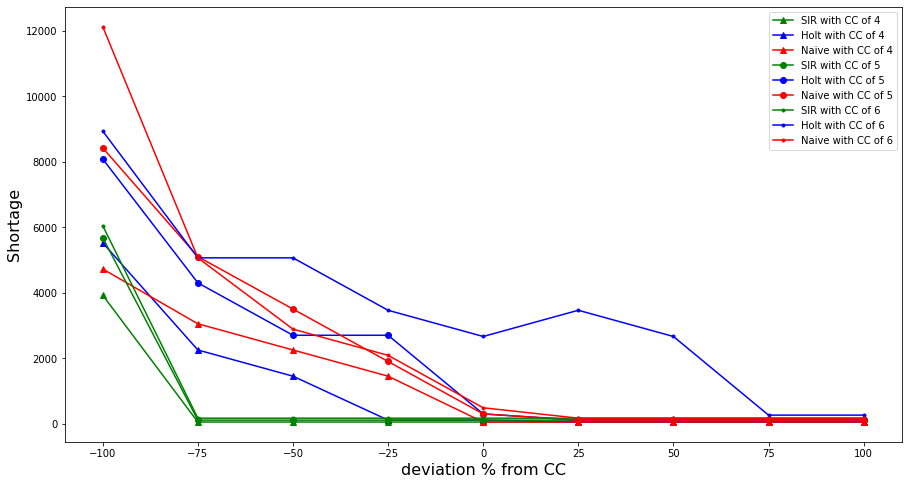

In [ ]:
# Maximum 10 pallet for supplier capacity


fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111)


x1=complete_inventory_results_scenarios_CC_dev['CC deviation with CC of %s'%(protocol_coef_variation[0])]
y1_SIR=complete_inventory_results_scenarios_CC_dev['SIR forecast: Shortage with CC of %s'%(protocol_coef_variation[0])]
y1_Holt=complete_inventory_results_scenarios_CC_dev['Holt forecast: Shortage with CC of %s'%(protocol_coef_variation[0])]
y1_Naive=complete_inventory_results_scenarios_CC_dev['Naive forecast: Shortage with CC of %s'%(protocol_coef_variation[0])]

plt.plot(x1, y1_SIR, color = 'green',label="SIR with CC of %s"%(protocol_coef_variation[0]),marker='^')
plt.plot(x1, y1_Holt, color = 'blue',label="Holt with CC of %s"%(protocol_coef_variation[0]),marker='^')
plt.plot(x1, y1_Naive, color = 'red',label="Naive with CC of %s"%(protocol_coef_variation[0]),marker='^')



x2=complete_inventory_results_scenarios_CC_dev['CC deviation with CC of %s'%(protocol_coef_variation[1])]
y2_SIR=complete_inventory_results_scenarios_CC_dev['SIR forecast: Shortage with CC of %s'%(protocol_coef_variation[1])]
y2_Holt=complete_inventory_results_scenarios_CC_dev['Holt forecast: Shortage with CC of %s'%(protocol_coef_variation[1])]
y2_Naive=complete_inventory_results_scenarios_CC_dev['Naive forecast: Shortage with CC of %s'%(protocol_coef_variation[1])]

plt.plot(x2, y2_SIR, color = 'green',label="SIR with CC of %s"%(protocol_coef_variation[1]),marker='o')
plt.plot(x2, y2_Holt, color = 'blue',label="Holt with CC of %s"%(protocol_coef_variation[1]),marker='o')
plt.plot(x2, y2_Naive, color = 'red',label="Naive with CC of %s"%(protocol_coef_variation[1]),marker='o')




x3=complete_inventory_results_scenarios_CC_dev['CC deviation with CC of %s'%(protocol_coef_variation[2])]
y3_SIR=complete_inventory_results_scenarios_CC_dev['SIR forecast: Shortage with CC of %s'%(protocol_coef_variation[2])]
y3_Holt=complete_inventory_results_scenarios_CC_dev['Holt forecast: Shortage with CC of %s'%(protocol_coef_variation[2])]
y3_Naive=complete_inventory_results_scenarios_CC_dev['Naive forecast: Shortage with CC of %s'%(protocol_coef_variation[2])]

plt.plot(x3, y3_SIR, color = 'green',label="SIR with CC of %s"%(protocol_coef_variation[0]),marker='.')
plt.plot(x3, y3_Holt, color = 'blue',label="Holt with CC of %s"%(protocol_coef_variation[0]),marker='.')
plt.plot(x3, y3_Naive, color = 'red',label="Naive with CC of %s"%(protocol_coef_variation[0]),marker='.')



plt.legend(["SIR with CC of %s"%(protocol_coef_variation[0]),
            "Holt with CC of %s"%(protocol_coef_variation[0]),
            "Naive with CC of %s"%(protocol_coef_variation[0]),
            "SIR with CC of %s"%(protocol_coef_variation[1]),
            "Holt with CC of %s"%(protocol_coef_variation[1]),
            "Naive with CC of %s"%(protocol_coef_variation[1]),
            "SIR with CC of %s"%(protocol_coef_variation[2]),
            "Holt with CC of %s"%(protocol_coef_variation[2]),
            "Naive with CC of %s"%(protocol_coef_variation[2])])

plt.xlabel('deviation % from CC',fontsize=16)
plt.ylabel('Shortage',fontsize=16)


Text(0, 0.5, 'Inventory level at the end')

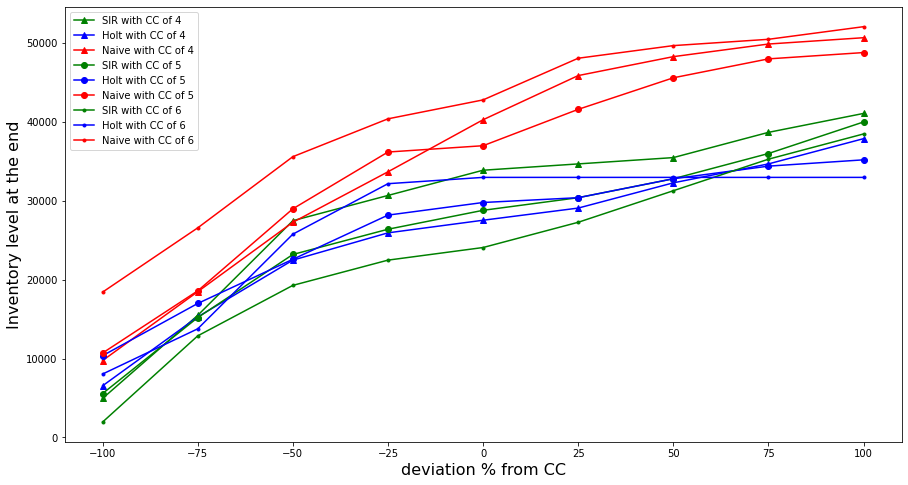

In [ ]:
#Inventory level at the end

# Maximum 10 pallet for supplier capacity


fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111)


x1=complete_inventory_results_scenarios_CC_dev['CC deviation with CC of %s'%(protocol_coef_variation[0])]
y1_SIR=complete_inventory_results_scenarios_CC_dev['SIR forecast: Inventory level at the end with CC of %s'%(protocol_coef_variation[0])]
y1_Holt=complete_inventory_results_scenarios_CC_dev['Holt forecast: Inventory level at the end with CC of %s'%(protocol_coef_variation[0])]
y1_Naive=complete_inventory_results_scenarios_CC_dev['Naive forecast: Inventory level at the end with CC of %s'%(protocol_coef_variation[0])]

plt.plot(x1, y1_SIR, color = 'green',label="SIR with CC of %s"%(protocol_coef_variation[0]),marker='^')
plt.plot(x1, y1_Holt, color = 'blue',label="Holt with CC of %s"%(protocol_coef_variation[0]),marker='^')
plt.plot(x1, y1_Naive, color = 'red',label="Naive with CC of %s"%(protocol_coef_variation[0]),marker='^')



#x2=complete_inventory_results_scenarios_CC_dev['CC deviation with CC of %s'%(protocol_coef_variation[1])]
#y2_SIR=complete_inventory_results_scenarios_CC_dev['SIR forecast: Inventory level at the end with CC of %s'%(protocol_coef_variation[1])]
#y2_Holt=complete_inventory_results_scenarios_CC_dev['Holt forecast: Inventory level at the end with CC of %s'%(protocol_coef_variation[1])]
#y2_Naive=complete_inventory_results_scenarios_CC_dev['Naive forecast: Inventory level at the end with CC of %s'%(protocol_coef_variation[1])]

plt.plot(x2, y2_SIR, color = 'green',label="SIR with CC of %s"%(protocol_coef_variation[1]),marker='o')
plt.plot(x2, y2_Holt, color = 'blue',label="Holt with CC of %s"%(protocol_coef_variation[1]),marker='o')
plt.plot(x2, y2_Naive, color = 'red',label="Naive with CC of %s"%(protocol_coef_variation[1]),marker='o')




x3=complete_inventory_results_scenarios_CC_dev['CC deviation with CC of %s'%(protocol_coef_variation[2])]
y3_SIR=complete_inventory_results_scenarios_CC_dev['SIR forecast: Inventory level at the end with CC of %s'%(protocol_coef_variation[2])]
y3_Holt=complete_inventory_results_scenarios_CC_dev['Holt forecast: Inventory level at the end with CC of %s'%(protocol_coef_variation[2])]
y3_Naive=complete_inventory_results_scenarios_CC_dev['Naive forecast: Inventory level at the end with CC of %s'%(protocol_coef_variation[2])]

plt.plot(x3, y3_SIR, color = 'green',label="SIR with CC of %s"%(protocol_coef_variation[0]),marker='.')
plt.plot(x3, y3_Holt, color = 'blue',label="Holt with CC of %s"%(protocol_coef_variation[0]),marker='.')
plt.plot(x3, y3_Naive, color = 'red',label="Naive with CC of %s"%(protocol_coef_variation[0]),marker='.')



plt.legend(["SIR with CC of %s"%(protocol_coef_variation[0]),
            "Holt with CC of %s"%(protocol_coef_variation[0]),
            "Naive with CC of %s"%(protocol_coef_variation[0]),
            "SIR with CC of %s"%(protocol_coef_variation[1]),
            "Holt with CC of %s"%(protocol_coef_variation[1]),
            "Naive with CC of %s"%(protocol_coef_variation[1]),
            "SIR with CC of %s"%(protocol_coef_variation[2]),
            "Holt with CC of %s"%(protocol_coef_variation[2]),
            "Naive with CC of %s"%(protocol_coef_variation[2])])

plt.xlabel('deviation % from CC',fontsize=16)
plt.ylabel('Inventory level at the end',fontsize=16)


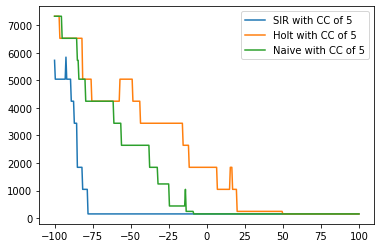

In [ ]:
x3=complete_inventory_results_scenarios_CC_dev['CC deviation with CC of %s'%(protocol_coef_variation[2])]
y3_SIR=complete_inventory_results_scenarios_CC_dev['SIR forecast: Shortage with CC of %s'%(protocol_coef_variation[2])]
y3_Holt=complete_inventory_results_scenarios_CC_dev['Holt forecast: Shortage with CC of %s'%(protocol_coef_variation[2])]
y3_Naive=complete_inventory_results_scenarios_CC_dev['Naive forecast: Shortage with CC of %s'%(protocol_coef_variation[2])]

plt.plot(x3, y3_SIR)
plt.plot(x3, y3_Holt)
plt.plot(x3, y3_Naive)

plt.legend(["SIR with CC of %s"%(protocol_coef_variation[1]),
            "Holt with CC of %s"%(protocol_coef_variation[1]),
            "Naive with CC of %s"%(protocol_coef_variation[1])])

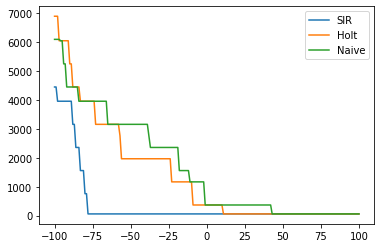

In [ ]:
x1=complete_inventory_results_scenarios_CC_dev['CC deviation with CC of 4']
y1_SIR=complete_inventory_results_scenarios_CC_dev['SIR forecast: Shortage with CC of 4']
y1_Holt=complete_inventory_results_scenarios_CC_dev['Holt forecast: Shortage with CC of 4']
y1_Naive=complete_inventory_results_scenarios_CC_dev['Naive forecast: Shortage with CC of 4']

plt.plot(x1, y1_SIR)
plt.plot(x1, y1_Holt)
plt.plot(x1, y1_Naive)

plt.legend(["SIR", "Holt","Naive"])

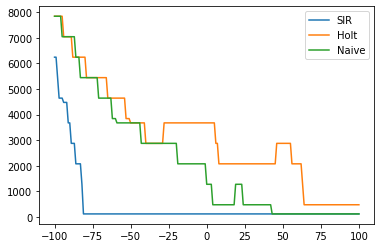

In [ ]:
x2=complete_inventory_results_scenarios_CC_dev['CC deviation with CC of 5']
y2_SIR=complete_inventory_results_scenarios_CC_dev['SIR forecast: Shortage with CC of 5']
y2_Holt=complete_inventory_results_scenarios_CC_dev['Holt forecast: Shortage with CC of 5']
y2_Naive=complete_inventory_results_scenarios_CC_dev['Naive forecast: Shortage with CC of 5']

plt.plot(x2, y2_SIR)
plt.plot(x2, y2_Holt)
plt.plot(x2, y2_Naive)

plt.legend(["SIR", "Holt","Naive"])

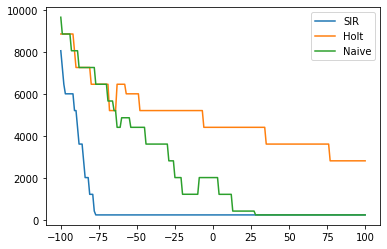

In [ ]:
x3=complete_inventory_results_scenarios_CC_dev['CC deviation with CC of 6']
y3_SIR=complete_inventory_results_scenarios_CC_dev['SIR forecast: Shortage with CC of 6']
y3_Holt=complete_inventory_results_scenarios_CC_dev['Holt forecast: Shortage with CC of 6']
y3_Naive=complete_inventory_results_scenarios_CC_dev['Naive forecast: Shortage with CC of 6']

plt.plot(x3, y3_SIR)
plt.plot(x3, y3_Holt)
plt.plot(x3, y3_Naive)

plt.legend(["SIR", "Holt","Naive"])

## Demand simulations



### parameters

In [ ]:
# In this section the parameters for ranges of scenarios are defined
#==============================================================================

# How many scenarios do you want?
no_scenarios=10000

# SUPPLIER'S CONSTRAINTS:
#====================================
# How many items are in a box:
item_in_box=12
# How many items are in a pallet:
box_in_pallet=1

item_in_pallet= item_in_box * box_in_pallet

# Minimum order
# what is the lower limit for minimum pallet order:
lower_limit_minimum_pallet=1 
# what is the upper limit for minimum pallet order:
upper_limit_minimum_pallet=10 

# Maximum order
# what is the lower limit for maximum pallet order:
lower_limit_maximum_pallet=200 
# what is the upper limit for maximum pallet order:
upper_limit_maximum_pallet=400

# Lead time
# what is the lower limit for lead time of the order:
lower_limit_L=5
# what is the upper limit for lead time of the order:
upper_limit_L=30

# CONSUMPTION'S CONSTRAINTS:
#====================================
# What is the lower limit of coefficient of consumption:
lower_limit_CC=3
# What is the upper limit of coefficient of consumption:
upper_limit_CC=7


# INVENTORY MANAGEMENT CONSTRAINTS:
#====================================
# Capacity of inventory
# What is the lower limit of invernoty capacity (in terms of number of pallet):
lower_limit_invernoty_capacity= 3000
# What is the upper limit of invernoty capacity (in terms of number of pallet):
upper_limit_invernoty_capacity= 6000

# Service level
# What is the lower limit of serivce level (in percent (%)):
lower_limit_service_level= 95
# What is the upper limit of serivce level (in percent (%))
upper_limit_service_level= 99.9


#  DATA SIMULATION CONSTRAINTS:
#====================================

#Do you want to have noise added to the data?
#     'yes'     if you want to add noise to the data 
#     'no'      if you do NOT want to add noise
noise_addition='yes'


# Noise generation 
# What is the lower limit of SNR:
lower_limit_SNR= 2
# What is the upper limit of SNR:
upper_limit_SNR= 10

# Deviation from CC
#SIR_forecast_CC_dev=[0]

#  Lag info 
#====================================

# how many epochs are there in the 'lag'?
lag=2

# daily lag limit 
# What is the lower limit of daily lag:
lower_limit_lag= 0
# What is the upper limit of daily lag:
upper_limit_lag= 14

#  Replenishment info 
#====================================

# how many days should be between the arrival of info (replenishement mode)
period_info=7


# epoch Period
R=7

### Scenario creator

In [ ]:
sim_scenario=sim_scenarios_empty.copy()
complete_sim_scenarios=sim_scenario.iloc[0:0].copy()
#inventory_data_result_scenarios = inventory_data_result_scenarios.iloc[0:0].copy()
sim_demand=provincial_data_CIHI['daily_Hospitalizations'].to_frame().copy()
sim_noise=provincial_data_CIHI['daily_Hospitalizations'].to_frame().copy()


for scenarios in range(no_scenarios):
  # Using uniform distribution to randomly choose a value for the following parameters
  sim_scenario=sim_scenarios_empty.copy()

  minimum_pallet = round(np.random.uniform(lower_limit_minimum_pallet, upper_limit_minimum_pallet))
  maximum_pallet = round(np.random.uniform(lower_limit_maximum_pallet, upper_limit_maximum_pallet))
  protocol_coef = (round((np.random.uniform(lower_limit_CC, upper_limit_CC))*2))/2
  L = round(np.random.uniform(lower_limit_L, upper_limit_L))
  inventory_capactiy_in_pallet = round(np.random.uniform(lower_limit_invernoty_capacity, upper_limit_invernoty_capacity))
  service_level = round(np.random.uniform(lower_limit_service_level, upper_limit_service_level),1)/100
  SNR = round(np.random.uniform(lower_limit_SNR, upper_limit_SNR))
  lag = round(np.random.uniform(lower_limit_lag, upper_limit_lag))

  # Calculating the following varibales based on the above randomly chosen varibales
  item_in_pallet= item_in_box * box_in_pallet
  suppliers_capacity_min= item_in_pallet * minimum_pallet
  suppliers_capacity_max= item_in_pallet * maximum_pallet
  inventory_capactiy= inventory_capactiy_in_pallet * item_in_pallet


    #DATA SIMULATION
    #==============================================================================
    #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
    #noise recalculation should only be applied if we have have different coefficient of protocol, 
    #otherwise noise should stya the same, thats why it is outside of the loop
    
  
  sim_data=noise_creator_for_basic_scenario(provincial_data_CIHI['daily_Hospitalizations'],
                                                                             SNR,
                                                                             protocol_coef)
  
  provincial_data_CIHI['daily_consumption']=sim_data[0]
  provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()


      # >>>USER INPUT<<<
      # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
      # ======================================================================================================
  forecast_data_1 = provincial_data_CIHI.copy()

      # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
  consumption_date_type='daily_consumption'

  y = forecast_data_1[consumption_date_type]
  y_cumulative = forecast_data_1['cumulative_daily_consumption']

  sim_scenario['Min pallet']=minimum_pallet
  sim_scenario['Max pallet']=maximum_pallet
  sim_scenario['Protocol coefficient']=protocol_coef
  sim_scenario['Lead time']=L
  sim_scenario['Inventory capacity (in pallet)']=inventory_capactiy_in_pallet
  sim_scenario['Specified service level']=service_level
  sim_scenario['SNR']=SNR
  sim_scenario['Lag']=lag
  
  #adding the parameters of a new scenario to previous ones
  complete_sim_scenarios=complete_sim_scenarios.append([sim_scenario],ignore_index=True)
  
  # converting the demand series into a dataframe for demand so that it can be added to the dataframe
  y=y.to_frame()
  y.rename(columns={ y.columns[0]: 'sim demand no.%d'%(scenarios)}, inplace = True) 
  
  
  # converting the noise array into a dataframe for demand so that it can be added to the dataframe
  # we also have to set the index into the day format 
  temp_sim_noise = pd.DataFrame(sim_data[1],columns=['sim demand no.%d'%(scenarios)]).set_index(y.index)
 
  # adding the simulated demand and noise to the previous ones

  sim_demand=pd.concat([sim_demand,y], axis=1, join="inner")
  
  sim_noise=pd.concat([sim_noise,temp_sim_noise], axis=1, join="inner")


sim_demand.drop(sim_demand.columns[0], axis=1, inplace=True)
sim_noise.drop(sim_noise.columns[0], axis=1, inplace=True)


In [ ]:
complete_sim_scenarios.to_csv('Simulated parameters, %d scenarios.csv'%(no_scenarios))
sim_demand.to_csv('Simulated demand, %d scenarios.csv'%(no_scenarios))
sim_noise.to_csv('Simulated noise, %d scenarios.csv'%(no_scenarios))

### Importing data


In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
complete_sim_scenarios=pd.read_csv('Simulated parameters, 10000 scenarios.csv')
#setting the date as the index of the dataframe
complete_sim_scenarios=complete_sim_scenarios.drop(columns='Unnamed: 0')

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
sim_demand=pd.read_csv('Simulated demand, 10000 scenarios.csv')

sim_demand=sim_demand.rename(columns={'Unnamed: 0':'Date'})
#setting the date as the index of the dataframe
sim_demand=sim_demand.set_index(sim_demand['Date'])

sim_demand.drop(sim_demand.columns[0], axis=1, inplace=True)

sim_demand=sim_demand.reset_index()
sim_demand=sim_demand.set_index(y.index).drop(columns='Date')


In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
sim_noise=pd.read_csv('Simulated noise, 10000 scenarios.csv')
#setting the date as the index of the dataframe

sim_noise=sim_noise.rename(columns={'Unnamed: 0':'Date'})
#setting the date as the index of the dataframe
sim_noise=sim_noise.set_index(sim_noise['Date'])

sim_noise.drop(sim_noise.columns[0], axis=1, inplace=True)


sim_noise=sim_noise.reset_index()
sim_noise=sim_noise.set_index(y.index).drop(columns='Date')

## Myopic Scenario

#### Scenario creator

In [ ]:
#this code will pass a clean table to the loop by removing all the rows of the dataframes

inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()
complete_inventory_results_scenarios_myopic=inventory_data_result_scenarios.iloc[0:0].copy()
#inventory_data_result_scenarios = inventory_data_result_scenarios.iloc[0:0].copy()



for scenarios in range(no_scenarios):
  # Using uniform distribution to randomly choose a value for the following parameters
  inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()

  minimum_pallet = complete_sim_scenarios['Min pallet'][scenarios]
  maximum_pallet = complete_sim_scenarios['Max pallet'][scenarios]
  protocol_coef = complete_sim_scenarios['Protocol coefficient'][scenarios]
  L = complete_sim_scenarios['Lead time'][scenarios]
  inventory_capactiy_in_pallet = complete_sim_scenarios['Inventory capacity (in pallet)'][scenarios]
  service_level = complete_sim_scenarios['Specified service level'][scenarios]
  SNR = complete_sim_scenarios['SNR'][scenarios]
  

  # Calculating the following varibales
  item_in_pallet= item_in_box * box_in_pallet
  suppliers_capacity_min= item_in_pallet * minimum_pallet
  suppliers_capacity_max= item_in_pallet * maximum_pallet
  inventory_capactiy= inventory_capactiy_in_pallet * item_in_pallet


  #this code will pass a clean table to the loop by removing all the rows of the dataframes
  complete_inventory_results=inventory_data_result.iloc[0:0].copy()
  inventory_data_result = inventory_data_result.iloc[0:0].copy()



    #DATA SIMULATION
    #==============================================================================
    #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
    #noise recalculation should only be applied if we have have different coefficient of protocol, 
    #otherwise noise should stya the same, thats why it is outside of the loop
    
  provincial_data_CIHI['daily_consumption']=sim_demand.iloc[:,scenarios]
  provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()


      # >>>USER INPUT<<<
      # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
      # ======================================================================================================
  forecast_data_1 = provincial_data_CIHI.copy()

      # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
  consumption_date_type='daily_consumption'

  y = forecast_data_1[consumption_date_type]
  y_cumulative = forecast_data_1['cumulative_daily_consumption']

      # PERIODIC REVIEW SYSTEM with MYOPIC forecasting
      #====================================================================================================================

  inventory_data_periodic_myopic = inventory_data.copy()
  inventory_data_periodic_myopic.drop(inventory_data_periodic_myopic.index[1:],0,inplace=True)


  for i in range(1,math.ceil(len(y)/R)+1):
    

    y_to_val = y[(i)*R:(i)*R+(R+L)]
        #y_set=y[0:(i+1)*R+(R+L)]
    prediction = myopic_forecast_method(y_to_val)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_myopic=peridoic_review(y_previous_epoch,inventory_data_periodic_myopic,prediction,epoch_no)

  # Putting everything into a dataframe
  #=========================================================================================================
  #putting in the main parameters of the scenarios in the data frames
  inventory_data_result_scenarios['Lead time']=L
  inventory_data_result_scenarios['SNR']=SNR
  inventory_data_result_scenarios['Protocol coefficient']=protocol_coef
  inventory_data_result_scenarios['Suppliers minimum capacity']=suppliers_capacity_min
  inventory_data_result_scenarios['Suppliers maximum capacity']=suppliers_capacity_max
  inventory_data_result_scenarios['Inventory capacity']=inventory_capactiy
  inventory_data_result_scenarios['Specified service level']=service_level
    # The total demand/consumption is the same for all methods, so we can pick any of them, in this case, Myopic was picked
  inventory_data_result_scenarios['Total demand/consumption']=inventory_data_periodic_myopic['consumption in last epoch'].sum()

  # Puttin the analysis data into the data frame:
  #=========================================================================================================
  results=(inventory_data_periodic_myopic)
  i=0
  
  #inventory_data_result_scenarios.iloc[[0],[(i*18)+7]]=results['shortage'].sum()
  inventory_data_result_scenarios['Myopic forecast: Shortage']=results['shortage'].sum()
  inventory_data_result_scenarios['Myopic forecast: Inventory level at the end']=results['current'].iloc[-1]
  inventory_data_result_scenarios['Myopic forecast: Achieved service level']=round((1-(results['shortage'] != 0).sum()/len(results['shortage']-1)),2)
  inventory_data_result_scenarios['Myopic forecast: Number of epochs with shortage']=(results['shortage'] != 0).sum()
  inventory_data_result_scenarios['Myopic forecast: Total number of units ordered']=results['order'].sum()
  inventory_data_result_scenarios['Myopic forecast: Number of orders']=(results['order'] != 0).sum()
  inventory_data_result_scenarios['Myopic forecast: Real cost']=results['real cost'].sum()
  inventory_data_result_scenarios['Myopic forecast: Total cost']=results['total cost'].sum()
  # the below command compute average effective percentage bias, by average we specify those epochs that orders can be made
  # if becuase of the lead time, we cannot place an order in a specific epoch (the end epochs) then the percentage bias
  # is not relevent to our study 
  inventory_data_result_scenarios['Myopic forecast: Average effective percentage bias']=results['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean()
  
  # Counting the effective number of epochs with under-forecast
  inventory_data_result_scenarios['Myopic forecast: Average effective percentage bias']=(results['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] < 0).sum()
  
  # Counting the effective number of epochs with over-forecast
  inventory_data_result_scenarios['Myopic forecast: Effective no. of epochs with over-forecast']=(results['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] > 0).sum()
  
  # Calulating the percentage of effective number of epochs with under-forecast
  inventory_data_result_scenarios['Myopic forecast: Effective no. of epochs with over-forecast']=round((inventory_data_result_scenarios.iloc[0][(i*12)+17])*100/((inventory_data_result_scenarios.iloc[0][(i*12)+16])+(inventory_data_result_scenarios.iloc[0][(i*12)+17])),2)

  #Effective RMSE
  inventory_data_result_scenarios['Myopic forecast: Effective no. of epochs with over-forecast']=results['std of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean() 
  #RMSE
  inventory_data_result_scenarios['Myopic forecast: RMSE']=results['std of previous epoch'][1:-1].mean()
  #Effective MAPE
  inventory_data_result_scenarios['Myopic forecast: Effective MAPE']=results['MAPE'][1:math.floor((len(y)-L)/R)+1].mean() 
  #MAPE
  inventory_data_result_scenarios['Myopic forecast: MAPE']=results['MAPE'][1:-1].mean()
  #Effective MAE
  inventory_data_result_scenarios['Myopic forecast: Effective MAE']=results['MAE'][1:math.floor((len(y)-L)/R)+1].mean() 
  #MAE
  inventory_data_result_scenarios['Myopic forecast: MAE']=results['MAE'][1:-1].mean()

  Myopic_epochs_bias=((results.iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Myopic percentage bias of epoch: ')
  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             Myopic_epochs_bias],axis=1)

  Myopic_epochs_shortage=(results.iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Myopic shortage of epoch: ')
  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             Myopic_epochs_shortage],axis=1)

  Myopic_epochs_leftover_in=(results.iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Myopic left-over inventory of epoch: ')
  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             Myopic_epochs_leftover_in],axis=1)
  
  Myopic_order=(results.iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Myopic order of epoch: ')
  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              Myopic_order],axis=1)
  
  Myopic_order_actual=(results.iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Myopic order actual of epoch: ')
  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              Myopic_order_actual],axis=1)

  #inventory_data_result_scenarios  
  complete_inventory_results_scenarios_myopic=complete_inventory_results_scenarios_myopic.append([inventory_data_result_scenarios],ignore_index=True)


In [ ]:
#Exporting the data into the a csv file which will be saved into the drive
complete_inventory_results_scenarios_myopic.to_csv('Inventory management results with %s scenarios Myopic.csv'%(no_scenarios))

#### Results

###### Importing Data

In [ ]:
complete_inventory_results_scenarios_Myopic

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,SIR forecast: Number of epochs with shortage,SIR forecast: Total number of units ordered,SIR forecast: Number of orders,SIR forecast: Real cost,SIR forecast: Total cost,SIR forecast: Average effective percentage bias,SIR forecast: Effective no. of epochs with under-forecast,SIR forecast: Effective no. of epochs with over-forecast,SIR forecast: Percentage of Effective no. of epochs with over-forecast,SIR forecast: Effective RMSE,SIR forecast: RMSE,SIR forecast: Effective MAPE,SIR forecast: MAPE,SIR forecast: Effective MAE,SIR forecast: MAE,Holt forecast: Shortage,Holt forecast: Inventory level at the end,Holt forecast: Achieved service level,Holt forecast: Number of epochs with shortage,Holt forecast: Total number of units ordered,Holt forecast: Number of orders,Holt forecast: Real cost,Holt forecast: Total cost,Holt forecast: Average effective percentage bias,Holt forecast: Effective no. of epochs with under-forecast,Holt forecast: Effective no. of epochs with over-forecast,Holt forecast: Percentage of Effective no. of epochs with over-forecast,Holt forecast: Effective RMSE,Holt forecast: RMSE,Holt forecast: Effective MAPE,...,Myopic left-over inventory of epoch: 17,Myopic left-over inventory of epoch: 18,Myopic order of epoch: 0,Myopic order of epoch: 1,Myopic order of epoch: 2,Myopic order of epoch: 3,Myopic order of epoch: 4,Myopic order of epoch: 5,Myopic order of epoch: 6,Myopic order of epoch: 7,Myopic order of epoch: 8,Myopic order of epoch: 9,Myopic order of epoch: 10,Myopic order of epoch: 11,Myopic order of epoch: 12,Myopic order of epoch: 13,Myopic order of epoch: 14,Myopic order of epoch: 15,Myopic order of epoch: 16,Myopic order of epoch: 17,Myopic order of epoch: 18,Myopic order actual of epoch: 0,Myopic order actual of epoch: 1,Myopic order actual of epoch: 2,Myopic order actual of epoch: 3,Myopic order actual of epoch: 4,Myopic order actual of epoch: 5,Myopic order actual of epoch: 6,Myopic order actual of epoch: 7,Myopic order actual of epoch: 8,Myopic order actual of epoch: 9,Myopic order actual of epoch: 10,Myopic order actual of epoch: 11,Myopic order actual of epoch: 12,Myopic order actual of epoch: 13,Myopic order actual of epoch: 14,Myopic order actual of epoch: 15,Myopic order actual of epoch: 16,Myopic order actual of epoch: 17,Myopic order actual of epoch: 18
0,10,3,6.50000000,96,3108,39444,0.97100000,6190.00000000,2177.00000000,0.79000000,4,27936.00000000,13,381896.00000000,753296.00000000,0,0,0,nan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,2258.00000000,2177.00000000,0.00000000,156.00000000,348.00000000,696.00000000,984.00000000,2424.00000000,3108.00000000,3108.00000000,3108.00000000,3108.00000000,3108.00000000,3108.00000000,3108.00000000,1572.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,149.00000000,342.00000000,687.00000000,983.00000000,2413.00000000,5068.00000000,7764.00000000,9665.00000000,11225.00000000,10858.00000000,8338.00000000,4736.00000000,1563.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
1,15,9,4.00000000,108,2892,67992,0.95800000,0.00000000,5074.00000000,1.00000000,0,24516.00000000,12,343459.50000000,343459.50000000,0,0,0,nan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,5114.00000000,5074.00000000,0.00000000,108.00000000,312.00000000,696.00000000,1536.00000000,2892.00000000,2892.00000000,2892.00000000,2892.00000000,2892.00000000,2892.00000000,2892.00000000,1620.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,84.00000000,307.00000000,692.00000000,1533.00000000,3162.00000000,5626.00000000,7339.00000000,7299.00000000,6853.00000000,5536.00000000,3780.00000000,1611.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
2,13,3,5.00000000,120,3108,67548,

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
complete_inventory_results_scenarios_Myopic=pd.read_csv('Inventory management results with 10000 scenarios Myopic.csv')
#setting the date as the index of the dataframe
complete_inventory_results_scenarios_Myopic=complete_inventory_results_scenarios_Myopic.drop(columns='Unnamed: 0')


###### Data filtering

In [ ]:
#creating a separet daraframe in order to not touch the original copy
df_temp_present=complete_inventory_results_scenarios_Myopic.copy()

# SHORTAGE
#============================================
# filtering the data for sepcified category
shortage_epoch_df_Myopic=df_temp_present[df_temp_present.columns[pd.Series(df_temp_present.columns).str.startswith('Myopic shortage of epoch')]]

# Left-over inventory
#============================================
# filtering the data for sepcified category
leftover_epoch_df_Myopic=df_temp_present[df_temp_present.columns[pd.Series(df_temp_present.columns).str.startswith('Myopic left-over inventory of epoch')]]
# Bais-over inventory
#============================================
# filtering the data for sepcified category
bias_epoch_df_Myopic=df_temp_present[df_temp_present.columns[pd.Series(df_temp_present.columns).str.startswith('Myopic percentage bias of epoch')]]


In [ ]:
grouped_demand=sim_demand.reset_index().rename(columns = {'index':'date'}, inplace = False)
grouped_demand['Date'] = pd.to_datetime(grouped_demand['Date'],format='%Y-%m-%d')
grouped_demand=(grouped_demand.groupby(grouped_demand.index // R).sum())
# adding a row of zero for time zero
grouped_demand.loc[len(grouped_demand)] = 0
grouped_demand = round(grouped_demand.shift()).apply(np.int64)
grouped_demand.loc[0] = 0
grouped_demand=grouped_demand.T.replace(0,1)
grouped_demand

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
sim demand no.0,1,71,123,171,201,310,656,1138,3465,4127,5203,5100,4383,3294,1422,1324,678,502,81
sim demand no.1,1,58,74,105,127,202,349,854,1782,3059,3213,2936,2572,1664,1184,774,460,289,40
sim demand no.2,1,81,98,146,181,270,400,1319,2295,3544,4186,3031,3258,2573,1277,943,496,301,47
sim demand no.3,1,77,121,163,175,301,517,1196,2773,4737,4987,4268,3610,2524,1817,1191,680,407,74
sim demand no.4,1,77,115,136,173,268,530,1135,2669,4478,3868,4511,2943,2169,1634,944,735,378,78
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sim demand no.9995,1,66,93,141,191,252,438,1029,2433,4373,3897,3524,2464,2029,1450,985,622,350,67
sim demand no.9996,1,60,80,133,190,243,458,938,2553,3401,3961,3495,3149,2417,1648,986,613,336,63
sim demand no.9997,1,58,78,110,122,178,346,840,1838,3225,3021,2838,2085,1771,1187,758,429,293,52
sim demand no.9998,1,70,102,143,151,258,448,1064,2387,4302,4114,3759,3186,2170,1472,926,594,345,59


###### Shortage vs epoch

In [ ]:

def graph_generator_for_epochs_Myopic_1(data1,data2,data3,data4,y_axis_name,data_type):
  fig = plt.figure(figsize=(15,8))
  ax = fig.add_subplot(111)

  #taking the mean of each column and removing the epochs that order cannot be placed (based on the lead time)
  y_bias_SIR=data1.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_bias_Holt=data2.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_bias_Naive=data3.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_bias_Myopic=data4.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  x=range(len(y_bias_SIR))

  #spine placement data centered
  ax.spines['left'].set_position(('data', 0.0))
  ax.spines['bottom'].set_position(('data', 0.0))
  ax.spines['right'].set_color('none')
  ax.spines['top'].set_color('none')

  plt.plot(x,y_bias_SIR, color = 'blue',label='SEIRHD',marker='^')
  plt.plot(x,y_bias_Holt, color = 'green',label='Holt',marker='^')
  plt.plot(x,y_bias_Naive, color = 'red',label='Naive',marker='^')
  plt.plot(x,y_bias_Myopic, color = 'black',label='Myopic',marker='^')



  plt.legend(['SEIRHD','Holt','Naive','Myopic'])

  plt.xlabel('Epoch',fontsize=16)
  plt.ylabel(y_axis_name,fontsize=16)
  #plt.title(title,fontsize=20)
  #plt.savefig('%s%% data,%s '%(data_type,y_axis_name))

  return


In [ ]:

def graph_generator_for_epochs_Myopic(data1,y_axis_name,data_type):
  fig = plt.figure(figsize=(15,8))
  ax = fig.add_subplot(111)

  #taking the mean of each column and removing the epochs that order cannot be placed (based on the lead time)
  y_bias_Myopic=data1.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]

  x=range(len(y_bias_Myopic))

  #spine placement data centered
  ax.spines['left'].set_position(('data', 0.0))
  ax.spines['bottom'].set_position(('data', 0.0))
  ax.spines['right'].set_color('none')
  ax.spines['top'].set_color('none')

  plt.plot(x,y_bias_Myopic, color = 'blue',label='SEIRHD',marker='^')
  #plt.plot(x,y_bias_Holt, color = 'green',label='Holt',marker='^')
  #plt.plot(x,y_bias_Naive, color = 'red',label='Naive',marker='^')



  plt.legend(['Myopic'])

  plt.xlabel('Epoch',fontsize=16)
  plt.ylabel(y_axis_name,fontsize=16)
  #plt.title(title,fontsize=20)
  #plt.savefig('%s%% data,%s '%(data_type,y_axis_name))

  return


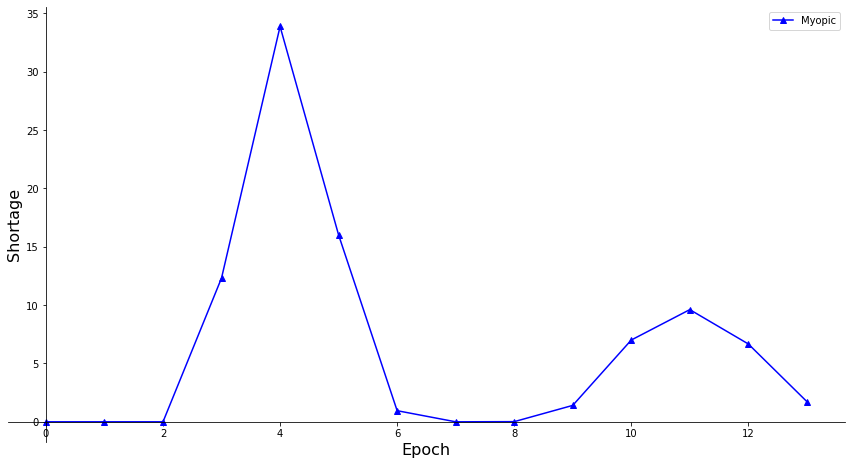

In [ ]:
shortage_epoch_df_Myopic_relative_to_demand=100*shortage_epoch_df_Myopic.div(grouped_demand.values)

#10,000



graph_generator_for_epochs_Myopic(shortage_epoch_df_Myopic_relative_to_demand,'Shortage','Normal')

###### Left-over inventory vs epoch

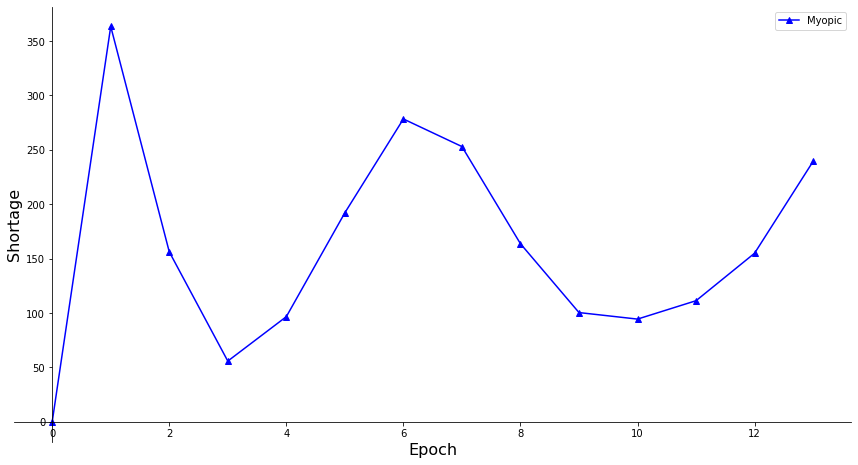

In [ ]:
leftover_epoch_df_Myopic_relative_to_demand=100*leftover_epoch_df_Myopic.div(grouped_demand.values)

#10,000

leftover_epoch_df_Myopic_relative_to_demand.iloc[:,0]=0

graph_generator_for_epochs_Myopic(leftover_epoch_df_Myopic_relative_to_demand,'Shortage','Normal')

## Scenario I: with random ranges of parameters



#### Parameter selection

In [ ]:
# In this section the parameters for ranges of scenarios are defined
#==============================================================================

# How many scenarios do you want?
no_scenarios=100

# SUPPLIER'S CONSTRAINTS:
#====================================
# How many items are in a box:
item_in_box=12
# How many items are in a pallet:
box_in_pallet=1

item_in_pallet= item_in_box * box_in_pallet

# Minimum order
# what is the lower limit for minimum pallet order:
lower_limit_minimum_pallet=1 
# what is the upper limit for minimum pallet order:
upper_limit_minimum_pallet=10 

# Maximum order
# what is the lower limit for maximum pallet order:
lower_limit_maximum_pallet=200 
# what is the upper limit for maximum pallet order:
upper_limit_maximum_pallet=400

# Lead time
# what is the lower limit for lead time of the order:
lower_limit_L=5
# what is the upper limit for lead time of the order:
upper_limit_L=30

# CONSUMPTION'S CONSTRAINTS:
#====================================
# What is the lower limit of coefficient of consumption:
lower_limit_CC=3
# What is the upper limit of coefficient of consumption:
upper_limit_CC=7


# INVENTORY MANAGEMENT CONSTRAINTS:
#====================================
# Capacity of inventory
# What is the lower limit of invernoty capacity (in terms of number of pallet):
lower_limit_invernoty_capacity= 3000
# What is the upper limit of invernoty capacity (in terms of number of pallet):
upper_limit_invernoty_capacity= 6000

# Service level
# What is the lower limit of serivce level (in percent (%)):
lower_limit_service_level= 95
# What is the upper limit of serivce level (in percent (%))
upper_limit_service_level= 99.9


#  DATA SIMULATION CONSTRAINTS:
#====================================

#Do you want to have noise added to the data?
#     'yes'     if you want to add noise to the data 
#     'no'      if you do NOT want to add noise
noise_addition='yes'


# Noise generation 
# What is the lower limit of SNR:
lower_limit_SNR= 2
# What is the upper limit of SNR:
upper_limit_SNR= 10

# Deviation from CC
#SIR_forecast_CC_dev=[0]

#### Scenario creator

In [ ]:
# Forecasting Hospitalization with SIR model
# IMPORTANT NOTE: USER INPUT
# ==============================================================================================

#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
SIR_forecast_df=pd.read_csv('forecast SIR without cumulative-complete 18 epochs.csv')
#setting the date as the index of the dataframe
SIR_forecast_df=SIR_forecast_df.set_index(y.index).drop(columns='Date')
#rounding up the value of forecast in the data frame 
#SIR_forecast_df=np.ceil(SIR_forecast_df)

In [ ]:
#this code will pass a clean table to the loop by removing all the rows of the dataframes

inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()
complete_inventory_results_scenarios=inventory_data_result_scenarios.iloc[0:0].copy()
#inventory_data_result_scenarios = inventory_data_result_scenarios.iloc[0:0].copy()



for scenarios in range(1000):#no_scenarios):
  # Using uniform distribution to randomly choose a value for the following parameters
  inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()

  minimum_pallet = complete_sim_scenarios['Min pallet'][scenarios]
  maximum_pallet = complete_sim_scenarios['Max pallet'][scenarios]
  protocol_coef = complete_sim_scenarios['Protocol coefficient'][scenarios]
  L = complete_sim_scenarios['Lead time'][scenarios]
  inventory_capactiy_in_pallet = complete_sim_scenarios['Inventory capacity (in pallet)'][scenarios]
  service_level = complete_sim_scenarios['Specified service level'][scenarios]
  SNR = complete_sim_scenarios['SNR'][scenarios]
  

  # Calculating the following varibales
  item_in_pallet= item_in_box * box_in_pallet
  suppliers_capacity_min= item_in_pallet * minimum_pallet
  suppliers_capacity_max= item_in_pallet * maximum_pallet
  inventory_capactiy= inventory_capactiy_in_pallet * item_in_pallet


  #this code will pass a clean table to the loop by removing all the rows of the dataframes
  complete_inventory_results=inventory_data_result.iloc[0:0].copy()
  inventory_data_result = inventory_data_result.iloc[0:0].copy()



    #DATA SIMULATION
    #==============================================================================
    #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
    #noise recalculation should only be applied if we have have different coefficient of protocol, 
    #otherwise noise should stya the same, thats why it is outside of the loop
    
  provincial_data_CIHI['daily_consumption']=sim_demand.iloc[:,scenarios]
  provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()


      # >>>USER INPUT<<<
      # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
      # ======================================================================================================
  forecast_data_1 = provincial_data_CIHI.copy()

      # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
  consumption_date_type='daily_consumption'

  y = forecast_data_1[consumption_date_type]
  y_cumulative = forecast_data_1['cumulative_daily_consumption']

      # PERIODIC REVIEW SYSTEM with NAIVE forecasting
      #====================================================================================================================

  inventory_data_periodic_naive = inventory_data.copy()
  inventory_data_periodic_naive.drop(inventory_data_periodic_naive.index[1:],0,inplace=True)


  for i in range(1,math.ceil(len(y)/R)+1):
    y_to_train = y[max(0,i-2)*R:(i)*R]

    y_to_val = y[(i)*R:(i)*R+(R+L)]
        #y_set=y[0:(i+1)*R+(R+L)]
    prediction = naive_forecast_method(y_to_train,y_to_val)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_naive=peridoic_review(y_previous_epoch,inventory_data_periodic_naive,prediction,epoch_no)

      # PERIODIC REVIEW SYSTEM with HOLT forecasting
      #====================================================================================================================

  inventory_data_periodic_Holt = inventory_data
  inventory_data_periodic_Holt.drop(inventory_data_periodic_Holt.index[1:],0,inplace=True)

      #hospitalization_data_type='daily_consumption'

  try:
    hospitalization_data_type=hospitalization_data_type
  except NameError:
    hospitalization_data_type='daily_consumption'

  if hospitalization_data_type=='daily_consumption':
    y_holt=y
  else:
    y_holt=y_cumulative


  for i in range(1,math.ceil(len(y)/R)+1):
    y_to_train = y_holt[0:(i)*R]
    y_to_val = y_holt[(i)*R:(i)*R+(R+L)]
    y_set=y_holt[0:(i)*R+(R+L)]
    y_previous_epoch_holt=y_holt[(i-1)*R:(i)*R]
    prediction = holt(y_set, y_to_train,y_to_val,i,y_previous_epoch_holt)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_Holt=peridoic_review(y_previous_epoch,inventory_data_periodic_Holt,prediction,epoch_no)

    # PERIODIC REVIEW SYSTEM with SIR forecasting model
    #=========================================================================================================

  inventory_data_periodic_SIR = inventory_data.copy()
  inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)


  for i in range(1,math.ceil(len(y)/R)+1):
    y_to_train = y[0:(i)*R]
    y_to_val = y[(i)*R:(i)*R+(R+L)]
    y_set=y[0:(i)*R+(R+L)]
    prediction = SIR_forecast_model(i,y_to_val)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_SIR=peridoic_review(y_previous_epoch,inventory_data_periodic_SIR,prediction,epoch_no)

  # Putting everything into a dataframe
  #=========================================================================================================
  #putting in the main parameters of the scenarios in the data frames
  inventory_data_result_scenarios['Lead time']=L
  inventory_data_result_scenarios['SNR']=SNR
  inventory_data_result_scenarios['Protocol coefficient']=protocol_coef
  inventory_data_result_scenarios['Suppliers minimum capacity']=suppliers_capacity_min
  inventory_data_result_scenarios['Suppliers maximum capacity']=suppliers_capacity_max
  inventory_data_result_scenarios['Inventory capacity']=inventory_capactiy
  inventory_data_result_scenarios['Specified service level']=service_level
    # The total demand/consumption is the same for all methods, so we can pick any of them, in this case, SIR was picked
  inventory_data_result_scenarios['Total demand/consumption']=inventory_data_periodic_SIR['consumption in last epoch'].sum()

  # Puttin the analysis data into the data frame:
  #=========================================================================================================
  results=(inventory_data_periodic_SIR,inventory_data_periodic_Holt,inventory_data_periodic_naive)
  
  for i in range(len(results)):
    inventory_data_result_scenarios.iloc[[0],[(i*18)+7]]=results[i]['shortage'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+8]]=results[i]['current'].iloc[-1],
    inventory_data_result_scenarios.iloc[[0],[(i*18)+9]]=round((1-(results[i]['shortage'] != 0).sum()/len(results[i]['shortage']-1)),2)
    inventory_data_result_scenarios.iloc[[0],[(i*18)+10]]=(results[i]['shortage'] != 0).sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+11]]=results[i]['order'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+12]]=(results[i]['order'] != 0).sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+13]]=results[i]['real cost'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+14]]=results[i]['total cost'].sum()
    # the below command compute average effective percentage bias, by average we specify those epochs that orders can be made
    # if becuase of the lead time, we cannot place an order in a specific epoch (the end epochs) then the percentage bias
    # is not relevent to our study 
    inventory_data_result_scenarios.iloc[[0],[(i*18)+15]]=results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean()
    
    # Counting the effective number of epochs with under-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+16]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] < 0).sum()
    
    # Counting the effective number of epochs with over-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+17]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] > 0).sum()
    
    # Calulating the percentage of effective number of epochs with under-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+18]]=round((inventory_data_result_scenarios.iloc[0][(i*12)+17])*100/((inventory_data_result_scenarios.iloc[0][(i*12)+16])+(inventory_data_result_scenarios.iloc[0][(i*12)+17])),2)

    #Effective RMSE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+19]]=results[i]['std of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean() 
    #RMSE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+20]]=results[i]['std of previous epoch'][1:-1].mean()
    #Effective MAPE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+21]]=results[i]['MAPE'][1:math.floor((len(y)-L)/R)+1].mean() 
    #MAPE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+22]]=results[i]['MAPE'][1:-1].mean()
    #Effective MAE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+23]]=results[i]['MAE'][1:math.floor((len(y)-L)/R)+1].mean() 
    #MAE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+24]]=results[i]['MAE'][1:-1].mean()

  SIR_epochs_bias=((results[0].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('SIR percentage bias of epoch: ')
  Holt_epochs_bias=((results[1].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Holt percentage bias of epoch: ')
  Naive_epochs_bias=((results[2].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Naive percentage bias of epoch: ')
  
  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_bias,
                                             Holt_epochs_bias,
                                             Naive_epochs_bias],axis=1)

  SIR_epochs_shortage=(results[0].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('SIR shortage of epoch: ')
  Holt_epochs_shortage=(results[1].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Holt shortage of epoch: ')
  Naive_epochs_shortage=(results[2].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Naive shortage of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_shortage,
                                             Holt_epochs_shortage,
                                             Naive_epochs_shortage],axis=1)

  SIR_epochs_leftover_in=(results[0].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('SIR left-over inventory of epoch: ')
  Holt_epochs_leftover_in=(results[1].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Holt left-over inventory of epoch: ')
  Naive_epochs_leftover_in=(results[2].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Naive left-over inventory of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_leftover_in,
                                             Holt_epochs_leftover_in,
                                             Naive_epochs_leftover_in],axis=1)
  SIR_order=(results[0].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('SIR order of epoch: ')
  Holt_order=(results[1].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Holt order of epoch: ')
  Naive_order=(results[2].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Naive order of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order,
                                              Holt_order,
                                              Naive_order],axis=1)
  
  SIR_order_actual=(results[0].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('SIR order actual of epoch: ')
  Holt_order_actual=(results[1].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Holt order actual of epoch: ')
  Naive_order_actual=(results[2].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Naive order actual of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order_actual,
                                              Holt_order_actual,
                                              Naive_order_actual],axis=1)


  SIR_order_actual=(results[0].iloc[:,[16]].T.reset_index()).iloc[:,1:].add_prefix('SIR safety stock of epoch: ')
  Holt_order_actual=(results[1].iloc[:,[16]].T.reset_index()).iloc[:,1:].add_prefix('Holt safety stock of epoch: ')
  Naive_order_actual=(results[2].iloc[:,[16]].T.reset_index()).iloc[:,1:].add_prefix('Naive safety stock of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order_actual,
                                              Holt_order_actual,
                                              Naive_order_actual],axis=1)


  SIR_order_actual=(results[0].iloc[:,[17]].T.reset_index()).iloc[:,1:].add_prefix('SIR z service level of epoch: ')
  Holt_order_actual=(results[1].iloc[:,[17]].T.reset_index()).iloc[:,1:].add_prefix('Holt z service level of epoch: ')
  Naive_order_actual=(results[2].iloc[:,[17]].T.reset_index()).iloc[:,1:].add_prefix('Naive z service level of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order_actual,
                                              Holt_order_actual,
                                              Naive_order_actual],axis=1)


  SIR_order_actual=(results[0].iloc[:,[18]].T.reset_index()).iloc[:,1:].add_prefix('SIR standard dev of epoch: ')
  Holt_order_actual=(results[1].iloc[:,[18]].T.reset_index()).iloc[:,1:].add_prefix('Holt standard dev of epoch: ')
  Naive_order_actual=(results[2].iloc[:,[18]].T.reset_index()).iloc[:,1:].add_prefix('Naive standard dev of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order_actual,
                                              Holt_order_actual,
                                              Naive_order_actual],axis=1)




  #inventory_data_result_scenarios  
  complete_inventory_results_scenarios=complete_inventory_results_scenarios.append([inventory_data_result_scenarios],ignore_index=True)


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimizat

In [ ]:
#Exporting the data into the a csv file which will be saved into the drive
complete_inventory_results_scenarios.to_csv('Inventory management results with %s scenarios(un-touched data) 2.csv'%(no_scenarios))

In [ ]:
complete_inventory_results_scenarios

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,...,Naive standard dev of epoch: 9,Naive standard dev of epoch: 10,Naive standard dev of epoch: 11,Naive standard dev of epoch: 12,Naive standard dev of epoch: 13,Naive standard dev of epoch: 14,Naive standard dev of epoch: 15,Naive standard dev of epoch: 16,Naive standard dev of epoch: 17,Naive standard dev of epoch: 18
0,10,3,6.50000000,6400,207200,2629600,0.97100000,0,38451.00000000,1.00000000,...,225.18000000,271.94000000,386.15000000,652.59000000,846.19000000,585.55000000,537.71000000,325.53000000,202.45000000,108.04000000
1,15,9,4.00000000,7200,192800,4532800,0.95800000,0,50958.00000000,1.00000000,...,116.63000000,163.10000000,240.04000000,291.18000000,321.65000000,300.07000000,207.37000000,153.06000000,92.60000000,60.81000000
2,13,3,5.00000000,8000,207200,4503200,0.95500000,6,47060.00000000,0.95000000,...,207.77000000,351.97000000,421.13000000,368.23000000,493.13000000,586.93000000,361.53000000,214.77000000,221.83000000,83.48000000
3,28,9,6.00000000,1600,308000,3559200,0.99500000,236,396518.00000000,0.89000000,...,155.49000000,386.66000000,483.49000000,558.95000000,598.75000000,476.04000000,317.61000000,241.59000000,154.27000000,91.89000000
4,18,4,5.50000000,4800,225600,3330400,0.96600000,118,126377.00000000,0.89000000,...,162.74000000,375.46000000,453.35000000,579.10000000,658.34000000,407.21000000,344.73000000,213.56000000,160.79000000,129.20000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,24,6,6.50000000,5600,254400,4425600,0.97500000,381,257440.00000000,0.84000000,...,146.27000000,283.60000000,463.97000000,597.34000000,683.39000000,528.95000000,363.98000000,376.10000000,134.23000000,106.13000000
996,5,5,5.00000000,8000,190400,4588800,0.99600000,0,7925.00000000,1.00000000,...,128.39000000,226.56000000,296.52000000,397.28000000,349.26000000,420.13000000,268.75000000,230.63000000,120.74000000,85.38000000
997,8,7,6.00000000,2400,196000,3492800,0.96300000,772,26800.00000000,0.89000000,...,182.91000000,244.01000000,303.12000000,381.07000000,397.08000000,488.36000000,288.53000000,230.25000000,149.47000000,86.54000000
998,8,9,3.50000000,6400,314400,4532000,0.97400000,0,9955.00000000,1.00000000,...,112.71000000,128.98000000,230.84000000,293.28000000,285.20000000,266.96000000,158.60000000,125.89000000,99.12000000,54.81000000


#### Results

##### Import Data 

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
complete_inventory_results_scenarios=pd.read_csv('Inventory management results with 10000 scenarios(un-touched data).csv')
#setting the date as the index of the dataframe
complete_inventory_results_scenarios=complete_inventory_results_scenarios.drop(columns='Unnamed: 0')
complete_inventory_results_scenarios=complete_inventory_results_scenarios.iloc[:1000,:]

##### Presentation of results

###### Data filtering

In [ ]:
#creating a separet daraframe in order to not touch the original copy
df_temp_present=complete_inventory_results_scenarios.copy()

# SHORTAGE
#============================================
# filtering the data for sepcified category
shortage_epoch_df_SIR=df_temp_present[df_temp_present.columns[pd.Series(df_temp_present.columns).str.startswith('SIR shortage of epoch')]]
shortage_epoch_df_Holt=df_temp_present[df_temp_present.columns[pd.Series(df_temp_present.columns).str.startswith('Holt shortage of epoch')]]
shortage_epoch_df_Naive=df_temp_present[df_temp_present.columns[pd.Series(df_temp_present.columns).str.startswith('Naive shortage of epoch')]]


# Left-over inventory
#============================================
# filtering the data for sepcified category
leftover_epoch_df_SIR=df_temp_present[df_temp_present.columns[pd.Series(df_temp_present.columns).str.startswith('SIR left-over inventory of epoch')]]
leftover_epoch_df_Holt=df_temp_present[df_temp_present.columns[pd.Series(df_temp_present.columns).str.startswith('Holt left-over inventory of epoch')]]
leftover_epoch_df_Naive=df_temp_present[df_temp_present.columns[pd.Series(df_temp_present.columns).str.startswith('Naive left-over inventory of epoch')]]

# Bais-over inventory
#============================================
# filtering the data for sepcified category
bias_epoch_df_SIR=df_temp_present[df_temp_present.columns[pd.Series(df_temp_present.columns).str.startswith('SIR percentage bias of epoch')]]
bias_epoch_df_Holt=df_temp_present[df_temp_present.columns[pd.Series(df_temp_present.columns).str.startswith('Holt percentage bias of epoch')]]
bias_epoch_df_Naive=df_temp_present[df_temp_present.columns[pd.Series(df_temp_present.columns).str.startswith('Naive percentage bias of epoch')]]

In [ ]:
grouped_demand=sim_demand.reset_index().rename(columns = {'index':'date'}, inplace = False)
grouped_demand['Date'] = pd.to_datetime(grouped_demand['Date'],format='%Y-%m-%d')
grouped_demand=(grouped_demand.groupby(grouped_demand.index // R).sum())
# adding a row of zero for time zero
grouped_demand.loc[len(grouped_demand)] = 0
grouped_demand = round(grouped_demand.shift()).apply(np.int64)
grouped_demand.loc[0] = 0
grouped_demand=grouped_demand.T.replace(0,1)
grouped_demand=grouped_demand.iloc[:1000,:]

###### Shortage vs epoch

In [ ]:
shortage_epoch_df_SIR_relative_to_demand=100*shortage_epoch_df_SIR.div(grouped_demand.values)
shortage_epoch_df_Holt_relative_to_demand=100*shortage_epoch_df_Holt.div(grouped_demand.values)
shortage_epoch_df_Naive_relative_to_demand=100*shortage_epoch_df_Naive.div(grouped_demand.values)

In [ ]:

graph_generator_for_epochs_Myopic_1(shortage_epoch_df_SIR_relative_to_demand,
                                    shortage_epoch_df_Holt_relative_to_demand,
                                    shortage_epoch_df_Naive_relative_to_demand,
                                    shortage_epoch_df_Myopic_relative_to_demand,'Shortage','Normal')

NameError: ignored

In [ ]:
#10,000

shortage_epoch_df_SIR_relative_to_demand=100*shortage_epoch_df_SIR.div(grouped_demand.values)
shortage_epoch_df_Holt_relative_to_demand=100*shortage_epoch_df_Holt.div(grouped_demand.values)
shortage_epoch_df_Naive_relative_to_demand=100*shortage_epoch_df_Naive.div(grouped_demand.values)


graph_generator_for_epochs(shortage_epoch_df_SIR_relative_to_demand,
                           shortage_epoch_df_Holt_relative_to_demand,
                           shortage_epoch_df_Naive_relative_to_demand,'Shortage','Normal')

In [ ]:
#100
graph_generator_for_epochs(shortage_epoch_df_SIR,shortage_epoch_df_Holt,shortage_epoch_df_Naive,'Shortage','normal')

###### Left-over inventory vs epoch

In [ ]:
leftover_epoch_df_SIR_relative_to_demand=100*leftover_epoch_df_SIR.div(grouped_demand.values)
leftover_epoch_df_Holt_relative_to_demand=100*leftover_epoch_df_Holt.div(grouped_demand.values)
leftover_epoch_df_Naive_relative_to_demand=100*leftover_epoch_df_Naive.div(grouped_demand.values)

leftover_epoch_df_SIR_relative_to_demand.iloc[:,0]=0
leftover_epoch_df_Holt_relative_to_demand.iloc[:,0]=0
leftover_epoch_df_Naive_relative_to_demand.iloc[:,0]=0

In [ ]:


#10,000
graph_generator_for_epochs_Myopic_1(leftover_epoch_df_SIR_relative_to_demand,
                                    leftover_epoch_df_Holt_relative_to_demand,
                                    leftover_epoch_df_Naive_relative_to_demand,
                                    leftover_epoch_df_Myopic_relative_to_demand,'Inventory level','normal')

NameError: ignored

In [ ]:
#10,000
graph_generator_for_epochs(leftover_epoch_df_SIR_relative_to_demand,leftover_epoch_df_Holt_relative_to_demand,leftover_epoch_df_Naive_relative_to_demand,'Inventory level','normal')

In [ ]:
#n100
graph_generator_for_epochs(leftover_epoch_df_SIR,leftover_epoch_df_Holt,leftover_epoch_df_Naive,'Inventory level','normal')

###### Percentage bias vs epoch

In [ ]:
#10,000
graph_generator_for_epochs(bias_epoch_df_SIR,bias_epoch_df_Holt,bias_epoch_df_Naive,'Percentage bias')

In [ ]:
#100
graph_generator_for_epochs(bias_epoch_df_SIR,bias_epoch_df_Holt,bias_epoch_df_Naive,'Percentage bias')

###### Shortage vs. final inventory

In [ ]:



fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111)

x_plot=complete_inventory_results_scenarios['SIR forecast: Shortage']
y_plot=complete_inventory_results_scenarios['SIR forecast: Inventory level at the end']
plt.scatter(x_plot, y_plot, color = 'red',label='SIR forecast',marker='o')

x_plot=complete_inventory_results_scenarios['Holt forecast: Shortage']
y_plot=complete_inventory_results_scenarios['Holt forecast: Inventory level at the end']
plt.scatter(x_plot, y_plot, color = 'blue',label='Holt forecast',marker='x')

x_plot=complete_inventory_results_scenarios['Naive forecast: Shortage']
y_plot=complete_inventory_results_scenarios['Naive forecast: Inventory level at the end']
plt.scatter(x_plot, y_plot, color = 'green',label='Naive forecast',marker='^')

plt.title('%s scnearios of inventory management in British Columbia'%(no_scenarios),fontsize=16)
plt.xlabel('Shortage',fontsize=16)
plt.ylabel('Final inventory',fontsize=16)
plt.legend(fontsize=13)

plt.show()


## Scenario II: Simulation process "Replenished-Data"; Granularity; Variable Period_info

### Scenario creator

In [ ]:
# we will run this just once
variable_period_info_df=pd.read_csv('variable 10000 period info.csv')
variable_period_info_df=variable_period_info_df.drop(columns='Unnamed: 0')
variable_period_info_df=variable_period_info_df.reset_index()
variable_period_info_df['index']=0
variable_period_info_df.columns=list(range(len(variable_period_info_df.columns)))
#variable_period_info_df

In [ ]:
# temperoray code:
#================================
#iteration_0=pd.read_csv('result of SIR forecast iteration 0.csv')
#iteration_1=pd.read_csv('result of SIR forecast iteration 1.csv')
#df_SIR_forecast_results_variable=iteration_0.append(iteration_1,sort=False)

# Activate this code:
#================================
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
df_SIR_forecast_results_variable=pd.read_csv('SIR forecast variable 1000.csv')
#setting the date as the index of the dataframe


#df_SIR_forecast_results_variable=df_SIR_forecast_results_variable.rename(columns={'Unnamed: 0':'Date'})
#setting the date as the index of the dataframe
df_SIR_forecast_results_variable=df_SIR_forecast_results_variable.set_index(df_SIR_forecast_results_variable['date'])

df_SIR_forecast_results_variable.drop(df_SIR_forecast_results_variable.columns[0], axis=1, inplace=True)

In [ ]:
start_rep_array=870
end_rep_array=880
end_rep_array

880

In [ ]:

no_scenarios=1000
#this code will pass a clean table to the loop by removing all the rows of the dataframes

#inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()
#complete_inventory_results_scenarios_replenished=inventory_data_result_scenarios.iloc[0:0].copy()
#inventory_data_result_scenarios = inventory_data_result_scenarios.iloc[0:0].copy()

inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()
complete_inventory_results_scenarios_replenished_variable=inventory_data_result_scenarios.iloc[0:0].copy()



for va_rep_no in range(start_rep_array,end_rep_array):

  complete_inventory_results_scenarios_replenished=inventory_data_result_scenarios.iloc[0:0].copy()


  # PERIOD INFO SELECTION
  #=============================================================
  # Selecting period info of the iteration 'scenarios' 
  # Finding the correct period_info for the desired iteration:
  variable_period_info_it_i=(variable_period_info_df.iloc[va_rep_no,:].to_frame()).dropna()
  # cumsum the day to get the day when the data is arriving 
  variable_period_info_it_i['day of data arrival']=(variable_period_info_it_i.iloc[:,0]).cumsum()
  
  # SIR forecast selection
  #=============================================================
  SIR_forecast_df=df_SIR_forecast_results_variable[va_rep_no*len(y):(va_rep_no+1)*len(y)].dropna(axis=1)


  #for scenarios in range(no_scenarios):
  for scenarios in range(no_scenarios):
    # Using uniform distribution to randomly choose a value for the following parameters
    inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()

    minimum_pallet = complete_sim_scenarios['Min pallet'][scenarios]
    maximum_pallet = complete_sim_scenarios['Max pallet'][scenarios]
    protocol_coef = complete_sim_scenarios['Protocol coefficient'][scenarios]
    L = complete_sim_scenarios['Lead time'][scenarios]
    inventory_capactiy_in_pallet = complete_sim_scenarios['Inventory capacity (in pallet)'][scenarios]
    service_level = complete_sim_scenarios['Specified service level'][scenarios]
    SNR = complete_sim_scenarios['SNR'][scenarios]
    

    # Calculating the following varibales
    item_in_pallet= item_in_box * box_in_pallet
    suppliers_capacity_min= item_in_pallet * minimum_pallet
    suppliers_capacity_max= item_in_pallet * maximum_pallet
    inventory_capactiy= inventory_capactiy_in_pallet * item_in_pallet


    #this code will pass a clean table to the loop by removing all the rows of the dataframes
    complete_inventory_results=inventory_data_result.iloc[0:0].copy()
    inventory_data_result = inventory_data_result.iloc[0:0].copy()



      #DATA SIMULATION
      #==============================================================================
      #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
      #noise recalculation should only be applied if we have have different coefficient of protocol, 
      #otherwise noise should stya the same, thats why it is outside of the loop
      
    provincial_data_CIHI['daily_consumption']=sim_demand.iloc[:,scenarios]
    provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()


    # >>>USER INPUT<<<
    # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
    # ======================================================================================================
    forecast_data_1 = provincial_data_CIHI.copy()

        # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
    consumption_date_type='daily_consumption'

    y = forecast_data_1[consumption_date_type]

    # this code will grouped the data based on the period info
    y_replenishement=replenished_func_variable_period_info(y,va_rep_no)  





    # PERIODIC REVIEW SYSTEM with NAIVE forecasting
    #====================================================================================================================

    inventory_data_periodic_naive = inventory_data.copy()
    inventory_data_periodic_naive.drop(inventory_data_periodic_naive.index[1:],0,inplace=True)

    #number of periods that needs to be reviewed to find max value based on the specified period_info
    #no_period_for_naive_max=math.ceil(2*R/period_info)

    for i in range(1,math.ceil(len(y)/R)+1):

      days_in_epoch_i=len(y[0:(i)*R])

      # this line finds how many period_info have passed for the days in the epoch 'i'
      # using the between function, we check the number of days in each period_info to see if they are between (0,days_in_epoch_i)
      # it will return the bolyan value, we will then get the index of those which are 'True' and the max of these values
      # is the last period_info in the epoch i 
      upper_limit_period_info=variable_period_info_it_i['day of data arrival'].between(0,days_in_epoch_i)
      upper_limit_period_info=int((upper_limit_period_info[upper_limit_period_info].index.values ).max())

      lower_limit_period_info=variable_period_info_it_i['day of data arrival'].between(max(0,variable_period_info_it_i['day of data arrival'][upper_limit_period_info]-2*R),days_in_epoch_i)
      lower_limit_period_info=int((lower_limit_period_info[lower_limit_period_info].index.values ).min())

      upper_limit_period_info
      lower_limit_period_info

      upper_day=variable_period_info_it_i['day of data arrival'][upper_limit_period_info]


      if (upper_day-variable_period_info_it_i['day of data arrival'][lower_limit_period_info]) <2*R:
        lower_day=variable_period_info_it_i['day of data arrival'][max(0,lower_limit_period_info-1)]
      else:
        lower_day=variable_period_info_it_i['day of data arrival'][lower_limit_period_info]


      y_to_train = y_replenishement[int(lower_day):int(upper_day)]
      y_to_val = y[(i)*R:(i)*R+(R+L)]
      y_set=y[0:(i)*R+(R+L)]

      prediction_naive = naive_forecast_method_replenished_variable(y_to_train,y_to_val)


      y_previous_epoch=y[(i-1)*R:(i)*R]
      epoch_no=i
      inventory_data_periodic_naive=peridoic_review(y_previous_epoch,
                                                    inventory_data_periodic_naive,
                                                    prediction_naive,
                                                    epoch_no)

    # PERIODIC REVIEW SYSTEM with HOLT forecasting
    #====================================================================================================================

    inventory_data_periodic_Holt = inventory_data
    inventory_data_periodic_Holt.drop(inventory_data_periodic_Holt.index[1:],0,inplace=True)

        #hospitalization_data_type='daily_consumption'

    try:
      holt_data=holt_data_type
    except NameError:
      holt_data='normal'


    for i in range(1,math.ceil(len(y)/R)+1):
      
      days_in_epoch_i=len(y[0:(i)*R])

      # this line finds how many period_info have passed for the days in the epoch 'i'
      # using the between function, we check the number of days in each period_info to see if they are between (0,days_in_epoch_i)
      # it will return the bolyan value, we will then get the index of those which are 'True' and the max of these values
      # is the last period_info in the epoch i 
      upper_limit_period_info=variable_period_info_it_i['day of data arrival'].between(0,days_in_epoch_i)
      upper_limit_period_info=int((upper_limit_period_info[upper_limit_period_info].index.values ).max())

      upper_day=variable_period_info_it_i['day of data arrival'][upper_limit_period_info]

      y_to_train = y_replenishement[0:int(upper_day)]
      y_to_val = y[(i)*R:(i)*R+(R+L)]
      y_set=y[0:(i)*R+(R+L)]

      prediction_holt = holt_4(y_set, y_to_train,y_to_val)

      y_previous_epoch_holt=y[(i-1)*R:(i)*R]
      epoch_no=i
      inventory_data_periodic_Holt=peridoic_review(y_previous_epoch_holt,
                                                    inventory_data_periodic_Holt,
                                                    prediction_holt,
                                                    epoch_no)

      # PERIODIC REVIEW SYSTEM with SIR forecasting model
      #=========================================================================================================

    inventory_data_periodic_SIR = inventory_data.copy()
    inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)


    for i in range(1,math.ceil(len(y)/R)+1):
      #y_to_train = y[0:(i)*R]
      #y_to_val = y[(i)*R:(i)*R+(R+L)]
      #y_set=y[0:(i)*R+(R+L)]
      #prediction = SIR_forecast_model(i,y_to_val)

      # number of days in epoch i:
      days_in_epoch_i=len(y[0:(i)*R])

      upper_limit_period_info=variable_period_info_it_i['day of data arrival'].between(0,days_in_epoch_i)
      # vpi: variable period info
      # this is the column where the code has to pick from the 'SIR_forecast_df' of this specific iteration
      upper_epoch_vpi=int((upper_limit_period_info[upper_limit_period_info].index.values ).max())

      y_to_val = y[(i)*R:(i)*R+(R+L)]
      prediction = SIR_forecast_model_variable_period_info(upper_epoch_vpi,y_to_val,i)
      
      y_previous_epoch=y[(i-1)*R:(i)*R]
      epoch_no=i
      inventory_data_periodic_SIR=peridoic_review(y_previous_epoch,inventory_data_periodic_SIR,prediction,epoch_no)

    # Putting everything into a dataframe
    #=========================================================================================================
    #putting in the main parameters of the scenarios in the data frames
    inventory_data_result_scenarios['Lead time']=L
    inventory_data_result_scenarios['SNR']=SNR
    inventory_data_result_scenarios['Protocol coefficient']=protocol_coef
    inventory_data_result_scenarios['Suppliers minimum capacity']=suppliers_capacity_min
    inventory_data_result_scenarios['Suppliers maximum capacity']=suppliers_capacity_max
    inventory_data_result_scenarios['Inventory capacity']=inventory_capactiy
    inventory_data_result_scenarios['Specified service level']=service_level
      # The total demand/consumption is the same for all methods, so we can pick any of them, in this case, SIR was picked
    inventory_data_result_scenarios['Total demand/consumption']=inventory_data_periodic_SIR['consumption in last epoch'].sum()

    # Puttin the analysis data into the data frame:
    #=========================================================================================================
    results=(inventory_data_periodic_SIR,inventory_data_periodic_Holt,inventory_data_periodic_naive)
    
    for i in range(len(results)):
      inventory_data_result_scenarios.iloc[[0],[(i*18)+7]]=results[i]['shortage'].sum()
      inventory_data_result_scenarios.iloc[[0],[(i*18)+8]]=results[i]['current'].iloc[-1]
      inventory_data_result_scenarios.iloc[[0],[(i*18)+9]]=round((1-(results[i]['shortage'] != 0).sum()/len(results[i]['shortage']-1)),2)
      inventory_data_result_scenarios.iloc[[0],[(i*18)+10]]=(results[i]['shortage'] != 0).sum()
      inventory_data_result_scenarios.iloc[[0],[(i*18)+11]]=results[i]['order'].sum()
      inventory_data_result_scenarios.iloc[[0],[(i*18)+12]]=(results[i]['order'] != 0).sum()
      inventory_data_result_scenarios.iloc[[0],[(i*18)+13]]=results[i]['real cost'].sum()
      inventory_data_result_scenarios.iloc[[0],[(i*18)+14]]=results[i]['total cost'].sum()
      # the below command compute average effective percentage bias, by average we specify those epochs that orders can be made
      # if becuase of the lead time, we cannot place an order in a specific epoch (the end epochs) then the percentage bias
      # is not relevent to our study 
      inventory_data_result_scenarios.iloc[[0],[(i*18)+15]]=results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean()
      
      # Counting the effective number of epochs with under-forecast
      inventory_data_result_scenarios.iloc[[0],[(i*18)+16]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] < 0).sum()
      
      # Counting the effective number of epochs with over-forecast
      inventory_data_result_scenarios.iloc[[0],[(i*18)+17]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] > 0).sum()
      
      # Calulating the percentage of effective number of epochs with under-forecast
      inventory_data_result_scenarios.iloc[[0],[(i*18)+18]]=round((inventory_data_result_scenarios.iloc[0][(i*18)+17])*100/((inventory_data_result_scenarios.iloc[0][(i*18)+16])+(inventory_data_result_scenarios.iloc[0][(i*18)+17])),2)

      #Effective RMSE
      inventory_data_result_scenarios.iloc[[0],[(i*18)+19]]=results[i]['std of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean() 
      #RMSE
      inventory_data_result_scenarios.iloc[[0],[(i*18)+20]]=results[i]['std of previous epoch'][1:-1].mean()
      #Effective MAPE
      inventory_data_result_scenarios.iloc[[0],[(i*18)+21]]=results[i]['MAPE'][1:math.floor((len(y)-L)/R)+1].mean() 
      #MAPE
      inventory_data_result_scenarios.iloc[[0],[(i*18)+22]]=results[i]['MAPE'][1:-1].mean()
      #Effective MAE
      inventory_data_result_scenarios.iloc[[0],[(i*18)+23]]=results[i]['MAE'][1:math.floor((len(y)-L)/R)+1].mean() 
      #MAE
      inventory_data_result_scenarios.iloc[[0],[(i*18)+24]]=results[i]['MAE'][1:-1].mean()

    SIR_epochs_bias=((results[0].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('SIR percentage bias of epoch: ')
    Holt_epochs_bias=((results[1].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Holt percentage bias of epoch: ')
    Naive_epochs_bias=((results[2].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Naive percentage bias of epoch: ')
    
    inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_epochs_bias,
                                              Holt_epochs_bias,
                                              Naive_epochs_bias],axis=1)

    SIR_epochs_shortage=(results[0].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('SIR shortage of epoch: ')
    Holt_epochs_shortage=(results[1].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Holt shortage of epoch: ')
    Naive_epochs_shortage=(results[2].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Naive shortage of epoch: ')

    inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_epochs_shortage,
                                              Holt_epochs_shortage,
                                              Naive_epochs_shortage],axis=1)

    SIR_epochs_leftover_in=(results[0].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('SIR left-over inventory of epoch: ')
    Holt_epochs_leftover_in=(results[1].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Holt left-over inventory of epoch: ')
    Naive_epochs_leftover_in=(results[2].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Naive left-over inventory of epoch: ')

    inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_epochs_leftover_in,
                                              Holt_epochs_leftover_in,
                                              Naive_epochs_leftover_in],axis=1)
    SIR_order=(results[0].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('SIR order of epoch: ')
    Holt_order=(results[1].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Holt order of epoch: ')
    Naive_order=(results[2].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Naive order of epoch: ')

    inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                                SIR_order,
                                                Holt_order,
                                                Naive_order],axis=1)
    
    SIR_order_actual=(results[0].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('SIR order actual of epoch: ')
    Holt_order_actual=(results[1].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Holt order actual of epoch: ')
    Naive_order_actual=(results[2].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Naive order actual of epoch: ')

    inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                                SIR_order_actual,
                                                Holt_order_actual,
                                                Naive_order_actual],axis=1)

    #inventory_data_result_scenarios  
    complete_inventory_results_scenarios_replenished=complete_inventory_results_scenarios_replenished.append([inventory_data_result_scenarios],ignore_index=True)
  
  complete_inventory_results_scenarios_replenished_variable=complete_inventory_results_scenarios_replenished_variable.append([complete_inventory_results_scenarios_replenished],ignore_index=True)




complete_inventory_results_scenarios_replenished_variable.to_csv('Results of var replenished %dto%d.csv'%(start_rep_array,end_rep_array))




Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq

In [ ]:
complete_inventory_results_scenarios_replenished_variable.to_csv('Results of var replenished %dto%d.csv'%(start_rep_array,end_rep_array))

In [ ]:
complete_inventory_results_scenarios_replenished_variable

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,SIR forecast: Number of epochs with shortage,SIR forecast: Total number of units ordered,SIR forecast: Number of orders,SIR forecast: Real cost,SIR forecast: Total cost,SIR forecast: Average effective percentage bias,SIR forecast: Effective no. of epochs with under-forecast,SIR forecast: Effective no. of epochs with over-forecast,SIR forecast: Percentage of Effective no. of epochs with over-forecast,SIR forecast: Effective RMSE,SIR forecast: RMSE,SIR forecast: Effective MAPE,SIR forecast: MAPE,SIR forecast: Effective MAE,SIR forecast: MAE,Holt forecast: Shortage,Holt forecast: Inventory level at the end,Holt forecast: Achieved service level,Holt forecast: Number of epochs with shortage,Holt forecast: Total number of units ordered,Holt forecast: Number of orders,Holt forecast: Real cost,Holt forecast: Total cost,Holt forecast: Average effective percentage bias,Holt forecast: Effective no. of epochs with under-forecast,Holt forecast: Effective no. of epochs with over-forecast,Holt forecast: Percentage of Effective no. of epochs with over-forecast,Holt forecast: Effective RMSE,Holt forecast: RMSE,Holt forecast: Effective MAPE,...,SIR order actual of epoch: 17,SIR order actual of epoch: 18,Holt order actual of epoch: 0,Holt order actual of epoch: 1,Holt order actual of epoch: 2,Holt order actual of epoch: 3,Holt order actual of epoch: 4,Holt order actual of epoch: 5,Holt order actual of epoch: 6,Holt order actual of epoch: 7,Holt order actual of epoch: 8,Holt order actual of epoch: 9,Holt order actual of epoch: 10,Holt order actual of epoch: 11,Holt order actual of epoch: 12,Holt order actual of epoch: 13,Holt order actual of epoch: 14,Holt order actual of epoch: 15,Holt order actual of epoch: 16,Holt order actual of epoch: 17,Holt order actual of epoch: 18,Naive order actual of epoch: 0,Naive order actual of epoch: 1,Naive order actual of epoch: 2,Naive order actual of epoch: 3,Naive order actual of epoch: 4,Naive order actual of epoch: 5,Naive order actual of epoch: 6,Naive order actual of epoch: 7,Naive order actual of epoch: 8,Naive order actual of epoch: 9,Naive order actual of epoch: 10,Naive order actual of epoch: 11,Naive order actual of epoch: 12,Naive order actual of epoch: 13,Naive order actual of epoch: 14,Naive order actual of epoch: 15,Naive order actual of epoch: 16,Naive order actual of epoch: 17,Naive order actual of epoch: 18
0,10,3,6.50000000,96,3108,39444,0.97100000,8722,2261,0.58000000,8,25488,10,381612.50000000,904932.50000000,-17.53125000,13,3,18.75000000,295.19937500,278.86882353,105.81500000,104.18647059,251.54000000,237.34294118,9922,9929,0.42000000,11,31956,14,453803.00000000,1049123.00000000,227.98937500,9,7,43.75000000,355.61625000,371.10705882,318.03937500,...,0.00000000,0.00000000,0.00000000,0.00000000,78.00000000,459.00000000,558.00000000,818.00000000,2017.00000000,4914.00000000,6173.00000000,6576.00000000,15779.00000000,13566.00000000,15188.00000000,16939.00000000,11786.00000000,8851.00000000,3071.00000000,0.00000000,0.00000000,0.00000000,0.00000000,78.00000000,459.00000000,558.00000000,729.00000000,1917.00000000,4642.00000000,5785.00000000,6063.00000000,14675.00000000,11149.00000000,10935.00000000,11054.00000000,8863.00000000,6899.00000000,1279.00000000,0.00000000,0.00000000
1,15,9,4.00000000,108,2892,67992,0.95800000,1719,4057,0.74000000,5,21780,9,323988.00000000,427128.00000000,47.22533333,11,4,26.67000000,274.72266667,244.75647059,153.22533333,151.24411765,187.94533333,167.68294118,3379,13553,0.58000000,8,29616,13,391014.50000000,593754.50000000,120.10600000,9,6,40.00000000,224.27200000,240.26294118,219.02600000,...,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,344.00000000,461.00000000,1105.00000000,1782.00000000,4107.00000000,4562.00000000,4980.00000000,

In [ ]:
complete_inventory_results_scenarios_replenished

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,SIR forecast: Number of epochs with shortage,SIR forecast: Total number of units ordered,SIR forecast: Number of orders,SIR forecast: Real cost,SIR forecast: Total cost,SIR forecast: Average effective percentage bias,SIR forecast: Effective no. of epochs with under-forecast,SIR forecast: Effective no. of epochs with over-forecast,SIR forecast: Percentage of Effective no. of epochs with over-forecast,SIR forecast: Effective RMSE,SIR forecast: RMSE,SIR forecast: Effective MAPE,SIR forecast: MAPE,SIR forecast: Effective MAE,SIR forecast: MAE,Holt forecast: Shortage,Holt forecast: Inventory level at the end,Holt forecast: Achieved service level,Holt forecast: Number of epochs with shortage,Holt forecast: Total number of units ordered,Holt forecast: Number of orders,Holt forecast: Real cost,Holt forecast: Total cost,Holt forecast: Average effective percentage bias,Holt forecast: Effective no. of epochs with under-forecast,Holt forecast: Effective no. of epochs with over-forecast,Holt forecast: Percentage of Effective no. of epochs with over-forecast,Holt forecast: Effective RMSE,Holt forecast: RMSE,Holt forecast: Effective MAPE,...,SIR order actual of epoch: 17,SIR order actual of epoch: 18,Holt order actual of epoch: 0,Holt order actual of epoch: 1,Holt order actual of epoch: 2,Holt order actual of epoch: 3,Holt order actual of epoch: 4,Holt order actual of epoch: 5,Holt order actual of epoch: 6,Holt order actual of epoch: 7,Holt order actual of epoch: 8,Holt order actual of epoch: 9,Holt order actual of epoch: 10,Holt order actual of epoch: 11,Holt order actual of epoch: 12,Holt order actual of epoch: 13,Holt order actual of epoch: 14,Holt order actual of epoch: 15,Holt order actual of epoch: 16,Holt order actual of epoch: 17,Holt order actual of epoch: 18,Naive order actual of epoch: 0,Naive order actual of epoch: 1,Naive order actual of epoch: 2,Naive order actual of epoch: 3,Naive order actual of epoch: 4,Naive order actual of epoch: 5,Naive order actual of epoch: 6,Naive order actual of epoch: 7,Naive order actual of epoch: 8,Naive order actual of epoch: 9,Naive order actual of epoch: 10,Naive order actual of epoch: 11,Naive order actual of epoch: 12,Naive order actual of epoch: 13,Naive order actual of epoch: 14,Naive order actual of epoch: 15,Naive order actual of epoch: 16,Naive order actual of epoch: 17,Naive order actual of epoch: 18
0,10,3,6.50000000,96,3108,39444,0.97100000,10246,3713,0.68000000,6,25416,12,365770.50000000,980530.50000000,727.40250000,11,5,31.25000000,1581.73375000,1489.54058824,803.75375000,758.66235294,1107.91687500,1042.84529412,8854,9929,0.53000000,9,33024,14,469185.00000000,1000425.00000000,144.15437500,10,6,37.50000000,289.06812500,288.29176471,198.08937500,...,0.00000000,0.00000000,0.00000000,0.00000000,397.00000000,523.00000000,454.00000000,677.00000000,2969.00000000,4474.00000000,5445.00000000,11993.00000000,10856.00000000,10960.00000000,11171.00000000,14647.00000000,15879.00000000,5431.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,285.00000000,375.00000000,559.00000000,822.00000000,2882.00000000,4101.00000000,5027.00000000,11022.00000000,9246.00000000,8823.00000000,7701.00000000,11627.00000000,12206.00000000,3757.00000000,0.00000000,0.00000000,0.00000000
1,15,9,4.00000000,108,2892,67992,0.95800000,3631,4985,0.58000000,8,20796,11,280426.50000000,498286.50000000,-59.11200000,14,1,6.67000000,159.55200000,142.61529412,73.99066667,71.87647059,123.27200000,110.25000000,3763,12089,0.58000000,8,27768,13,372534.50000000,598314.50000000,88.87866667,10,5,33.33000000,227.50733333,221.18764706,200.66800000,...,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,374.00000000,482.00000000,877.00000000,1561.00000000,3802.00000000,4259.00000000,4645.00000000,4

### Imporing data

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
complete_inventory_results_scenarios_replenished=pd.read_csv('Inventory management results with 1000 scenarios replenished varibale.csv')
#setting the date as the index of the dataframe
complete_inventory_results_scenarios_replenished=complete_inventory_results_scenarios_replenished.drop(columns='Unnamed: 0')


### Results

#### Presentation of results

##### Data filtering

In [ ]:
#creating a separet daraframe in order to not touch the original copy
df_temp_present_replenished_var=complete_inventory_results_scenarios_replenished.copy()

# SHORTAGE
#============================================
# filtering the data for sepcified category
shortage_epoch_df_SIR_replenished_var=df_temp_present_replenished_var[df_temp_present_replenished_var.columns[pd.Series(df_temp_present_replenished_var.columns).str.startswith('SIR shortage of epoch')]]
shortage_epoch_df_Holt_replenished_var=df_temp_present_replenished_var[df_temp_present_replenished_var.columns[pd.Series(df_temp_present_replenished_var.columns).str.startswith('Holt shortage of epoch')]]
shortage_epoch_df_Naive_replenished_var=df_temp_present_replenished_var[df_temp_present_replenished_var.columns[pd.Series(df_temp_present_replenished_var.columns).str.startswith('Naive shortage of epoch')]]


# Left-over inventory
#============================================
# filtering the data for sepcified category
leftover_epoch_df_SIR_replenished_var=df_temp_present_replenished_var[df_temp_present_replenished_var.columns[pd.Series(df_temp_present_replenished_var.columns).str.startswith('SIR left-over inventory of epoch')]]
leftover_epoch_df_Holt_replenished_var=df_temp_present_replenished_var[df_temp_present_replenished_var.columns[pd.Series(df_temp_present_replenished_var.columns).str.startswith('Holt left-over inventory of epoch')]]
leftover_epoch_df_Naive_replenished_var=df_temp_present_replenished_var[df_temp_present_replenished_var.columns[pd.Series(df_temp_present_replenished_var.columns).str.startswith('Naive left-over inventory of epoch')]]

# Bais-over inventory
#============================================
# filtering the data for sepcified category
bias_epoch_df_SIR_replenished_var=df_temp_present_replenished_var[df_temp_present_replenished_var.columns[pd.Series(df_temp_present_replenished_var.columns).str.startswith('SIR percentage bias of epoch')]]
bias_epoch_df_Holt_replenished_var=df_temp_present_replenished_var[df_temp_present_replenished_var.columns[pd.Series(df_temp_present_replenished_var.columns).str.startswith('Holt percentage bias of epoch')]]
bias_epoch_df_Naive_replenished_var=df_temp_present_replenished_var[df_temp_present_replenished_var.columns[pd.Series(df_temp_present_replenished_var.columns).str.startswith('Naive percentage bias of epoch')]]

In [ ]:
grouped_demand=sim_demand.reset_index().rename(columns = {'index':'date'}, inplace = False)
grouped_demand['Date'] = pd.to_datetime(grouped_demand['Date'],format='%Y-%m-%d')
grouped_demand=(grouped_demand.groupby(grouped_demand.index // R).sum())
# adding a row of zero for time zero
grouped_demand.loc[len(grouped_demand)] = 0
grouped_demand = round(grouped_demand.shift()).apply(np.int64)
grouped_demand.loc[0] = 0
grouped_demand=grouped_demand.T.replace(0,1)
grouped_demand=grouped_demand.iloc[:1000,:]

##### Shortage vs epoch

In [ ]:
shortage_epoch_df_SIR_relative_to_demand_replenished_var=100*shortage_epoch_df_SIR_replenished_var.div(grouped_demand.values)
shortage_epoch_df_Holt_relative_to_demand_replenished_var=100*shortage_epoch_df_Holt_replenished_var.div(grouped_demand.values)
shortage_epoch_df_Naive_relative_to_demand_replenished_var=100*shortage_epoch_df_Naive_replenished_var.div(grouped_demand.values)

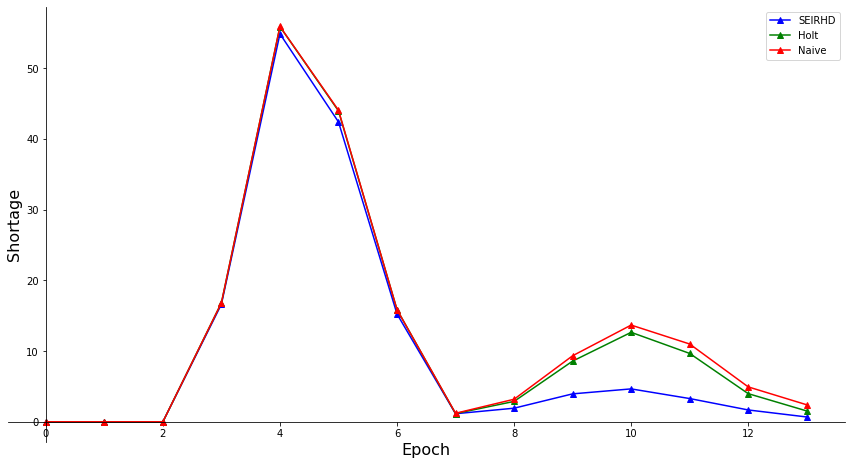

In [ ]:

graph_generator_for_epochs(shortage_epoch_df_SIR_relative_to_demand_replenished_var,
                           shortage_epoch_df_Holt_relative_to_demand_replenished_var,
                           shortage_epoch_df_Naive_relative_to_demand_replenished_var,'Shortage','Relative')


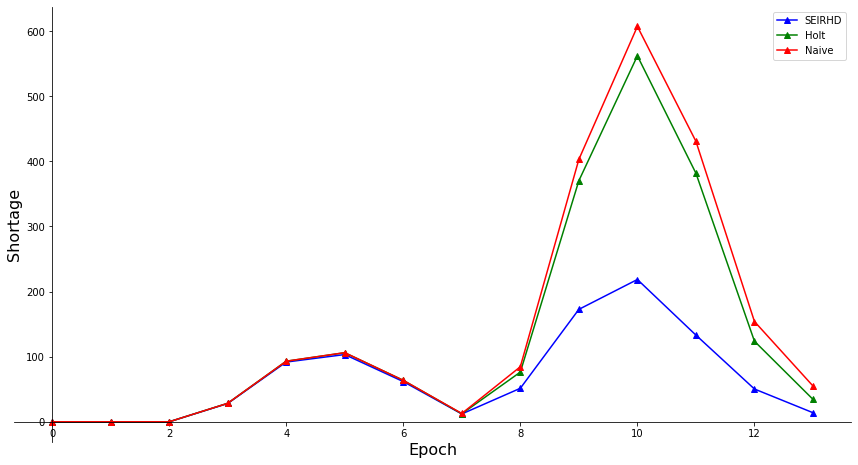

In [ ]:
graph_generator_for_epochs(shortage_epoch_df_SIR_replenished_var,
                           shortage_epoch_df_Holt_replenished_var,
                           shortage_epoch_df_Naive_replenished_var,'Shortage','Varibale period info')

##### Left-over inventory vs epoch

In [ ]:
leftover_epoch_df_SIR_relative_to_demand_replenished_var=100*leftover_epoch_df_SIR_replenished_var.div(grouped_demand.values)
leftover_epoch_df_Holt_relative_to_demand_replenished_var=100*leftover_epoch_df_Holt_replenished_var.div(grouped_demand.values)
leftover_epoch_df_Naive_relative_to_demand_replenished_var=100*leftover_epoch_df_Naive_replenished_var.div(grouped_demand.values)

leftover_epoch_df_SIR_relative_to_demand_replenished_var.iloc[:,0]=0
leftover_epoch_df_Holt_relative_to_demand_replenished_var.iloc[:,0]=0
leftover_epoch_df_Naive_relative_to_demand_replenished_var.iloc[:,0]=0


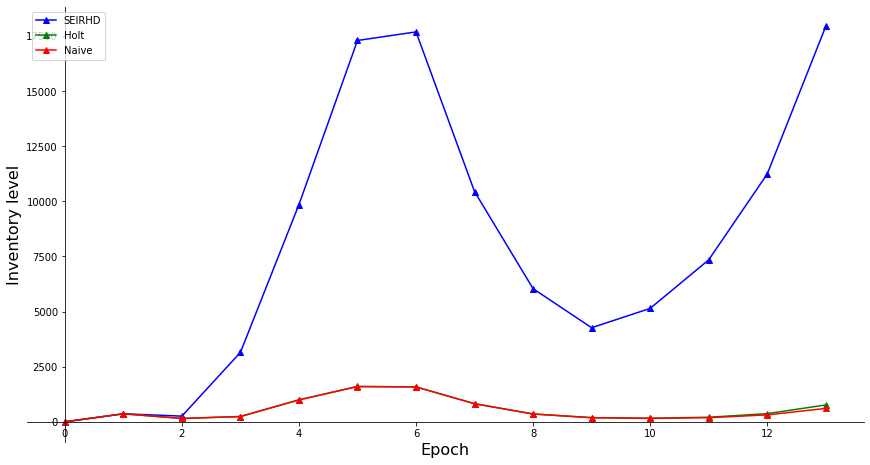

In [ ]:
# 10000
graph_generator_for_epochs(leftover_epoch_df_SIR_relative_to_demand_replenished_var,
                           leftover_epoch_df_Holt_relative_to_demand_replenished_var,
                           leftover_epoch_df_Naive_relative_to_demand_replenished_var,'Inventory level','Variable period info')

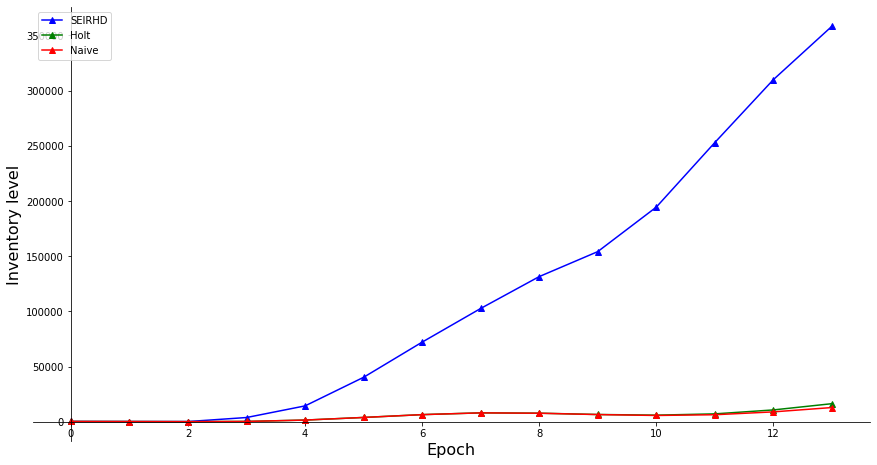

In [ ]:
# 10000
graph_generator_for_epochs(leftover_epoch_df_SIR_replenished_var,
                           leftover_epoch_df_Holt_replenished_var,
                           leftover_epoch_df_Naive_replenished_var,'Inventory level','Variable period info')

## Scenario II: Simulation process "Replenished-Data"; Granularity; Fixed Period_info

#### Parameters

In [ ]:
# In this section the parameters for ranges of scenarios are defined
#==============================================================================

# Choose what type of data is to be used by holt method:
# normal
# cumulative
holt_data_type='normal'

# How many scenarios do you want?
no_scenarios=1

# SUPPLIER'S CONSTRAINTS:
#====================================
# How many items are in a box:
item_in_box=12
# How many box are in a pallet:
box_in_pallet=1

item_in_pallet= item_in_box * box_in_pallet

# Minimum order
# what is the lower limit for minimum pallet order:
lower_limit_minimum_pallet=1 
# what is the upper limit for minimum pallet order:
upper_limit_minimum_pallet=10 

# Maximum order
# what is the lower limit for maximum pallet order:
lower_limit_maximum_pallet=200 
# what is the upper limit for maximum pallet order:
upper_limit_maximum_pallet=400

# Lead time
# what is the lower limit for lead time of the order:
lower_limit_L=5
# what is the upper limit for lead time of the order:
upper_limit_L=30

# CONSUMPTION'S CONSTRAINTS:
#====================================
# What is the lower limit of coefficient of consumption:
lower_limit_CC=3
# What is the upper limit of coefficient of consumption:
upper_limit_CC=7


# INVENTORY MANAGEMENT CONSTRAINTS:
#====================================
# Capacity of inventory
# What is the lower limit of invernoty capacity (in terms of number of pallet):
lower_limit_invernoty_capacity= 3000
# What is the upper limit of invernoty capacity (in terms of number of pallet):
upper_limit_invernoty_capacity= 6000

# Service level
# What is the lower limit of serivce level (in percent (%)):
lower_limit_service_level= 95
# What is the upper limit of serivce level (in percent (%))
upper_limit_service_level= 99.9


#  DATA SIMULATION CONSTRAINTS:
#====================================

#Do you want to have noise added to the data?
#     'yes'     if you want to add noise to the data 
#     'no'      if you do NOT want to add noise
noise_addition='yes'


# Noise generation 
# What is the lower limit of SNR:
lower_limit_SNR= 2
# What is the upper limit of SNR:
upper_limit_SNR= 10

# Deviation from CC
#SIR_forecast_CC_dev=[0]

#  Replenishment info 
#====================================

# how mony days should be between the arrival of info (replenishement mode)
period_info=8


#### Scenario creator

In [ ]:
period_info=4

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
SIR_forecast_df=pd.read_csv('forecast SIR with period info of %d.csv'%period_info)
#setting the date as the index of the dataframe


SIR_forecast_df=SIR_forecast_df.rename(columns={'Unnamed: 0':'Date'})
#setting the date as the index of the dataframe
SIR_forecast_df=SIR_forecast_df.set_index(SIR_forecast_df['Date'])

SIR_forecast_df.drop(SIR_forecast_df.columns[0], axis=1, inplace=True)



FileNotFoundError: ignored

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
SIR_forecast_df=pd.read_csv('forecast SIR without cumulative-complete with period_info %d.csv'%period_info)
#setting the date as the index of the dataframe


SIR_forecast_df=SIR_forecast_df.rename(columns={'Unnamed: 0':'Date'})
#setting the date as the index of the dataframe
SIR_forecast_df=SIR_forecast_df.set_index(SIR_forecast_df['Date'])

SIR_forecast_df.drop(SIR_forecast_df.columns[0], axis=1, inplace=True)





#this code will pass a clean table to the loop by removing all the rows of the dataframes

inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()
complete_inventory_results_scenarios_replenished=inventory_data_result_scenarios.iloc[0:0].copy()
#inventory_data_result_scenarios = inventory_data_result_scenarios.iloc[0:0].copy()

no_scenarios=1000

#for scenarios in range(no_scenarios):
for scenarios in range(no_scenarios):
  # Using uniform distribution to randomly choose a value for the following parameters
  inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()

  minimum_pallet = complete_sim_scenarios['Min pallet'][scenarios]
  maximum_pallet = complete_sim_scenarios['Max pallet'][scenarios]
  protocol_coef = complete_sim_scenarios['Protocol coefficient'][scenarios]
  L = complete_sim_scenarios['Lead time'][scenarios]
  inventory_capactiy_in_pallet = complete_sim_scenarios['Inventory capacity (in pallet)'][scenarios]
  service_level = complete_sim_scenarios['Specified service level'][scenarios]
  SNR = complete_sim_scenarios['SNR'][scenarios]
  

  # Calculating the following varibales
  item_in_pallet= item_in_box * box_in_pallet
  suppliers_capacity_min= item_in_pallet * minimum_pallet
  suppliers_capacity_max= item_in_pallet * maximum_pallet
  inventory_capactiy= inventory_capactiy_in_pallet * item_in_pallet


  #this code will pass a clean table to the loop by removing all the rows of the dataframes
  complete_inventory_results=inventory_data_result.iloc[0:0].copy()
  inventory_data_result = inventory_data_result.iloc[0:0].copy()



    #DATA SIMULATION
    #==============================================================================
    #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
    #noise recalculation should only be applied if we have have different coefficient of protocol, 
    #otherwise noise should stya the same, thats why it is outside of the loop
    
  provincial_data_CIHI['daily_consumption']=sim_demand.iloc[:,scenarios]
  provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()


  # >>>USER INPUT<<<
  # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
  # ======================================================================================================
  forecast_data_1 = provincial_data_CIHI.copy()

      # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
  consumption_date_type='daily_consumption'

  y = forecast_data_1[consumption_date_type]

  # this code will grouped the data based on the period info
  y_replenishement=replenishment_func_2(y,period_info)
  





  # PERIODIC REVIEW SYSTEM with NAIVE forecasting
  #====================================================================================================================

  inventory_data_periodic_naive = inventory_data.copy()
  inventory_data_periodic_naive.drop(inventory_data_periodic_naive.index[1:],0,inplace=True)

  #number of periods that needs to be reviewed to find max value based on the specified period_info
  no_period_for_naive_max=math.ceil(2*R/period_info)

  for i in range(1,math.ceil(len(y)/R)+1):




        #number of days in epoch i:
    days_in_epoch_i=len(y[0:(i)*R])

    # number of periods in the available data based on the period_info    
    no_period_for_period_info = math.floor(days_in_epoch_i/period_info)

    # based on the period_info we want to take the maximum value in the past 2 weeks (2*R). therefore we take the maximum
    #value in the past n*period_info that covers 2*R, that is why "no_period_for_naive_max" is the math.ceil.
    y_to_train = y_replenishement[max(0,no_period_for_period_info-no_period_for_naive_max+1):no_period_for_period_info+1]
    y_to_val = y[(i)*R:(i)*R+(R+L)]
    y_set=y[0:(i)*R+(R+L)]

    prediction_naive = naive_forecast_method_replenished(y_to_train,y_to_val)

    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_naive=peridoic_review(y_previous_epoch,
                                                  inventory_data_periodic_naive,
                                                  prediction_naive,
                                                  epoch_no)

  # PERIODIC REVIEW SYSTEM with HOLT forecasting
  #====================================================================================================================

  inventory_data_periodic_Holt = inventory_data
  inventory_data_periodic_Holt.drop(inventory_data_periodic_Holt.index[1:],0,inplace=True)

      #hospitalization_data_type='daily_consumption'

  try:
    holt_data=holt_data_type
  except NameError:
    holt_data='normal'


  for i in range(1,math.ceil(len(y)/R)+1):
    
    days_in_epoch_i=len(y[0:(i)*R])

    no_period_for_period_info = math.floor(days_in_epoch_i/period_info)
    y_to_train = y_replenishement[0:no_period_for_period_info+1]
    y_to_val = y[(i)*R:(i)*R+(R+L)]
    y_set=y[0:(i)*R+(R+L)]

    prediction_holt = holt_3(y_set, y_to_train,y_to_val,no_period_for_period_info)

    y_previous_epoch_holt=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_Holt=peridoic_review(y_previous_epoch_holt,
                                                  inventory_data_periodic_Holt,
                                                  prediction_holt,
                                                  epoch_no)

    # PERIODIC REVIEW SYSTEM with SIR forecasting model
    #=========================================================================================================

  inventory_data_periodic_SIR = inventory_data.copy()
  inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)


  for i in range(1,math.ceil(len(y)/R)+1):
    #y_to_train = y[0:(i)*R]
    #y_to_val = y[(i)*R:(i)*R+(R+L)]
    #y_set=y[0:(i)*R+(R+L)]
    #prediction = SIR_forecast_model(i,y_to_val)

    # number of days in epoch i:
    days_in_epoch_i=len(y[0:(i)*R])

    #number of days in the given data based on the period info:
    no_period_for_period_info = math.floor(days_in_epoch_i/period_info)
    days_in_period_info=no_period_for_period_info*period_info

    y_to_train = y[0:days_in_period_info]
    y_to_val = y[(i)*R:(i)*R+(R+L)]
    #y[days_in_period_info:days_in_period_info+(days_in_epoch_i-days_in_period_info)+(R+L)]
    prediction = SIR_forecast_model(no_period_for_period_info,y_to_val,epoch_number_2=i)
    
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_SIR=peridoic_review(y_previous_epoch,inventory_data_periodic_SIR,prediction,epoch_no)

  # Putting everything into a dataframe
  #=========================================================================================================
  #putting in the main parameters of the scenarios in the data frames
  inventory_data_result_scenarios['Lead time']=L
  inventory_data_result_scenarios['SNR']=SNR
  inventory_data_result_scenarios['Protocol coefficient']=protocol_coef
  inventory_data_result_scenarios['Suppliers minimum capacity']=suppliers_capacity_min
  inventory_data_result_scenarios['Suppliers maximum capacity']=suppliers_capacity_max
  inventory_data_result_scenarios['Inventory capacity']=inventory_capactiy
  inventory_data_result_scenarios['Specified service level']=service_level
    # The total demand/consumption is the same for all methods, so we can pick any of them, in this case, SIR was picked
  inventory_data_result_scenarios['Total demand/consumption']=inventory_data_periodic_SIR['consumption in last epoch'].sum()

  # Puttin the analysis data into the data frame:
  #=========================================================================================================
  results=(inventory_data_periodic_SIR,inventory_data_periodic_Holt,inventory_data_periodic_naive)
  
  for i in range(len(results)):
    inventory_data_result_scenarios.iloc[[0],[(i*18)+7]]=results[i]['shortage'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+8]]=results[i]['current'].iloc[-1]
    inventory_data_result_scenarios.iloc[[0],[(i*18)+9]]=round((1-(results[i]['shortage'] != 0).sum()/len(results[i]['shortage']-1)),2)
    inventory_data_result_scenarios.iloc[[0],[(i*18)+10]]=(results[i]['shortage'] != 0).sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+11]]=results[i]['order'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+12]]=(results[i]['order'] != 0).sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+13]]=results[i]['real cost'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+14]]=results[i]['total cost'].sum()
    # the below command compute average effective percentage bias, by average we specify those epochs that orders can be made
    # if becuase of the lead time, we cannot place an order in a specific epoch (the end epochs) then the percentage bias
    # is not relevent to our study 
    inventory_data_result_scenarios.iloc[[0],[(i*18)+15]]=results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean()
    
    # Counting the effective number of epochs with under-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+16]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] < 0).sum()
    
    # Counting the effective number of epochs with over-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+17]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] > 0).sum()
    
    # Calulating the percentage of effective number of epochs with under-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+18]]=round((inventory_data_result_scenarios.iloc[0][(i*18)+17])*100/((inventory_data_result_scenarios.iloc[0][(i*18)+16])+(inventory_data_result_scenarios.iloc[0][(i*18)+17])),2)

    #Effective RMSE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+19]]=results[i]['std of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean() 
    #RMSE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+20]]=results[i]['std of previous epoch'][1:-1].mean()
    #Effective MAPE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+21]]=results[i]['MAPE'][1:math.floor((len(y)-L)/R)+1].mean() 
    #MAPE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+22]]=results[i]['MAPE'][1:-1].mean()
    #Effective MAE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+23]]=results[i]['MAE'][1:math.floor((len(y)-L)/R)+1].mean() 
    #MAE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+24]]=results[i]['MAE'][1:-1].mean()

  SIR_epochs_bias=((results[0].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('SIR percentage bias of epoch: ')
  Holt_epochs_bias=((results[1].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Holt percentage bias of epoch: ')
  Naive_epochs_bias=((results[2].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Naive percentage bias of epoch: ')
  
  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_bias,
                                             Holt_epochs_bias,
                                             Naive_epochs_bias],axis=1)

  SIR_epochs_shortage=(results[0].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('SIR shortage of epoch: ')
  Holt_epochs_shortage=(results[1].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Holt shortage of epoch: ')
  Naive_epochs_shortage=(results[2].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Naive shortage of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_shortage,
                                             Holt_epochs_shortage,
                                             Naive_epochs_shortage],axis=1)

  SIR_epochs_leftover_in=(results[0].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('SIR left-over inventory of epoch: ')
  Holt_epochs_leftover_in=(results[1].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Holt left-over inventory of epoch: ')
  Naive_epochs_leftover_in=(results[2].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Naive left-over inventory of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_leftover_in,
                                             Holt_epochs_leftover_in,
                                             Naive_epochs_leftover_in],axis=1)
  SIR_order=(results[0].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('SIR order of epoch: ')
  Holt_order=(results[1].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Holt order of epoch: ')
  Naive_order=(results[2].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Naive order of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order,
                                              Holt_order,
                                              Naive_order],axis=1)
  
  SIR_order_actual=(results[0].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('SIR order actual of epoch: ')
  Holt_order_actual=(results[1].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Holt order actual of epoch: ')
  Naive_order_actual=(results[2].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Naive order actual of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order_actual,
                                              Holt_order_actual,
                                              Naive_order_actual],axis=1)

  #inventory_data_result_scenarios  
  complete_inventory_results_scenarios_replenished=complete_inventory_results_scenarios_replenished.append([inventory_data_result_scenarios],ignore_index=True)


In [ ]:
 #Exporting the data into the a csv file which will be saved into the drive
complete_inventory_results_scenarios_replenished.to_csv('Inventory management results with %s scenarios(replenished data) period info %s.csv'%(no_scenarios,period_info))

In [ ]:
complete_inventory_results_scenarios_replenished

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,SIR forecast: Number of epochs with shortage,SIR forecast: Total number of units ordered,SIR forecast: Number of orders,SIR forecast: Real cost,SIR forecast: Total cost,SIR forecast: Average effective percentage bias,SIR forecast: Effective no. of epochs with under-forecast,SIR forecast: Effective no. of epochs with over-forecast,SIR forecast: Percentage of Effective no. of epochs with over-forecast,SIR forecast: Effective RMSE,SIR forecast: RMSE,SIR forecast: Effective MAPE,SIR forecast: MAPE,SIR forecast: Effective MAE,SIR forecast: MAE,Holt forecast: Shortage,Holt forecast: Inventory level at the end,Holt forecast: Achieved service level,Holt forecast: Number of epochs with shortage,Holt forecast: Total number of units ordered,Holt forecast: Number of orders,Holt forecast: Real cost,Holt forecast: Total cost,Holt forecast: Average effective percentage bias,Holt forecast: Effective no. of epochs with under-forecast,Holt forecast: Effective no. of epochs with over-forecast,Holt forecast: Percentage of Effective no. of epochs with over-forecast,Holt forecast: Effective RMSE,Holt forecast: RMSE,Holt forecast: Effective MAPE,...,SIR order actual of epoch: 17,SIR order actual of epoch: 18,Holt order actual of epoch: 0,Holt order actual of epoch: 1,Holt order actual of epoch: 2,Holt order actual of epoch: 3,Holt order actual of epoch: 4,Holt order actual of epoch: 5,Holt order actual of epoch: 6,Holt order actual of epoch: 7,Holt order actual of epoch: 8,Holt order actual of epoch: 9,Holt order actual of epoch: 10,Holt order actual of epoch: 11,Holt order actual of epoch: 12,Holt order actual of epoch: 13,Holt order actual of epoch: 14,Holt order actual of epoch: 15,Holt order actual of epoch: 16,Holt order actual of epoch: 17,Holt order actual of epoch: 18,Naive order actual of epoch: 0,Naive order actual of epoch: 1,Naive order actual of epoch: 2,Naive order actual of epoch: 3,Naive order actual of epoch: 4,Naive order actual of epoch: 5,Naive order actual of epoch: 6,Naive order actual of epoch: 7,Naive order actual of epoch: 8,Naive order actual of epoch: 9,Naive order actual of epoch: 10,Naive order actual of epoch: 11,Naive order actual of epoch: 12,Naive order actual of epoch: 13,Naive order actual of epoch: 14,Naive order actual of epoch: 15,Naive order actual of epoch: 16,Naive order actual of epoch: 17,Naive order actual of epoch: 18
0,25,6,5.00000000,12,3732,52992,0.96000000,1086.00000000,12102.00000000,0.79000000,4,34812.00000000,11,645550.00000000,710710.00000000,398.52846154,3,10,76.92000000,3014.51769231,2326.64411765,432.03615385,387.72823529,1476.15153846,1150.11176471,3643.00000000,15919.00000000,0.58000000,8,36072.00000000,12,581253.00000000,799833.00000000,116.31076923,9,4,30.77000000,395.18384615,351.09705882,230.79384615,...,0.00000000,0.00000000,0.00000000,0.00000000,153.00000000,1117.00000000,1748.00000000,3180.00000000,4315.00000000,6055.00000000,6040.00000000,5453.00000000,33741.00000000,41881.00000000,27807.00000000,22274.00000000,8239.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,153.00000000,914.00000000,1540.00000000,2996.00000000,4049.00000000,6539.00000000,6168.00000000,5397.00000000,14508.00000000,12133.00000000,15526.00000000,14918.00000000,4809.00000000,0.00000000,0.00000000,0.00000000,0.00000000
1,11,5,5.00000000,108,3780,55956,0.98800000,178.00000000,3407.00000000,0.84000000,3,26964.00000000,11,471920.00000000,482600.00000000,85.30133333,4,11,73.33000000,301.71733333,274.01176471,134.99600000,159.29235294,220.00600000,201.85764706,3432.00000000,12745.00000000,0.68000000,6,33048.00000000,13,562618.00000000,768538.00000000,100.85266667,9,6,40.00000000,315.80200000,290.84823529,194.09133333,...,0.00000000,0.00000000,0.00000000,0.00000000,4

#### Results

##### Importing data

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
complete_inventory_results_scenarios_replenished_6=pd.read_csv('Inventory management results with 10000 scenarios(replenished data) period_info 6.csv')
#setting the date as the index of the dataframe
complete_inventory_results_scenarios_replenished_6=complete_inventory_results_scenarios_replenished_6.drop(columns='Unnamed: 0')

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
complete_inventory_results_scenarios_replenished_7=pd.read_csv('Inventory management results with 10000 scenarios(replenished data) period_info 7.csv')
#setting the date as the index of the dataframe
complete_inventory_results_scenarios_replenished_7=complete_inventory_results_scenarios_replenished_7.drop(columns='Unnamed: 0')

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
complete_inventory_results_scenarios_replenished_8=pd.read_csv('Inventory management results with 10000 scenarios(replenished data) period_info 8.csv')
#setting the date as the index of the dataframe
complete_inventory_results_scenarios_replenished_8=complete_inventory_results_scenarios_replenished_8.drop(columns='Unnamed: 0')

##### Presentation of results

###### Data filtering

In [ ]:
#creating a separet daraframe in order to not touch the original copy
df_temp_present_replenished_6=complete_inventory_results_scenarios_replenished_6.copy()

# SHORTAGE
#============================================
# filtering the data for sepcified category
shortage_epoch_df_SIR_replenished_6=df_temp_present_replenished_6[df_temp_present_replenished_6.columns[pd.Series(df_temp_present_replenished_6.columns).str.startswith('SIR shortage of epoch')]]
shortage_epoch_df_Holt_replenished_6=df_temp_present_replenished_6[df_temp_present_replenished_6.columns[pd.Series(df_temp_present_replenished_6.columns).str.startswith('Holt shortage of epoch')]]
shortage_epoch_df_Naive_replenished_6=df_temp_present_replenished_6[df_temp_present_replenished_6.columns[pd.Series(df_temp_present_replenished_6.columns).str.startswith('Naive shortage of epoch')]]


# Left-over inventory
#============================================
# filtering the data for sepcified category
leftover_epoch_df_SIR_replenished_6=df_temp_present_replenished_6[df_temp_present_replenished_6.columns[pd.Series(df_temp_present_replenished_6.columns).str.startswith('SIR left-over inventory of epoch')]]
leftover_epoch_df_Holt_replenished_6=df_temp_present_replenished_6[df_temp_present_replenished_6.columns[pd.Series(df_temp_present_replenished_6.columns).str.startswith('Holt left-over inventory of epoch')]]
leftover_epoch_df_Naive_replenished_6=df_temp_present_replenished_6[df_temp_present_replenished_6.columns[pd.Series(df_temp_present_replenished_6.columns).str.startswith('Naive left-over inventory of epoch')]]

# Bais-over inventory
#============================================
# filtering the data for sepcified category
bias_epoch_df_SIR_replenished_6=df_temp_present_replenished_6[df_temp_present_replenished_6.columns[pd.Series(df_temp_present_replenished_6.columns).str.startswith('SIR percentage bias of epoch')]]
bias_epoch_df_Holt_replenished_6=df_temp_present_replenished_6[df_temp_present_replenished_6.columns[pd.Series(df_temp_present_replenished_6.columns).str.startswith('Holt percentage bias of epoch')]]
bias_epoch_df_Naive_replenished_6=df_temp_present_replenished_6[df_temp_present_replenished_6.columns[pd.Series(df_temp_present_replenished_6.columns).str.startswith('Naive percentage bias of epoch')]]

In [ ]:
#creating a separet daraframe in order to not touch the original copy
df_temp_present_replenished_7=complete_inventory_results_scenarios_replenished_7.copy()

# SHORTAGE
#============================================
# filtering the data for sepcified category
shortage_epoch_df_SIR_replenished_7=df_temp_present_replenished_7[df_temp_present_replenished_7.columns[pd.Series(df_temp_present_replenished_7.columns).str.startswith('SIR shortage of epoch')]]
shortage_epoch_df_Holt_replenished_7=df_temp_present_replenished_7[df_temp_present_replenished_7.columns[pd.Series(df_temp_present_replenished_7.columns).str.startswith('Holt shortage of epoch')]]
shortage_epoch_df_Naive_replenished_7=df_temp_present_replenished_7[df_temp_present_replenished_7.columns[pd.Series(df_temp_present_replenished_7.columns).str.startswith('Naive shortage of epoch')]]


# Left-over inventory
#============================================
# filtering the data for sepcified category
leftover_epoch_df_SIR_replenished_7=df_temp_present_replenished_7[df_temp_present_replenished_7.columns[pd.Series(df_temp_present_replenished_7.columns).str.startswith('SIR left-over inventory of epoch')]]
leftover_epoch_df_Holt_replenished_7=df_temp_present_replenished_7[df_temp_present_replenished_7.columns[pd.Series(df_temp_present_replenished_7.columns).str.startswith('Holt left-over inventory of epoch')]]
leftover_epoch_df_Naive_replenished_7=df_temp_present_replenished_7[df_temp_present_replenished_7.columns[pd.Series(df_temp_present_replenished_7.columns).str.startswith('Naive left-over inventory of epoch')]]

# Bais-over inventory
#============================================
# filtering the data for sepcified category
bias_epoch_df_SIR_replenished_7=df_temp_present_replenished_7[df_temp_present_replenished_7.columns[pd.Series(df_temp_present_replenished_7.columns).str.startswith('SIR percentage bias of epoch')]]
bias_epoch_df_Holt_replenished_7=df_temp_present_replenished_7[df_temp_present_replenished_7.columns[pd.Series(df_temp_present_replenished_7.columns).str.startswith('Holt percentage bias of epoch')]]
bias_epoch_df_Naive_replenished_7=df_temp_present_replenished_7[df_temp_present_replenished_7.columns[pd.Series(df_temp_present_replenished_7.columns).str.startswith('Naive percentage bias of epoch')]]

In [ ]:
#creating a separet daraframe in order to not touch the original copy
df_temp_present_replenished_8=complete_inventory_results_scenarios_replenished_8.copy()

# SHORTAGE
#============================================
# filtering the data for sepcified category
shortage_epoch_df_SIR_replenished_8=df_temp_present_replenished_8[df_temp_present_replenished_8.columns[pd.Series(df_temp_present_replenished_8.columns).str.startswith('SIR shortage of epoch')]]
shortage_epoch_df_Holt_replenished_8=df_temp_present_replenished_8[df_temp_present_replenished_8.columns[pd.Series(df_temp_present_replenished_8.columns).str.startswith('Holt shortage of epoch')]]
shortage_epoch_df_Naive_replenished_8=df_temp_present_replenished_8[df_temp_present_replenished_8.columns[pd.Series(df_temp_present_replenished_8.columns).str.startswith('Naive shortage of epoch')]]


# Left-over inventory
#============================================
# filtering the data for sepcified category
leftover_epoch_df_SIR_replenished_8=df_temp_present_replenished_8[df_temp_present_replenished_8.columns[pd.Series(df_temp_present_replenished_8.columns).str.startswith('SIR left-over inventory of epoch')]]
leftover_epoch_df_Holt_replenished_8=df_temp_present_replenished_8[df_temp_present_replenished_8.columns[pd.Series(df_temp_present_replenished_8.columns).str.startswith('Holt left-over inventory of epoch')]]
leftover_epoch_df_Naive_replenished_8=df_temp_present_replenished_8[df_temp_present_replenished_8.columns[pd.Series(df_temp_present_replenished_8.columns).str.startswith('Naive left-over inventory of epoch')]]

# Bais-over inventory
#============================================
# filtering the data for sepcified category
bias_epoch_df_SIR_replenished_8=df_temp_present_replenished_8[df_temp_present_replenished_8.columns[pd.Series(df_temp_present_replenished_8.columns).str.startswith('SIR percentage bias of epoch')]]
bias_epoch_df_Holt_replenished_8=df_temp_present_replenished_8[df_temp_present_replenished_8.columns[pd.Series(df_temp_present_replenished_8.columns).str.startswith('Holt percentage bias of epoch')]]
bias_epoch_df_Naive_replenished_8=df_temp_present_replenished_8[df_temp_present_replenished_8.columns[pd.Series(df_temp_present_replenished_8.columns).str.startswith('Naive percentage bias of epoch')]]

###### comparison graph

In [ ]:
scenario_II_graph_comparison()

###### Comparison function graph

In [ ]:
def scenario_II_graph_comparison ():
  #protocol_coef_variation=[3,3.5,4,4.5,5]
  #service_level_variation


  plt.figure(figsize=(23,10))

  plt.subplot(1, 2, 1)
  #this part plots different Protocol coefficient and their related shortages
  #plt.figure(figsize=(17,8.5))

  data1=shortage_epoch_df_SIR_replenished
  data2=shortage_epoch_df_Holt_replenished
  data3=shortage_epoch_df_Naive_replenished
  y_axis_name='Shortage'
  #taking the mean of each column and removing the epochs that order cannot be placed (based on the lead time)
  y_bias_SIR=data1.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_bias_Holt=data2.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_bias_Naive=data3.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  x=range(len(y_bias_SIR))

  #spine placement data centered
  ax.spines['left'].set_position(('data', 0.0))
  ax.spines['bottom'].set_position(('data', 0.0))
  ax.spines['right'].set_color('none')
  ax.spines['top'].set_color('none')

  plt.plot(x,y_bias_SIR, color = 'blue',label='SEIRHD',marker='^')
  plt.plot(x,y_bias_Holt, color = 'green',label='Holt',marker='^')
  plt.plot(x,y_bias_Naive, color = 'red',label='Naive',marker='^')



  plt.legend(['SEIRHD','Holt','Naive'])

  plt.xlabel('Epoch',fontsize=16)
  plt.ylabel(y_axis_name,fontsize=16)




  plt.subplot(1, 2, 2)
  #10,000


  data1=leftover_epoch_df_SIR_replenished
  data2=leftover_epoch_df_Holt_replenished
  data3=leftover_epoch_df_Naive_replenished
  y_axis_name='inventory level'
  #taking the mean of each column and removing the epochs that order cannot be placed (based on the lead time)
  y_bias_SIR=data1.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_bias_Holt=data2.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  y_bias_Naive=data3.mean(axis=0)[:math.floor((len(y)-upper_limit_L)/R)+1]
  x=range(len(y_bias_SIR))

  #spine placement data centered
  ax.spines['left'].set_position(('data', 0.0))
  ax.spines['bottom'].set_position(('data', 0.0))
  ax.spines['right'].set_color('none')
  ax.spines['top'].set_color('none')

  plt.plot(x,y_bias_SIR, color = 'blue',label='SEIRHD',marker='^')
  plt.plot(x,y_bias_Holt, color = 'green',label='Holt',marker='^')
  plt.plot(x,y_bias_Naive, color = 'red',label='Naive',marker='^')



  plt.legend(['SEIRHD','Holt','Naive'])

  plt.xlabel('Epoch',fontsize=16)
  plt.ylabel(y_axis_name,fontsize=16)

  return


In [ ]:
df_comparison=inventory_data_periodic_Holt['consumption in last epoch']
type(df_comparison)
df_comparison=df_comparison.to_frame()
df_comparison['SIR current']=inventory_data_periodic_SIR['current']
df_comparison['SIR order']=inventory_data_periodic_SIR['order']
df_comparison['SIR shortage']=inventory_data_periodic_SIR['shortage']

df_comparison['naive current']=inventory_data_periodic_naive['current']
df_comparison['naive order']=inventory_data_periodic_naive['order']
df_comparison['naive shortage']=inventory_data_periodic_naive['shortage']


df_comparison['Holt current']=inventory_data_periodic_Holt['current']
df_comparison['Holt order']=inventory_data_periodic_Holt['order']
df_comparison['Holt shortage']=inventory_data_periodic_Holt['shortage']



df_comparison

,consumption in last epoch,SIR current,SIR order,SIR shortage,naive current,naive order,naive shortage,Holt current,Holt order,Holt shortage
0,0.00000000,300.00000000,0.00000000,0.00000000,300.00000000,0.00000000,0.00000000,300.00000000,0.00000000,0.00000000
1,58.50000000,241.50000000,800.00000000,0.00000000,241.50000000,800.00000000,0.00000000,241.50000000,800.00000000,0.00000000
2,85.50000000,956.00000000,800.00000000,0.00000000,956.00000000,800.00000000,0.00000000,956.00000000,800.00000000,0.00000000
3,117.00000000,1639.00000000,800.00000000,0.00000000,1639.00000000,800.00000000,0.00000000,1639.00000000,800.00000000,0.00000000
4,135.00000000,2304.00000000,800.00000000,0.00000000,2304.00000000,800.00000000,0.00000000,2304.00000000,800.00000000,0.00000000
5,220.50000000,2883.50000000,800.00000000,0.00000000,2883.50000000,800.00000000,0.00000000,2883.50000000,800.00000000,0.00000000
6,387.00000000,3296.50000000,800.00000000,0.00000000,3296.50000000,800.00000000,0.00000000,3296.50000000,800.00000000,0.00000000
7,940.50000000,3156.00000000,3200.00000000,0.00000000,3156.00000000,800.00000000,0.00000000,3156.00000000,3200.00000000,0.00000000
8,2137.50000000,4218.50000000,3200.00000000,0.00000000,1818.50000000,3200.00000000,0.00000000,4218.50000000,3200.00000000,0.00000000
9,3474.00000000,3944.50000000,3200.00000000,0.00000000,2079.50000000,3200.00000000,535.00000000,3944.50000000,3200.00000000,0.00000000


In [ ]:
df_maker(leftover_epoch_df_SIR_replenished,leftover_epoch_df_Holt_replenished,leftover_epoch_df_Naive_replenished)

In [ ]:
df_maker(data_1=shortage_epoch_df_SIR_replenished,data_2=shortage_epoch_df_Holt_replenished,data_3=shortage_epoch_df_Naive_replenished)

###### Relative data

In [ ]:
### SHORTAGE

In [ ]:
#10,000

shortage_epoch_df_SIR_relative_to_demand_replenished_6=100*shortage_epoch_df_SIR_replenished_6.div(grouped_demand.values)
shortage_epoch_df_Holt_relative_to_demand_replenished_6=100*shortage_epoch_df_Holt_replenished_6.div(grouped_demand.values)
shortage_epoch_df_Naive_relative_to_demand_replenished_6=100*shortage_epoch_df_Naive_replenished_6.div(grouped_demand.values)

In [ ]:
shortage_epoch_df_SIR_relative_to_demand_replenished_7=100*shortage_epoch_df_SIR_replenished_7.div(grouped_demand.values)
shortage_epoch_df_Holt_relative_to_demand_replenished_7=100*shortage_epoch_df_Holt_replenished_7.div(grouped_demand.values)
shortage_epoch_df_Naive_relative_to_demand_replenished_7=100*shortage_epoch_df_Naive_replenished_7.div(grouped_demand.values)

In [ ]:
shortage_epoch_df_SIR_relative_to_demand_replenished_8=100*shortage_epoch_df_SIR_replenished_8.div(grouped_demand.values)
shortage_epoch_df_Holt_relative_to_demand_replenished_8=100*shortage_epoch_df_Holt_replenished_8.div(grouped_demand.values)
shortage_epoch_df_Naive_relative_to_demand_replenished_8=100*shortage_epoch_df_Naive_replenished_8.div(grouped_demand.values)

In [ ]:
### LEFT-OVER INVENTORY

In [ ]:
grouped_demand

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
sim demand no.0,1,71,123,171,201,310,656,1138,3465,4127,5203,5100,4383,3294,1422,1324,678,502,81
sim demand no.1,1,58,74,105,127,202,349,854,1782,3059,3213,2936,2572,1664,1184,774,460,289,40
sim demand no.2,1,81,98,146,181,270,400,1319,2295,3544,4186,3031,3258,2573,1277,943,496,301,47
sim demand no.3,1,77,121,163,175,301,517,1196,2773,4737,4987,4268,3610,2524,1817,1191,680,407,74
sim demand no.4,1,77,115,136,173,268,530,1135,2669,4478,3868,4511,2943,2169,1634,944,735,378,78
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sim demand no.9995,1,66,93,141,191,252,438,1029,2433,4373,3897,3524,2464,2029,1450,985,622,350,67
sim demand no.9996,1,60,80,133,190,243,458,938,2553,3401,3961,3495,3149,2417,1648,986,613,336,63
sim demand no.9997,1,58,78,110,122,178,346,840,1838,3225,3021,2838,2085,1771,1187,758,429,293,52
sim demand no.9998,1,70,102,143,151,258,448,1064,2387,4302,4114,3759,3186,2170,1472,926,594,345,59


In [ ]:

leftover_epoch_df_SIR_relative_to_demand_replenished_6=100*leftover_epoch_df_SIR_replenished_6.div(grouped_demand.values)
leftover_epoch_df_Holt_relative_to_demand_replenished_6=100*leftover_epoch_df_Holt_replenished_6.div(grouped_demand.values)
leftover_epoch_df_Naive_relative_to_demand_replenished_6=100*leftover_epoch_df_Naive_replenished_6.div(grouped_demand.values)

leftover_epoch_df_SIR_relative_to_demand_replenished_6.iloc[:,0]=0
leftover_epoch_df_Holt_relative_to_demand_replenished_6.iloc[:,0]=0
leftover_epoch_df_Naive_relative_to_demand_replenished_6.iloc[:,0]=0


In [ ]:

leftover_epoch_df_SIR_relative_to_demand_replenished_7=100*leftover_epoch_df_SIR_replenished_7.div(grouped_demand.values)
leftover_epoch_df_Holt_relative_to_demand_replenished_7=100*leftover_epoch_df_Holt_replenished_7.div(grouped_demand.values)
leftover_epoch_df_Naive_relative_to_demand_replenished_7=100*leftover_epoch_df_Naive_replenished_7.div(grouped_demand.values)

leftover_epoch_df_SIR_relative_to_demand_replenished_7.iloc[:,0]=0
leftover_epoch_df_Holt_relative_to_demand_replenished_7.iloc[:,0]=0
leftover_epoch_df_Naive_relative_to_demand_replenished_7.iloc[:,0]=0

In [ ]:

leftover_epoch_df_SIR_relative_to_demand_replenished_8=100*leftover_epoch_df_SIR_replenished_8.div(grouped_demand.values)
leftover_epoch_df_Holt_relative_to_demand_replenished_8=100*leftover_epoch_df_Holt_replenished_8.div(grouped_demand.values)
leftover_epoch_df_Naive_relative_to_demand_replenished_8=100*leftover_epoch_df_Naive_replenished_8.div(grouped_demand.values)

leftover_epoch_df_SIR_relative_to_demand_replenished_8.iloc[:,0]=0
leftover_epoch_df_Holt_relative_to_demand_replenished_8.iloc[:,0]=0
leftover_epoch_df_Naive_relative_to_demand_replenished_8.iloc[:,0]=0

###### Shortage vs epochs

In [ ]:
### PERIOD INFO ==> 6

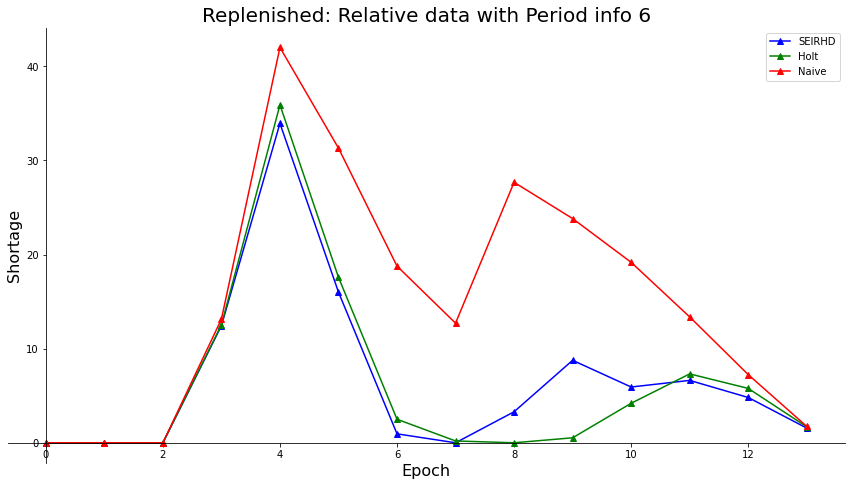

In [ ]:
graph_generator_for_epochs_2(shortage_epoch_df_SIR_relative_to_demand_replenished_6,
                           shortage_epoch_df_Holt_relative_to_demand_replenished_6,
                           shortage_epoch_df_Naive_relative_to_demand_replenished_6,'Shortage','Normal','Replenished: Relative data with Period info 6')

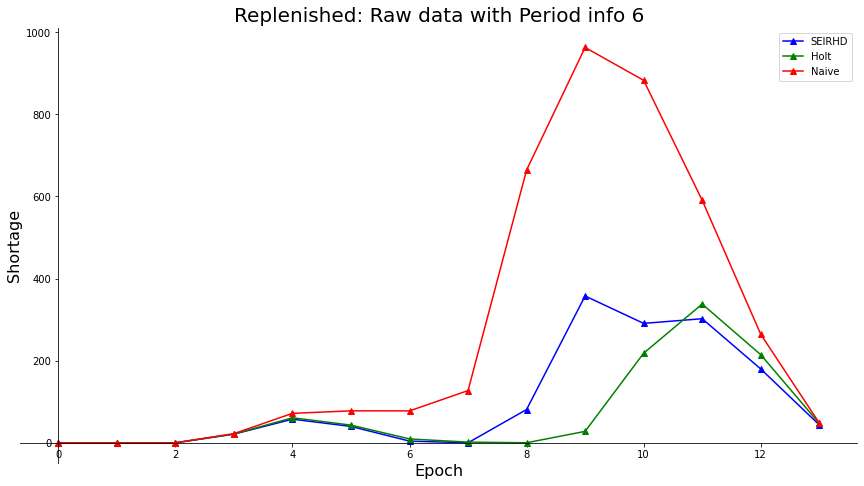

In [ ]:
#new 10,000
graph_generator_for_epochs_2(shortage_epoch_df_SIR_replenished_6,
                           shortage_epoch_df_Holt_replenished_6,
                           shortage_epoch_df_Naive_replenished_6,'Shortage','Granularity','Replenished: Raw data with Period info 6')

In [ ]:
### PERIOD INFO ==>7

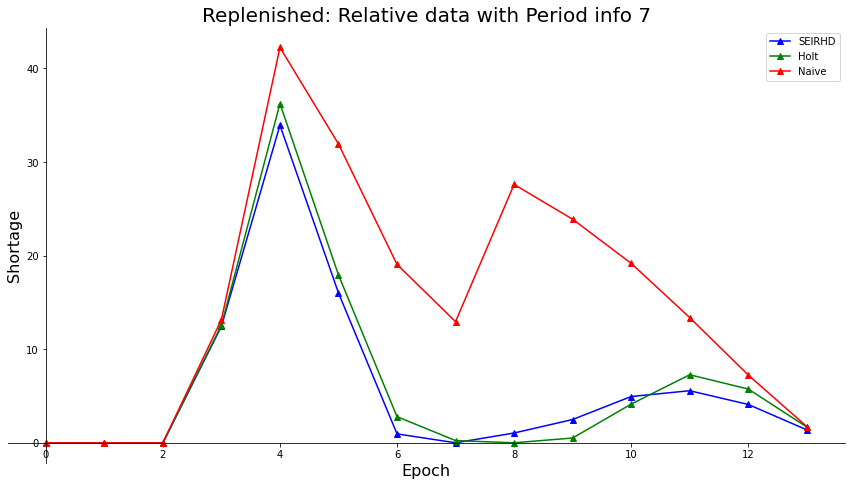

In [ ]:
graph_generator_for_epochs_2(shortage_epoch_df_SIR_relative_to_demand_replenished_7,
                           shortage_epoch_df_Holt_relative_to_demand_replenished_7,
                           shortage_epoch_df_Naive_relative_to_demand_replenished_7,'Shortage','Normal','Replenished: Relative data with Period info 7')

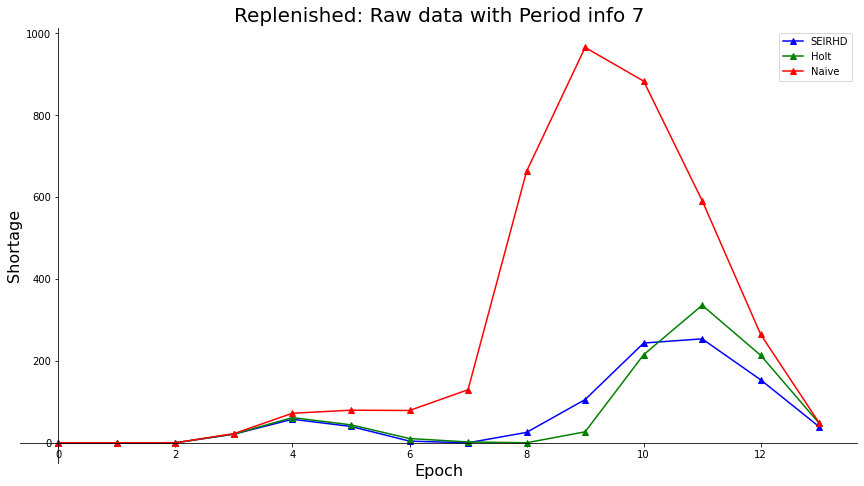

In [ ]:
#new 10,000
graph_generator_for_epochs_2(shortage_epoch_df_SIR_replenished_7,
                           shortage_epoch_df_Holt_replenished_7,
                           shortage_epoch_df_Naive_replenished_7,'Shortage','Granularity','Replenished: Raw data with Period info 7')

In [ ]:
### PERIOD INFO ==> 8

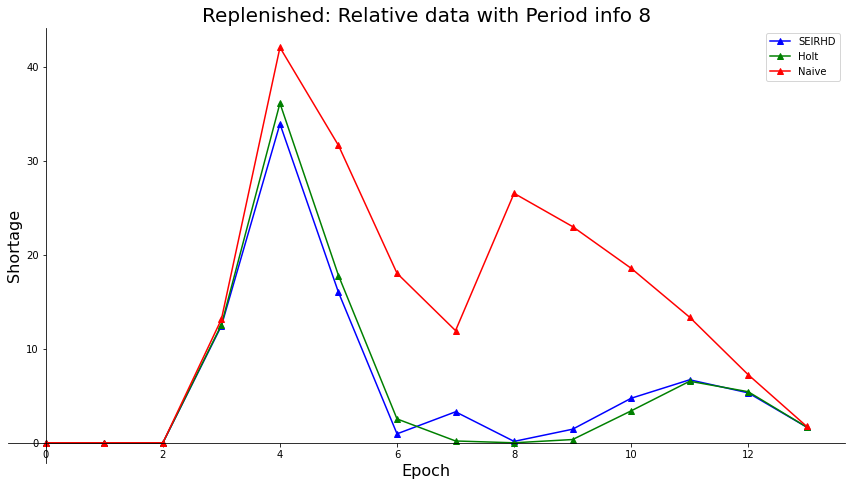

In [ ]:
graph_generator_for_epochs_2(shortage_epoch_df_SIR_relative_to_demand_replenished_8,
                           shortage_epoch_df_Holt_relative_to_demand_replenished_8,
                           shortage_epoch_df_Naive_relative_to_demand_replenished_8,'Shortage','Normal','Replenished: Relative data with Period info 8')

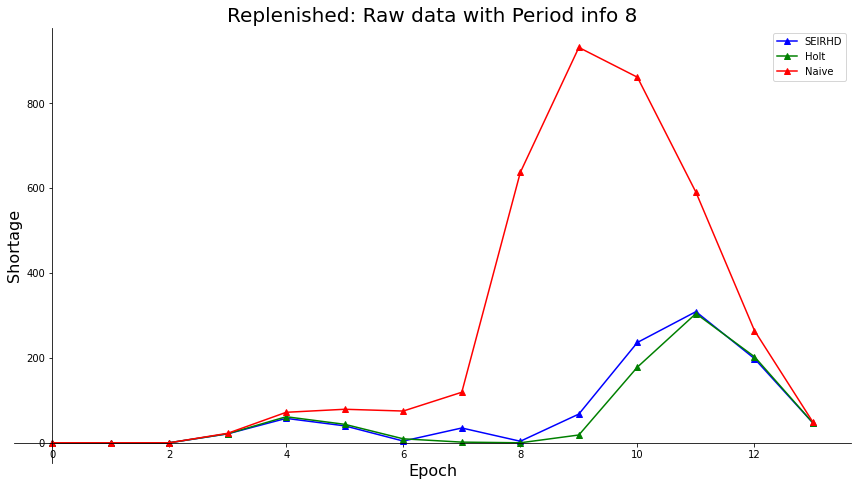

In [ ]:
#new 10,000
graph_generator_for_epochs_2(shortage_epoch_df_SIR_replenished_8,
                           shortage_epoch_df_Holt_replenished_8,
                           shortage_epoch_df_Naive_replenished_8,'Shortage','Granularity','Replenished: Raw data with Period info 8')

###### Left-over inventory vs epoch

In [ ]:
# PERIOD INFO ==> 6

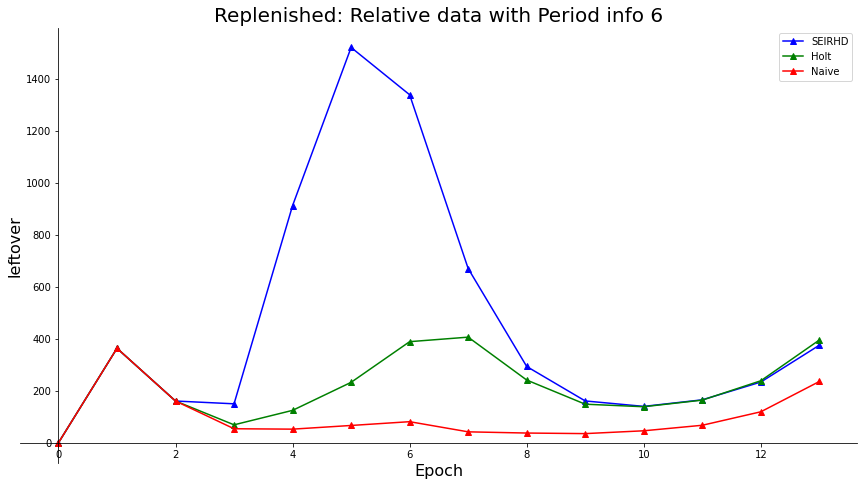

In [ ]:
graph_generator_for_epochs_2(leftover_epoch_df_SIR_relative_to_demand_replenished_6,
                           leftover_epoch_df_Holt_relative_to_demand_replenished_6,
                           leftover_epoch_df_Naive_relative_to_demand_replenished_6,'leftover','Normal','Replenished: Relative data with Period info 6')

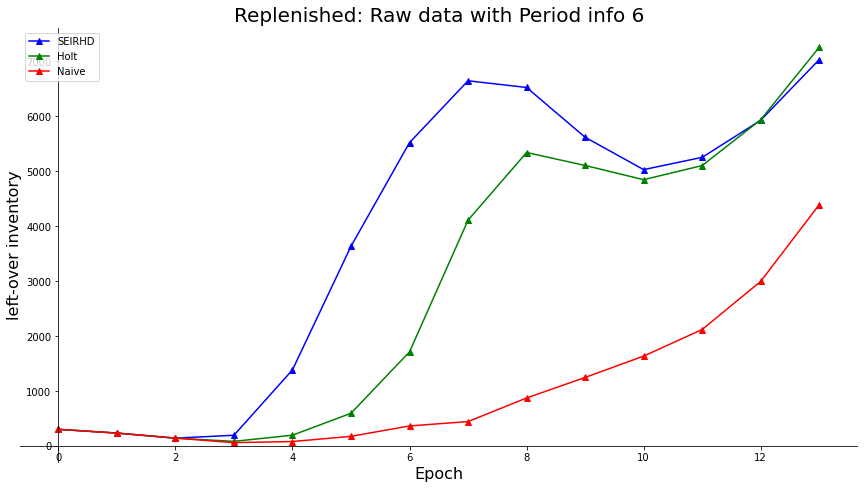

In [ ]:

#100
graph_generator_for_epochs_2(leftover_epoch_df_SIR_replenished_6,
                           leftover_epoch_df_Holt_replenished_6,
                           leftover_epoch_df_Naive_replenished_6,'left-over inventory','Granularity','Replenished: Raw data with Period info 6')

In [ ]:
# PERIOD INFO ==> 7

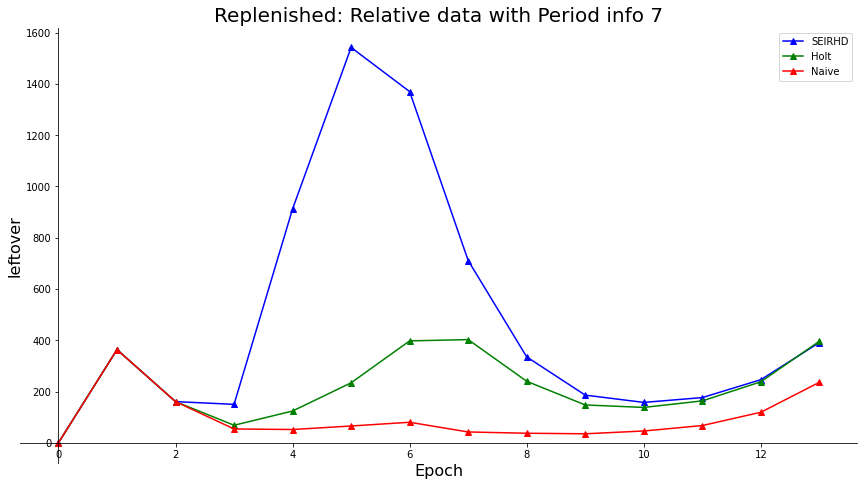

In [ ]:
graph_generator_for_epochs_2(leftover_epoch_df_SIR_relative_to_demand_replenished_7,
                           leftover_epoch_df_Holt_relative_to_demand_replenished_7,
                           leftover_epoch_df_Naive_relative_to_demand_replenished_7,'leftover','Normal','Replenished: Relative data with Period info 7')

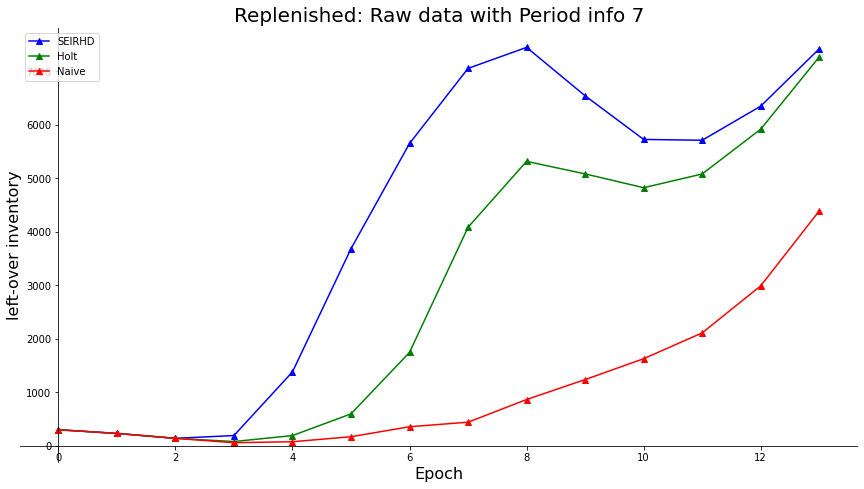

In [ ]:

#100
graph_generator_for_epochs_2(leftover_epoch_df_SIR_replenished_7,
                           leftover_epoch_df_Holt_replenished_7,
                           leftover_epoch_df_Naive_replenished_7,'left-over inventory','Granularity','Replenished: Raw data with Period info 7')

In [ ]:
# PERIOD INFO ==> 8

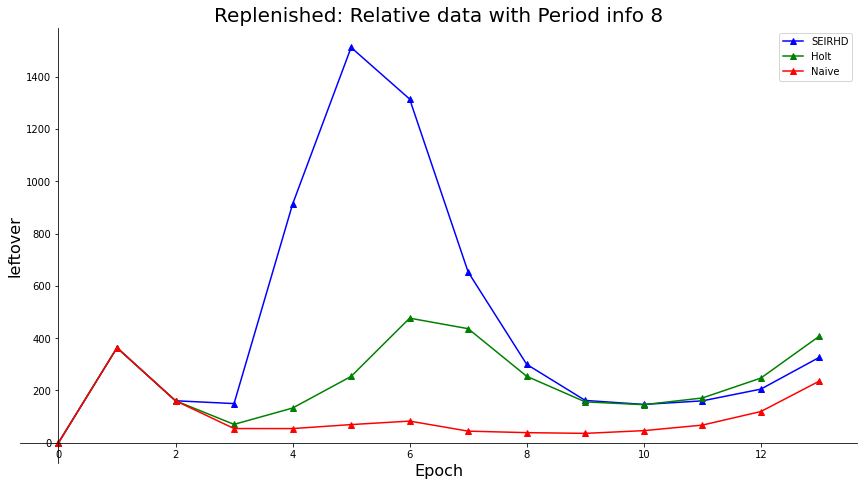

In [ ]:
graph_generator_for_epochs_2(leftover_epoch_df_SIR_relative_to_demand_replenished_8,
                           leftover_epoch_df_Holt_relative_to_demand_replenished_8,
                           leftover_epoch_df_Naive_relative_to_demand_replenished_8,'leftover','Normal','Replenished: Relative data with Period info 8')

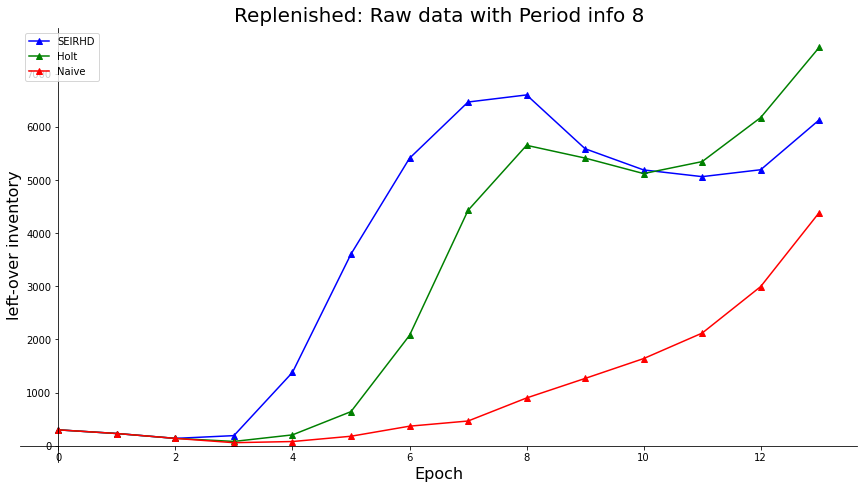

In [ ]:

#100
graph_generator_for_epochs_2(leftover_epoch_df_SIR_replenished_8,
                           leftover_epoch_df_Holt_replenished_8,
                           leftover_epoch_df_Naive_replenished_8,'left-over inventory','Granularity','Replenished: Raw data with Period info 8')

###### Comparison of different period infos

In [ ]:
plt.subplot(nrows=1, ncols=2, figsize=(5, 3))

graph_generator_for_epochs_2(shortage_epoch_df_SIR_relative_to_demand_replenished_6,
                           shortage_epoch_df_Holt_relative_to_demand_replenished_6,
                           shortage_epoch_df_Naive_relative_to_demand_replenished_6,'Shortage','Normal','Replenished: Relative data with Period info 6')

#new 10,000
graph_generator_for_epochs_2(shortage_epoch_df_SIR_replenished_6,
                           shortage_epoch_df_Holt_replenished_6,
                           shortage_epoch_df_Naive_replenished_6,'Shortage','Granularity','Replenished: Raw data with Period info 6')

plt.tight_layout()

AttributeError: ignored

<Figure size 432x288 with 0 Axes>

###### Percentage bias vs epoch

In [ ]:
#10,000
graph_generator_for_epochs(bias_epoch_df_SIR_replenished,
                           bias_epoch_df_Holt_replenished,
                           bias_epoch_df_Naive_replenished,'Percentage bias')

In [ ]:
#100
graph_generator_for_epochs(bias_epoch_df_SIR_replenished,
                           bias_epoch_df_Holt_replenished,
                           bias_epoch_df_Naive_replenished,'Percentage bias')

###### Shortage vs. final inventory

In [ ]:



fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111)

x_plot=df_temp_present_replenished['SIR forecast: Shortage']
y_plot=df_temp_present_replenished['SIR forecast: Inventory level at the end']
plt.scatter(x_plot, y_plot, color = 'red',label='SIR forecast',marker='o')

x_plot=df_temp_present_replenished['Holt forecast: Shortage']
y_plot=df_temp_present_replenished['Holt forecast: Inventory level at the end']
plt.scatter(x_plot, y_plot, color = 'blue',label='Holt forecast',marker='x')

x_plot=df_temp_present_replenished['Naive forecast: Shortage']
y_plot=df_temp_present_replenished['Naive forecast: Inventory level at the end']
plt.scatter(x_plot, y_plot, color = 'green',label='Naive forecast',marker='^')

plt.title('%s scnearios of inventory management in British Columbia'%(no_scenarios),fontsize=16)
plt.xlabel('Shortage',fontsize=16)
plt.ylabel('Final inventory',fontsize=16)
plt.legend(fontsize=13)

plt.show()


## Scenario III: Simulation process "Lagged"

#### Parameters

In [ ]:
# In this section the parameters for ranges of scenarios are defined
#==============================================================================

# How many scenarios do you want?
no_scenarios=1

# SUPPLIER'S CONSTRAINTS:
#====================================
# How many items are in a box:
item_in_box=12
# How many items are in a pallet:
box_in_pallet=1

item_in_pallet= item_in_box * box_in_pallet

# Minimum order
# what is the lower limit for minimum pallet order:
lower_limit_minimum_pallet=1 
# what is the upper limit for minimum pallet order:
upper_limit_minimum_pallet=10 

# Maximum order
# what is the lower limit for maximum pallet order:
lower_limit_maximum_pallet=200 
# what is the upper limit for maximum pallet order:
upper_limit_maximum_pallet=400

# Lead time
# what is the lower limit for lead time of the order:
lower_limit_L=5
# what is the upper limit for lead time of the order:
upper_limit_L=30

# CONSUMPTION'S CONSTRAINTS:
#====================================
# What is the lower limit of coefficient of consumption:
lower_limit_CC=3
# What is the upper limit of coefficient of consumption:
upper_limit_CC=7


# INVENTORY MANAGEMENT CONSTRAINTS:
#====================================
# Capacity of inventory
# What is the lower limit of invernoty capacity (in terms of number of pallet):
lower_limit_invernoty_capacity= 3000
# What is the upper limit of invernoty capacity (in terms of number of pallet):
upper_limit_invernoty_capacity= 6000

# Service level
# What is the lower limit of serivce level (in percent (%)):
lower_limit_service_level= 95
# What is the upper limit of serivce level (in percent (%))
upper_limit_service_level= 99.9


#  DATA SIMULATION CONSTRAINTS:
#====================================

#Do you want to have noise added to the data?
#     'yes'     if you want to add noise to the data 
#     'no'      if you do NOT want to add noise
noise_addition='yes'


# Noise generation 
# What is the lower limit of SNR:
lower_limit_SNR= 2
# What is the upper limit of SNR:
upper_limit_SNR= 10

# Deviation from CC
#SIR_forecast_CC_dev=[0]

#  Lag info 
#====================================

# how many epochs are there in the 'lag'?
lag=2

# daily lag limit 
# What is the lower limit of daily lag:
lower_limit_lag= 0
# What is the upper limit of daily lag:
upper_limit_lag= 14

#  Replenishment info 
#====================================

# how many days should be between the arrival of info (replenishement mode)
period_info=7


#### Scenario creator

##### version I (epoch):

In [ ]:
# Choose the type of data to be used in the SIR forecasting method:
# Normal
# Replenished
# ==============================================================================================
# This is the "NORMAL" data type


#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
SIR_forecast_df=pd.read_csv('forecast SIR without cumulative-complete 18 epochs.csv')
#setting the date as the index of the dataframe
SIR_forecast_df=SIR_forecast_df.set_index(SIR_forecast_df['Date']).drop(columns='Date')
#rounding up the value of forecast in the data frame 
#SIR_forecast_df=np.ceil(SIR_forecast_df)

In [ ]:
lag=2

In [ ]:
#this code will pass a clean table to the loop by removing all the rows of the dataframes

inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()
complete_inventory_results_scenarios_lagged=inventory_data_result_scenarios.iloc[0:0].copy()
#inventory_data_result_scenarios = inventory_data_result_scenarios.iloc[0:0].copy()



for scenarios in range(no_scenarios):
  # Using uniform distribution to randomly choose a value for the following parameters
  inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()

  minimum_pallet = round(np.random.uniform(lower_limit_minimum_pallet, upper_limit_minimum_pallet))
  maximum_pallet = round(np.random.uniform(lower_limit_maximum_pallet, upper_limit_maximum_pallet))
  protocol_coef = (round((np.random.uniform(lower_limit_CC, upper_limit_CC))*2))/2
  L = round(np.random.uniform(lower_limit_L, upper_limit_L))
  inventory_capactiy_in_pallet = round(np.random.uniform(lower_limit_invernoty_capacity, upper_limit_invernoty_capacity))
  service_level = round(np.random.uniform(lower_limit_service_level, upper_limit_service_level),1)/100
  SNR = round(np.random.uniform(lower_limit_SNR, upper_limit_SNR))

  # Calculating the following varibales
  item_in_pallet= item_in_box * box_in_pallet
  suppliers_capacity_min= item_in_pallet * minimum_pallet
  suppliers_capacity_max= item_in_pallet * maximum_pallet
  inventory_capactiy= inventory_capactiy_in_pallet * item_in_pallet


  #this code will pass a clean table to the loop by removing all the rows of the dataframes
  complete_inventory_results=inventory_data_result.iloc[0:0].copy()
  inventory_data_result = inventory_data_result.iloc[0:0].copy()



    #DATA SIMULATION
    #==============================================================================
    #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
    #noise recalculation should only be applied if we have have different coefficient of protocol, 
    #otherwise noise should stya the same, thats why it is outside of the loop
    
  provincial_data_CIHI['daily_consumption']=noise_creator_with_SNR(provincial_data_CIHI['daily_Hospitalizations'],
                                                                    protocol_coef)
  provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()


      # >>>USER INPUT<<<
      # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
      # ======================================================================================================
  forecast_data_1 = provincial_data_CIHI.copy()

      # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
  consumption_date_type='daily_consumption'

  y = forecast_data_1[consumption_date_type]
  y_cumulative = forecast_data_1['cumulative_daily_consumption']

      # PERIODIC REVIEW SYSTEM with NAIVE forecasting
      #====================================================================================================================

  inventory_data_periodic_naive = inventory_data.copy()
  inventory_data_periodic_naive.drop(inventory_data_periodic_naive.index[1:],0,inplace=True)


  for i in range(1,math.ceil(len(y)/R)+1):

    y_to_val = y[(i)*R:(i)*R+(R+L)]
        #y_set=y[0:(i+1)*R+(R+L)]
    epoch_no=i
    prediction = naive_forecast_method_lagged(y,y_to_val,epoch_no,lag)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    inventory_data_periodic_naive=peridoic_review(y_previous_epoch,inventory_data_periodic_naive,prediction,epoch_no)

      # PERIODIC REVIEW SYSTEM with HOLT forecasting
      #====================================================================================================================

  inventory_data_periodic_Holt = inventory_data
  inventory_data_periodic_Holt.drop(inventory_data_periodic_Holt.index[1:],0,inplace=True)

      #hospitalization_data_type='daily_consumption'

  try:
    hospitalization_data_type=hospitalization_data_type
  except NameError:
    hospitalization_data_type='daily_consumption'

  if hospitalization_data_type=='daily_consumption':
    y_holt=y
  else:
    y_holt=y_cumulative


  for i in range(1,math.ceil(len(y)/R)+1):
    
    y_to_val = y_holt[(i)*R:(i)*R+(R+L)]
    y_set=y_holt[0:(i)*R+(R+L)]
    y_previous_epoch_holt=y_holt[(i-1)*R:(i)*R]
    prediction = holt_lagged(y_set,y_to_val,i,y_previous_epoch_holt,lag)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_Holt=peridoic_review(y_previous_epoch,inventory_data_periodic_Holt,prediction,epoch_no)

    # PERIODIC REVIEW SYSTEM with SIR forecasting model
    #=========================================================================================================

  inventory_data_periodic_SIR = inventory_data.copy()
  inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)


  for i in range(1,math.ceil(len(y)/R)+1):
    y_to_train = y[0:(i)*R]
    y_to_val = y[(i)*R:(i)*R+(R+L)]
    y_set=y[0:(i)*R+(R+L)]
    prediction = SIR_forecast_model_lagged(i,y_to_val,lag)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_SIR=peridoic_review(y_previous_epoch,inventory_data_periodic_SIR,prediction,epoch_no)

  # Putting everything into a dataframe
  #=========================================================================================================
  #putting in the main parameters of the scenarios in the data frames
  inventory_data_result_scenarios['Lead time']=L
  inventory_data_result_scenarios['SNR']=SNR
  inventory_data_result_scenarios['Protocol coefficient']=protocol_coef
  inventory_data_result_scenarios['Suppliers minimum capacity']=suppliers_capacity_min
  inventory_data_result_scenarios['Suppliers maximum capacity']=suppliers_capacity_max
  inventory_data_result_scenarios['Inventory capacity']=inventory_capactiy
  inventory_data_result_scenarios['Specified service level']=service_level
    # The total demand/consumption is the same for all methods, so we can pick any of them, in this case, SIR was picked
  inventory_data_result_scenarios['Total demand/consumption']=inventory_data_periodic_SIR['consumption in last epoch'].sum()

  # Puttin the analysis data into the data frame:
  #=========================================================================================================
  results=(inventory_data_periodic_SIR,inventory_data_periodic_Holt,inventory_data_periodic_naive)
  
  for i in range(len(results)):
    inventory_data_result_scenarios.iloc[[0],[(i*18)+7]]=results[i]['shortage'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+8]]=results[i]['current'].iloc[-1],
    inventory_data_result_scenarios.iloc[[0],[(i*18)+9]]=round((1-(results[i]['shortage'] != 0).sum()/len(results[i]['shortage']-1)),2)
    inventory_data_result_scenarios.iloc[[0],[(i*18)+10]]=(results[i]['shortage'] != 0).sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+11]]=results[i]['order'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+12]]=(results[i]['order'] != 0).sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+13]]=results[i]['real cost'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+14]]=results[i]['total cost'].sum()
    # the below command compute average effective percentage bias, by average we specify those epochs that orders can be made
    # if becuase of the lead time, we cannot place an order in a specific epoch (the end epochs) then the percentage bias
    # is not relevent to our study 
    inventory_data_result_scenarios.iloc[[0],[(i*18)+15]]=results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean()
    
    # Counting the effective number of epochs with under-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+16]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] < 0).sum()
    
    # Counting the effective number of epochs with over-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+17]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] > 0).sum()
    
    # Calulating the percentage of effective number of epochs with under-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+18]]=round((inventory_data_result_scenarios.iloc[0][(i*12)+17])*100/((inventory_data_result_scenarios.iloc[0][(i*12)+16])+(inventory_data_result_scenarios.iloc[0][(i*12)+17])),2)

    #Effective RMSE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+19]]=results[i]['std of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean() 
    #RMSE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+20]]=results[i]['std of previous epoch'][1:-1].mean()
    #Effective MAPE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+21]]=results[i]['MAPE'][1:math.floor((len(y)-L)/R)+1].mean() 
    #MAPE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+22]]=results[i]['MAPE'][1:-1].mean()
    #Effective MAE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+23]]=results[i]['MAE'][1:math.floor((len(y)-L)/R)+1].mean() 
    #MAE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+24]]=results[i]['MAE'][1:-1].mean()

  SIR_epochs_bias=((results[0].T.tail(1)).reset_index()).iloc[:,1:-1].add_prefix('SIR percentage bias of epoch: ')
  Holt_epochs_bias=((results[1].T.tail(1)).reset_index()).iloc[:,1:-1].add_prefix('Holt percentage bias of epoch: ')
  Naive_epochs_bias=((results[2].T.tail(1)).reset_index()).iloc[:,1:-1].add_prefix('Naive percentage bias of epoch: ')
  
  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_bias,
                                             Holt_epochs_bias,
                                             Naive_epochs_bias],axis=1)

  SIR_epochs_shortage=(results[0].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('SIR shortage of epoch: ')
  Holt_epochs_shortage=(results[1].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Holt shortage of epoch: ')
  Naive_epochs_shortage=(results[2].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Naive shortage of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_shortage,
                                             Holt_epochs_shortage,
                                             Naive_epochs_shortage],axis=1)

  SIR_epochs_leftover_in=(results[0].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('SIR left-over inventory of epoch: ')
  Holt_epochs_leftover_in=(results[1].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Holt left-over inventory of epoch: ')
  Naive_epochs_leftover_in=(results[2].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Naive left-over inventory of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_leftover_in,
                                             Holt_epochs_leftover_in,
                                             Naive_epochs_leftover_in],axis=1)

  #inventory_data_result_scenarios  
  complete_inventory_results_scenarios_lagged=complete_inventory_results_scenarios_lagged.append([inventory_data_result_scenarios],ignore_index=True)


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  Conver

In [ ]:
#Exporting the data into the a csv file which will be saved into the drive
complete_inventory_results_scenarios_lagged.to_csv('Inventory management results with %s scenarios(lagged data) .csv'%(no_scenarios))

##### version II (day) fixed lag:

In [ ]:
# Choose the type of data to be used in the SIR forecasting method:
# Normal
# Replenished
# ==============================================================================================
# This is the "NORMAL" data type


#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
SIR_forecast_df=pd.read_csv('forecast SIR without cumulative-complete 122 days.csv')
#setting the date as the index of the dataframe
SIR_forecast_df=SIR_forecast_df.set_index(SIR_forecast_df['Date']).drop(columns='Date')
#rounding up the value of forecast in the data frame 
#SIR_forecast_df=np.ceil(SIR_forecast_df)

In [ ]:
#lag=14
no_scenarios=1

In [ ]:
#this code will pass a clean table to the loop by removing all the rows of the dataframes

inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()
complete_inventory_results_scenarios_lagged_daily=inventory_data_result_scenarios.iloc[0:0].copy()
#inventory_data_result_scenarios = inventory_data_result_scenarios.iloc[0:0].copy()



for scenarios in range(no_scenarios):
  # Using uniform distribution to randomly choose a value for the following parameters
  inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()

  minimum_pallet = complete_sim_scenarios['Min pallet'][scenarios]
  maximum_pallet = complete_sim_scenarios['Max pallet'][scenarios]
  protocol_coef = complete_sim_scenarios['Protocol coefficient'][scenarios]
  L = complete_sim_scenarios['Lead time'][scenarios]
  inventory_capactiy_in_pallet = complete_sim_scenarios['Inventory capacity (in pallet)'][scenarios]
  service_level = complete_sim_scenarios['Specified service level'][scenarios]
  SNR = complete_sim_scenarios['SNR'][scenarios]
  lag = complete_sim_scenarios['Lag'][scenarios]

  # Calculating the following varibales
  item_in_pallet= item_in_box * box_in_pallet
  suppliers_capacity_min= item_in_pallet * minimum_pallet
  suppliers_capacity_max= item_in_pallet * maximum_pallet
  inventory_capactiy= inventory_capactiy_in_pallet * item_in_pallet


  #this code will pass a clean table to the loop by removing all the rows of the dataframes
  complete_inventory_results=inventory_data_result.iloc[0:0].copy()
  inventory_data_result = inventory_data_result.iloc[0:0].copy()



    #DATA SIMULATION
    #==============================================================================
    #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
    #noise recalculation should only be applied if we have have different coefficient of protocol, 
    #otherwise noise should stya the same, thats why it is outside of the loop
    
  provincial_data_CIHI['daily_consumption']=sim_demand.iloc[:,scenarios]
  
  provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()


      # >>>USER INPUT<<<
      # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
      # ======================================================================================================
  forecast_data_1 = provincial_data_CIHI.copy()

      # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
  consumption_date_type='daily_consumption'

  y = forecast_data_1[consumption_date_type]
  y_cumulative = forecast_data_1['cumulative_daily_consumption']

      # PERIODIC REVIEW SYSTEM with NAIVE forecasting
      #====================================================================================================================

  inventory_data_periodic_naive = inventory_data.copy()
  inventory_data_periodic_naive.drop(inventory_data_periodic_naive.index[1:],0,inplace=True)


  for i in range(1,math.ceil(len(y)/R)+1):

    y_to_val = y[(i)*R:(i)*R+(R+L)]
        #y_set=y[0:(i+1)*R+(R+L)]
    epoch_no=i
    prediction = naive_forecast_method_lagged_daily(y,y_to_val,epoch_no,lag)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    inventory_data_periodic_naive=peridoic_review(y_previous_epoch,inventory_data_periodic_naive,prediction,epoch_no)

      # PERIODIC REVIEW SYSTEM with HOLT forecasting
      #====================================================================================================================

  inventory_data_periodic_Holt = inventory_data
  inventory_data_periodic_Holt.drop(inventory_data_periodic_Holt.index[1:],0,inplace=True)

      #hospitalization_data_type='daily_consumption'

  try:
    hospitalization_data_type=hospitalization_data_type
  except NameError:
    hospitalization_data_type='daily_consumption'

  if hospitalization_data_type=='daily_consumption':
    y_holt=y
  else:
    y_holt=y_cumulative


  for i in range(1,math.ceil(len(y)/R)+1):
        
    y_to_val = y_holt[(i)*R:(i)*R+(R+L)]
    y_set=y_holt[0:(i)*R+(R+L)]
    y_previous_epoch_holt=y_holt[(i-1)*R:(i)*R]
    prediction = holt_lagged_daily(y_set,y_to_val,i,y_previous_epoch_holt,lag)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_Holt=peridoic_review(y_previous_epoch,inventory_data_periodic_Holt,prediction,epoch_no)

    # PERIODIC REVIEW SYSTEM with SIR forecasting model
    #=========================================================================================================

  inventory_data_periodic_SIR = inventory_data.copy()
  inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)


  for i in range(1,math.ceil(len(y)/R)+1):
    y_to_train = y[0:(i)*R]
    y_to_val = y[(i)*R:(i)*R+(R+L)]
    y_set=y[0:(i)*R+(R+L)]
    prediction = SIR_forecast_model_lagged_daily(i,y_to_val,lag)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_SIR=peridoic_review(y_previous_epoch,inventory_data_periodic_SIR,prediction,epoch_no)

  # Putting everything into a dataframe
  #=========================================================================================================
  #putting in the main parameters of the scenarios in the data frames
  inventory_data_result_scenarios['Lead time']=L
  inventory_data_result_scenarios['SNR']=SNR
  inventory_data_result_scenarios['Protocol coefficient']=protocol_coef
  inventory_data_result_scenarios['Suppliers minimum capacity']=suppliers_capacity_min
  inventory_data_result_scenarios['Suppliers maximum capacity']=suppliers_capacity_max
  inventory_data_result_scenarios['Inventory capacity']=inventory_capactiy
  inventory_data_result_scenarios['Specified service level']=service_level
    # The total demand/consumption is the same for all methods, so we can pick any of them, in this case, SIR was picked
  inventory_data_result_scenarios['Total demand/consumption']=inventory_data_periodic_SIR['consumption in last epoch'].sum()

  # Puttin the analysis data into the data frame:
  #=========================================================================================================
  results=(inventory_data_periodic_SIR,inventory_data_periodic_Holt,inventory_data_periodic_naive)
  
  for i in range(len(results)):
    inventory_data_result_scenarios.iloc[[0],[(i*18)+7]]=results[i]['shortage'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+8]]=results[i]['current'].iloc[-1],
    inventory_data_result_scenarios.iloc[[0],[(i*18)+9]]=round((1-(results[i]['shortage'] != 0).sum()/len(results[i]['shortage']-1)),2)
    inventory_data_result_scenarios.iloc[[0],[(i*18)+10]]=(results[i]['shortage'] != 0).sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+11]]=results[i]['order'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+12]]=(results[i]['order'] != 0).sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+13]]=results[i]['real cost'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+14]]=results[i]['total cost'].sum()
    # the below command compute average effective percentage bias, by average we specify those epochs that orders can be made
    # if becuase of the lead time, we cannot place an order in a specific epoch (the end epochs) then the percentage bias
    # is not relevent to our study 
    inventory_data_result_scenarios.iloc[[0],[(i*18)+15]]=results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean()
    
    # Counting the effective number of epochs with under-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+16]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] < 0).sum()
    
    # Counting the effective number of epochs with over-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+17]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] > 0).sum()
    
    # Calulating the percentage of effective number of epochs with under-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+18]]=round((inventory_data_result_scenarios.iloc[0][(i*12)+17])*100/((inventory_data_result_scenarios.iloc[0][(i*12)+16])+(inventory_data_result_scenarios.iloc[0][(i*12)+17])),2)

    #Effective RMSE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+19]]=results[i]['std of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean() 
    #RMSE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+20]]=results[i]['std of previous epoch'][1:-1].mean()
    #Effective MAPE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+21]]=results[i]['MAPE'][1:math.floor((len(y)-L)/R)+1].mean() 
    #MAPE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+22]]=results[i]['MAPE'][1:-1].mean()
    #Effective MAE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+23]]=results[i]['MAE'][1:math.floor((len(y)-L)/R)+1].mean() 
    #MAE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+24]]=results[i]['MAE'][1:-1].mean()

  SIR_epochs_bias=((results[0].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('SIR percentage bias of epoch: ')
  Holt_epochs_bias=((results[1].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Holt percentage bias of epoch: ')
  Naive_epochs_bias=((results[2].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Naive percentage bias of epoch: ')
  
  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_bias,
                                             Holt_epochs_bias,
                                             Naive_epochs_bias],axis=1)

  SIR_epochs_shortage=(results[0].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('SIR shortage of epoch: ')
  Holt_epochs_shortage=(results[1].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Holt shortage of epoch: ')
  Naive_epochs_shortage=(results[2].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Naive shortage of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_shortage,
                                             Holt_epochs_shortage,
                                             Naive_epochs_shortage],axis=1)

  SIR_epochs_leftover_in=(results[0].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('SIR left-over inventory of epoch: ')
  Holt_epochs_leftover_in=(results[1].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Holt left-over inventory of epoch: ')
  Naive_epochs_leftover_in=(results[2].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Naive left-over inventory of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_leftover_in,
                                             Holt_epochs_leftover_in,
                                             Naive_epochs_leftover_in],axis=1)
  
  SIR_order=(results[0].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('SIR order of epoch: ')
  Holt_order=(results[1].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Holt order of epoch: ')
  Naive_order=(results[2].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Naive order of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order,
                                              Holt_order,
                                              Naive_order],axis=1)
  
  SIR_order_actual=(results[0].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('SIR order actual of epoch: ')
  Holt_order_actual=(results[1].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Holt order actual of epoch: ')
  Naive_order_actual=(results[2].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Naive order actual of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order_actual,
                                              Holt_order_actual,
                                              Naive_order_actual],axis=1)

  
  inventory_data_result_scenarios['lag']=lag
  #inventory_data_result_scenarios  
  complete_inventory_results_scenarios_lagged_daily=complete_inventory_results_scenarios_lagged_daily.append([inventory_data_result_scenarios],ignore_index=True)


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  Conver

In [ ]:
#Exporting the data into the a csv file which will be saved into the drive
complete_inventory_results_scenarios_lagged_daily.to_csv('Inventory management results with %s scenarios(lagged data v2) lag %s.csv'%(no_scenarios,lag))

In [ ]:
complete_inventory_results_scenarios_lagged_daily

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,SIR forecast: Number of epochs with shortage,SIR forecast: Total number of units ordered,SIR forecast: Number of orders,SIR forecast: Real cost,SIR forecast: Total cost,SIR forecast: Average effective percentage bias,SIR forecast: Effective no. of epochs with under-forecast,SIR forecast: Effective no. of epochs with over-forecast,SIR forecast: Percentage of Effective no. of epochs with over-forecast,SIR forecast: Effective RMSE,SIR forecast: RMSE,SIR forecast: Effective MAPE,SIR forecast: MAPE,SIR forecast: Effective MAE,SIR forecast: MAE,Holt forecast: Shortage,Holt forecast: Inventory level at the end,Holt forecast: Achieved service level,Holt forecast: Number of epochs with shortage,Holt forecast: Total number of units ordered,Holt forecast: Number of orders,Holt forecast: Real cost,Holt forecast: Total cost,Holt forecast: Average effective percentage bias,Holt forecast: Effective no. of epochs with under-forecast,Holt forecast: Effective no. of epochs with over-forecast,Holt forecast: Percentage of Effective no. of epochs with over-forecast,Holt forecast: Effective RMSE,Holt forecast: RMSE,Holt forecast: Effective MAPE,...,SIR order actual of epoch: 18,Holt order actual of epoch: 0,Holt order actual of epoch: 1,Holt order actual of epoch: 2,Holt order actual of epoch: 3,Holt order actual of epoch: 4,Holt order actual of epoch: 5,Holt order actual of epoch: 6,Holt order actual of epoch: 7,Holt order actual of epoch: 8,Holt order actual of epoch: 9,Holt order actual of epoch: 10,Holt order actual of epoch: 11,Holt order actual of epoch: 12,Holt order actual of epoch: 13,Holt order actual of epoch: 14,Holt order actual of epoch: 15,Holt order actual of epoch: 16,Holt order actual of epoch: 17,Holt order actual of epoch: 18,Naive order actual of epoch: 0,Naive order actual of epoch: 1,Naive order actual of epoch: 2,Naive order actual of epoch: 3,Naive order actual of epoch: 4,Naive order actual of epoch: 5,Naive order actual of epoch: 6,Naive order actual of epoch: 7,Naive order actual of epoch: 8,Naive order actual of epoch: 9,Naive order actual of epoch: 10,Naive order actual of epoch: 11,Naive order actual of epoch: 12,Naive order actual of epoch: 13,Naive order actual of epoch: 14,Naive order actual of epoch: 15,Naive order actual of epoch: 16,Naive order actual of epoch: 17,Naive order actual of epoch: 18,lag
0,10,3,6.50000000,96,3108,39444,0.97100000,5170.00000000,4733.00000000,0.68000000,6,31512.00000000,11,531545.50000000,841745.50000000,266.52000000,3,13,81.25000000,808.04062500,765.22705882,285.07750000,292.17000000,644.31437500,611.08411765,8542.00000000,4337.00000000,0.58000000,8,27744.00000000,11,396756.00000000,909276.00000000,-73.42125000,9,7,99.97000000,337.70625000,319.28941176,212.39000000,...,0.00000000,0.00000000,0.00000000,1418.00000000,1199.00000000,0.00000000,0.00000000,2729.00000000,5204.00000000,6926.00000000,33787.00000000,29334.00000000,25557.00000000,11395.00000000,7609.00000000,619.00000000,0.00000000,499.00000000,0.00000000,0.00000000,0.00000000,0.00000000,435.00000000,544.00000000,438.00000000,445.00000000,2250.00000000,4785.00000000,9155.00000000,16077.00000000,16424.00000000,19052.00000000,20691.00000000,23370.00000000,23501.00000000,14202.00000000,1843.00000000,0.00000000,0.00000000,8.00000000
1,15,9,4.00000000,108,2892,67992,0.95800000,199.00000000,5933.00000000,0.84000000,3,25176.00000000,11,431042.50000000,442982.50000000,8256.62333333,6,9,60.00000000,11267.49266667,9948.30882353,8305.88333333,7369.93117647,5872.19000000,5187.72000000,2779.00000000,7901.00000000,0.58000000,8,24564.00000000,12,335156.50000000,501896.50000000,-64.14333333,11,4,99.97000000,203.75400000,187.59941176,168.08333333,...,0.00000000,0.00000000,0.00000000,155.00000000,210.00000000,825.000

In [ ]:
complete_inventory_results_scenarios_lagged_daily

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,SIR forecast: Number of epochs with shortage,SIR forecast: Total number of units ordered,SIR forecast: Number of orders,SIR forecast: Real cost,SIR forecast: Total cost,SIR forecast: Average effective percentage bias,SIR forecast: Effective no. of epochs with under-forecast,SIR forecast: Effective no. of epochs with over-forecast,SIR forecast: Percentage of Effective no. of epochs with over-forecast,SIR forecast: Effective RMSE,SIR forecast: RMSE,SIR forecast: Effective MAPE,SIR forecast: MAPE,SIR forecast: Effective MAE,SIR forecast: MAE,Holt forecast: Shortage,Holt forecast: Inventory level at the end,Holt forecast: Achieved service level,Holt forecast: Number of epochs with shortage,Holt forecast: Total number of units ordered,Holt forecast: Number of orders,Holt forecast: Real cost,Holt forecast: Total cost,Holt forecast: Average effective percentage bias,Holt forecast: Effective no. of epochs with under-forecast,Holt forecast: Effective no. of epochs with over-forecast,Holt forecast: Percentage of Effective no. of epochs with over-forecast,Holt forecast: Effective RMSE,Holt forecast: RMSE,Holt forecast: Effective MAPE,...,SIR order actual of epoch: 18,Holt order actual of epoch: 0,Holt order actual of epoch: 1,Holt order actual of epoch: 2,Holt order actual of epoch: 3,Holt order actual of epoch: 4,Holt order actual of epoch: 5,Holt order actual of epoch: 6,Holt order actual of epoch: 7,Holt order actual of epoch: 8,Holt order actual of epoch: 9,Holt order actual of epoch: 10,Holt order actual of epoch: 11,Holt order actual of epoch: 12,Holt order actual of epoch: 13,Holt order actual of epoch: 14,Holt order actual of epoch: 15,Holt order actual of epoch: 16,Holt order actual of epoch: 17,Holt order actual of epoch: 18,Naive order actual of epoch: 0,Naive order actual of epoch: 1,Naive order actual of epoch: 2,Naive order actual of epoch: 3,Naive order actual of epoch: 4,Naive order actual of epoch: 5,Naive order actual of epoch: 6,Naive order actual of epoch: 7,Naive order actual of epoch: 8,Naive order actual of epoch: 9,Naive order actual of epoch: 10,Naive order actual of epoch: 11,Naive order actual of epoch: 12,Naive order actual of epoch: 13,Naive order actual of epoch: 14,Naive order actual of epoch: 15,Naive order actual of epoch: 16,Naive order actual of epoch: 17,Naive order actual of epoch: 18,lag
0,10,4,4.00000000,72,3852,36864,0.97500000,5.00000000,11188.00000000,0.95000000,1,29904.00000000,9,801947.50000000,802247.50000000,326.65750000,2,14,87.50000000,809.22125000,764.56529412,342.40750000,342.98529412,555.08312500,525.36588235,1805.00000000,6040.00000000,0.74000000,5,22956.00000000,11,430999.50000000,539299.50000000,-30.59375000,10,6,99.98000000,191.42312500,181.90411765,139.86750000,...,0.00000000,0.00000000,0.00000000,97.00000000,550.00000000,546.00000000,307.00000000,1115.00000000,4680.00000000,6004.00000000,21162.00000000,18129.00000000,8812.00000000,1052.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,128.00000000,319.00000000,445.00000000,482.00000000,1424.00000000,3103.00000000,4927.00000000,8840.00000000,8111.00000000,7520.00000000,7046.00000000,5968.00000000,1668.00000000,0.00000000,0.00000000,0.00000000,0.00000000,9.00000000
1,30,10,5.00000000,96,4236,51996,0.97700000,527.00000000,18332.00000000,0.84000000,3,42360.00000000,10,991032.50000000,1022652.50000000,3824.05692308,1,12,92.31000000,36827.64384615,28177.49647059,3825.00923077,2968.93352941,15969.25461538,12226.82294118,2304.00000000,18573.00000000,0.63000000,7,40824.00000000,12,688825.50000000,827065.50000000,-13.70076923,8,5,99.98000000,256.73076923,207.27000000,117.77923077,...,0.00000000,0.00000000,125.00000000,1086.00000000,2326.00000000,3384.00000000,8760.0

##### version II (day) variable lag:

###### lag creator


In [ ]:
# Creating 1000 iteration of random lag for the varibale scenario:
# the size is the number of epoch in this study
lag_df=pd.DataFrame()
for i in range(1000):
  temp_array=pd.Series(np.random.randint(lower_limit_lag, upper_limit_lag+1, size=math.ceil(len(y)/R)))
  lag_df=lag_df.append(temp_array,ignore_index=True)

In [ ]:
#In this section, we analyze the lag to see if the lagged data at each epoch is shorter than the previous epoch:
lag_df_adj=lag_df.iloc[:0,:0]
for j in range(len(lag_df)):
  temp_len_lag_1=0
  temp_len_lag_2=0
  adj_var_lag=lag_df.iloc[j,:].copy()
  
  for i in range(1,math.ceil(len(y)/R)+1):
    no_day_in_epoch=i*R
    temp_len_lag_2=max(0,no_day_in_epoch-adj_var_lag[i-1])
    if temp_len_lag_1>=temp_len_lag_2:
      lag=no_day_in_epoch-temp_len_lag_1
    else:
      lag=adj_var_lag[i-1]
    
    temp_len_lag_1=no_day_in_epoch-lag
    adj_var_lag[i-1]=lag
  lag_df_adj=lag_df_adj.append(adj_var_lag,ignore_index=True,sort=None)

lag_df_adj

In [ ]:
lag_df_adj.to_csv('adjusted variable lag df.csv')
lag_df.to_csv('variable lag df.csv')

###### importing the data


In [ ]:
lag_df_adj=pd.read_csv('adjusted variable lag df.csv')
lag_df_adj=lag_df_adj.drop(columns='Unnamed: 0')
lag_df_adj=lag_df_adj.astype(int)

In [ ]:
# Choose the type of data to be used in the SIR forecasting method:
# Normal
# Replenished
# ==============================================================================================
# This is the "NORMAL" data type


#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
SIR_forecast_df=pd.read_csv('forecast SIR without cumulative-complete 122 days.csv')
#setting the date as the index of the dataframe
SIR_forecast_df=SIR_forecast_df.set_index(SIR_forecast_df['Date']).drop(columns='Date')
#rounding up the value of forecast in the data frame 
#SIR_forecast_df=np.ceil(SIR_forecast_df)

In [ ]:
no_scenarios=1000

In [ ]:
start_lag_array=960
end_lag_array=970
end_lag_array

970

###### Scenario Creator

In [ ]:
#this code will pass a clean table to the loop by removing all the rows of the dataframes

inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()
complete_inventory_results_scenarios_lagged_daily_variable=inventory_data_result_scenarios.iloc[0:0].copy()
#inventory_data_result_scenarios = inventory_data_result_scenarios.iloc[0:0].copy()

for lag_no in range(start_lag_array,end_lag_array):
  var_lag=lag_df_adj.iloc[lag_no,:]


  inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()
  complete_inventory_results_scenarios_lagged_daily=inventory_data_result_scenarios.iloc[0:0].copy()
  #inventory_data_result_scenarios = inventory_data_result_scenarios.iloc[0:0].copy()

  for scenarios in range(no_scenarios):
    # Using uniform distribution to randomly choose a value for the following parameters
    inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()

    minimum_pallet = complete_sim_scenarios['Min pallet'][scenarios]
    maximum_pallet = complete_sim_scenarios['Max pallet'][scenarios]
    protocol_coef = complete_sim_scenarios['Protocol coefficient'][scenarios]
    L = complete_sim_scenarios['Lead time'][scenarios]
    inventory_capactiy_in_pallet = complete_sim_scenarios['Inventory capacity (in pallet)'][scenarios]
    service_level = complete_sim_scenarios['Specified service level'][scenarios]
    SNR = complete_sim_scenarios['SNR'][scenarios]
    #lag = complete_sim_scenarios['Lag'][scenarios]

    # Calculating the following varibales
    item_in_pallet= item_in_box * box_in_pallet
    suppliers_capacity_min= item_in_pallet * minimum_pallet
    suppliers_capacity_max= item_in_pallet * maximum_pallet
    inventory_capactiy= inventory_capactiy_in_pallet * item_in_pallet


    #this code will pass a clean table to the loop by removing all the rows of the dataframes
    complete_inventory_results=inventory_data_result.iloc[0:0].copy()
    inventory_data_result = inventory_data_result.iloc[0:0].copy()



      #DATA SIMULATION
      #==============================================================================
      #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
      #noise recalculation should only be applied if we have have different coefficient of protocol, 
      #otherwise noise should stya the same, thats why it is outside of the loop
      
    provincial_data_CIHI['daily_consumption']=sim_demand.iloc[:,scenarios]
    
    provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()


        # >>>USER INPUT<<<
        # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
        # ======================================================================================================
    forecast_data_1 = provincial_data_CIHI.copy()

        # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
    consumption_date_type='daily_consumption'

    y = forecast_data_1[consumption_date_type]
    y_cumulative = forecast_data_1['cumulative_daily_consumption']

        # PERIODIC REVIEW SYSTEM with NAIVE forecasting
        #====================================================================================================================

    inventory_data_periodic_naive = inventory_data.copy()
    inventory_data_periodic_naive.drop(inventory_data_periodic_naive.index[1:],0,inplace=True)


    for i in range(1,math.ceil(len(y)/R)+1):

      y_to_val = y[(i)*R:(i)*R+(R+L)]
          #y_set=y[0:(i+1)*R+(R+L)]
      epoch_no=i
      prediction = naive_forecast_method_lagged_daily(y,y_to_val,epoch_no,var_lag[i-1])
      y_previous_epoch=y[(i-1)*R:(i)*R]
      inventory_data_periodic_naive=peridoic_review(y_previous_epoch,inventory_data_periodic_naive,prediction,epoch_no)

        # PERIODIC REVIEW SYSTEM with HOLT forecasting
        #====================================================================================================================

    inventory_data_periodic_Holt = inventory_data
    inventory_data_periodic_Holt.drop(inventory_data_periodic_Holt.index[1:],0,inplace=True)

        #hospitalization_data_type='daily_consumption'

    try:
      hospitalization_data_type=hospitalization_data_type
    except NameError:
      hospitalization_data_type='daily_consumption'

    if hospitalization_data_type=='daily_consumption':
      y_holt=y
    else:
      y_holt=y_cumulative


    for i in range(1,math.ceil(len(y)/R)+1):
          
      y_to_val = y_holt[(i)*R:(i)*R+(R+L)]
      y_set=y_holt[0:(i)*R+(R+L)]
      y_previous_epoch_holt=y_holt[(i-1)*R:(i)*R]
      prediction = holt_lagged_daily(y_set,y_to_val,i,y_previous_epoch_holt,var_lag[i-1])
      y_previous_epoch=y[(i-1)*R:(i)*R]
      epoch_no=i
      inventory_data_periodic_Holt=peridoic_review(y_previous_epoch,inventory_data_periodic_Holt,prediction,epoch_no)

      # PERIODIC REVIEW SYSTEM with SIR forecasting model
      #=========================================================================================================

    inventory_data_periodic_SIR = inventory_data.copy()
    inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)


    for i in range(1,math.ceil(len(y)/R)+1):
      y_to_train = y[0:(i)*R]
      y_to_val = y[(i)*R:(i)*R+(R+L)]
      y_set=y[0:(i)*R+(R+L)]
      prediction = SIR_forecast_model_lagged_daily(i,y_to_val,var_lag[i-1])
      y_previous_epoch=y[(i-1)*R:(i)*R]
      epoch_no=i
      inventory_data_periodic_SIR=peridoic_review(y_previous_epoch,inventory_data_periodic_SIR,prediction,epoch_no)

    # Putting everything into a dataframe
    #=========================================================================================================
    #putting in the main parameters of the scenarios in the data frames
    inventory_data_result_scenarios['Lead time']=L
    inventory_data_result_scenarios['SNR']=SNR
    inventory_data_result_scenarios['Protocol coefficient']=protocol_coef
    inventory_data_result_scenarios['Suppliers minimum capacity']=suppliers_capacity_min
    inventory_data_result_scenarios['Suppliers maximum capacity']=suppliers_capacity_max
    inventory_data_result_scenarios['Inventory capacity']=inventory_capactiy
    inventory_data_result_scenarios['Specified service level']=service_level
      # The total demand/consumption is the same for all methods, so we can pick any of them, in this case, SIR was picked
    inventory_data_result_scenarios['Total demand/consumption']=inventory_data_periodic_SIR['consumption in last epoch'].sum()

    # Puttin the analysis data into the data frame:
    #=========================================================================================================
    results=(inventory_data_periodic_SIR,inventory_data_periodic_Holt,inventory_data_periodic_naive)
    
    for i in range(len(results)):
      inventory_data_result_scenarios.iloc[[0],[(i*18)+7]]=results[i]['shortage'].sum()
      inventory_data_result_scenarios.iloc[[0],[(i*18)+8]]=results[i]['current'].iloc[-1],
      inventory_data_result_scenarios.iloc[[0],[(i*18)+9]]=round((1-(results[i]['shortage'] != 0).sum()/len(results[i]['shortage']-1)),2)
      inventory_data_result_scenarios.iloc[[0],[(i*18)+10]]=(results[i]['shortage'] != 0).sum()
      inventory_data_result_scenarios.iloc[[0],[(i*18)+11]]=results[i]['order'].sum()
      inventory_data_result_scenarios.iloc[[0],[(i*18)+12]]=(results[i]['order'] != 0).sum()
      inventory_data_result_scenarios.iloc[[0],[(i*18)+13]]=results[i]['real cost'].sum()
      inventory_data_result_scenarios.iloc[[0],[(i*18)+14]]=results[i]['total cost'].sum()
      # the below command compute average effective percentage bias, by average we specify those epochs that orders can be made
      # if becuase of the lead time, we cannot place an order in a specific epoch (the end epochs) then the percentage bias
      # is not relevent to our study 
      inventory_data_result_scenarios.iloc[[0],[(i*18)+15]]=results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean()
      
      # Counting the effective number of epochs with under-forecast
      inventory_data_result_scenarios.iloc[[0],[(i*18)+16]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] < 0).sum()
      
      # Counting the effective number of epochs with over-forecast
      inventory_data_result_scenarios.iloc[[0],[(i*18)+17]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] > 0).sum()
      
      # Calulating the percentage of effective number of epochs with under-forecast
      inventory_data_result_scenarios.iloc[[0],[(i*18)+18]]=round((inventory_data_result_scenarios.iloc[0][(i*12)+17])*100/((inventory_data_result_scenarios.iloc[0][(i*12)+16])+(inventory_data_result_scenarios.iloc[0][(i*12)+17])),2)

      #Effective RMSE
      inventory_data_result_scenarios.iloc[[0],[(i*18)+19]]=results[i]['std of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean() 
      #RMSE
      inventory_data_result_scenarios.iloc[[0],[(i*18)+20]]=results[i]['std of previous epoch'][1:-1].mean()
      #Effective MAPE
      inventory_data_result_scenarios.iloc[[0],[(i*18)+21]]=results[i]['MAPE'][1:math.floor((len(y)-L)/R)+1].mean() 
      #MAPE
      inventory_data_result_scenarios.iloc[[0],[(i*18)+22]]=results[i]['MAPE'][1:-1].mean()
      #Effective MAE
      inventory_data_result_scenarios.iloc[[0],[(i*18)+23]]=results[i]['MAE'][1:math.floor((len(y)-L)/R)+1].mean() 
      #MAE
      inventory_data_result_scenarios.iloc[[0],[(i*18)+24]]=results[i]['MAE'][1:-1].mean()

    SIR_epochs_bias=((results[0].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('SIR percentage bias of epoch: ')
    Holt_epochs_bias=((results[1].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Holt percentage bias of epoch: ')
    Naive_epochs_bias=((results[2].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Naive percentage bias of epoch: ')
    
    inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_epochs_bias,
                                              Holt_epochs_bias,
                                              Naive_epochs_bias],axis=1)

    SIR_epochs_shortage=(results[0].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('SIR shortage of epoch: ')
    Holt_epochs_shortage=(results[1].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Holt shortage of epoch: ')
    Naive_epochs_shortage=(results[2].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Naive shortage of epoch: ')

    inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_epochs_shortage,
                                              Holt_epochs_shortage,
                                              Naive_epochs_shortage],axis=1)

    SIR_epochs_leftover_in=(results[0].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('SIR left-over inventory of epoch: ')
    Holt_epochs_leftover_in=(results[1].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Holt left-over inventory of epoch: ')
    Naive_epochs_leftover_in=(results[2].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Naive left-over inventory of epoch: ')

    inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_epochs_leftover_in,
                                              Holt_epochs_leftover_in,
                                              Naive_epochs_leftover_in],axis=1)
    
    SIR_order=(results[0].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('SIR order of epoch: ')
    Holt_order=(results[1].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Holt order of epoch: ')
    Naive_order=(results[2].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Naive order of epoch: ')

    inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                                SIR_order,
                                                Holt_order,
                                                Naive_order],axis=1)
    
    SIR_order_actual=(results[0].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('SIR order actual of epoch: ')
    Holt_order_actual=(results[1].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Holt order actual of epoch: ')
    Naive_order_actual=(results[2].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Naive order actual of epoch: ')

    inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                                SIR_order_actual,
                                                Holt_order_actual,
                                                Naive_order_actual],axis=1)

    
    #inventory_data_result_scenarios['lag']=lag
    #inventory_data_result_scenarios  
    complete_inventory_results_scenarios_lagged_daily=complete_inventory_results_scenarios_lagged_daily.append([inventory_data_result_scenarios],ignore_index=True)
  complete_inventory_results_scenarios_lagged_daily_variable=complete_inventory_results_scenarios_lagged_daily_variable.append([complete_inventory_results_scenarios_lagged_daily],ignore_index=True)

complete_inventory_results_scenarios_lagged_daily_variable.to_csv('Results of var lag %dto%d.csv'%(start_lag_array,end_lag_array))

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimizat

In [ ]:
complete_inventory_results_scenarios_lagged_daily_variable.to_csv('Results of var lag %dto%d.csv'%(start_lag_array,end_lag_array))

In [ ]:
complete_inventory_results_scenarios_lagged_daily_variable

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,SIR forecast: Number of epochs with shortage,SIR forecast: Total number of units ordered,SIR forecast: Number of orders,SIR forecast: Real cost,SIR forecast: Total cost,SIR forecast: Average effective percentage bias,SIR forecast: Effective no. of epochs with under-forecast,SIR forecast: Effective no. of epochs with over-forecast,SIR forecast: Percentage of Effective no. of epochs with over-forecast,SIR forecast: Effective RMSE,SIR forecast: RMSE,SIR forecast: Effective MAPE,SIR forecast: MAPE,SIR forecast: Effective MAE,SIR forecast: MAE,Holt forecast: Shortage,Holt forecast: Inventory level at the end,Holt forecast: Achieved service level,Holt forecast: Number of epochs with shortage,Holt forecast: Total number of units ordered,Holt forecast: Number of orders,Holt forecast: Real cost,Holt forecast: Total cost,Holt forecast: Average effective percentage bias,Holt forecast: Effective no. of epochs with under-forecast,Holt forecast: Effective no. of epochs with over-forecast,Holt forecast: Percentage of Effective no. of epochs with over-forecast,Holt forecast: Effective RMSE,Holt forecast: RMSE,Holt forecast: Effective MAPE,...,SIR order actual of epoch: 17,SIR order actual of epoch: 18,Holt order actual of epoch: 0,Holt order actual of epoch: 1,Holt order actual of epoch: 2,Holt order actual of epoch: 3,Holt order actual of epoch: 4,Holt order actual of epoch: 5,Holt order actual of epoch: 6,Holt order actual of epoch: 7,Holt order actual of epoch: 8,Holt order actual of epoch: 9,Holt order actual of epoch: 10,Holt order actual of epoch: 11,Holt order actual of epoch: 12,Holt order actual of epoch: 13,Holt order actual of epoch: 14,Holt order actual of epoch: 15,Holt order actual of epoch: 16,Holt order actual of epoch: 17,Holt order actual of epoch: 18,Naive order actual of epoch: 0,Naive order actual of epoch: 1,Naive order actual of epoch: 2,Naive order actual of epoch: 3,Naive order actual of epoch: 4,Naive order actual of epoch: 5,Naive order actual of epoch: 6,Naive order actual of epoch: 7,Naive order actual of epoch: 8,Naive order actual of epoch: 9,Naive order actual of epoch: 10,Naive order actual of epoch: 11,Naive order actual of epoch: 12,Naive order actual of epoch: 13,Naive order actual of epoch: 14,Naive order actual of epoch: 15,Naive order actual of epoch: 16,Naive order actual of epoch: 17,Naive order actual of epoch: 18
0,10,3,6.50000000,96,3108,39444,0.97100000,5470.00000000,5705.00000000,0.63000000,7,32184.00000000,12,509844.00000000,838044.00000000,224.24937500,4,12,75.00000000,789.85687500,747.99294118,258.10812500,266.20294118,635.26250000,602.44294118,8050.00000000,3713.00000000,0.53000000,9,27612.00000000,12,380889.00000000,863889.00000000,-54.99875000,10,6,99.97000000,269.72437500,256.21705882,146.79875000,...,0.00000000,0.00000000,0.00000000,0.00000000,78.00000000,712.00000000,1130.00000000,791.00000000,3435.00000000,3268.00000000,25335.00000000,15355.00000000,25259.00000000,19528.00000000,11604.00000000,5199.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,78.00000000,689.00000000,765.00000000,807.00000000,2038.00000000,4738.00000000,17044.00000000,14504.00000000,16424.00000000,19052.00000000,22867.00000000,24337.00000000,17177.00000000,12832.00000000,535.00000000,0.00000000,0.00000000
1,15,9,4.00000000,108,2892,67992,0.95800000,307.00000000,6773.00000000,0.84000000,3,25908.00000000,11,427218.50000000,445638.50000000,358.46400000,5,10,66.67000000,884.10000000,785.73470588,398.31866667,388.66529412,670.39133333,597.13117647,2131.00000000,5009.00000000,0.68000000,6,22320.00000000,10,298104.00000000,425964.00000000,-25.83266667,9,6,99.97000000,219.49733333,195.12235294,133.62200000,...,0.00000000,0.00000000,0.00000000,0.00000000,0.000

#### Results

##### Importing data

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
complete_inventory_results_scenarios_lagged_daily=pd.read_csv('Inventory management results with 10000 scenarios(lagged data v2) - 2.csv')
#setting the date as the index of the dataframe
complete_inventory_results_scenarios_lagged_daily=complete_inventory_results_scenarios_lagged_daily.drop(columns='Unnamed: 0')
complete_inventory_results_scenarios_lagged_daily=complete_inventory_results_scenarios_lagged_daily.iloc[:1000,:]

##### Presentation of results

###### Data filtering

In [ ]:
#creating a separet daraframe in order to not touch the original copy
df_temp_present_lagged_daily=complete_inventory_results_scenarios_lagged_daily.copy()

# SHORTAGE
#============================================
# filtering the data for sepcified category
shortage_epoch_df_SIR_lagged_daily=df_temp_present_lagged_daily[df_temp_present_lagged_daily.columns[pd.Series(df_temp_present_lagged_daily.columns).str.startswith('SIR shortage of epoch')]]
shortage_epoch_df_Holt_lagged_daily=df_temp_present_lagged_daily[df_temp_present_lagged_daily.columns[pd.Series(df_temp_present_lagged_daily.columns).str.startswith('Holt shortage of epoch')]]
shortage_epoch_df_Naive_lagged_daily=df_temp_present_lagged_daily[df_temp_present_lagged_daily.columns[pd.Series(df_temp_present_lagged_daily.columns).str.startswith('Naive shortage of epoch')]]


# Left-over inventory
#============================================
# filtering the data for sepcified category
leftover_epoch_df_SIR_lagged_daily=df_temp_present_lagged_daily[df_temp_present_lagged_daily.columns[pd.Series(df_temp_present_lagged_daily.columns).str.startswith('SIR left-over inventory of epoch')]]
leftover_epoch_df_Holt_lagged_daily=df_temp_present_lagged_daily[df_temp_present_lagged_daily.columns[pd.Series(df_temp_present_lagged_daily.columns).str.startswith('Holt left-over inventory of epoch')]]
leftover_epoch_df_Naive_lagged_daily=df_temp_present_lagged_daily[df_temp_present_lagged_daily.columns[pd.Series(df_temp_present_lagged_daily.columns).str.startswith('Naive left-over inventory of epoch')]]

# Bais-over inventory
#============================================
# filtering the data for sepcified category
bias_epoch_df_SIR_lagged_daily=df_temp_present_lagged_daily[df_temp_present_lagged_daily.columns[pd.Series(df_temp_present_lagged_daily.columns).str.startswith('SIR percentage bias of epoch')]]
bias_epoch_df_Holt_lagged_daily=df_temp_present_lagged_daily[df_temp_present_lagged_daily.columns[pd.Series(df_temp_present_lagged_daily.columns).str.startswith('Holt percentage bias of epoch')]]
bias_epoch_df_Naive_lagged_daily=df_temp_present_lagged_daily[df_temp_present_lagged_daily.columns[pd.Series(df_temp_present_lagged_daily.columns).str.startswith('Naive percentage bias of epoch')]]

In [ ]:
#creating a separet daraframe in order to not touch the original copy
#df_temp_present_lagged=complete_inventory_results_scenarios_lagged.copy()

# SHORTAGE
#============================================
# filtering the data for sepcified category
#shortage_epoch_df_SIR_lagged=df_temp_present_lagged[df_temp_present_lagged.columns[pd.Series(df_temp_present_lagged.columns).str.startswith('SIR shortage of epoch')]]
#shortage_epoch_df_Holt_lagged=df_temp_present_lagged[df_temp_present_lagged.columns[pd.Series(df_temp_present_lagged.columns).str.startswith('Holt shortage of epoch')]]
#shortage_epoch_df_Naive_lagged=df_temp_present_lagged[df_temp_present_lagged.columns[pd.Series(df_temp_present_lagged.columns).str.startswith('Naive shortage of epoch')]]


# Left-over inventory
#============================================
# filtering the data for sepcified category
#leftover_epoch_df_SIR_lagged=df_temp_present_lagged[df_temp_present_lagged.columns[pd.Series(df_temp_present_lagged.columns).str.startswith('SIR left-over inventory of epoch')]]
#leftover_epoch_df_Holt_lagged=df_temp_present_lagged[df_temp_present_lagged.columns[pd.Series(df_temp_present_lagged.columns).str.startswith('Holt left-over inventory of epoch')]]
#leftover_epoch_df_Naive_lagged=df_temp_present_lagged[df_temp_present_lagged.columns[pd.Series(df_temp_present_lagged.columns).str.startswith('Naive left-over inventory of epoch')]]

# Bais-over inventory
#============================================
# filtering the data for sepcified category
#bias_epoch_df_SIR_lagged=df_temp_present_lagged[df_temp_present_lagged.columns[pd.Series(df_temp_present_lagged.columns).str.startswith('SIR percentage bias of epoch')]]
#bias_epoch_df_Holt_lagged=df_temp_present_lagged[df_temp_present_lagged.columns[pd.Series(df_temp_present_lagged.columns).str.startswith('Holt percentage bias of epoch')]]
#bias_epoch_df_Naive_lagged=df_temp_present_lagged[df_temp_present_lagged.columns[pd.Series(df_temp_present_lagged.columns).str.startswith('Naive percentage bias of epoch')]]

###### Shortage vs epoch

In [ ]:
shortage_epoch_df_SIR_relative_to_demand_lagged_daily=100*shortage_epoch_df_SIR_lagged_daily.div(grouped_demand.values)
shortage_epoch_df_Holt_relative_to_demand_lagged_daily=100*shortage_epoch_df_Holt_lagged_daily.div(grouped_demand.values)
shortage_epoch_df_Naive_relative_to_demand_lagged_daily=100*shortage_epoch_df_Naive_lagged_daily.div(grouped_demand.values)


graph_generator_for_epochs(shortage_epoch_df_SIR_relative_to_demand_lagged_daily,
                           shortage_epoch_df_Holt_relative_to_demand_lagged_daily,
                           shortage_epoch_df_Naive_relative_to_demand_lagged_daily,'Shortage','Normal')


NameError: ignored

In [ ]:
#10000
graph_generator_for_epochs(shortage_epoch_df_SIR_lagged_daily,
                           shortage_epoch_df_Holt_lagged_daily,
                           shortage_epoch_df_Naive_lagged_daily,'Shortage','delay')

In [ ]:
#100
graph_generator_for_epochs(shortage_epoch_df_SIR_lagged_daily,
                           shortage_epoch_df_Holt_lagged_daily,
                           shortage_epoch_df_Naive_lagged_daily,'Shortage','delay')

In [ ]:
#epoch
#graph_generator_for_epochs(shortage_epoch_df_SIR_lagged,
#                           shortage_epoch_df_Holt_lagged,
#                           shortage_epoch_df_Naive_lagged,'Shortage')

###### Left-over inventory vs epoch

In [ ]:
leftover_epoch_df_SIR_relative_to_demand_lagged_daily=100*leftover_epoch_df_SIR_lagged_daily.div(grouped_demand.values)
leftover_epoch_df_Holt_relative_to_demand_lagged_daily=100*leftover_epoch_df_Holt_lagged_daily.div(grouped_demand.values)
leftover_epoch_df_Naive_relative_to_demand_lagged_daily=100*leftover_epoch_df_Naive_lagged_daily.div(grouped_demand.values)

leftover_epoch_df_SIR_relative_to_demand_lagged_daily.iloc[:,0]=0
leftover_epoch_df_Holt_relative_to_demand_lagged_daily.iloc[:,0]=0
leftover_epoch_df_Naive_relative_to_demand_lagged_daily.iloc[:,0]=0


In [ ]:
# 10000
graph_generator_for_epochs(leftover_epoch_df_SIR_relative_to_demand_lagged_daily,
                           leftover_epoch_df_Holt_relative_to_demand_lagged_daily,
                           leftover_epoch_df_Naive_relative_to_demand_lagged_daily,'Inventory level','delay')

In [ ]:
# 10,000
graph_generator_for_epochs(leftover_epoch_df_SIR_lagged_daily,
                           leftover_epoch_df_Holt_lagged_daily,
                           leftover_epoch_df_Naive_lagged_daily,'Inventory level','delay')

In [ ]:
# epoch
#graph_generator_for_epochs(leftover_epoch_df_SIR_lagged,
#                           leftover_epoch_df_Holt_lagged,
#                           leftover_epoch_df_Naive_lagged,'Shortage','delay')

###### Percentage bias vs epoch

In [ ]:
#10000
graph_generator_for_epochs(bias_epoch_df_SIR_lagged_daily,
                           bias_epoch_df_Holt_lagged_daily,
                           bias_epoch_df_Naive_lagged_daily,'Percentage bias')

In [ ]:
#100
graph_generator_for_epochs(bias_epoch_df_SIR_lagged_daily,
                           bias_epoch_df_Holt_lagged_daily,
                           bias_epoch_df_Naive_lagged_daily,'Percentage bias','delay')

In [ ]:
# epoch
graph_generator_for_epochs(bias_epoch_df_SIR_lagged,
                           bias_epoch_df_Holt_lagged,
                           bias_epoch_df_Naive_lagged,'Percentage bias')

###### Shortage vs. final inventory

In [ ]:



fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111)

x_plot=df_temp_present_lagged['SIR forecast: Shortage']
y_plot=df_temp_present_lagged['SIR forecast: Inventory level at the end']
plt.scatter(x_plot, y_plot, color = 'red',label='SIR forecast',marker='o')

x_plot=df_temp_present_lagged['Holt forecast: Shortage']
y_plot=df_temp_present_lagged['Holt forecast: Inventory level at the end']
plt.scatter(x_plot, y_plot, color = 'blue',label='Holt forecast',marker='x')

x_plot=df_temp_present_lagged['Naive forecast: Shortage']
y_plot=df_temp_present_lagged['Naive forecast: Inventory level at the end']
plt.scatter(x_plot, y_plot, color = 'green',label='Naive forecast',marker='^')

plt.title('%s scnearios of inventory management in British Columbia'%(no_scenarios),fontsize=16)
plt.xlabel('Shortage',fontsize=16)
plt.ylabel('Final inventory',fontsize=16)
plt.legend(fontsize=13)

plt.show()


## Scenario IV. Scenario II: CC deviation; Noisy data

#### Parameters

In [ ]:
# In this section the parameters for ranges of scenarios are defined
#==============================================================================



# What is the upper limit of deviation?
CC_dev_upper_limit=300
# What is the lower limit of devation?
CC_dev_lower_limit=225
# what is the steps?
CC_dev_step=25

In [ ]:
no_scenarios=1000

#### Scenario creation

In [ ]:
List_CC_dev_step=np.arange(CC_dev_lower_limit,(CC_dev_upper_limit+CC_dev_step), CC_dev_step).tolist()
List_CC_dev_step

[325, 350, 375, 400, 425, 450, 475, 500]

In [ ]:
y

2020-01-31    4.00000000
2020-02-01   10.00000000
2020-02-02    9.00000000
2020-02-03    5.00000000
2020-02-04   13.00000000
                 ...    
2020-05-27   30.00000000
2020-05-28   22.00000000
2020-05-29   48.00000000
2020-05-30   19.00000000
2020-05-31   14.00000000
Freq: D, Name: daily_consumption, Length: 122, dtype: float64

In [ ]:
y_adjusted

2020-01-31   0.00000000
2020-02-01   0.00000000
2020-02-02   0.00000000
2020-02-03   0.00000000
2020-02-04   0.00000000
                ...    
2020-05-27   0.00000000
2020-05-28   0.00000000
2020-05-29   0.00000000
2020-05-30   0.00000000
2020-05-31   0.00000000
Freq: D, Name: daily_consumption_adjusted_with_CCdev, Length: 122, dtype: float64

In [ ]:
i=6
y_to_train = y_adjusted[0:(i)*R]
y_to_val = y[(i)*R:(i)*R+(R+L)]
y_set=y_adjusted[0:(i)*R+(R+L)]
y_previous_epoch_holt=y_adjusted[(i-1)*R:(i)*R]
prediction_holt = holt(y_set, y_to_train,y_to_val,i,y_previous_epoch_holt)
prediction_holt

(2020-03-13   0.00000000
 2020-03-14   0.00000000
 2020-03-15   0.00000000
 2020-03-16   0.00000000
 2020-03-17   0.00000000
 2020-03-18   0.00000000
 2020-03-19   0.00000000
 2020-03-20   0.00000000
 2020-03-21   0.00000000
 2020-03-22   0.00000000
 2020-03-23   0.00000000
 2020-03-24   0.00000000
 2020-03-25   0.00000000
 2020-03-26   0.00000000
 2020-03-27   0.00000000
 2020-03-28   0.00000000
 2020-03-29   0.00000000
 Freq: D, Name: Holt's linear trend, dtype: float64,
 408.37,
 100.0,
 -100.0,
 354.12)

In [ ]:
# Choose the type of data to be used in the SIR forecasting method:
# Normal
# Replenished
# ==============================================================================================
# This is the "NORMAL" data type


#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
SIR_forecast_df=pd.read_csv('forecast SIR without cumulative-complete 18 epochs.csv')
#setting the date as the index of the dataframe
SIR_forecast_df=SIR_forecast_df.set_index(SIR_forecast_df['Date']).drop(columns='Date')
#rounding up the value of forecast in the data frame 
#SIR_forecast_df=np.ceil(SIR_forecast_df)

In [ ]:
#this code will pass a clean table to the loop by removing all the rows of the dataframes

inventory_data_result_scenarios_combine=inventory_data_result_scenarios_combine_empty.copy()
complete_inventory_results_scenarios_combine=inventory_data_result_scenarios_combine.iloc[0:0].copy()
#inventory_data_result_scenarios = inventory_data_result_scenarios.iloc[0:0].copy()

List_CC_dev_step=np.arange(CC_dev_lower_limit,(CC_dev_upper_limit+CC_dev_step), CC_dev_step).tolist()

for scenarios in range(no_scenarios):
  # Using uniform distribution to randomly choose a value for the following parameters

  minimum_pallet = complete_sim_scenarios['Min pallet'][scenarios]
  maximum_pallet = complete_sim_scenarios['Max pallet'][scenarios]
  protocol_coef = complete_sim_scenarios['Protocol coefficient'][scenarios]
  L = complete_sim_scenarios['Lead time'][scenarios]
  inventory_capactiy_in_pallet = complete_sim_scenarios['Inventory capacity (in pallet)'][scenarios]
  service_level = complete_sim_scenarios['Specified service level'][scenarios]
  SNR = complete_sim_scenarios['SNR'][scenarios]






  # Calculating the following varibales
  item_in_pallet= item_in_box * box_in_pallet
  suppliers_capacity_min= item_in_pallet * minimum_pallet
  suppliers_capacity_max= item_in_pallet * maximum_pallet
  inventory_capactiy= inventory_capactiy_in_pallet * item_in_pallet
  
  
  # This will create noise for CC based on the SNR, we need this noise to be the same, since in the next section
  # only CC is being changed based on our perception of consumption, but the actual noise for the actual consumption
  # remains the same

  noise_for_specified_CC=sim_noise.iloc[:,scenarios]


  #this code will pass a clean table to the loop by removing all the rows of the dataframes
  #complete_inventory_results=inventory_data_result.iloc[0:0].copy()
  #inventory_data_result = inventory_data_result.iloc[0:0].copy()

  for CC_dev in range(len(List_CC_dev_step)):
    inventory_data_result_scenarios_combine=inventory_data_result_scenarios_combine_empty.copy()

      #DATA SIMULATION
      #==============================================================================
      #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
      #noise recalculation should only be applied if we have have different coefficient of protocol, 
      #otherwise noise should stya the same, thats why it is outside of the loop
      
    #creating 2 sets of simulated data with the same noise,one for actuall demand and one for deviated demand
    simulated_data_with_CCdev=noise_creator_with_SNR_CCdev_2(provincial_data_CIHI['daily_Hospitalizations'],
                                                             protocol_coef,
                                                             List_CC_dev_step[CC_dev],
                                                             noise_for_specified_CC)
    #provincial_data_CIHI['daily_consumption']=noise_creator_with_SNR(provincial_data_CIHI['daily_Hospitalizations'],
    #                                                                  protocol_coef)
    
    provincial_data_CIHI['daily_consumption']=simulated_data_with_CCdev[0]
    provincial_data_CIHI['daily_consumption_adjusted_with_CCdev']=simulated_data_with_CCdev[1]
    
    
    provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()



        # >>>USER INPUT<<<
        # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
        # ======================================================================================================
    forecast_data_1 = provincial_data_CIHI.copy()

        # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
    consumption_date_type='daily_consumption'

    y = forecast_data_1[consumption_date_type]
    y_cumulative = forecast_data_1['cumulative_daily_consumption']

    y_adjusted=forecast_data_1['daily_consumption_adjusted_with_CCdev']

        # PERIODIC REVIEW SYSTEM with NAIVE forecasting
        #====================================================================================================================

    inventory_data_periodic_naive = inventory_data.copy()
    inventory_data_periodic_naive.drop(inventory_data_periodic_naive.index[1:],0,inplace=True)


    for i in range(1,math.ceil(len(y)/R)+1):
      y_to_train = y_adjusted[max(0,i-2)*R:(i)*R]

      y_to_val = y[(i)*R:(i)*R+(R+L)]
          #y_set=y[0:(i+1)*R+(R+L)]
      prediction_naive = naive_forecast_method(y_to_train,y_to_val)
      y_previous_epoch=y[(i-1)*R:(i)*R]
      epoch_no=i
      inventory_data_periodic_naive=peridoic_review(y_previous_epoch,inventory_data_periodic_naive,prediction_naive,epoch_no)

        # PERIODIC REVIEW SYSTEM with HOLT forecasting
        #====================================================================================================================

    inventory_data_periodic_Holt = inventory_data
    inventory_data_periodic_Holt.drop(inventory_data_periodic_Holt.index[1:],0,inplace=True)

        #hospitalization_data_type='daily_consumption'

    try:
      hospitalization_data_type=hospitalization_data_type
    except NameError:
      hospitalization_data_type='daily_consumption'

    if hospitalization_data_type=='daily_consumption':
      y_holt=y
    else:
      y_holt=y_cumulative


    for i in range(1,math.ceil(len(y)/R)+1):
      y_to_train = y_adjusted[0:(i)*R]
      y_to_val = y[(i)*R:(i)*R+(R+L)]
      y_set=y_adjusted[0:(i)*R+(R+L)]
      y_previous_epoch_holt=y_adjusted[(i-1)*R:(i)*R]
      prediction_holt = holt(y_set, y_to_train,y_to_val,i,y_previous_epoch_holt)
      y_previous_epoch=y[(i-1)*R:(i)*R]
      epoch_no=i
      inventory_data_periodic_Holt=peridoic_review(y_previous_epoch,inventory_data_periodic_Holt,prediction_holt,epoch_no)

      # PERIODIC REVIEW SYSTEM with SIR forecasting model
      #=========================================================================================================

    inventory_data_periodic_SIR = inventory_data.copy()
    inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)


    for i in range(1,math.ceil(len(y)/R)+1):
      y_to_train = y[0:(i)*R]
      y_to_val = y[(i)*R:(i)*R+(R+L)]
      y_set=y[0:(i)*R+(R+L)]
      prediction_SIR = SIR_forecast_model_devited(i,y_to_val,List_CC_dev_step[CC_dev])
      y_previous_epoch=y[(i-1)*R:(i)*R]
      epoch_no=i
      inventory_data_periodic_SIR=peridoic_review(y_previous_epoch,inventory_data_periodic_SIR,prediction_SIR,epoch_no)

    # Putting everything into a dataframe
    #=========================================================================================================
    #putting in the main parameters of the scenarios in the data frames
    inventory_data_result_scenarios_combine['Lead time']=L
    inventory_data_result_scenarios_combine['SNR']=SNR
    inventory_data_result_scenarios_combine['Protocol coefficient']=protocol_coef
    inventory_data_result_scenarios_combine['Suppliers minimum capacity']=suppliers_capacity_min
    inventory_data_result_scenarios_combine['Suppliers maximum capacity']=suppliers_capacity_max
    inventory_data_result_scenarios_combine['Inventory capacity']=inventory_capactiy
    inventory_data_result_scenarios_combine['Specified service level']=service_level
      # The total demand/consumption is the same for all methods, so we can pick any of them, in this case, SIR was picked
    inventory_data_result_scenarios_combine['Total demand/consumption']=inventory_data_periodic_SIR['consumption in last epoch'].sum()
    inventory_data_result_scenarios_combine['CC deviation']=List_CC_dev_step[CC_dev]

    # Puttin the analysis data into the data frame:
    #=========================================================================================================
    results=(inventory_data_periodic_SIR,inventory_data_periodic_Holt,inventory_data_periodic_naive)
    
    for i in range(len(results)):
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+7]]=results[i]['shortage'].sum()
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+8]]=results[i]['current'].iloc[-1],
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+9]]=round((1-(results[i]['shortage'] != 0).sum()/len(results[i]['shortage']-1)),2)
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+10]]=(results[i]['shortage'] != 0).sum()
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+11]]=results[i]['order'].sum()
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+12]]=(results[i]['order'] != 0).sum()
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+13]]=results[i]['real cost'].sum()
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+14]]=results[i]['total cost'].sum()
      # the below command compute average effective percentage bias, by average we specify those epochs that orders can be made
      # if becuase of the lead time, we cannot place an order in a specific epoch (the end epochs) then the percentage bias
      # is not relevent to our study 
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+15]]=results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean()
      
      # Counting the effective number of epochs with under-forecast
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+16]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] < 0).sum()
      
      # Counting the effective number of epochs with over-forecast
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+17]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] > 0).sum()
      
      # Calulating the percentage of effective number of epochs with under-forecast
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+18]]=round((inventory_data_result_scenarios_combine.iloc[0][(i*12)+17])*100/((inventory_data_result_scenarios_combine.iloc[0][(i*12)+16])+(inventory_data_result_scenarios_combine.iloc[0][(i*12)+17])),2)

      #Effective RMSE
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+19]]=results[i]['std of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean() 
      #RMSE
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+20]]=results[i]['std of previous epoch'][1:-1].mean()
      #Effective MAPE
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+21]]=results[i]['MAPE'][1:math.floor((len(y)-L)/R)+1].mean() 
      #MAPE
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+22]]=results[i]['MAPE'][1:-1].mean()
      #Effective MAE
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+23]]=results[i]['MAE'][1:math.floor((len(y)-L)/R)+1].mean() 
      #MAE
      inventory_data_result_scenarios_combine.iloc[[0],[(i*18)+24]]=results[i]['MAE'][1:-1].mean()

    SIR_epochs_bias=((results[0].T.tail(1)).reset_index()).iloc[:,1:-1].add_prefix('SIR percentage bias of epoch: ')
    Holt_epochs_bias=((results[1].T.tail(1)).reset_index()).iloc[:,1:-1].add_prefix('Holt percentage bias of epoch: ')
    Naive_epochs_bias=((results[2].T.tail(1)).reset_index()).iloc[:,1:-1].add_prefix('Naive percentage bias of epoch: ')
    
    inventory_data_result_scenarios_combine=pd.concat([inventory_data_result_scenarios_combine,
                                              SIR_epochs_bias,
                                              Holt_epochs_bias,
                                              Naive_epochs_bias],axis=1)
    
    SIR_epochs_shortage=(results[0].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('SIR shortage of epoch: ')
    Holt_epochs_shortage=(results[1].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Holt shortage of epoch: ')
    Naive_epochs_shortage=(results[2].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Naive shortage of epoch: ')

    inventory_data_result_scenarios_combine=pd.concat([inventory_data_result_scenarios_combine,
                                              SIR_epochs_shortage,
                                              Holt_epochs_shortage,
                                              Naive_epochs_shortage],axis=1)

    SIR_epochs_leftover_in=(results[0].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('SIR left-over inventory of epoch: ')
    Holt_epochs_leftover_in=(results[1].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Holt left-over inventory of epoch: ')
    Naive_epochs_leftover_in=(results[2].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Naive left-over inventory of epoch: ')

    inventory_data_result_scenarios_combine=pd.concat([inventory_data_result_scenarios_combine,
                                              SIR_epochs_leftover_in,
                                              Holt_epochs_leftover_in,
                                              Naive_epochs_leftover_in],axis=1)
    
    SIR_order=(results[0].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('SIR order of epoch: ')
    Holt_order=(results[1].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Holt order of epoch: ')
    Naive_order=(results[2].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Naive order of epoch: ')

    inventory_data_result_scenarios_combine=pd.concat([inventory_data_result_scenarios_combine,
                                                SIR_order,
                                                Holt_order,
                                                Naive_order],axis=1)
    
    SIR_order_actual=(results[0].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('SIR order actual of epoch: ')
    Holt_order_actual=(results[1].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Holt order actual of epoch: ')
    Naive_order_actual=(results[2].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Naive order actual of epoch: ')

    inventory_data_result_scenarios_combine=pd.concat([inventory_data_result_scenarios_combine,
                                                SIR_order_actual,
                                                Holt_order_actual,
                                                Naive_order_actual],axis=1)


    #inventory_data_result_scenarios  
    complete_inventory_results_scenarios_combine=complete_inventory_results_scenarios_combine.append([inventory_data_result_scenarios_combine],ignore_index=True)


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimizat

In [ ]:
#Exporting the data into the a csv file which will be saved into the drive
complete_inventory_results_scenarios_combine.to_csv('Combine method Inventory management results with %s scenarios(un-toched data)225 - 300.csv'%(no_scenarios))

In [ ]:
complete_inventory_results_scenarios_combine

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,SIR forecast: Number of epochs with shortage,SIR forecast: Total number of units ordered,SIR forecast: Number of orders,SIR forecast: Real cost,SIR forecast: Total cost,SIR forecast: Average effective percentage bias,SIR forecast: Effective no. of epochs with under-forecast,SIR forecast: Effective no. of epochs with over-forecast,SIR forecast: Percentage of Effective no. of epochs with over-forecast,SIR forecast: Effective RMSE,SIR forecast: EMSE,SIR forecast: Effective MAPE,SIR forecast: MAPE,SIR forecast: Effective MAE,SIR forecast: MAE,Holt forecast: Shortage,Holt forecast: Inventory level at the end,Holt forecast: Achieved service level,Holt forecast: Number of epochs with shortage,Holt forecast: Total number of units ordered,Holt forecast: Number of orders,Holt forecast: Real cost,Holt forecast: Total cost,Holt forecast: Average effective percentage bias,Holt forecast: Effective no. of epochs with under-forecast,Holt forecast: Effective no. of epochs with over-forecast,Holt forecast: Percentage of Effective no. of epochs with over-forecast,Holt forecast: Effective RMSE,Holt forecast: EMSE,Holt forecast: Effective MAPE,...,SIR order actual of epoch: 17,SIR order actual of epoch: 18,Holt order actual of epoch: 0,Holt order actual of epoch: 1,Holt order actual of epoch: 2,Holt order actual of epoch: 3,Holt order actual of epoch: 4,Holt order actual of epoch: 5,Holt order actual of epoch: 6,Holt order actual of epoch: 7,Holt order actual of epoch: 8,Holt order actual of epoch: 9,Holt order actual of epoch: 10,Holt order actual of epoch: 11,Holt order actual of epoch: 12,Holt order actual of epoch: 13,Holt order actual of epoch: 14,Holt order actual of epoch: 15,Holt order actual of epoch: 16,Holt order actual of epoch: 17,Holt order actual of epoch: 18,Naive order actual of epoch: 0,Naive order actual of epoch: 1,Naive order actual of epoch: 2,Naive order actual of epoch: 3,Naive order actual of epoch: 4,Naive order actual of epoch: 5,Naive order actual of epoch: 6,Naive order actual of epoch: 7,Naive order actual of epoch: 8,Naive order actual of epoch: 9,Naive order actual of epoch: 10,Naive order actual of epoch: 11,Naive order actual of epoch: 12,Naive order actual of epoch: 13,Naive order actual of epoch: 14,Naive order actual of epoch: 15,Naive order actual of epoch: 16,Naive order actual of epoch: 17,Naive order actual of epoch: 18
0,10,3,6.50000000,96,3108,39444,0.97100000,8926.00000000,5729.00000000,0.68000000,6,28752.00000000,12,436655.50000000,972215.50000000,100.37250000,4,12,75.00000000,274.59937500,262.82764706,114.23000000,129.73411765,184.28187500,177.77058824,10774.00000000,1973.00000000,0.42000000,11,23148.00000000,12,306814.00000000,953254.00000000,-100.00000000,16,0,99.95000000,310.60937500,294.15470588,100.00000000,...,0.00000000,0.00000000,0.00000000,0.00000000,78.00000000,213.00000000,407.00000000,613.00000000,1777.00000000,3192.00000000,4859.00000000,5147.00000000,5480.00000000,5086.00000000,3671.00000000,1366.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,78.00000000,213.00000000,407.00000000,613.00000000,1777.00000000,3192.00000000,4859.00000000,5147.00000000,5480.00000000,5086.00000000,3671.00000000,1366.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
1,10,3,6.50000000,96,3108,39444,0.97100000,8098.00000000,6821.00000000,0.68000000,6,30672.00000000,12,478569.50000000,964449.50000000,150.46562500,2,14,87.50000000,351.12062500,336.30823529,160.71687500,180.51294118,259.21687500,249.77705882,9886.00000000,2165.00000000,0.42000000,11,24228.00000000,12,321491.00000000,914651.00000000,-70.92937500,16,0,99.95000000,239.67625000,226.81117647,70.92937500,...,0.00000000,0.00000000,0.00000000,0.00000000,161.00000000,314.000000

#### Results

##### Importing data

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
complete_inventory_results_scenarios_combine=pd.read_csv('Combine method Inventory management results with 1000 scenarios(un-toched data)100 - 200.csv')
#setting the date as the index of the dataframe
complete_inventory_results_scenarios_combine=complete_inventory_results_scenarios_combine.drop(columns='Unnamed: 0')
#rounding up the value of forecast in the data frame 
#SIR_forecast_df=np.ceil(SIR_forecast_df)
df_data_analysis=(complete_inventory_results_scenarios_combine.copy().reset_index()).drop(columns='index')
#df_data_analysis = df_data_analysis.apply(pd.to_numeric)

List_CC_dev_step=np.arange(CC_dev_lower_limit,(CC_dev_upper_limit+CC_dev_step), CC_dev_step).tolist()


##### Shortage and left-over inventory vs deviation

In [ ]:
# Filtering the data for graph:

# Normal data
df_sh_in_combine=complete_inventory_results_scenarios_combine[['CC deviation','SIR forecast: Shortage',
                  'Holt forecast: Shortage',
                  'Naive forecast: Shortage',
                  'SIR forecast: Inventory level at the end',
                  'Holt forecast: Inventory level at the end',
                  'Naive forecast: Inventory level at the end']]

# Adding the total consumption of each iteration to the dataframe
df_sh_in_combine['Total demand/consumption']=complete_inventory_results_scenarios_combine['Total demand/consumption']

# getting the mean of each step in CC devaition
df_presentation_combine=df_sh_in_combine.groupby('CC deviation').mean()

# Relative data
df_sh_in_combine_relative=df_sh_in_combine.copy()
df_sh_in_combine_relative.iloc[:,1:7]=100*df_sh_in_combine.iloc[:,1:7].div(df_sh_in_combine.iloc[:,7],axis=0)
df_presentation_combine_relative=df_sh_in_combine_relative.groupby('CC deviation').mean()


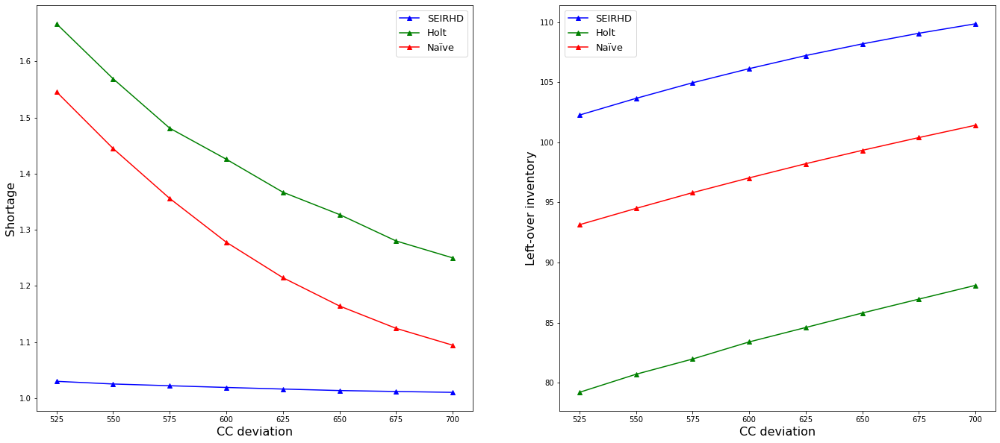

In [ ]:
#protocol_coef_variation=[3,3.5,4,4.5,5]
#service_level_variation

df_data=df_presentation_combine_relative
#df_data=df_presentation_combine

plt.figure(figsize=(23,10))

plt.subplot(1, 2, 1)
#this part plots different Protocol coefficient and their related shortages
#plt.figure(figsize=(17,8.5))

x_combine=List_CC_dev_step
y_shortage_SIR_combine=df_data['SIR forecast: Shortage']
y_shortage_Holt_combine=df_data['Holt forecast: Shortage']
y_shortage_Naive_combine=df_data['Naive forecast: Shortage']

#x=range(len(y_bias_SIR))

plt.plot(x_combine,y_shortage_SIR_combine, color = 'blue',label='SEIRHD',marker='^')
plt.plot(x_combine,y_shortage_Holt_combine, color = 'green',label='Holt',marker='^')
plt.plot(x_combine,y_shortage_Naive_combine, color = 'red',label='Naïve',marker='^')



#chart.set_xticklabels(chart.get_xmajorticklabels(), fontsize = 14)
#chart.set_yticklabels(chart.get_ymajorticklabels(), fontsize = 12)
plt.ylabel("Shortage", size=16)
plt.xlabel("CC deviation", size=16)
#plt.title("Total number of shortage with different protocol coefficient", size=18)
plt.legend(fontsize=13)

plt.subplot(1, 2, 2)
#this part plots different Protocol coefficient and their related real costs
#plt.figure(figsize=(17,8.5))


x=List_CC_dev_step
y_inventory_SIR_combine=df_data['SIR forecast: Inventory level at the end']
y_inventory_Holt_combine=df_data['Holt forecast: Inventory level at the end']
y_inventory_Naive_combine=df_data['Naive forecast: Inventory level at the end']

#x=range(len(y_bias_SIR))

plt.plot(x_combine,y_inventory_SIR_combine, color = 'blue',label='SEIRHD',marker='^')
plt.plot(x_combine,y_inventory_Holt_combine, color = 'green',label='Holt',marker='^')
plt.plot(x_combine,y_inventory_Naive_combine, color = 'red',label='Naïve',marker='^')



#chart.set_xticklabels(chart.get_xmajorticklabels(), fontsize = 14)
#chart.set_yticklabels(chart.get_ymajorticklabels(), fontsize = 12)
plt.ylabel("Shortage", size=16)
plt.xlabel("CC deviation", size=16)


#chart.set_xticklabels(chart.get_xmajorticklabels(), fontsize = 14)
#chart.set_yticklabels(chart.get_ymajorticklabels(), fontsize = 12)
plt.ylabel("Left-over inventory", size=16)
plt.xlabel("CC deviation", size=16)
#plt.title("Real cost with different protocol coefficient", size=18)
plt.legend(fontsize=13)


#plt.savefig('Shortage and left-over inventory for 1000 scenarios over 10 steps for CC deviation',dpi=300)


## Data Analysis



### Comparison:

#### Shortage:

##### SIR

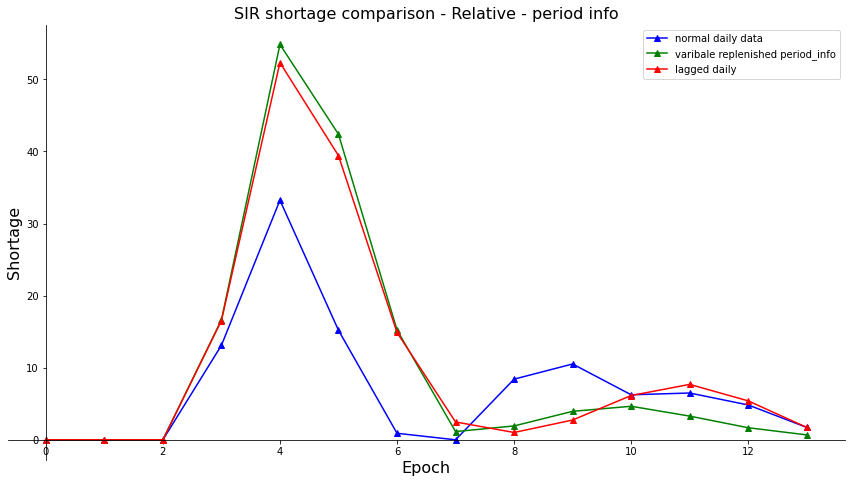

In [ ]:
graph_generator_for_epochs_title(shortage_epoch_df_SIR_relative_to_demand,
                                 shortage_epoch_df_SIR_relative_to_demand_replenished_var,
                                 shortage_epoch_df_SIR_relative_to_demand_lagged_daily,
                                 'Shortage',
                                 'normal daily data',
                                 'varibale replenished period_info',
                                 'lagged daily',
                                 'SIR shortage comparison - Relative - period info')

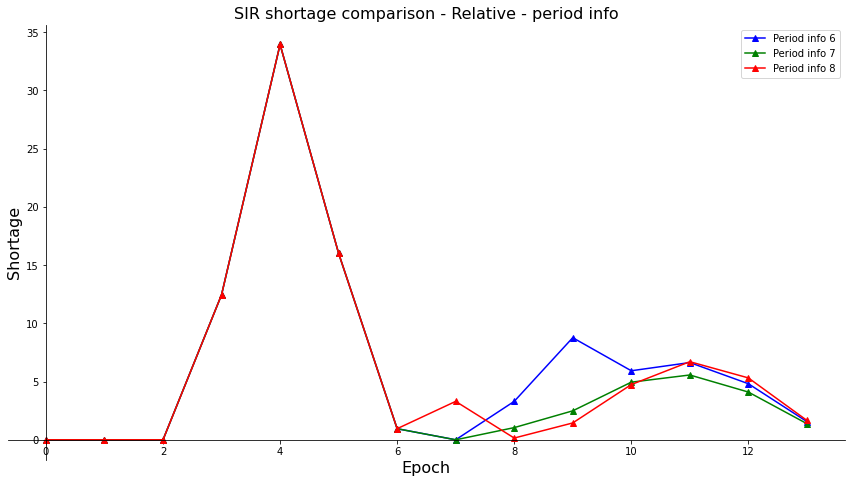

In [ ]:
graph_generator_for_epochs_title(shortage_epoch_df_SIR_relative_to_demand_replenished_6,
                                 shortage_epoch_df_SIR_relative_to_demand_replenished_7,
                                 shortage_epoch_df_SIR_relative_to_demand_replenished_8,
                                 'Shortage',
                                 'Period info 6',
                                 'Period info 7',
                                 'Period info 8',
                                 'SIR shortage comparison - Relative - period info')

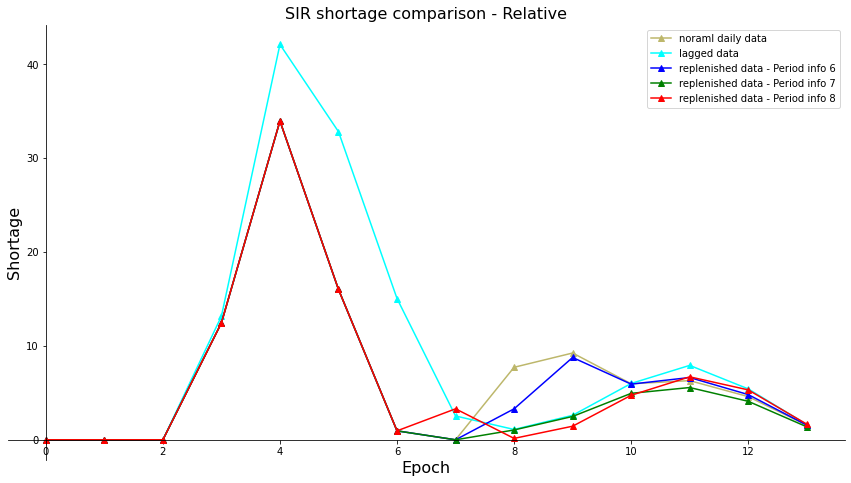

In [ ]:
graph_generator_for_epochs_title_2(shortage_epoch_df_SIR_relative_to_demand,
                                 shortage_epoch_df_SIR_relative_to_demand_lagged_daily,
                                 shortage_epoch_df_SIR_relative_to_demand_replenished_6,
                                 shortage_epoch_df_SIR_relative_to_demand_replenished_7,
                                 shortage_epoch_df_SIR_relative_to_demand_replenished_8,
                                 'Shortage',
                                 'noraml daily data',
                                 'lagged data',
                                 'replenished data - Period info 6',
                                 'replenished data - Period info 7',
                                 'replenished data - Period info 8',
                                 'SIR shortage comparison - Relative')

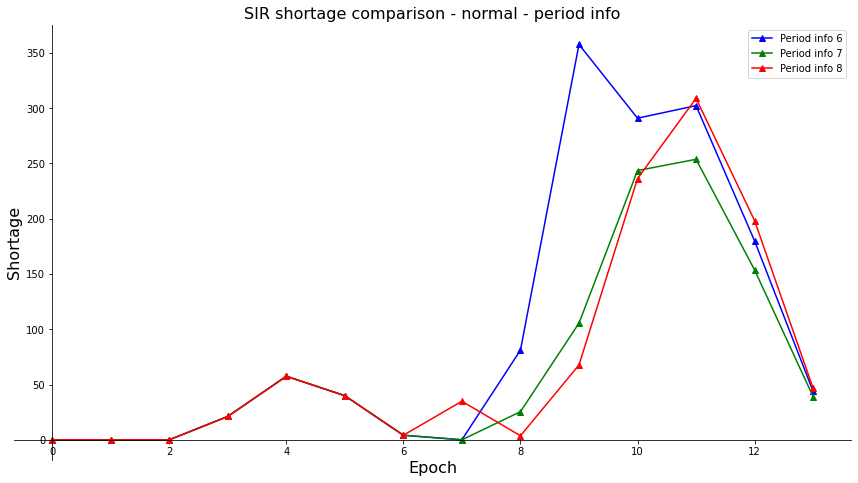

In [ ]:
graph_generator_for_epochs_title(shortage_epoch_df_SIR_replenished_6,
                                 shortage_epoch_df_SIR_replenished_7,
                                 shortage_epoch_df_SIR_replenished_8,
                                 'Shortage',
                                 'Period info 6',
                                 'Period info 7',
                                 'Period info 8',
                                 'SIR shortage comparison - normal - period info')

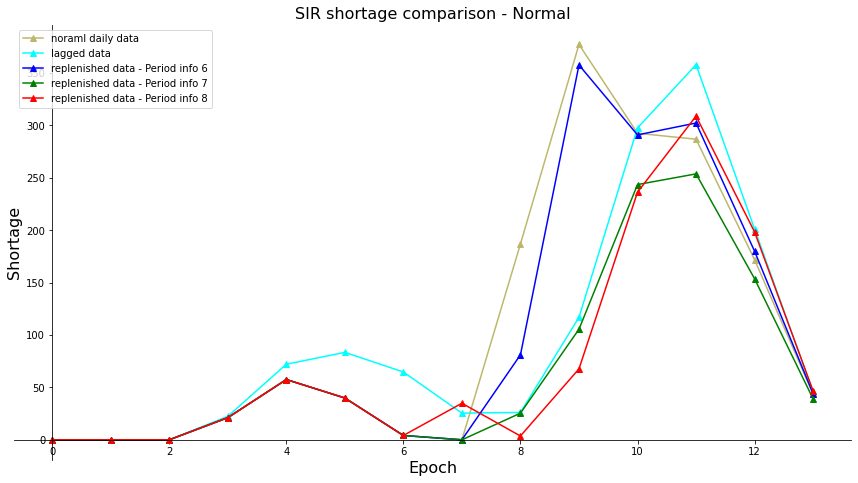

In [ ]:
graph_generator_for_epochs_title_2(shortage_epoch_df_SIR,
                                 shortage_epoch_df_SIR_lagged_daily,
                                 shortage_epoch_df_SIR_replenished_6,
                                 shortage_epoch_df_SIR_replenished_7,
                                 shortage_epoch_df_SIR_replenished_8,
                                 'Shortage',
                                 'noraml daily data',
                                 'lagged data',
                                 'replenished data - Period info 6',
                                 'replenished data - Period info 7',
                                 'replenished data - Period info 8',
                                 'SIR shortage comparison - Normal')

In [ ]:
#df1=shortage_epoch_df_SIR_relative_to_demand.mean().to_frame().reset_index(drop=True)
#df1.columns=['base']

#df2=shortage_epoch_df_SIR_relative_to_demand_lagged_daily.mean().to_frame().reset_index(drop=True)
#df2.columns=['lagged']

#df3=shortage_epoch_df_SIR_relative_to_demand_replenished.mean().to_frame().reset_index(drop=True)
#df3.columns=['replenished']

#df=pd.concat([df1,df2,df3],axis=1)
#df

##### Holt

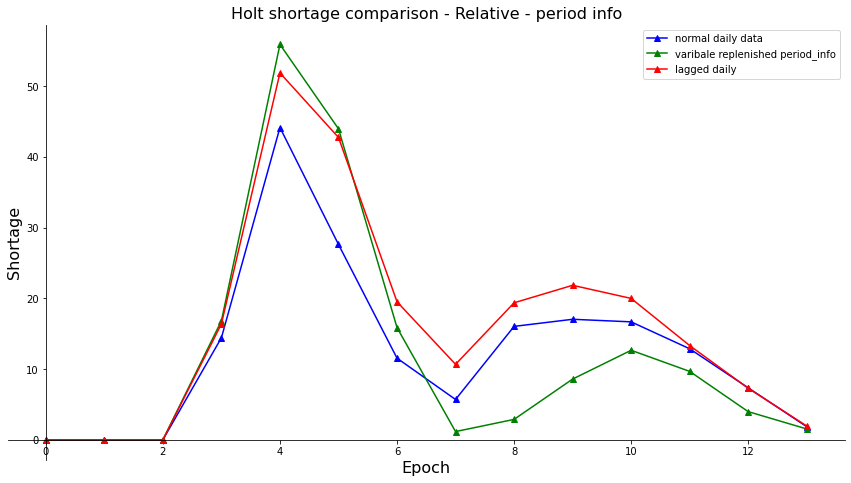

In [ ]:
graph_generator_for_epochs_title(shortage_epoch_df_Holt_relative_to_demand,
                                 shortage_epoch_df_Holt_relative_to_demand_replenished_var,
                                 shortage_epoch_df_Holt_relative_to_demand_lagged_daily,
                                 'Shortage',
                                 'normal daily data',
                                 'varibale replenished period_info',
                                 'lagged daily',
                                 'Holt shortage comparison - Relative - period info')

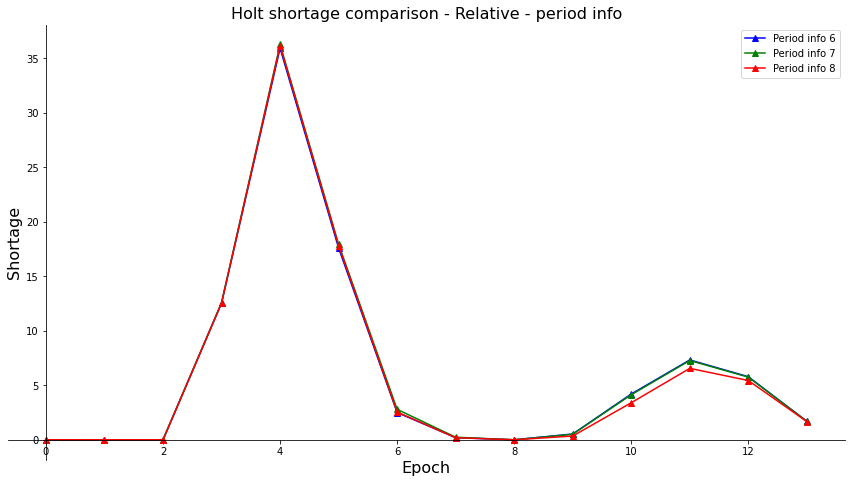

In [ ]:
graph_generator_for_epochs_title(shortage_epoch_df_Holt_relative_to_demand_replenished_6,
                                 shortage_epoch_df_Holt_relative_to_demand_replenished_7,
                                 shortage_epoch_df_Holt_relative_to_demand_replenished_8,
                                 'Shortage',
                                 'Period info 6',
                                 'Period info 7',
                                 'Period info 8',
                                 'Holt shortage comparison - Relative - period info')

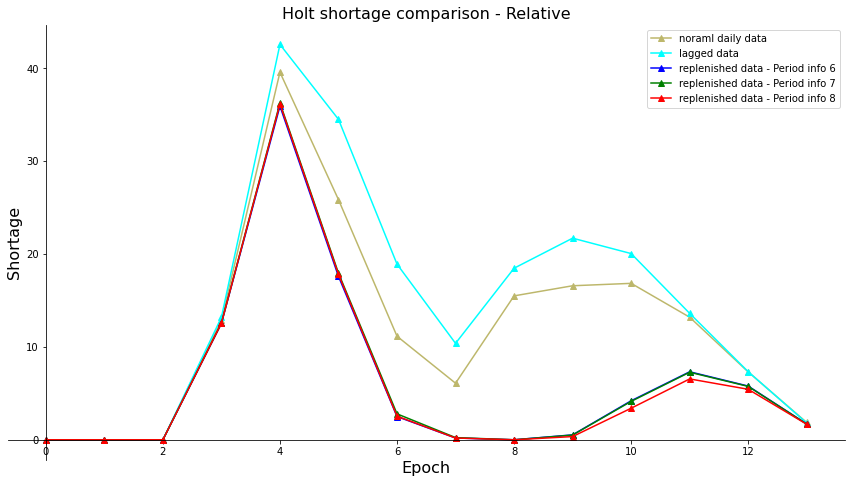

In [ ]:
graph_generator_for_epochs_title_2(shortage_epoch_df_Holt_relative_to_demand,
                                 shortage_epoch_df_Holt_relative_to_demand_lagged_daily,
                                 shortage_epoch_df_Holt_relative_to_demand_replenished_6,
                                 shortage_epoch_df_Holt_relative_to_demand_replenished_7,
                                 shortage_epoch_df_Holt_relative_to_demand_replenished_8,
                                 'Shortage',
                                 'noraml daily data',
                                 'lagged data',
                                 'replenished data - Period info 6',
                                 'replenished data - Period info 7',
                                 'replenished data - Period info 8',
                                 'Holt shortage comparison - Relative')

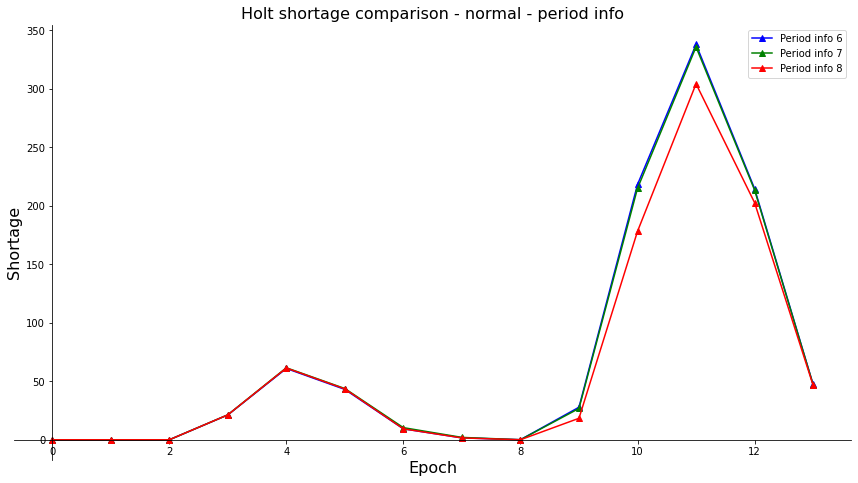

In [ ]:
graph_generator_for_epochs_title(shortage_epoch_df_Holt_replenished_6,
                                 shortage_epoch_df_Holt_replenished_7,
                                 shortage_epoch_df_Holt_replenished_8,
                                 'Shortage',
                                 'Period info 6',
                                 'Period info 7',
                                 'Period info 8',
                                 'Holt shortage comparison - normal - period info')

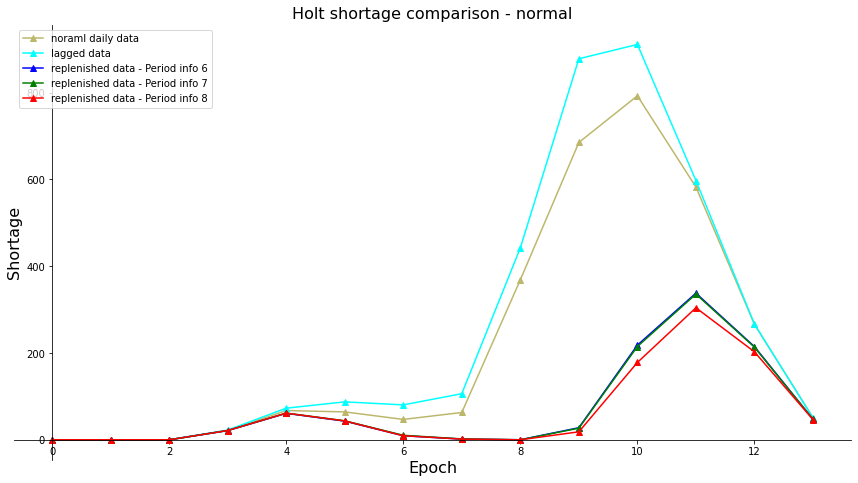

In [ ]:
graph_generator_for_epochs_title_2(shortage_epoch_df_Holt,
                                 shortage_epoch_df_Holt_lagged_daily,
                                 shortage_epoch_df_Holt_replenished_6,
                                 shortage_epoch_df_Holt_replenished_7,
                                 shortage_epoch_df_Holt_replenished_8,
                                 'Shortage',
                                 'noraml daily data',
                                 'lagged data',
                                 'replenished data - Period info 6',
                                 'replenished data - Period info 7',
                                 'replenished data - Period info 8',
                                 'Holt shortage comparison - normal')

##### Naive

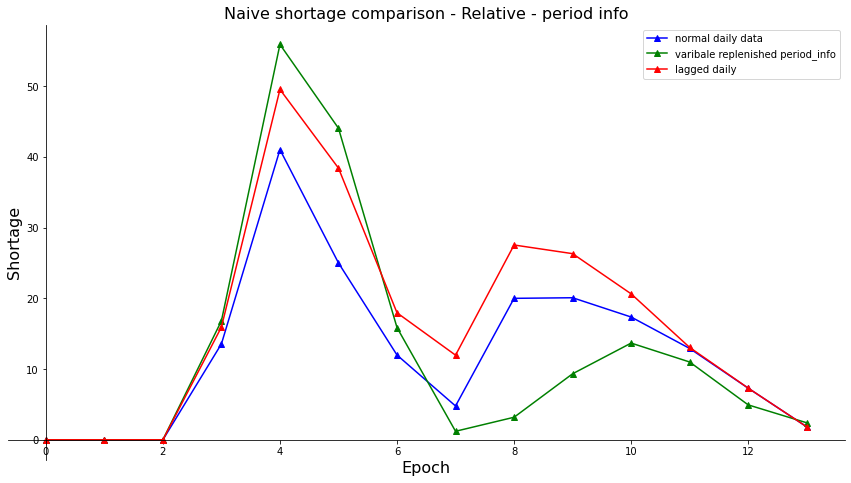

In [ ]:
graph_generator_for_epochs_title(shortage_epoch_df_Naive_relative_to_demand,
                                 shortage_epoch_df_Naive_relative_to_demand_replenished_var,
                                 shortage_epoch_df_Naive_relative_to_demand_lagged_daily,
                                 'Shortage',
                                 'normal daily data',
                                 'varibale replenished period_info',
                                 'lagged daily',
                                 'Naive shortage comparison - Relative - period info')

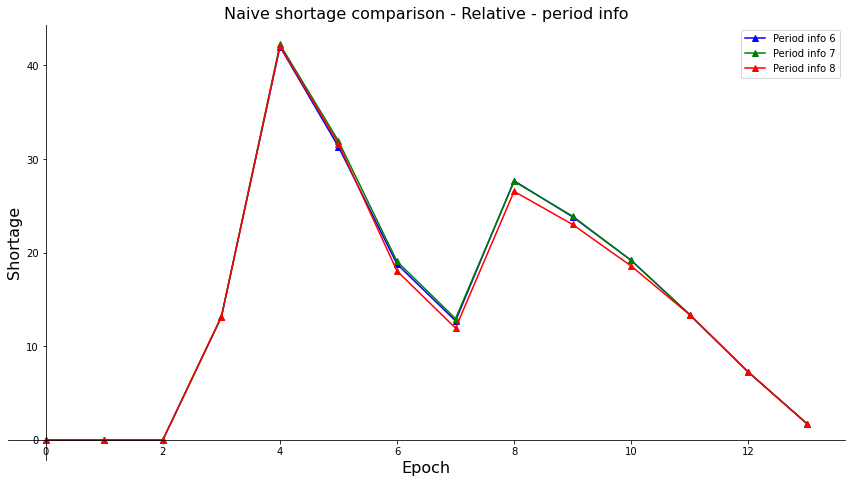

In [ ]:
graph_generator_for_epochs_title(shortage_epoch_df_Naive_relative_to_demand_replenished_6,
                                 shortage_epoch_df_Naive_relative_to_demand_replenished_7,
                                 shortage_epoch_df_Naive_relative_to_demand_replenished_8,
                                 'Shortage',
                                 'Period info 6',
                                 'Period info 7',
                                 'Period info 8',
                                 'Naive shortage comparison - Relative - period info')

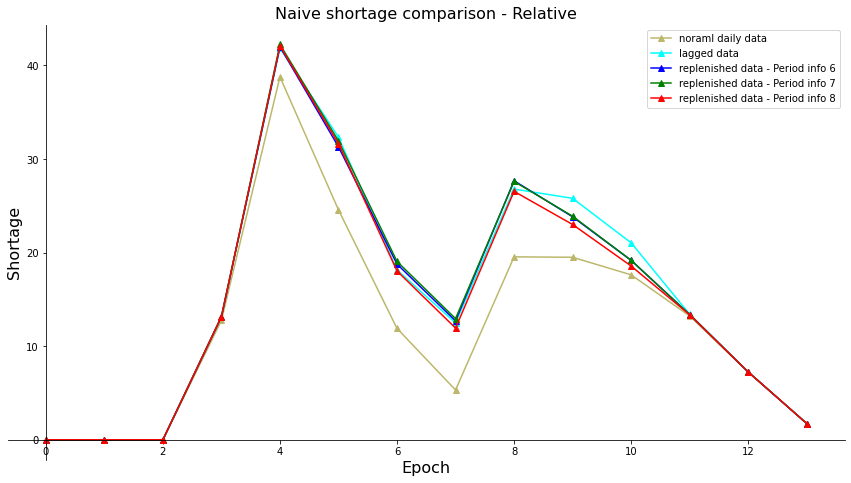

In [ ]:
graph_generator_for_epochs_title_2(shortage_epoch_df_Naive_relative_to_demand,
                                 shortage_epoch_df_Naive_relative_to_demand_lagged_daily,
                                 shortage_epoch_df_Naive_relative_to_demand_replenished_6,
                                 shortage_epoch_df_Naive_relative_to_demand_replenished_7,
                                 shortage_epoch_df_Naive_relative_to_demand_replenished_8,
                                 'Shortage',
                                 'noraml daily data',
                                 'lagged data',
                                 'replenished data - Period info 6',
                                 'replenished data - Period info 7',
                                 'replenished data - Period info 8',
                                 'Naive shortage comparison - Relative')

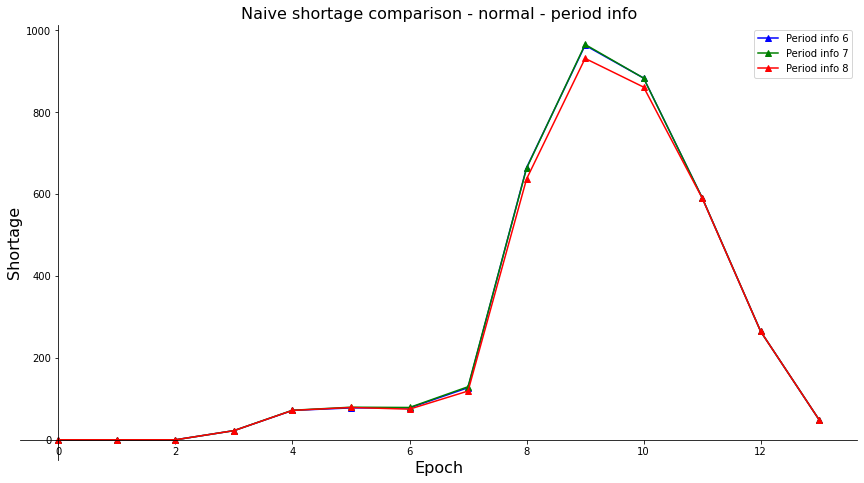

In [ ]:
graph_generator_for_epochs_title(shortage_epoch_df_Naive_replenished_6,
                                 shortage_epoch_df_Naive_replenished_7,
                                 shortage_epoch_df_Naive_replenished_8,
                                 'Shortage',
                                 'Period info 6',
                                 'Period info 7',
                                 'Period info 8',
                                 'Naive shortage comparison - normal - period info')

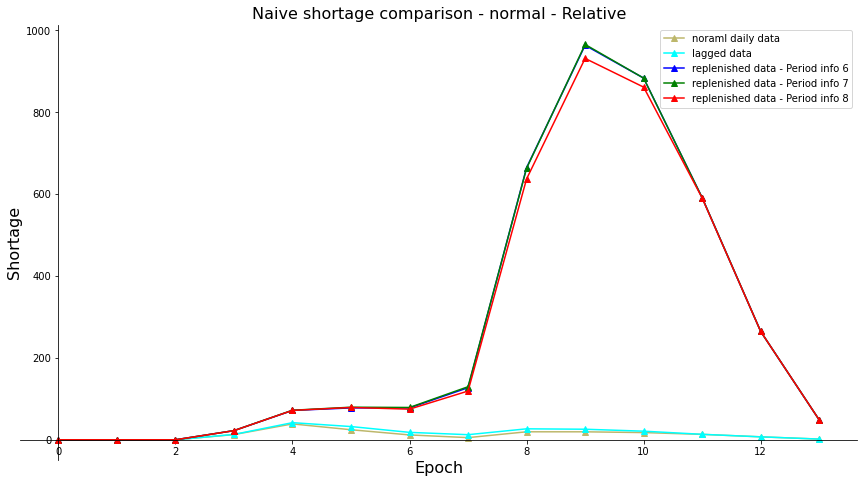

In [ ]:
graph_generator_for_epochs_title_2(shortage_epoch_df_Naive_relative_to_demand,
                                   shortage_epoch_df_Naive_relative_to_demand_lagged_daily,
                                   shortage_epoch_df_Naive_replenished_6,
                                   shortage_epoch_df_Naive_replenished_7,
                                   shortage_epoch_df_Naive_replenished_8,
                                   'Shortage',
                                   'noraml daily data',
                                   'lagged data',
                                   'replenished data - Period info 6',
                                   'replenished data - Period info 7',
                                   'replenished data - Period info 8',
                                   'Naive shortage comparison - normal - Relative')

#### Left_over inventory:

##### SIR

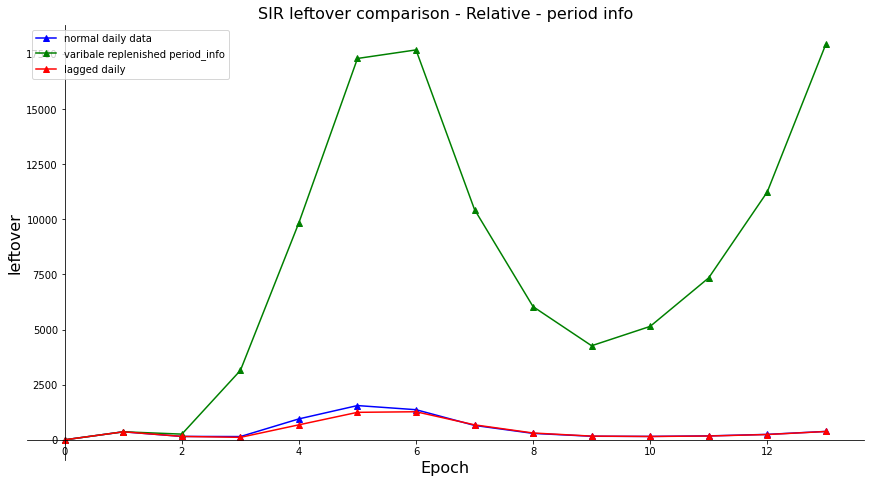

In [ ]:
graph_generator_for_epochs_title(leftover_epoch_df_SIR_relative_to_demand,
                                 leftover_epoch_df_SIR_relative_to_demand_replenished_var,
                                 leftover_epoch_df_SIR_relative_to_demand_lagged_daily,
                                 'leftover',
                                 'normal daily data',
                                 'varibale replenished period_info',
                                 'lagged daily',
                                 'SIR leftover comparison - Relative - period info')

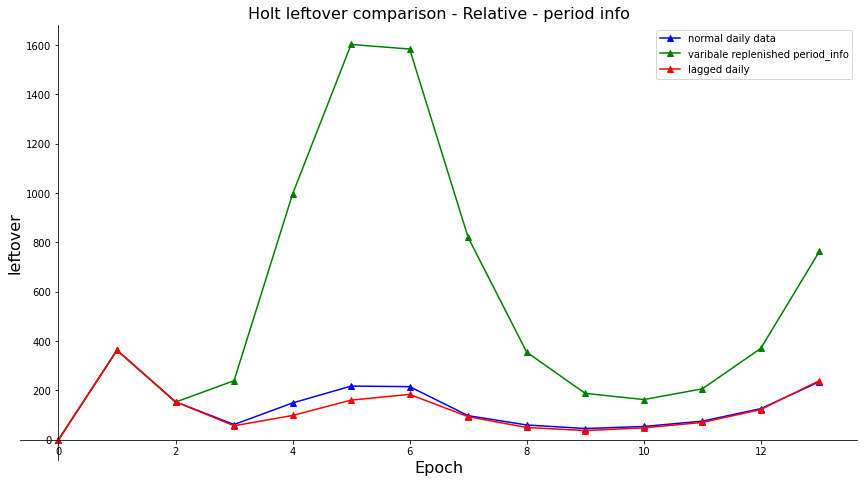

In [ ]:
# Holt
graph_generator_for_epochs_title(leftover_epoch_df_Holt_relative_to_demand,
                                 leftover_epoch_df_Holt_relative_to_demand_replenished_var,
                                 leftover_epoch_df_Holt_relative_to_demand_lagged_daily,
                                 'leftover',
                                 'normal daily data',
                                 'varibale replenished period_info',
                                 'lagged daily',
                                 'Holt leftover comparison - Relative - period info')

In [ ]:
leftover_epoch_df_SIR_relative_to_demand_replenished_6

,SIR left-over inventory of epoch: 0,SIR left-over inventory of epoch: 1,SIR left-over inventory of epoch: 2,SIR left-over inventory of epoch: 3,SIR left-over inventory of epoch: 4,SIR left-over inventory of epoch: 5,SIR left-over inventory of epoch: 6,SIR left-over inventory of epoch: 7,SIR left-over inventory of epoch: 8,SIR left-over inventory of epoch: 9,SIR left-over inventory of epoch: 10,SIR left-over inventory of epoch: 11,SIR left-over inventory of epoch: 12,SIR left-over inventory of epoch: 13,SIR left-over inventory of epoch: 14,SIR left-over inventory of epoch: 15,SIR left-over inventory of epoch: 16,SIR left-over inventory of epoch: 17,SIR left-over inventory of epoch: 18
0,0,322.53521127,86.17886179,130.40935673,1288.55721393,1180.64516129,472.56097561,180.84358524,2.68398268,9.64380906,6.05419950,4.39215686,11.61305042,45.65877353,224.33192686,375.67975831,844.24778761,1059.36254980,6465.43209877
1,0,417.24137931,227.02702703,60.00000000,535.43307087,1668.31683168,1611.74785100,803.16159251,309.82042649,84.01438379,69.99688764,75.10217984,98.17262830,225.54086538,461.23310811,979.19896641,1571.08695652,2438.06228374,17785.00000000
2,0,270.37037037,123.46938776,373.28767123,1918.23204420,1754.81481481,1114.50000000,247.08112206,47.23311547,70.25959368,58.02675585,85.51633124,82.62737876,125.41780023,396.08457322,482.18451750,840.92741935,1325.58139535,8389.36170213
3,0,289.61038961,84.29752066,0.00000000,0.00000000,1434.88372093,1629.01353965,990.46822742,493.79733141,286.59489128,264.86865851,317.73664480,403.62880886,660.34072900,1071.54650523,1536.77581864,2595.14705882,4241.76904177,23229.72972973
4,0,289.61038961,93.91304348,0.00000000,1346.24277457,2031.71641791,1565.84905660,929.33920705,376.58298988,126.06074140,133.42812823,89.42584793,152.05572545,262.33287229,455.32435741,1046.61016949,1254.01360544,2357.40740741,11324.35897436
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0,354.54545455,151.61290323,0.00000000,438.74345550,2089.68253968,2170.77625571,1099.22254616,367.85861077,106.31145667,139.38927380,186.94665153,357.30519481,564.56382454,869.58620690,1187.41116751,1791.96141479,3105.14285714,16228.35820896
9996,0,400.00000000,200.00000000,20.30075188,1086.31578947,2107.40740741,1738.64628821,1072.60127932,366.00078339,177.56542193,135.77379450,148.29756795,169.38710702,257.21969384,477.48786408,945.13184584,1435.88907015,2548.21428571,13490.47619048
9997,0,417.24137931,333.33333333,649.09090909,563.93442623,434.83146067,300.57803468,119.52380952,185.74537541,120.46511628,169.21549156,229.80972516,217.41007194,161.37775268,148.86267902,201.18733509,350.58275058,446.07508532,2413.46153846
9998,0,328.57142857,125.49019608,375.52447552,2663.57615894,2128.68217054,1133.92857143,380.82706767,71.26099707,67.75918178,74.42877978,85.02261240,114.43816698,235.57603687,455.16304348,627.42980562,884.17508418,1432.75362319,8277.96610169


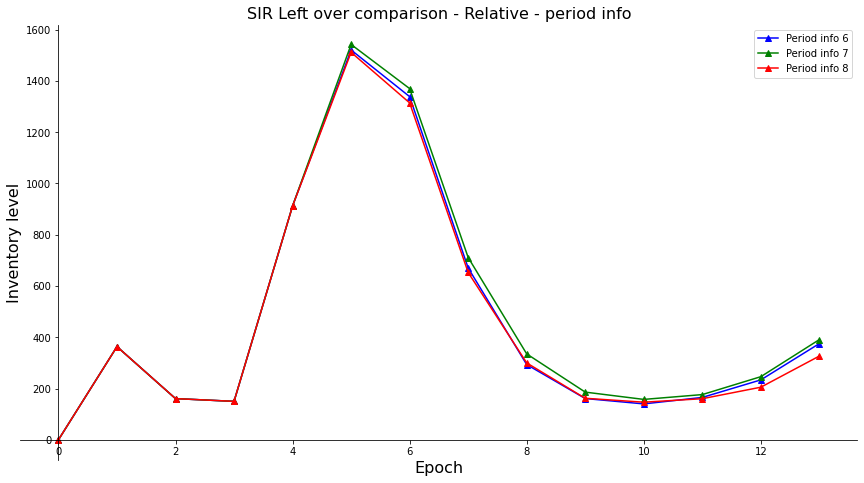

In [ ]:
graph_generator_for_epochs_title(leftover_epoch_df_SIR_relative_to_demand_replenished_6,
                                 leftover_epoch_df_SIR_relative_to_demand_replenished_7,
                                 leftover_epoch_df_SIR_relative_to_demand_replenished_8,
                                 'Inventory level',
                                 'Period info 6',
                                 'Period info 7',
                                 'Period info 8',
                                 'SIR Left over comparison - Relative - period info')

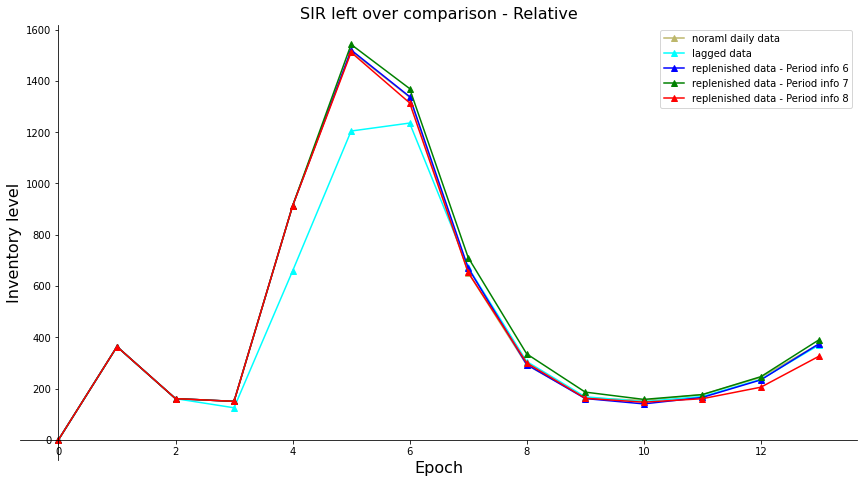

In [ ]:
graph_generator_for_epochs_title_2(leftover_epoch_df_SIR_relative_to_demand,
                                 leftover_epoch_df_SIR_relative_to_demand_lagged_daily,
                                 leftover_epoch_df_SIR_relative_to_demand_replenished_6,
                                 leftover_epoch_df_SIR_relative_to_demand_replenished_7,
                                 leftover_epoch_df_SIR_relative_to_demand_replenished_8,
                                 'Inventory level',
                                 'noraml daily data',
                                 'lagged data',
                                 'replenished data - Period info 6',
                                 'replenished data - Period info 7',
                                 'replenished data - Period info 8',
                                 'SIR left over comparison - Relative')

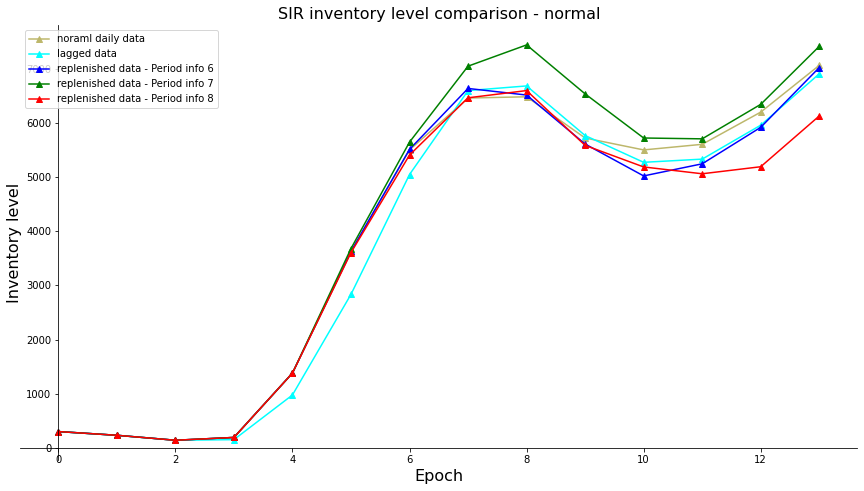

In [ ]:
graph_generator_for_epochs_title_2(leftover_epoch_df_SIR,
                                 leftover_epoch_df_SIR_lagged_daily,
                                 leftover_epoch_df_SIR_replenished_6,
                                 leftover_epoch_df_SIR_replenished_7,
                                 leftover_epoch_df_SIR_replenished_8,
                                 'Inventory level',
                                 'noraml daily data',
                                 'lagged data',
                                 'replenished data - Period info 6',
                                 'replenished data - Period info 7',
                                 'replenished data - Period info 8',
                                 'SIR inventory level comparison - normal')

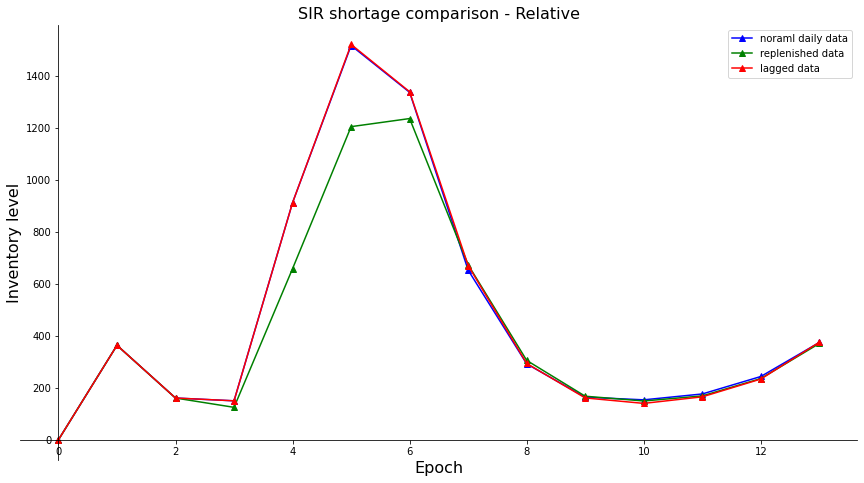

In [ ]:

graph_generator_for_epochs_title(leftover_epoch_df_SIR_relative_to_demand,
                                 leftover_epoch_df_SIR_relative_to_demand_lagged_daily,
                                 leftover_epoch_df_SIR_relative_to_demand_replenished_6,
                                 'Inventory level',
                                 'noraml daily data',
                                 'replenished data',
                                 'lagged data',
                                 'SIR shortage comparison - Relative')

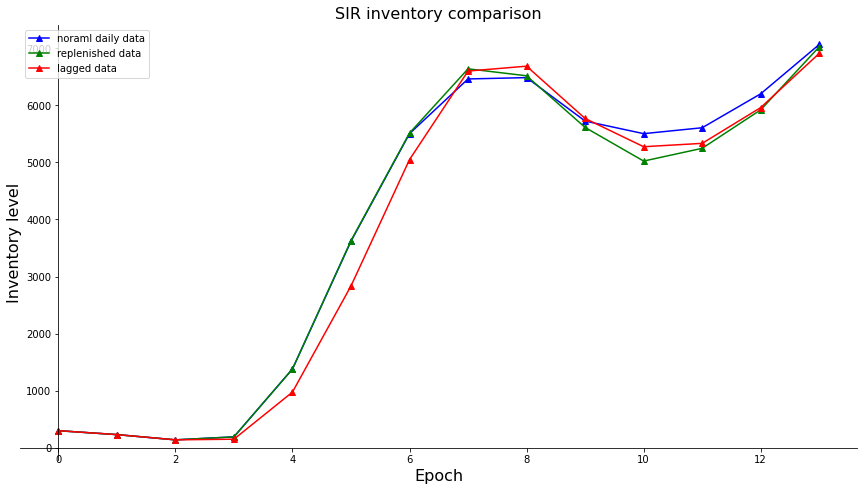

In [ ]:
graph_generator_for_epochs_title(leftover_epoch_df_SIR,
                                 leftover_epoch_df_SIR_replenished_6,
                                 leftover_epoch_df_SIR_lagged_daily,
                                 'Inventory level',
                                 'noraml daily data',
                                 'replenished data',
                                 'lagged data',
                                 'SIR inventory comparison')


##### Holt

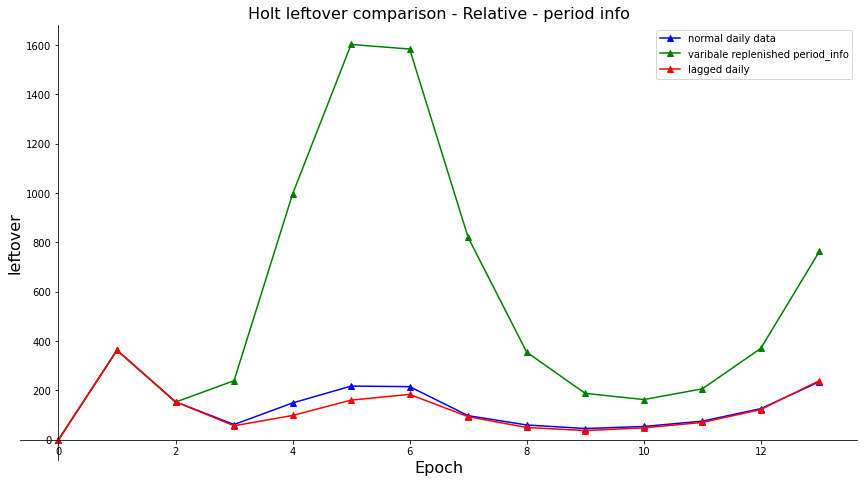

In [ ]:
graph_generator_for_epochs_title(leftover_epoch_df_Holt_relative_to_demand,
                                 leftover_epoch_df_Holt_relative_to_demand_replenished_var,
                                 leftover_epoch_df_Holt_relative_to_demand_lagged_daily,
                                 'leftover',
                                 'normal daily data',
                                 'varibale replenished period_info',
                                 'lagged daily',
                                 'Holt leftover comparison - Relative - period info')

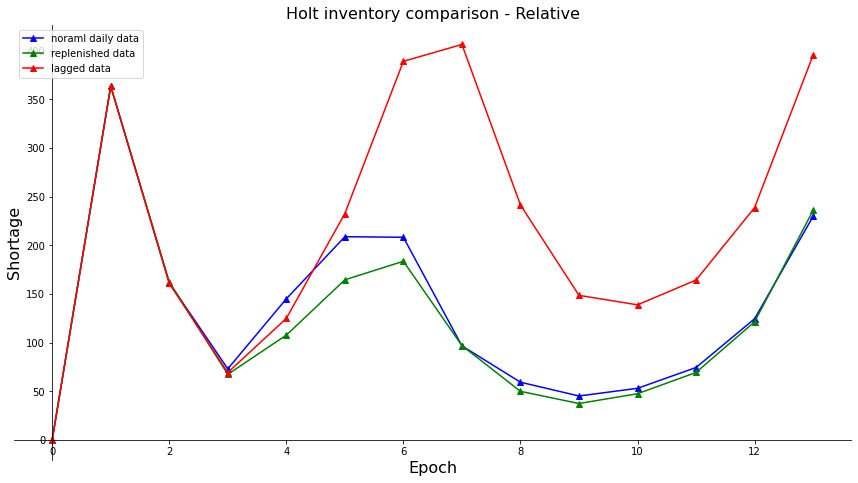

In [ ]:

graph_generator_for_epochs_title(leftover_epoch_df_Holt_relative_to_demand,
                                 leftover_epoch_df_Holt_relative_to_demand_lagged_daily,
                                 leftover_epoch_df_Holt_relative_to_demand_replenished_6,
                                 'Shortage',
                                 'noraml daily data',
                                 'replenished data',
                                 'lagged data',
                                 'Holt inventory comparison - Relative')

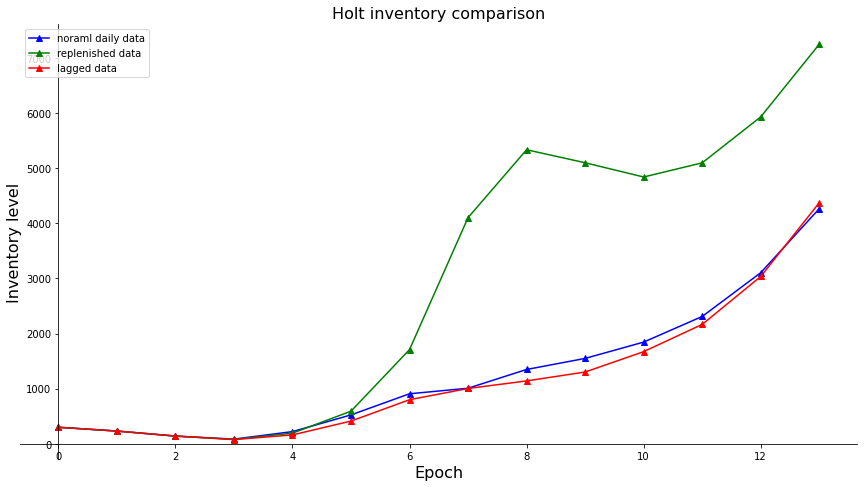

In [ ]:
graph_generator_for_epochs_title(leftover_epoch_df_Holt,
                                 leftover_epoch_df_Holt_replenished_6,
                                 leftover_epoch_df_Holt_lagged_daily,
                                 'Inventory level',
                                 'noraml daily data',
                                 'replenished data',
                                 'lagged data',
                                 'Holt inventory comparison')


##### Naive

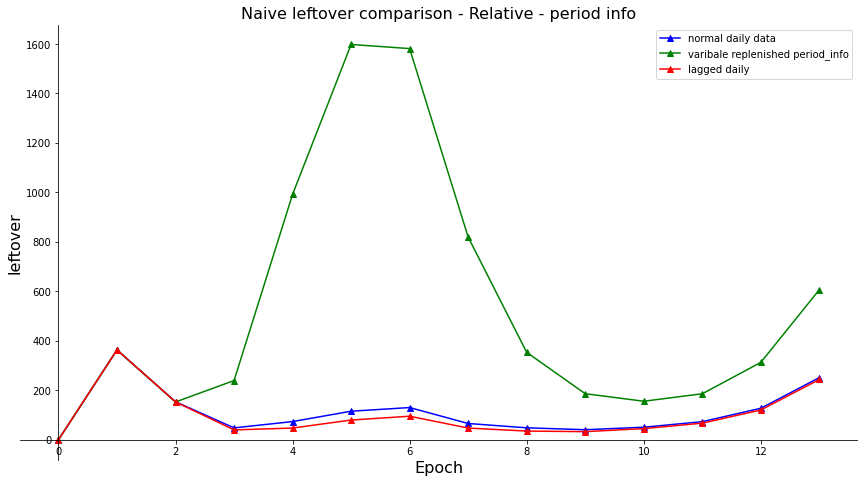

In [ ]:
graph_generator_for_epochs_title(leftover_epoch_df_Naive_relative_to_demand,
                                 leftover_epoch_df_Naive_relative_to_demand_replenished_var,
                                 leftover_epoch_df_Naive_relative_to_demand_lagged_daily,
                                 'leftover',
                                 'normal daily data',
                                 'varibale replenished period_info',
                                 'lagged daily',
                                 'Naive leftover comparison - Relative - period info')

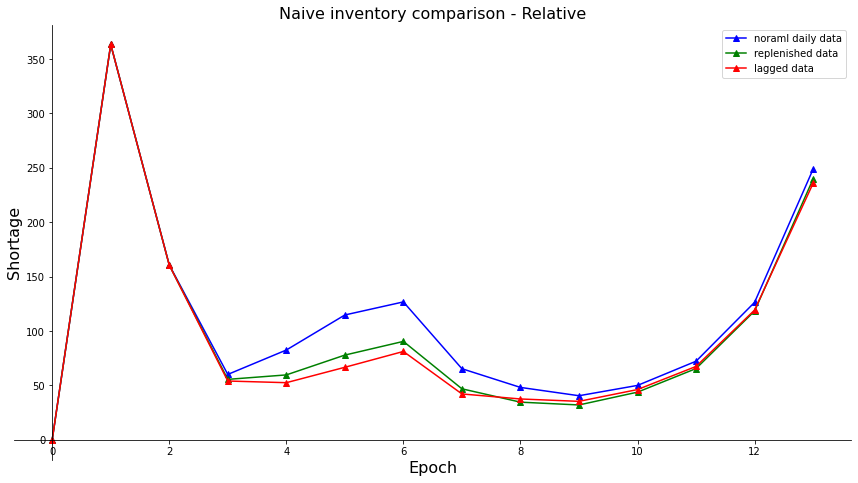

In [ ]:

graph_generator_for_epochs_title(leftover_epoch_df_Naive_relative_to_demand,
                                 leftover_epoch_df_Naive_relative_to_demand_lagged_daily,
                                 leftover_epoch_df_Naive_relative_to_demand_replenished_6,
                                 'Shortage',
                                 'noraml daily data',
                                 'replenished data',
                                 'lagged data',
                                 'Naive inventory comparison - Relative')

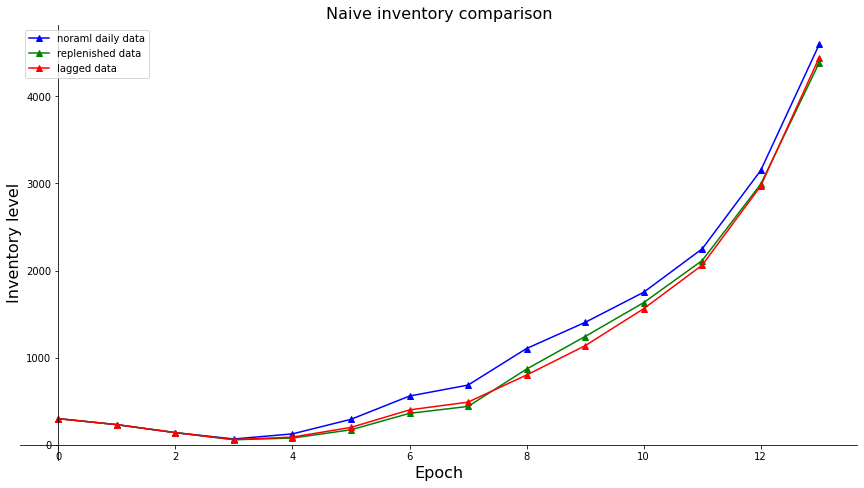

In [ ]:
graph_generator_for_epochs_title(leftover_epoch_df_Naive,
                                 leftover_epoch_df_Naive_replenished_6,
                                 leftover_epoch_df_Naive_lagged_daily,
                                 'Inventory level',
                                 'noraml daily data',
                                 'replenished data',
                                 'lagged data',
                                 'Naive inventory comparison')


### Scenario I:

#### Importing data

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
complete_inventory_results_scenarios=pd.read_csv('Inventory management results with 5000 scenarios.csv')
#setting the date as the index of the dataframe
complete_inventory_results_scenarios=complete_inventory_results_scenarios.drop(columns='Unnamed: 0')
#rounding up the value of forecast in the data frame 
#SIR_forecast_df=np.ceil(SIR_forecast_df)
df_data_analysis=(complete_inventory_results_scenarios.copy().reset_index()).drop(columns='index')
#df_data_analysis = df_data_analysis.apply(pd.to_numeric)


In [ ]:
df_data_analysis=complete_inventory_results_scenarios.copy()

#### Analysis 1: Picking the best performer 

In [ ]:
# copying the complete dataframe into another for data manupulation
df_data_analysis=complete_inventory_results_scenarios_lagged_daily.copy()

In [ ]:
# SHORTAGE ANALYSIS
#========================================================================

# Picking the minimum shrotage value among all three methods
df_data_analysis['Minimum shortage value']=df_data_analysis[['SIR forecast: Shortage',
                                                             'Holt forecast: Shortage',
                                                             'Naive forecast: Shortage']].min(axis=1)

# Picking the best performer in the shortage category:
df_data_analysis['Best method: Shortage']=df_data_analysis.apply(lambda x: 
                                                                 'SIR' if x['SIR forecast: Shortage'] < x['Holt forecast: Shortage'] 
                                                                 and x['SIR forecast: Shortage'] < x['Naive forecast: Shortage'] 
                                                                 else ('Holt' if 
                                                                       x['Holt forecast: Shortage'] < x['SIR forecast: Shortage'] 
                                                                       and x['Holt forecast: Shortage'] < x['Naive forecast: Shortage'] 
                                                                       else ('Naive' if 
                                                                             x['Naive forecast: Shortage'] < x['SIR forecast: Shortage'] 
                                                                             and x['Naive forecast: Shortage'] < x['Holt forecast: Shortage'] 
                                                                             else ('SIR & Holt & Naive' if x['SIR forecast: Shortage']==x['Naive forecast: Shortage'] 
                                                                                   and  x['SIR forecast: Shortage']==x['Holt forecast: Shortage']
                                                                                   else ('SIR & Holt' if x['SIR forecast: Shortage']==x['Holt forecast: Shortage'] 
                                                                                         else ('Holt & Naive' if x['Holt forecast: Shortage']==x['Naive forecast: Shortage'] 
                                                                                               else ('SIR & Naive' if x['SIR forecast: Shortage']==x['Naive forecast: Shortage'] else "ERROR" )))))),axis=1)


In [ ]:
# LEFT-OVER ANALYSIS
#========================================================================
# Lowest left-over inventory percentage
#================================
# In this section, the left-over percentage is calulated by :
# number of left-over inventory / total number of units ordered

df_data_analysis['SIR forecast: left-over percentage']=df_data_analysis['SIR forecast: Inventory level at the end']*100/df_data_analysis['SIR forecast: Total number of units ordered']
df_data_analysis['Holt forecast: left-over percentage']=df_data_analysis['Holt forecast: Inventory level at the end']*100/df_data_analysis['Holt forecast: Total number of units ordered']
df_data_analysis['Naive forecast: left-over percentage']=df_data_analysis['Naive forecast: Inventory level at the end']*100/df_data_analysis['Naive forecast: Total number of units ordered']

# Picking the best performer in the shortage category:
df_data_analysis['Best method: Lowest left-over Inventory percentage']=df_data_analysis.apply(lambda x: 
                                                                 'SIR' if x['SIR forecast: left-over percentage'] < x['Holt forecast: left-over percentage'] 
                                                                 and x['SIR forecast: left-over percentage'] < x['Naive forecast: left-over percentage'] 
                                                                 else ('Holt' if 
                                                                       x['Holt forecast: left-over percentage'] < x['SIR forecast: left-over percentage'] 
                                                                       and x['Holt forecast: left-over percentage'] < x['Naive forecast: left-over percentage'] 
                                                                       else ('Naive' if 
                                                                             x['Naive forecast: left-over percentage'] < x['SIR forecast: left-over percentage'] 
                                                                             and x['Naive forecast: left-over percentage'] < x['Holt forecast: left-over percentage'] 
                                                                             else ('SIR & Holt & Naive' if x['SIR forecast: left-over percentage']==x['Naive forecast: left-over percentage'] 
                                                                                   and  x['SIR forecast: left-over percentage']==x['Holt forecast: left-over percentage']
                                                                                   else ('SIR & Holt' if x['SIR forecast: left-over percentage']==x['Holt forecast: left-over percentage'] 
                                                                                         else ('Holt & Naive' if x['Holt forecast: left-over percentage']==x['Naive forecast: left-over percentage'] 
                                                                                               else ('SIR & Naive' if x['SIR forecast: left-over percentage']==x['Naive forecast: left-over percentage'] else "ERROR" )))))),axis=1)





In [ ]:
# LEFT-OVER ANALYSIS
#========================================================================
# Lowest left-over inventory
#================================

# Picking the minimum shrotage value among all three methods
df_data_analysis['Minimum left over inventory: value']=df_data_analysis[['SIR forecast: Inventory level at the end',
                                                                         'Holt forecast: Inventory level at the end',
                                                                         'Naive forecast: Inventory level at the end']].min(axis=1)

# Picking the best performer in the shortage category:
df_data_analysis['Best method: Lowest Inventory level at the end']=df_data_analysis.apply(lambda x: 
                                                                 'SIR' if x['SIR forecast: Inventory level at the end'] < x['Holt forecast: Inventory level at the end'] 
                                                                 and x['SIR forecast: Inventory level at the end'] < x['Naive forecast: Inventory level at the end'] 
                                                                 else ('Holt' if 
                                                                       x['Holt forecast: Inventory level at the end'] < x['SIR forecast: Inventory level at the end'] 
                                                                       and x['Holt forecast: Inventory level at the end'] < x['Naive forecast: Inventory level at the end'] 
                                                                       else ('Naive' if 
                                                                             x['Naive forecast: Inventory level at the end'] < x['SIR forecast: Inventory level at the end'] 
                                                                             and x['Naive forecast: Inventory level at the end'] < x['Holt forecast: Inventory level at the end'] 
                                                                             else ('SIR & Holt & Naive' if x['SIR forecast: Inventory level at the end']==x['Naive forecast: Inventory level at the end'] 
                                                                                   and  x['SIR forecast: Inventory level at the end']==x['Holt forecast: Inventory level at the end']
                                                                                   else ('SIR & Holt' if x['SIR forecast: Inventory level at the end']==x['Holt forecast: Inventory level at the end'] 
                                                                                         else ('Holt & Naive' if x['Holt forecast: Inventory level at the end']==x['Naive forecast: Inventory level at the end'] 
                                                                                               else ('SIR & Naive' if x['SIR forecast: Inventory level at the end']==x['Naive forecast: Inventory level at the end'] else "ERROR" )))))),axis=1)





In [ ]:
# LEFT-OVER ANALYSIS
#========================================================================
# Highest left-over inventory
#================================

# Picking the minimum shrotage value among all three methods
df_data_analysis['Maximum left over inventory: value']=df_data_analysis[['SIR forecast: Inventory level at the end',
                                                                         'Holt forecast: Inventory level at the end',
                                                                         'Naive forecast: Inventory level at the end']].max(axis=1)

# Picking the best performer in the shortage category:
df_data_analysis['Best method: Highest Inventory level at the end']=df_data_analysis.apply(lambda x: 
                                                                 'SIR' if x['SIR forecast: Inventory level at the end'] > x['Holt forecast: Inventory level at the end'] 
                                                                 and x['SIR forecast: Inventory level at the end'] > x['Naive forecast: Inventory level at the end'] 
                                                                 else ('Holt' if 
                                                                       x['Holt forecast: Inventory level at the end'] > x['SIR forecast: Inventory level at the end'] 
                                                                       and x['Holt forecast: Inventory level at the end'] > x['Naive forecast: Inventory level at the end'] 
                                                                       else ('Naive' if 
                                                                             x['Naive forecast: Inventory level at the end'] > x['SIR forecast: Inventory level at the end'] 
                                                                             and x['Naive forecast: Inventory level at the end'] > x['Holt forecast: Inventory level at the end'] 
                                                                             else ('SIR & Holt & Naive' if x['SIR forecast: Inventory level at the end']==x['Naive forecast: Inventory level at the end'] 
                                                                                   and  x['SIR forecast: Inventory level at the end']==x['Holt forecast: Inventory level at the end']
                                                                                   else ('SIR & Holt' if x['SIR forecast: Inventory level at the end']==x['Holt forecast: Inventory level at the end'] 
                                                                                         else ('Holt & Naive' if x['Holt forecast: Inventory level at the end']==x['Naive forecast: Inventory level at the end'] 
                                                                                               else ('SIR & Naive' if x['SIR forecast: Inventory level at the end']==x['Naive forecast: Inventory level at the end'] else "ERROR" )))))),axis=1)





In [ ]:
df_data_analysis

#### Analysis 2: Best performers' count

###### Multi-index count

In [ ]:
df_data_analysis.head()

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,SIR forecast: Number of epochs with shortage,SIR forecast: Total number of units ordered,SIR forecast: Number of orders,SIR forecast: Real cost,SIR forecast: Total cost,SIR forecast: Average effective percentage bias,SIR forecast: Effective no. of epochs with under-forecast,SIR forecast: Effective no. of epochs with over-forecast,SIR forecast: Percentage of Effective no. of epochs with over-forecast,SIR forecast: Effective RMSE,SIR forecast: RMSE,SIR forecast: Effective MAPE,SIR forecast: MAPE,SIR forecast: Effective MAE,SIR forecast: MAE,Holt forecast: Shortage,Holt forecast: Inventory level at the end,Holt forecast: Achieved service level,Holt forecast: Number of epochs with shortage,Holt forecast: Total number of units ordered,Holt forecast: Number of orders,Holt forecast: Real cost,Holt forecast: Total cost,Holt forecast: Average effective percentage bias,Holt forecast: Effective no. of epochs with under-forecast,Holt forecast: Effective no. of epochs with over-forecast,Holt forecast: Percentage of Effective no. of epochs with over-forecast,Holt forecast: Effective RMSE,Holt forecast: RMSE,Holt forecast: Effective MAPE,...,Holt left-over inventory of epoch: 9,Holt left-over inventory of epoch: 10,Holt left-over inventory of epoch: 11,Holt left-over inventory of epoch: 12,Holt left-over inventory of epoch: 13,Holt left-over inventory of epoch: 14,Holt left-over inventory of epoch: 15,Holt left-over inventory of epoch: 16,Holt left-over inventory of epoch: 17,Holt left-over inventory of epoch: 18,Naive left-over inventory of epoch: 0,Naive left-over inventory of epoch: 1,Naive left-over inventory of epoch: 2,Naive left-over inventory of epoch: 3,Naive left-over inventory of epoch: 4,Naive left-over inventory of epoch: 5,Naive left-over inventory of epoch: 6,Naive left-over inventory of epoch: 7,Naive left-over inventory of epoch: 8,Naive left-over inventory of epoch: 9,Naive left-over inventory of epoch: 10,Naive left-over inventory of epoch: 11,Naive left-over inventory of epoch: 12,Naive left-over inventory of epoch: 13,Naive left-over inventory of epoch: 14,Naive left-over inventory of epoch: 15,Naive left-over inventory of epoch: 16,Naive left-over inventory of epoch: 17,Naive left-over inventory of epoch: 18,lag,Minimum shortage value,Best method: Shortage,SIR forecast: left-over percentage,Holt forecast: left-over percentage,Naive forecast: left-over percentage,Best method: Lowest left-over Inventory percentage,Minimum left over inventory: value,Best method: Lowest Inventory level at the end,Maximum left over inventory: value,Best method: Highest Inventory level at the end
0,14,6,6.00000000,96,4188,44676,0.96600000,0.00000000,5171.00000000,1.00000000,0,34320.00000000,15,585174.50000000,585174.50000000,139.95600000,6,9,60.00000000,392.38600000,354.69529412,171.64933333,190.80470588,285.28733333,260.10941176,1140.00000000,6695.00000000,0.79000000,4,34704.00000000,15,448722.00000000,517122.00000000,5.06666667,8,7,99.99000000,252.93266667,227.10411765,97.97600000,...,0.00000000,0.00000000,0.00000000,563.00000000,2308.00000000,4681.00000000,7701.00000000,7082.00000000,6762.00000000,6695.00000000,300.00000000,219.00000000,97.00000000,51.00000000,284.00000000,576.00000000,1052.00000000,1010.00000000,530.00000000,0.00000000,0.00000000,0.00000000,563.00000000,2308.00000000,4681.00000000,7701.00000000,11174.00000000,12198.00000000,12131.00000000,3.00000000,0.00000000,SIR,15.06701632,19.29172430,29.82055064,SIR,5171.00000000,SIR,12131.00000000,Naive
1,19,9,3.00000000,60,3888,45924,0.96000000,9.00000000,7791.00000000,0.95000000,1,22272.00000000,14,587582.00000000,588122.00000000,3363.99571429,6,8,57.14000000,2944.33142857,2431.20352941,3402.49428571,2842.50352941,1469.81357143,1216.83411765,1133.00000

In [ ]:
# Creating a dataframe that contains the best performer in each cetegory: Shortage and inventory
df_performer_count_multi_index=pd.DataFrame(df_data_analysis.groupby(['Best method: Shortage',
                                              'Best method: Lowest Inventory level at the end']).\
                                            size()).rename(columns={0:'Result'}).reset_index()

In [ ]:
df_performer_count_multi_index

,Best method: Shortage,Best method: Lowest Inventory level at the end,Result
0,Holt,Holt,73
1,Holt,Naive,5
2,Holt,SIR,80
3,Holt,SIR & Holt & Naive,17
4,Holt,SIR & Naive,1
5,Holt & Naive,Holt,5
6,Holt & Naive,Naive,1
7,Holt & Naive,SIR,14
8,Naive,Holt,23
9,Naive,Naive,3


In [ ]:
#creating a dataframe that contains the best performer in both categories
multi_category_performance=df_performer_count_multi_index[(df_performer_count_multi_index['Best method: Shortage']
                                ==df_performer_count_multi_index['Best method: Lowest Inventory level at the end'])].reset_index()

multi_category_performance

,index,Best method: Shortage,Best method: Lowest Inventory level at the end,Result
0,0,Holt,Holt,73
1,9,Naive,Naive,3
2,15,SIR,SIR,4221


In [ ]:
df_sh_in=df_data_analysis[['SIR forecast: Shortage',
                  'Holt forecast: Shortage',
                  'Naive forecast: Shortage',
                  'SIR forecast: Inventory level at the end',
                  'Holt forecast: Inventory level at the end',
                  'Naive forecast: Inventory level at the end']]

#df_presentation = pd.DataFrame(data=[[0,0]], columns=['No. times the method was best perfomer: Shortge',
#                                                                                  'No. times the method was best perfomer: Left-over inventory'])

index_format=['SIR','Holt','Naive']
df_presentation = pd.DataFrame(columns=['No. times the method was best perfomer: Shortge',
                                        'No. times the method was best perfomer: Left-over inventory',
                                        'No. times the method was best perfomer: Both categories',
                                        'Effective RMSE',
                                        'RMSE',
                                        'Effective MAPE',
                                        'MAPE',
                                        'Effective MAE',
                                        'MAE'],index=index_format)


#df_presentation.set_index([index_format])

df_presentation.iloc[0,0] = np.sum((df_sh_in['SIR forecast: Shortage'] <= df_sh_in['Naive forecast: Shortage']) & (df_sh_in['SIR forecast: Shortage'] <= df_sh_in['Holt forecast: Shortage']))
df_presentation.iloc[1,0] = np.sum((df_sh_in['Holt forecast: Shortage'] <= df_sh_in['SIR forecast: Shortage']) & (df_sh_in['Holt forecast: Shortage'] <= df_sh_in['Naive forecast: Shortage']))
df_presentation.iloc[2,0] = np.sum((df_sh_in['Naive forecast: Shortage'] <= df_sh_in['SIR forecast: Shortage']) & (df_sh_in['Naive forecast: Shortage'] <= df_sh_in['Holt forecast: Shortage']))

df_presentation.iloc[0,1] = np.sum((df_sh_in['SIR forecast: Inventory level at the end'] <= df_sh_in['Naive forecast: Inventory level at the end']) & (df_sh_in['SIR forecast: Inventory level at the end'] <= df_sh_in['Holt forecast: Inventory level at the end']))
df_presentation.iloc[1,1] = np.sum((df_sh_in['Holt forecast: Inventory level at the end'] <= df_sh_in['SIR forecast: Inventory level at the end']) & (df_sh_in['Holt forecast: Inventory level at the end'] <= df_sh_in['Naive forecast: Inventory level at the end']))
df_presentation.iloc[2,1] = np.sum((df_sh_in['Naive forecast: Inventory level at the end'] <= df_sh_in['SIR forecast: Inventory level at the end']) & (df_sh_in['Naive forecast: Inventory level at the end'] <= df_sh_in['Holt forecast: Inventory level at the end']))

df_presentation.iloc[0,2] = multi_category_performance.iloc[1,3] 
df_presentation.iloc[1,2] = multi_category_performance.iloc[0,3] 
df_presentation.iloc[2,2] = 0

# it will be subtracted by 3 because the first 3 columns are for shortage, left-over inventory and both-category
for forecast_method in range(len(index_format)):

  for i in range(len(df_presentation.columns)-3):
    df_presentation.iloc[forecast_method,3+i]=int(round(((df_data_analysis.iloc[:,(19+forecast_method*18)+i]).mean(axis=0))))

df_presentation.to_csv('Presentation table.csv')


In [ ]:
df_presentation

,No. times the method was best perfomer: Shortge,No. times the method was best perfomer: Left-over inventory,No. times the method was best perfomer: Both categories,Effective RMSE,RMSE,Effective MAPE,MAPE,Effective MAE,MAE
SIR,9718,5400,3,9521,7468,3216,2590,4612,3633
Holt,954,5091,73,289,252,212,215,247,216
Naive,829,726,0,299,289,284,384,271,265


###### Single-index count

In [ ]:
#df_best__perfomer_count=df_data_analysis.copy()
category_1=pd.DataFrame(df_data_analysis['Best method: Shortage'].value_counts())
category_2=pd.DataFrame(df_data_analysis['Best method: Lowest Inventory level at the end'].value_counts())
category_3=pd.DataFrame(df_data_analysis['Best method: Highest Inventory level at the end'].value_counts())
category_4=pd.DataFrame(df_data_analysis['Best method: Lowest left-over Inventory percentage'].value_counts())

df_best__perfomer_count=pd.concat([category_1,category_2,category_3,category_4],axis=1)

index_format=['SIR','Naive','Holt','SIR & Naive','SIR & Holt','Holt & Naive','SIR & Holt & Naive']
#df_best__perfomer_count.set_index([index_format])
df_best__perfomer_count=(df_best__perfomer_count.fillna(0)).apply(np.int64)
df_best__perfomer_count

,Best method: Shortage,Best method: Lowest Inventory level at the end,Best method: Highest Inventory level at the end,Best method: Lowest left-over Inventory percentage
SIR,7031,4039,769,5339
Holt,1499,5268,65,4614
SIR & Holt & Naive,590,350,350,0
Naive,525,24,8325,46
SIR & Holt,213,16,0,1
SIR & Naive,119,0,220,0
Holt & Naive,23,303,271,0


No handles with labels found to put in legend.


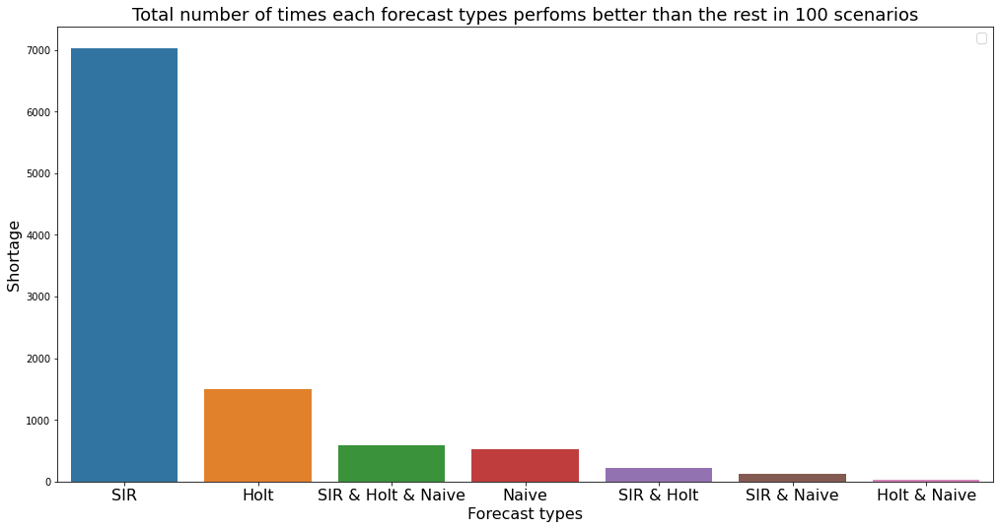

In [ ]:

df_comparison_scenario_ranges_chart_shortage=df_best__perfomer_count[['Best method: Shortage']].reset_index()


#this part plots different Protocol coefficient and their related shortages
plt.figure(figsize=(17,8.5))
chart=sns.barplot(x='index',y="Best method: Shortage", data=df_comparison_scenario_ranges_chart_shortage,palette=["C0", "C1", "C2", "C3", "C4", "C5", "C6"])

chart.set_xticklabels(chart.get_xmajorticklabels(), fontsize = 16)

#plt.bar(df_comparison_scenario_ranges_chart_shortage.index,df_comparison_scenario_ranges_chart_shortage)

#chart.set_yticklabels(chart.get_ymajorticklabels(), fontsize = 12)
plt.ylabel("Shortage", size=16)
plt.xlabel("Forecast types", size=16)
plt.title("Total number of times each forecast types perfoms better than the rest in %s scenarios"%(no_scenarios), size=18)
plt.legend(fontsize=13)

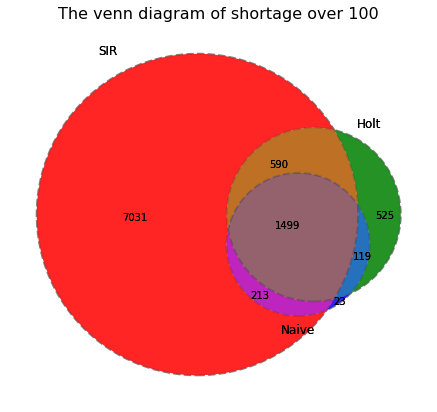

In [ ]:
Venn_data=df_best__perfomer_count['Best method: Shortage']

SIR_alone= Venn_data.iloc[0]
SIR_and_Holt_and_Naive=Venn_data.iloc[1]
SIR_and_Holt=Venn_data.iloc[2]
Holt_alone=Venn_data.iloc[3]
SIR_and_Naive=Venn_data.iloc[4]
Holt_and_Naive=Venn_data.iloc[5]
Naive_alone=Venn_data.iloc[6]

plt.figure(figsize=(14,7))
v=venn3(subsets = (SIR_alone, Holt_alone, SIR_and_Holt, Naive_alone, SIR_and_Naive, Holt_and_Naive, SIR_and_Holt_and_Naive), set_labels = ('SIR', 'Holt', 'Naive'), alpha = 0.5);
v.get_patch_by_id('111').set_color('orange')

c=venn3_circles(subsets = (SIR_alone, Holt_alone, SIR_and_Holt, Naive_alone, SIR_and_Naive, Holt_and_Naive, SIR_and_Holt_and_Naive), linestyle='dashed', linewidth=2, color="grey")
venn3(subsets = (SIR_alone, Holt_alone, SIR_and_Holt, Naive_alone, SIR_and_Naive, Holt_and_Naive, SIR_and_Holt_and_Naive), set_labels = ('SIR', 'Holt', 'Naive'), alpha = 0.7);
plt.title("The venn diagram of shortage over %s"%(no_scenarios),fontsize=16);

#### Extra Code

In [ ]:
#Creating a data frame with only the reported date
test1=pd.DataFrame(test['Best method: Shortage'])

#Counting the number of reported date and creating a data frame with number of daily cases
test1=test1.groupby(test1.columns.tolist()).size().reset_index().\
    rename(columns={0:'Lowest Shortage'})

In [ ]:
test1

,Best method: Shortage,Lowest Shortage
0,Holt,51
1,Holt & Naive,17
2,Naive,13
3,SIR,483
4,SIR & Holt,136
5,SIR & Holt & Naive,281
6,SIR & Naive,19


In [ ]:
test2=pd.DataFrame(test['Best method: Shortage'])
test3=pd.DataFrame(test2.groupby('Best method: Shortage').size())
test3

,0
Best method: Shortage,
Holt,51
Holt & Naive,17
Naive,13
SIR,483
SIR & Holt,136
SIR & Holt & Naive,281
SIR & Naive,19


In [ ]:
test['Best method: Highest Inventory level at the end']

0      Naive
1        SIR
2      Naive
3      Naive
4      Naive
       ...  
995    Naive
996    Naive
997    Naive
998    Naive
999    Naive
Name: Best method: Highest Inventory level at the end, Length: 1000, dtype: object

In [ ]:
test['Best method: Shortage']

0                     SIR
1            Holt & Naive
2                     SIR
3                     SIR
4                     SIR
              ...        
995                   SIR
996                   SIR
997    SIR & Holt & Naive
998                   SIR
999                   SIR
Name: Best method: Shortage, Length: 1000, dtype: object

In [ ]:
test4=test['Best method: Highest Inventory level at the end'].value_counts()
test4=pd.DataFrame(test4)
test4

,Best method: Highest Inventory level at the end
Naive,936
SIR & Naive,21
SIR,18
Holt & Naive,13
Holt,6
SIR & Holt & Naive,4
SIR & Holt,2


In [ ]:
test3=test['Best method: Shortage'].value_counts()
test3=pd.DataFrame(test3)
test3

,Best method: Shortage
SIR,483
SIR & Holt & Naive,281
SIR & Holt,136
Holt,51
SIR & Naive,19
Holt & Naive,17
Naive,13


In [ ]:
test5=test['Best method: Lowest Inventory level at the end'].value_counts()
test5=pd.DataFrame(test5)
test5

,Best method: Lowest Inventory level at the end
Holt,675
SIR,162
SIR & Holt,147
Holt & Naive,6
SIR & Holt & Naive,4
SIR & Naive,4
Naive,2


In [ ]:
df_final_test=pd.concat([test3,test4,test5],axis=1)
df_final_test

,Best method: Shortage,Best method: Highest Inventory level at the end,Best method: Lowest Inventory level at the end
SIR,483,18,162
SIR & Holt & Naive,281,4,4
SIR & Holt,136,2,147
Holt,51,6,675
SIR & Naive,19,21,4
Holt & Naive,17,13,6
Naive,13,936,2


In [ ]:
df = pd.DataFrame({'Animal': ['Falcon', 'Falcon',
                              'Parrot', 'Parrot'],
                   'Max Speed': [380., 370., 24., 26.],
                   'min Speed': [30., 30., 2., 2.]})
df

,Animal,Max Speed,min Speed
0,Falcon,380.0,30.0
1,Falcon,370.0,30.0
2,Parrot,24.0,2.0
3,Parrot,26.0,2.0


In [ ]:
df = pd.DataFrame(
   ...:     {
   ...:         "A": ["foo", "bar", "foo", "bar", "foo", "bar", "foo", "foo"],
   ...:         "B": ["one", "one", "two", "three", "two", "two", "one", "three"],
   ...:         "C": np.random.randn(8),
   ...:         "D": np.random.randn(8),
   ...:     }
   ...: )
df

,A,B,C,D
0,foo,one,-0.354827,-0.803256
1,bar,one,0.962296,-0.455616
2,foo,two,-1.573482,2.298416
3,bar,three,0.598201,-0.852047
4,foo,two,-0.247669,0.683954
5,bar,two,1.236793,-1.320917
6,foo,one,-0.251724,1.300774
7,foo,three,-1.043284,-0.250004


In [ ]:
df2 = df.set_index(["B"])
df2.aggregate(np.count)

AttributeError: ignored

In [ ]:
df = pd.DataFrame(
   ...:     [
   ...:         ("bird", "Falconiformes", 389.0),
   ...:         ("bird", "Psittaciformes", 24.0),
   ...:         ("mammal", "Carnivora", 80.2),
   ...:         ("mammal", "Primates", np.nan),
   ...:         ("mammal", "Carnivora", 58),
   ...:     ],
   ...:     index=["falcon", "parrot", "lion", "monkey", "leopard"],
   ...:     columns=("class", "order", "max_speed"),
   ...: )
df

,class,order,max_speed
falcon,bird,Falconiformes,389.0
parrot,bird,Psittaciformes,24.0
lion,mammal,Carnivora,80.2
monkey,mammal,Primates,NaN
leopard,mammal,Carnivora,58.0


In [ ]:
df.groupby("order", axis="columns")

In [ ]:
a=test.groupby(['Best method: Shortage']).count()

In [ ]:
a

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,SIR forecast: Number of epochs with shortage,SIR forecast: Total number of units ordered,SIR forecast: Number of orders,SIR forecast: Real cost,SIR forecast: Total cost,Holt forecast: Shortage,Holt forecast: Inventory level at the end,Holt forecast: Achieved service level,Holt forecast: Number of epochs with shortage,Holt forecast: Total number of units ordered,Holt forecast: Number of orders,Holt forecast: Real cost,Holt forecast: Total cost,Naive forecast: Shortage,Naive forecast: Inventory level at the end,Naive forecast: Achieved service level,Naive forecast: Number of epochs with shortage,Naive forecast: Total number of units ordered,Naive forecast: Number of orders,Naive forecast: Real cost,Naive forecast: Total cost,Total demand/consumption,Minimum shortage value,Minimum left over inventory: value,Best method: Lowest Inventory level at the end,Maximum left over inventory: value,Best method: Highest Inventory level at the end
Best method: Shortage,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Holt,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51,51
Holt & Naive,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17,17
Naive,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13
SIR,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483,483
SIR & Holt,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136,136
SIR & Holt & Naive,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281,281
SIR & Naive,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19


In [ ]:
test.set_index(['Best method: Lowest Inventory level at the end']).count(level='Best method: Lowest Inventory level at the end')

KeyError: ignored

# Results

In [ ]:
complete_inventory_results_scenarios

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,SIR forecast: Number of epochs with shortage,SIR forecast: Total number of units ordered,SIR forecast: Number of orders,SIR forecast: Real cost,SIR forecast: Total cost,Holt forecast: Shortage,Holt forecast: Inventory level at the end,Holt forecast: Achieved service level,Holt forecast: Number of epochs with shortage,Holt forecast: Total number of units ordered,Holt forecast: Number of orders,Holt forecast: Real cost,Holt forecast: Total cost,Naive forecast: Shortage,Naive forecast: Inventory level at the end,Naive forecast: Achieved service level,Naive forecast: Number of epochs with shortage,Naive forecast: Total number of units ordered,Naive forecast: Number of orders,Naive forecast: Real cost,Naive forecast: Total cost,Total demand/consumption
0,11,10,6.00000000,1600,3200,6400,0.98300000,2711.00000000,7748.00000000,0.79000000,4,35200.00000000,14,589661.00000000,752321.00000000,2711.00000000,6948.00000000,0.79000000,4,34400.00000000,15,551861.00000000,714521.00000000,2711.00000000,10948.00000000,0.79000000,4,38400.00000000,15,617061.00000000,779721.00000000,30463.00000000
1,9,7,5.00000000,800,4000,7200,0.96500000,0.00000000,7472.00000000,1.00000000,0,32000.00000000,16,546246.50000000,546246.50000000,575.00000000,7247.00000000,0.89000000,2,31200.00000000,15,524915.50000000,559415.50000000,575.00000000,10447.00000000,0.89000000,2,34400.00000000,14,595515.50000000,630015.50000000,24828.00000000
2,15,9,5.50000000,1600,4000,6400,0.99100000,57.00000000,11718.00000000,0.89000000,2,38400.00000000,12,683580.50000000,687000.50000000,393.00000000,9654.00000000,0.84000000,3,36000.00000000,14,509432.50000000,533012.50000000,393.00000000,16854.00000000,0.84000000,3,43200.00000000,15,604832.50000000,628412.50000000,27039.00000000
3,6,7,4.00000000,800,3200,8000,0.99400000,0.00000000,3057.00000000,1.00000000,0,23200.00000000,16,387761.50000000,387761.50000000,0.00000000,3057.00000000,1.00000000,0,23200.00000000,16,393361.50000000,393361.50000000,0.00000000,7857.00000000,1.00000000,0,28000.00000000,16,495361.50000000,495361.50000000,20443.00000000
4,11,6,5.00000000,800,3200,8000,0.95700000,504.00000000,6723.00000000,0.89000000,2,30400.00000000,15,518132.50000000,548372.50000000,2904.00000000,5123.00000000,0.79000000,4,26400.00000000,15,411819.00000000,586059.00000000,2904.00000000,9923.00000000,0.79000000,4,31200.00000000,15,501819.00000000,676059.00000000,24481.00000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,11,10,4.50000000,1600,3200,6400,0.97100000,0.00000000,8273.00000000,1.00000000,0,30400.00000000,14,593952.00000000,593952.00000000,226.00000000,6899.00000000,0.95000000,1,28800.00000000,13,528837.00000000,542397.00000000,226.00000000,9299.00000000,0.95000000,1,31200.00000000,13,569637.00000000,583197.00000000,22427.00000000
96,6,9,4.50000000,800,3200,5600,0.96900000,0.00000000,3345.00000000,1.00000000,0,25600.00000000,16,403176.00000000,403176.00000000,486.00000000,2231.00000000,0.89000000,2,24000.00000000,16,366331.50000000,395491.50000000,2086.00000000,5431.00000000,0.84000000,3,25600.00000000,14,437125.50000000,562285.50000000,22555.00000000
97,13,10,5.50000000,800,3200,6400,0.96700000,1943.00000000,7039.00000000,0.84000000,3,32000.00000000,15,536878.00000000,653458.00000000,3543.00000000,6239.00000000,0.74000000,5,29600.00000000,14,453385.50000000,665965.50000000,5143.00000000,10239.00000000,0.74000000,5,32000.00000000,15,498496.50000000,807076.50000000,27204.00000000
98,12,6,4.00000000,1600,3200,6400,0.98600000,0.00000000,7292.00000000,1.00000000,0,27200.00000000,12,558719.50000000,558719.50000000,0.00000000,4892.00000000,1.00000000,0,24800.00000000,11,504119.50000000,504119.50000000,0.00000000,10492.0000000

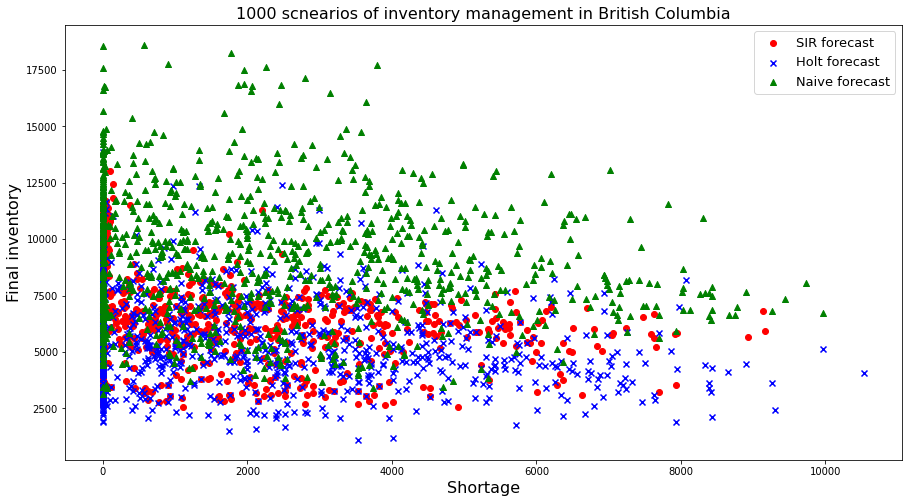

In [ ]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111)

x_plot=complete_inventory_results_scenarios['SIR forecast: Shortage']
y_plot=complete_inventory_results_scenarios['SIR forecast: Inventory level at the end']
plt.scatter(x_plot, y_plot, color = 'red',label='SIR forecast',marker='o')

x_plot=complete_inventory_results_scenarios['Holt forecast: Shortage']
y_plot=complete_inventory_results_scenarios['Holt forecast: Inventory level at the end']
plt.scatter(x_plot, y_plot, color = 'blue',label='Holt forecast',marker='x')

x_plot=complete_inventory_results_scenarios['Naive forecast: Shortage']
y_plot=complete_inventory_results_scenarios['Naive forecast: Inventory level at the end']
plt.scatter(x_plot, y_plot, color = 'green',label='Naive forecast',marker='^')

plt.title('%s scnearios of inventory management in British Columbia'%(no_scenarios),fontsize=16)
plt.xlabel('Shortage',fontsize=16)
plt.ylabel('Final inventory',fontsize=16)
plt.legend(fontsize=13)

plt.show()



In [ ]:
#inventory_data_result_scenarios['Specified service level']=service_level
inventory_data_result_scenarios
inventory_data_result_scenarios['Specified service level']+1

0   1.00000000
Name: Specified service level, dtype: float64

In [ ]:
complete_inventory_results_scenarios
complete_inventory_results_scenarios['Specified service level'][0]=service_level
complete_inventory_results_scenarios['Inventory capacity']

0    16000
0    16000
0    14000
0    12000
Name: Inventory capacity, dtype: int64

In [ ]:
i=1
complete_inventory_results_scenarios.iloc[[0],[7]]=8888
complete_inventory_results_scenarios

,Lead time,SNR,Protocol coefficient,Suppliers minimum capacity,Suppliers maximum capacity,Inventory capacity,Specified service level,SIR forecast: Shortage,SIR forecast: Inventory level at the end,SIR forecast: Achieved service level,SIR forecast: Number of epochs with shortage,SIR forecast: Total number of units ordered,SIR forecast: Number of orders,SIR forecast: Real cost,SIR forecast: Total cost,Holt forecast: Shortage,Holt forecast: Inventory level at the end,Holt forecast: Achieved service level,Holt forecast: Number of epochs with shortage,Holt forecast: Total number of units ordered,Holt forecast: Number of orders,Holt forecast: Real cost,Holt forecast: Total cost,Naive forecast: Shortage,Naive forecast: Inventory level at the end,Naive forecast: Achieved service level,Naive forecast: Number of epochs with shortage,Naive forecast: Total number of units ordered,Naive forecast: Number of orders,Naive forecast: Real cost,Naive forecast: Total cost,Total demand/consumption
0,16,15,3.00000000,4000,6000,16000,0.00000000,8888.00000000,1.00000000,0,32000.00000000,7,1187851.50000000,1187851.50000000,0.00000000,17618.00000000,1.00000000,0,32000.00000000,8,1174851.50000000,1174851.50000000,0.00000000,25618.00000000,1.00000000,0,40000.00000000,10,1250851.50000000,1250851.50000000,0,14682.00000000
0,9,6,4.00000000,2000,8000,16000,0.00000000,17442.00000000,1.00000000,0,38000.00000000,12,1047463.00000000,1047463.00000000,0.00000000,17442.00000000,1.00000000,0,38000.00000000,15,938463.00000000,938463.00000000,0.00000000,17442.00000000,1.00000000,0,38000.00000000,13,964463.00000000,964463.00000000,0,20858.00000000
0,7,12,3.00000000,2000,10000,14000,0.00000000,13396.00000000,1.00000000,0,28000.00000000,14,803316.50000000,803316.50000000,0.00000000,13396.00000000,1.00000000,0,28000.00000000,14,796316.50000000,796316.50000000,0.00000000,13396.00000000,1.00000000,0,28000.00000000,14,803316.50000000,803316.50000000,0,14904.00000000
0,14,5,3.50000000,4000,6000,12000,0.00000000,10322.00000000,1.00000000,0,28000.00000000,6,857081.00000000,857081.00000000,0.00000000,14322.00000000,1.00000000,0,32000.00000000,7,960081.00000000,960081.00000000,0.00000000,18322.00000000,1.00000000,0,36000.00000000,8,993081.00000000,993081.00000000,0,17978.00000000


In [ ]:
complete_inventory_results

,Forecast method,Shortage,Total cost,Real cost,Number of orders,Inventory level at the last epoch,Total demand,Protocol coefficient,Service level - specified,Service level - achieved,Number of epochs with shortage,Total holding cost,Total unit cost,Total ordering cost,Total shortage cost,Total number of units ordered


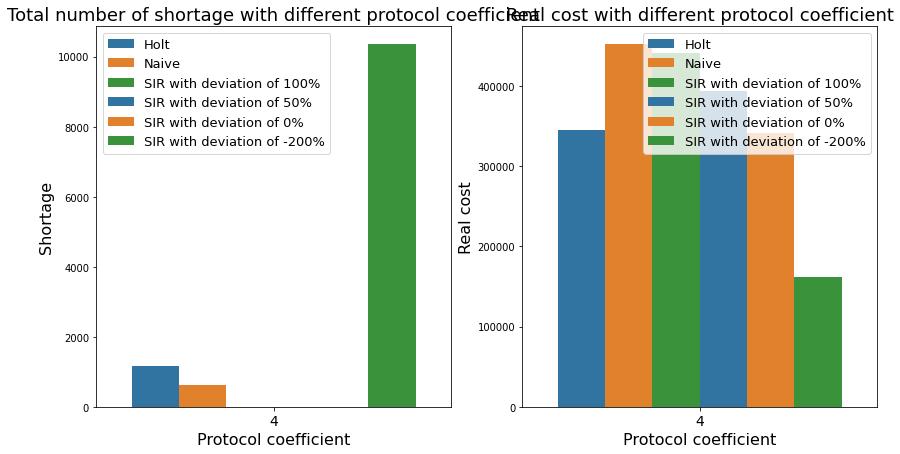

In [ ]:
# suppliers capacity 3,000
comparison_plots(complete_inventory_results)

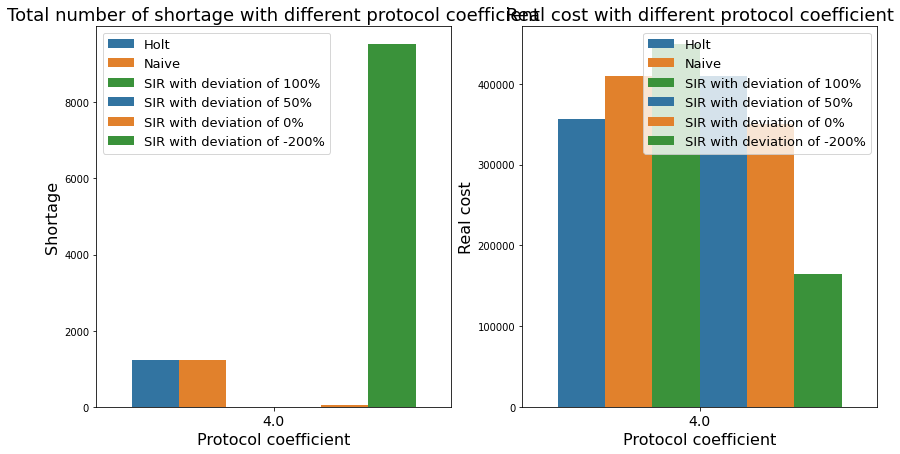

In [ ]:
# suppliers capacity 10,000
comparison_plots(complete_inventory_results)

In [ ]:
SIR_inventory_dict['SIR_dev_-200']

,consumption in last epoch,current,order,shortage,std of previous epoch,std from beginning,holding cost,ordering cost,unit cost,shortage cost,total cost,real cost
0,0.00000000,300.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000
1,62.00000000,238.00000000,600.00000000,0.00000000,24.17000000,24.17000000,937.00000000,1000.00000000,6000.00000000,0.00000000,7937.00000000,7937.00000000
2,53.00000000,785.00000000,600.00000000,0.00000000,65.12000000,44.64000000,1638.50000000,1000.00000000,6000.00000000,0.00000000,8638.50000000,8638.50000000
3,97.00000000,1288.00000000,600.00000000,0.00000000,31.23000000,40.17000000,3450.50000000,1000.00000000,6000.00000000,0.00000000,10450.50000000,10450.50000000
4,140.00000000,1748.00000000,600.00000000,0.00000000,87.82000000,52.08000000,5147.00000000,1000.00000000,6000.00000000,0.00000000,12147.00000000,12147.00000000
5,221.00000000,2127.00000000,600.00000000,0.00000000,137.74000000,69.22000000,6693.00000000,1000.00000000,6000.00000000,0.00000000,13693.00000000,13693.00000000
6,246.00000000,2481.00000000,600.00000000,0.00000000,276.06000000,103.69000000,7863.00000000,1000.00000000,6000.00000000,0.00000000,14863.00000000,14863.00000000
7,435.00000000,2646.00000000,600.00000000,0.00000000,881.98000000,214.87000000,8693.00000000,1000.00000000,6000.00000000,0.00000000,15693.00000000,15693.00000000
8,2012.00000000,1234.00000000,600.00000000,0.00000000,1381.31000000,360.68000000,6284.00000000,1000.00000000,6000.00000000,0.00000000,13284.00000000,13284.00000000
9,3590.00000000,0.00000000,1149.00000000,1756.00000000,960.23000000,427.30000000,534.00000000,1000.00000000,11490.00000000,105360.00000000,118384.00000000,13024.00000000


In [ ]:
d = {}
for name in companies:
    d['the_name_of_company_{}'.format(name)] = pd.DataFrame()

In [ ]:
f['the_name_of_company_1']['Shortage'].sum()

1695.0

In [ ]:
a=sub_data_YHOO
a_dict=a.to_dict()


In [ ]:
f= {'the_name_of_company_{}'.format(name): pd.DataFrame() for name in companies}

In [ ]:
for name, df in f.items():
    f[name]=sub_data_YHOO

No handles with labels found to put in legend.


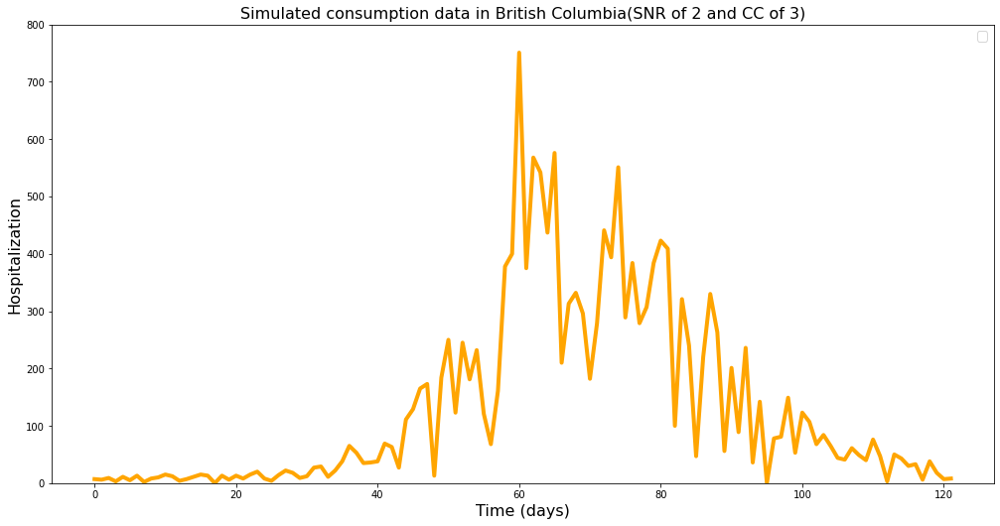

In [ ]:
plot_raw_data_SNR(y)

No handles with labels found to put in legend.


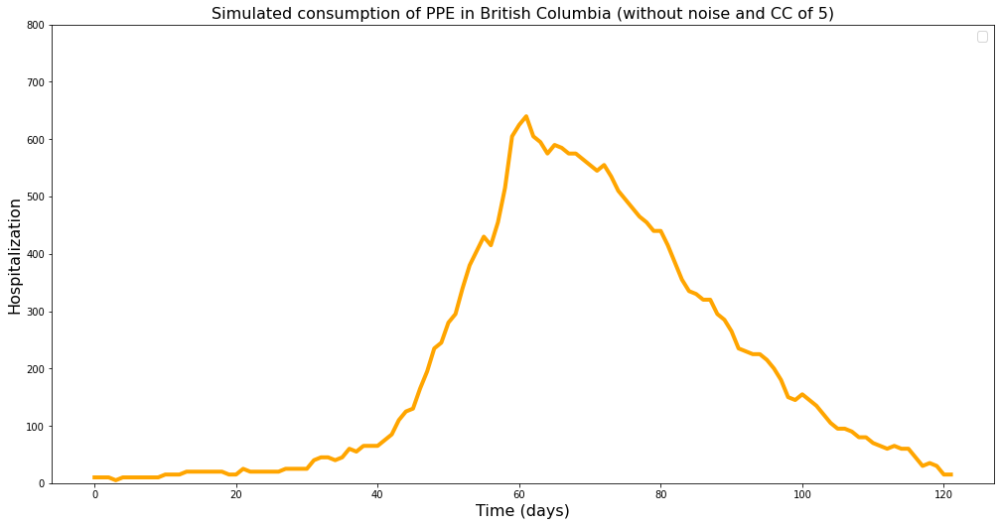

In [ ]:
plot_raw_data_without_noise(provincial_data_CIHI['daily_Hospitalizations']*protocol_coef,protocol_coef)

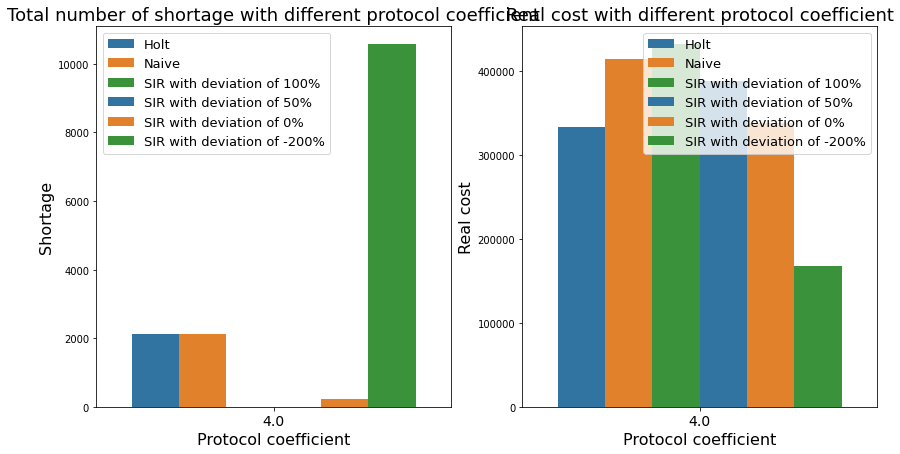

In [ ]:
comparison_plots(complete_inventory_results)

## Results 2

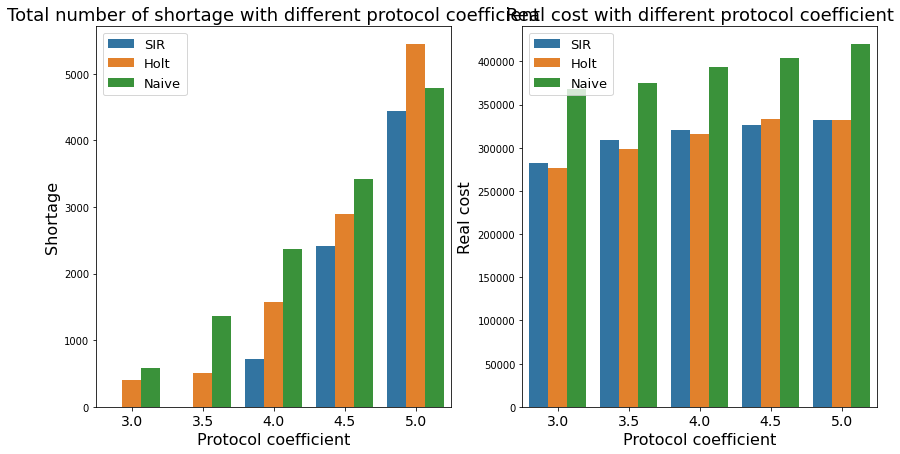

In [ ]:
# Noise:Max of each epoch
# Noise level: 20%
# Deviation from mean: 0
comparison_plots(complete_inventory_results)

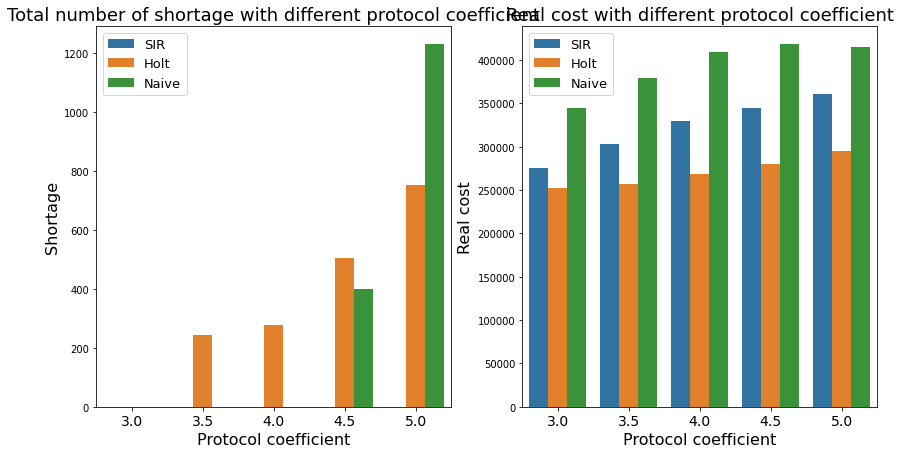

In [ ]:
# Noise:Max of each epoch
# Noise level: 20%
# Deviation from mean: 20% below
comparison_plots(complete_inventory_results)

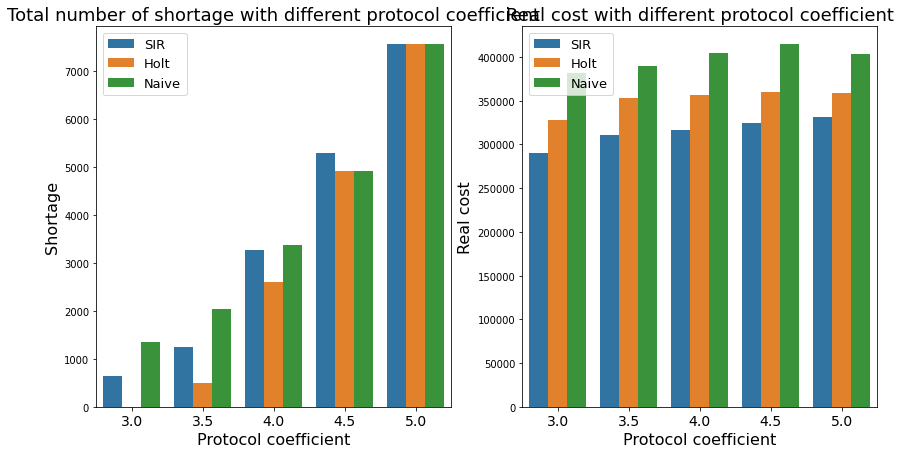

In [ ]:
# Noise:Max of each epoch
# Noise level: 20%
# Deviation from mean: 20% above
comparison_plots(complete_inventory_results)

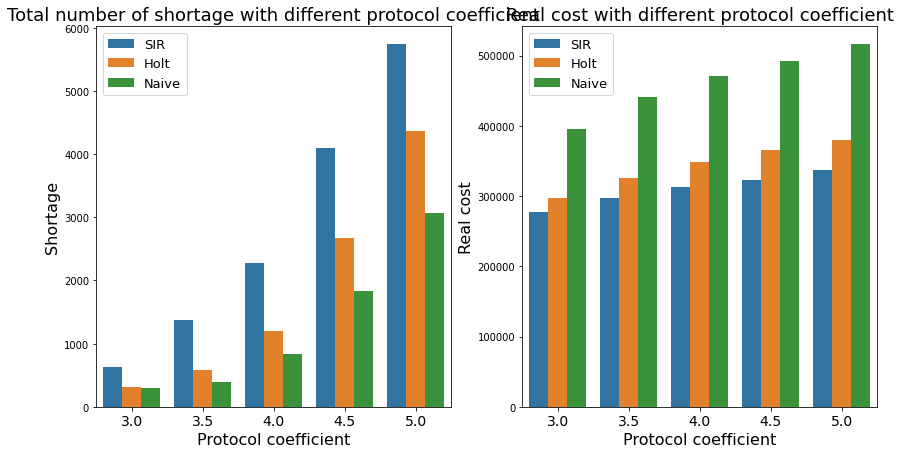

In [ ]:
# Noise:Max of all epochs
# Noise level: 20%
# Deviation from mean: 0
comparison_plots(complete_inventory_results)

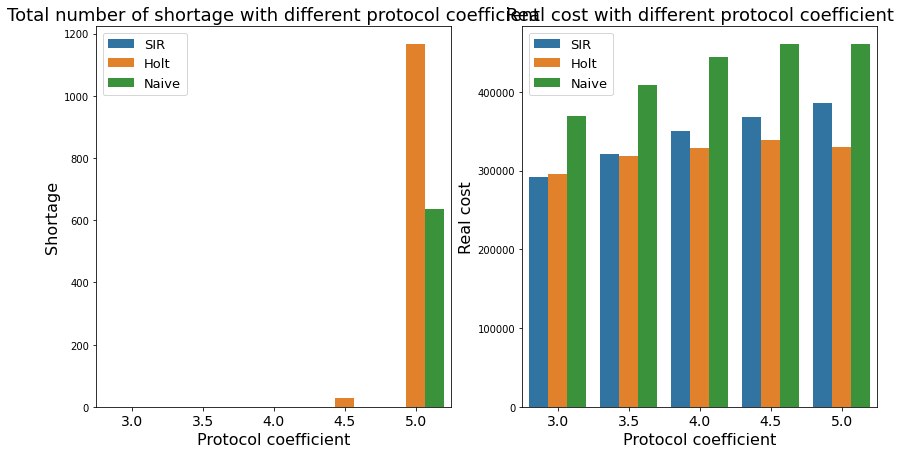

In [ ]:
# Noise:Max of all epochs
# Noise level: 20%
# Deviation from mean: 20% below
comparison_plots(complete_inventory_results)

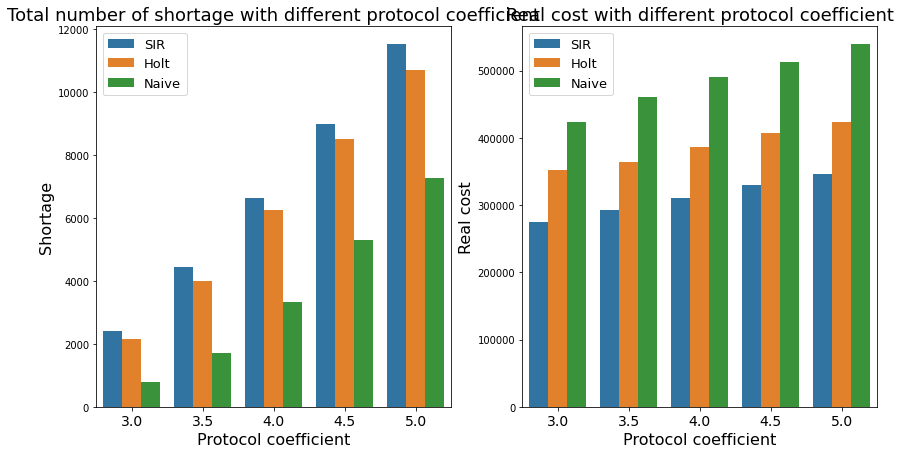

In [ ]:
# Noise:Max of all epochs
# Noise level: 20%
# Deviation from mean: 20% above
comparison_plots(complete_inventory_results)

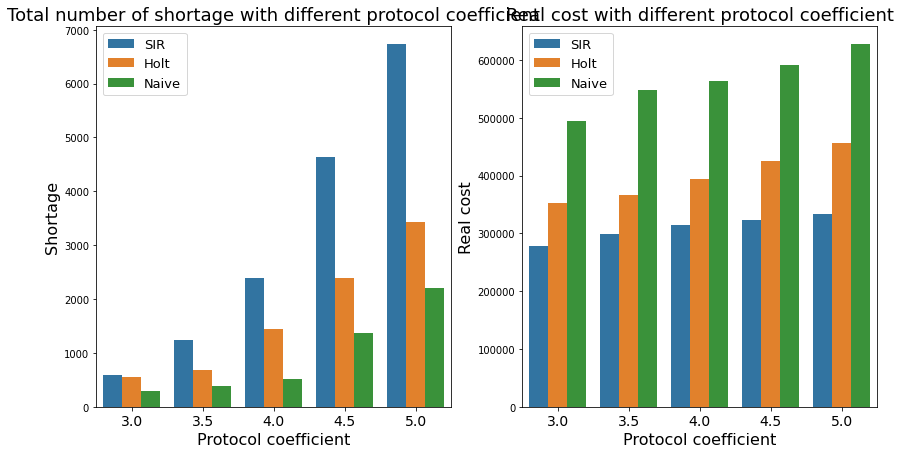

In [ ]:
# Noise:Max of all epochs
# Noise level: 30%
# Deviation from mean: 0
comparison_plots(complete_inventory_results)

No handles with labels found to put in legend.


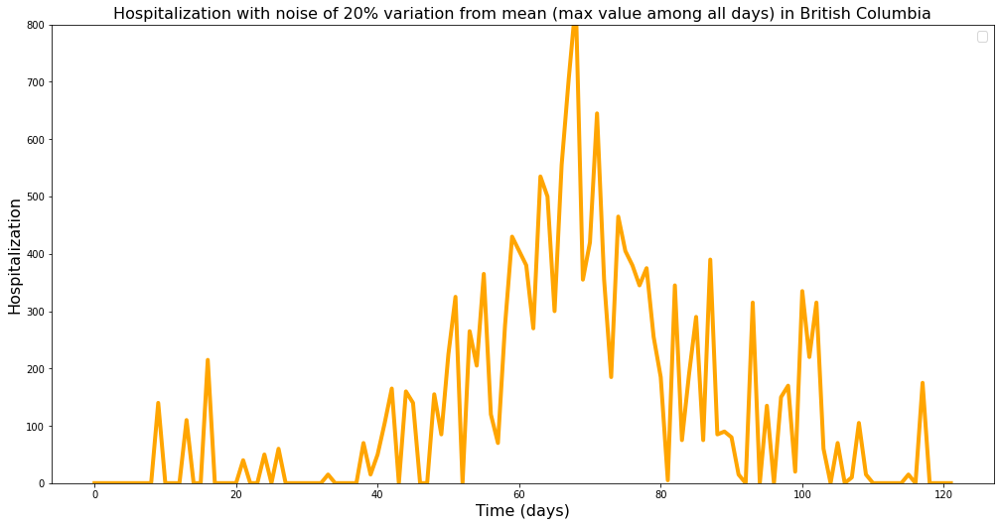

In [ ]:
plot_raw_data(y)

No handles with labels found to put in legend.


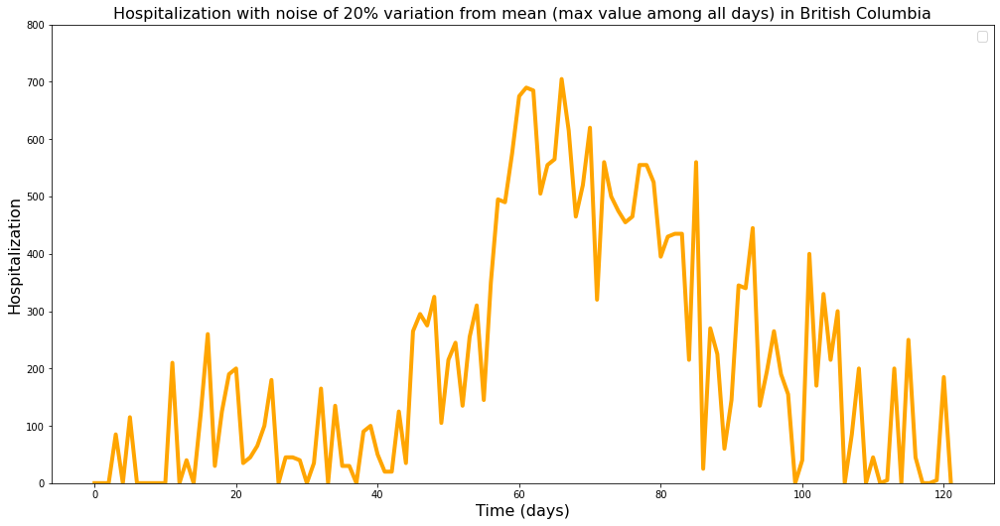

In [ ]:
plot_raw_data(y)

No handles with labels found to put in legend.


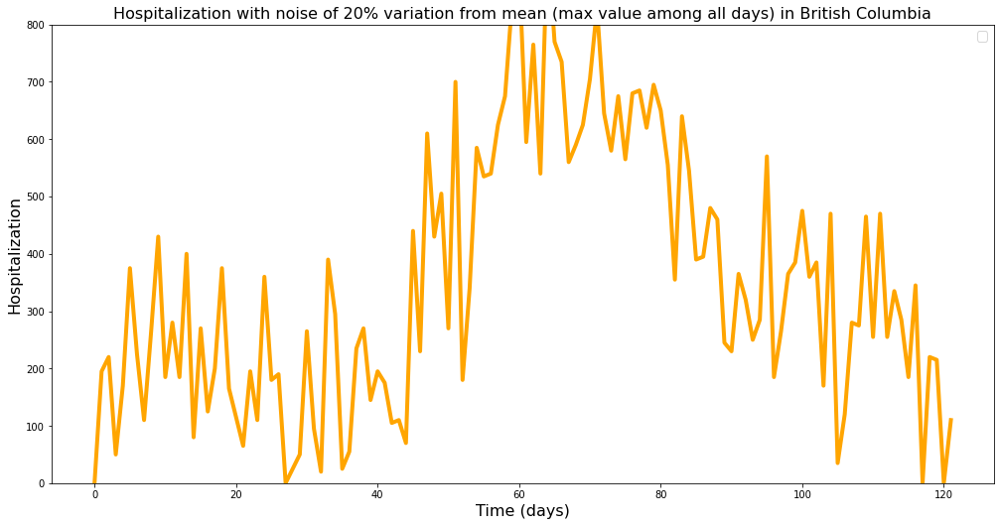

In [ ]:
plot_raw_data(y)

No handles with labels found to put in legend.


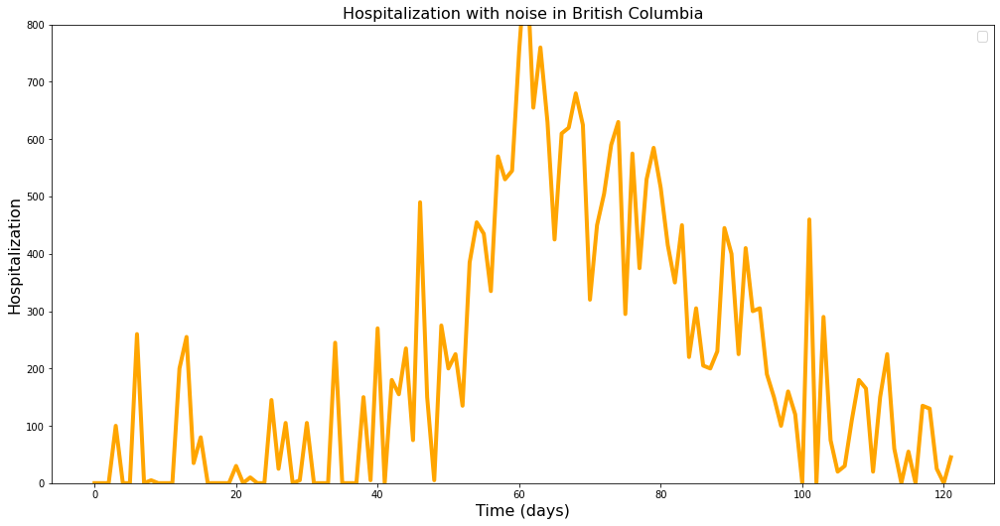

In [ ]:
#max_all_epoch
plot_raw_data(y)

No handles with labels found to put in legend.


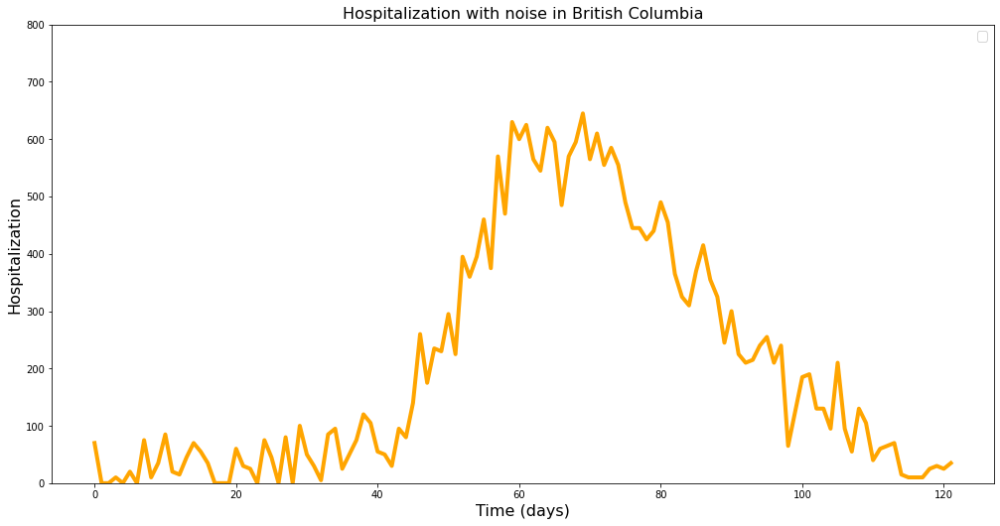

In [ ]:
#mean_all_epoch
plot_raw_data(y)

No handles with labels found to put in legend.


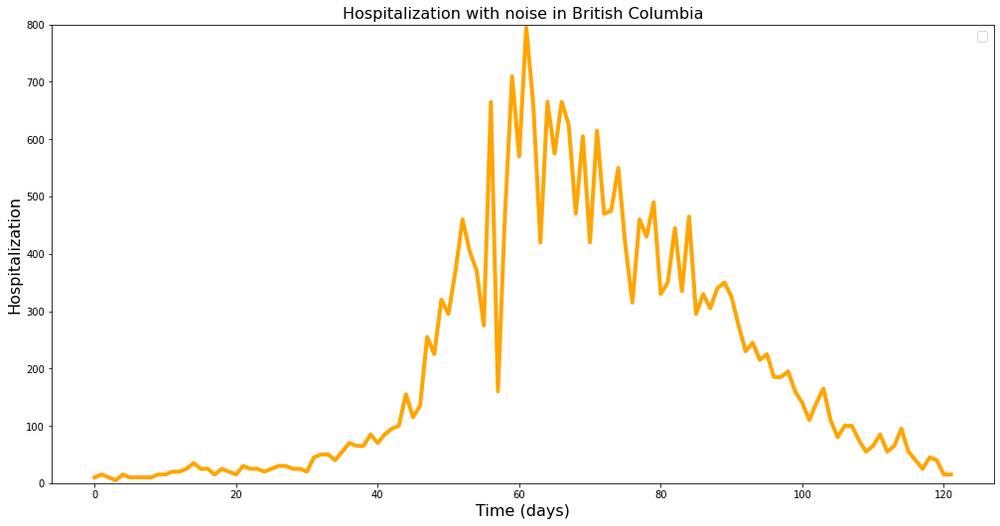

In [ ]:
#mean_each_epoch
plot_raw_data(y)

No handles with labels found to put in legend.


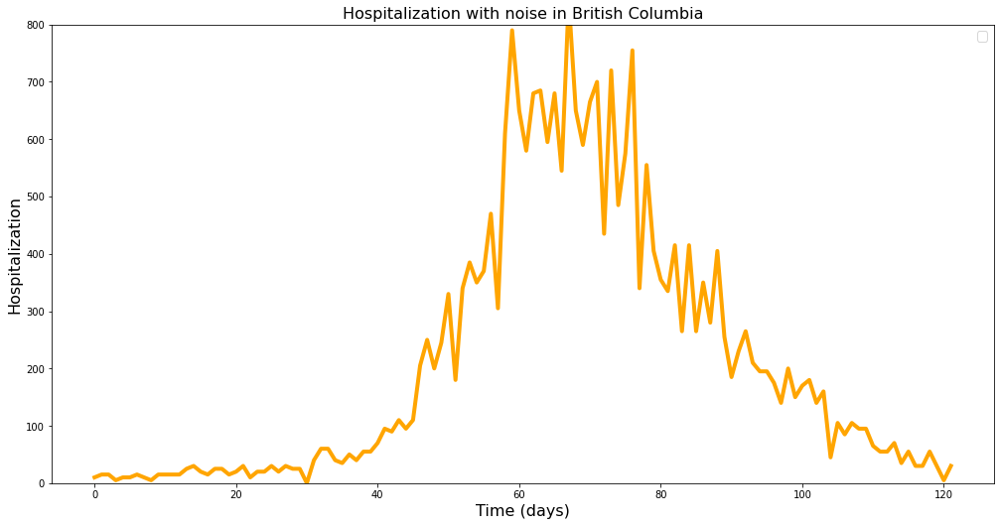

In [ ]:
#max_each_epoch
plot_raw_data(y)

No handles with labels found to put in legend.


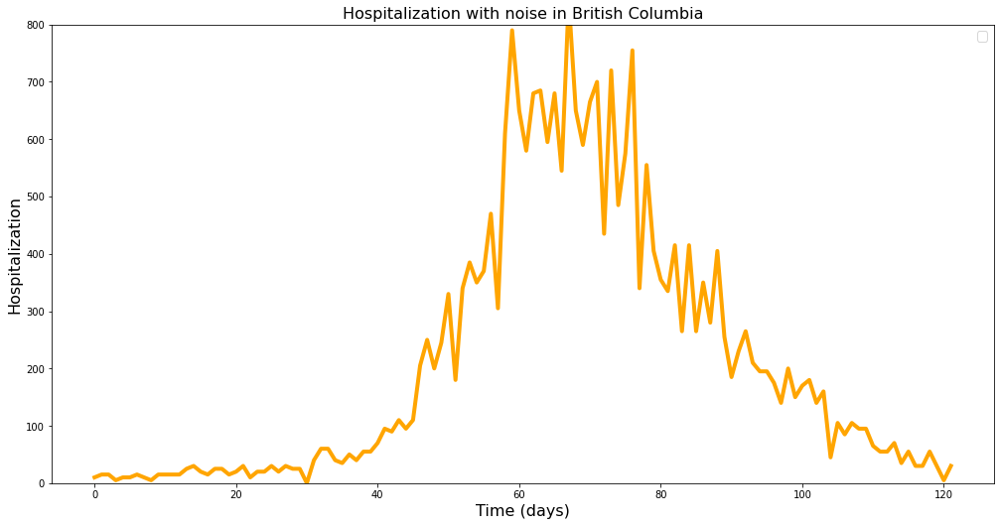

In [ ]:
#without noise
plot_raw_data(y)

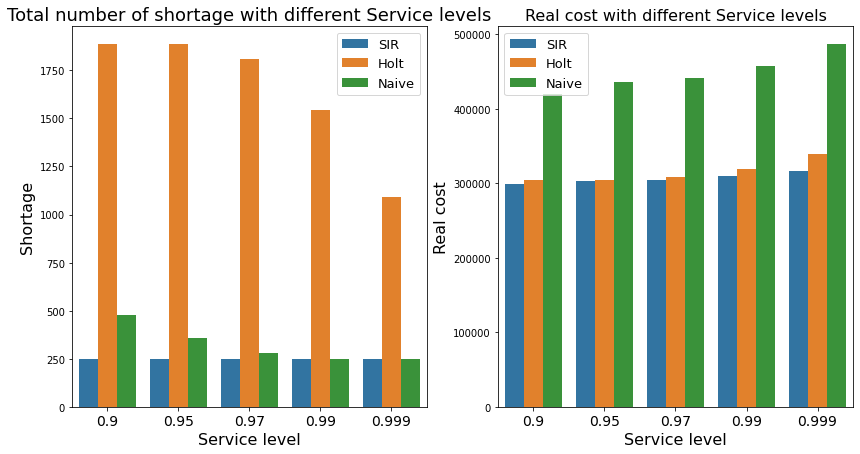

In [ ]:
comparison_plots(complete_inventory_results)

In [ ]:
complete_inventory_results

,Forecast method,Shortage,Total cost,Real cost,Number of orders,Inventory level at the last epoch,Total demand,Protocol coefficient,Service level - specified,Service level - achieved,Number of epochs with shortage,Total holding cost,Total unit cost,Total ordering cost,Total shortage cost,Total number of units ordered
0,SIR,184.00000000,336954.00000000,325914.00000000,16,2620.00000000,20344.00000000,4.00000000,0.90000000,0.83000000,3,85114.00000000,224800.00000000,16000.00000000,11040.00000000,22480.00000000
1,Holt,180.00000000,452571.50000000,441771.50000000,16,4104.00000000,20344.00000000,4.00000000,0.90000000,0.89000000,2,186091.50000000,239680.00000000,16000.00000000,10800.00000000,23968.00000000
2,Naive,180.00000000,505313.50000000,494513.50000000,16,6712.00000000,20344.00000000,4.00000000,0.90000000,0.89000000,2,212753.50000000,265760.00000000,16000.00000000,10800.00000000,26576.00000000
0,SIR,184.00000000,345066.00000000,334026.00000000,16,2780.00000000,20344.00000000,4.00000000,0.95000000,0.83000000,3,91626.00000000,226400.00000000,16000.00000000,11040.00000000,22640.00000000
1,Holt,180.00000000,474682.50000000,463882.50000000,16,4319.00000000,20344.00000000,4.00000000,0.95000000,0.89000000,2,206052.50000000,241830.00000000,16000.00000000,10800.00000000,24183.00000000
2,Naive,180.00000000,522167.00000000,511367.00000000,16,7161.00000000,20344.00000000,4.00000000,0.95000000,0.89000000,2,225117.00000000,270250.00000000,16000.00000000,10800.00000000,27025.00000000
0,SIR,184.00000000,350357.00000000,339317.00000000,16,2884.00000000,20344.00000000,4.00000000,0.97000000,0.83000000,3,95877.00000000,227440.00000000,16000.00000000,11040.00000000,22744.00000000
1,Holt,180.00000000,491283.50000000,480483.50000000,16,4561.00000000,20344.00000000,4.00000000,0.97000000,0.89000000,2,220233.50000000,244250.00000000,16000.00000000,10800.00000000,24425.00000000
2,Naive,180.00000000,533815.50000000,523015.50000000,16,7452.00000000,20344.00000000,4.00000000,0.97000000,0.89000000,2,233855.50000000,273160.00000000,16000.00000000,10800.00000000,27316.00000000
0,SIR,184.00000000,360304.00000000,349264.00000000,16,3080.00000000,20344.00000000,4.00000000,0.99000000,0.83000000,3,103864.00000000,229400.00000000,16000.00000000,11040.00000000,22940.00000000


In [ ]:
#max_all_epoch
complete_inventory_results

,Forecast method,Shortage,Total cost,Real cost,Number of orders,Inventory level at the last epoch,Total demand,Protocol coefficient,Service level - specified,Service level - achieved,Number of epochs with shortage,Total holding cost,Total unit cost,Total ordering cost,Total shortage cost,Total number of units ordered
0,SIR,0.00000000,298303.00000000,298303.00000000,16,1894.00000000,16050.00000000,3.00000000,0.99000000,1.00000000,0,105863.00000000,176440.00000000,16000.00000000,0.00000000,17644.00000000
1,Holt,0.00000000,353849.00000000,353849.00000000,16,3463.00000000,16050.00000000,3.00000000,0.99000000,1.00000000,0,145719.00000000,192130.00000000,16000.00000000,0.00000000,19213.00000000
2,Naive,0.00000000,420319.50000000,420319.50000000,16,5306.00000000,16050.00000000,3.00000000,0.99000000,1.00000000,0,193759.50000000,210560.00000000,16000.00000000,0.00000000,21056.00000000
0,SIR,0.00000000,315809.50000000,315809.50000000,16,2010.00000000,18725.00000000,3.50000000,0.99000000,1.00000000,0,95459.50000000,204350.00000000,16000.00000000,0.00000000,20435.00000000
1,Holt,0.00000000,387439.50000000,387439.50000000,16,3640.00000000,18725.00000000,3.50000000,0.99000000,1.00000000,0,150789.50000000,220650.00000000,16000.00000000,0.00000000,22065.00000000
2,Naive,0.00000000,463878.00000000,463878.00000000,16,5868.00000000,18725.00000000,3.50000000,0.99000000,1.00000000,0,204948.00000000,242930.00000000,16000.00000000,0.00000000,24293.00000000
0,SIR,119.00000000,344475.50000000,337335.50000000,16,2126.00000000,21400.00000000,4.00000000,0.99000000,0.89000000,2,90265.50000000,231070.00000000,16000.00000000,7140.00000000,23107.00000000
1,Holt,831.00000000,452957.50000000,403097.50000000,16,3624.00000000,21400.00000000,4.00000000,0.99000000,0.83000000,3,148167.50000000,238930.00000000,16000.00000000,49860.00000000,23893.00000000
2,Naive,0.00000000,498908.00000000,498908.00000000,16,6195.00000000,21400.00000000,4.00000000,0.99000000,1.00000000,0,209958.00000000,272950.00000000,16000.00000000,0.00000000,27295.00000000
0,SIR,1588.00000000,443915.00000000,348635.00000000,16,2241.00000000,24075.00000000,4.50000000,0.99000000,0.78000000,4,88345.00000000,244290.00000000,16000.00000000,95280.00000000,24429.00000000


In [ ]:
#mean_all_epoch
complete_inventory_results

,Forecast method,Shortage,Total cost,Real cost,Number of orders,Inventory level at the last epoch,Total demand,Protocol coefficient,Service level - specified,Service level - achieved,Number of epochs with shortage,Total holding cost,Total unit cost,Total ordering cost,Total shortage cost,Total number of units ordered
0,SIR,0.00000000,292641.50000000,292641.50000000,16,2000.00000000,15273.00000000,3.00000000,0.99000000,1.00000000,0,106911.50000000,169730.00000000,16000.00000000,0.00000000,16973.00000000
1,Holt,28.00000000,282075.50000000,280395.50000000,16,1948.00000000,15273.00000000,3.00000000,0.99000000,0.94000000,1,95465.50000000,168930.00000000,16000.00000000,1680.00000000,16893.00000000
2,Naive,135.00000000,360405.00000000,352305.00000000,16,4864.00000000,15273.00000000,3.00000000,0.99000000,0.94000000,1,139285.00000000,197020.00000000,16000.00000000,8100.00000000,19702.00000000
0,SIR,0.00000000,310550.00000000,310550.00000000,16,2093.50000000,17818.50000000,3.50000000,0.99000000,1.00000000,0,98430.00000000,196120.00000000,16000.00000000,0.00000000,19612.00000000
1,Holt,33.00000000,291572.00000000,289592.00000000,16,1657.00000000,17818.50000000,3.50000000,0.99000000,0.94000000,1,82162.00000000,191430.00000000,16000.00000000,1980.00000000,19143.00000000
2,Naive,532.00000000,414456.00000000,382536.00000000,16,5374.00000000,17818.50000000,3.50000000,0.99000000,0.94000000,1,142926.00000000,223610.00000000,16000.00000000,31920.00000000,22361.00000000
0,SIR,0.00000000,328564.50000000,328564.50000000,16,2221.00000000,20364.00000000,4.00000000,0.99000000,1.00000000,0,89714.50000000,222850.00000000,16000.00000000,0.00000000,22285.00000000
1,Holt,530.00000000,338720.50000000,306920.50000000,16,1722.00000000,20364.00000000,4.00000000,0.99000000,0.83000000,3,78360.50000000,212560.00000000,16000.00000000,31800.00000000,21256.00000000
2,Naive,1100.00000000,467920.00000000,401920.00000000,16,5885.00000000,20364.00000000,4.00000000,0.99000000,0.83000000,3,137430.00000000,248490.00000000,16000.00000000,66000.00000000,24849.00000000
0,SIR,1357.00000000,414240.50000000,332820.50000000,16,2348.50000000,22909.50000000,4.50000000,0.99000000,0.83000000,3,80800.50000000,236020.00000000,16000.00000000,81420.00000000,23602.00000000


In [ ]:
#mean_each_epoch
complete_inventory_results

,Forecast method,Shortage,Total cost,Real cost,Number of orders,Inventory level at the last epoch,Total demand,Protocol coefficient,Service level - specified,Service level - achieved,Number of epochs with shortage,Total holding cost,Total unit cost,Total ordering cost,Total shortage cost,Total number of units ordered
0,SIR,0.00000000,294794.50000000,294794.50000000,16,1900.00000000,14967.00000000,3.00000000,0.99000000,1.00000000,0,113124.50000000,165670.00000000,16000.00000000,0.00000000,16567.00000000
1,Holt,1232.00000000,337856.00000000,263936.00000000,16,1956.00000000,14967.00000000,3.00000000,0.99000000,0.94000000,1,94026.00000000,153910.00000000,16000.00000000,73920.00000000,15391.00000000
2,Naive,0.00000000,362502.50000000,362502.50000000,16,4830.00000000,14967.00000000,3.00000000,0.99000000,1.00000000,0,151532.50000000,194970.00000000,16000.00000000,0.00000000,19497.00000000
0,SIR,0.00000000,312919.00000000,312919.00000000,16,1936.50000000,17461.50000000,3.50000000,0.99000000,1.00000000,0,105939.00000000,190980.00000000,16000.00000000,0.00000000,19098.00000000
1,Holt,1438.00000000,369706.00000000,283426.00000000,16,1982.50000000,17461.50000000,3.50000000,0.99000000,0.94000000,1,90366.00000000,177060.00000000,16000.00000000,86280.00000000,17706.00000000
2,Naive,362.00000000,411634.00000000,389914.00000000,16,5435.50000000,17461.50000000,3.50000000,0.99000000,0.89000000,2,151554.00000000,222360.00000000,16000.00000000,21720.00000000,22236.00000000
0,SIR,0.00000000,331284.50000000,331284.50000000,16,2042.00000000,19956.00000000,4.00000000,0.99000000,1.00000000,0,98304.50000000,216980.00000000,16000.00000000,0.00000000,21698.00000000
1,Holt,1953.00000000,418343.50000000,301163.50000000,16,2008.00000000,19956.00000000,4.00000000,0.99000000,0.89000000,2,88053.50000000,197110.00000000,16000.00000000,117180.00000000,19711.00000000
2,Naive,841.00000000,463879.00000000,413419.00000000,16,6041.00000000,19956.00000000,4.00000000,0.99000000,0.89000000,2,148859.00000000,248560.00000000,16000.00000000,50460.00000000,24856.00000000
0,SIR,1001.00000000,398514.50000000,338454.50000000,16,2147.00000000,22450.50000000,4.50000000,0.99000000,0.89000000,2,89484.50000000,232970.00000000,16000.00000000,60060.00000000,23297.00000000


In [ ]:
#max_each_epoch
complete_inventory_results

,Forecast method,Shortage,Total cost,Real cost,Number of orders,Inventory level at the last epoch,Total demand,Protocol coefficient,Service level - specified,Service level - achieved,Number of epochs with shortage,Total holding cost,Total unit cost,Total ordering cost,Total shortage cost,Total number of units ordered
0,SIR,0.00000000,298339.00000000,298339.00000000,16,2121.00000000,15375.00000000,3.00000000,0.99000000,1.00000000,0,110379.00000000,171960.00000000,16000.00000000,0.00000000,17196.00000000
1,Holt,0.00000000,329722.50000000,329722.50000000,16,3457.00000000,15375.00000000,3.00000000,0.99000000,1.00000000,0,128402.50000000,185320.00000000,16000.00000000,0.00000000,18532.00000000
2,Naive,525.00000000,418327.00000000,386827.00000000,16,6132.00000000,15375.00000000,3.00000000,0.99000000,0.94000000,1,164007.00000000,206820.00000000,16000.00000000,31500.00000000,20682.00000000
0,SIR,0.00000000,326409.00000000,326409.00000000,16,2174.50000000,17937.50000000,3.50000000,0.99000000,1.00000000,0,112289.00000000,198120.00000000,16000.00000000,0.00000000,19812.00000000
1,Holt,785.00000000,354854.00000000,307754.00000000,16,2347.00000000,17937.50000000,3.50000000,0.99000000,0.89000000,2,99754.00000000,192000.00000000,16000.00000000,47100.00000000,19200.00000000
2,Naive,785.00000000,462408.00000000,415308.00000000,16,6854.00000000,17937.50000000,3.50000000,0.99000000,0.89000000,2,162238.00000000,237070.00000000,16000.00000000,47100.00000000,23707.00000000
0,SIR,0.00000000,343995.00000000,343995.00000000,16,2228.00000000,20500.00000000,4.00000000,0.99000000,1.00000000,0,103715.00000000,224280.00000000,16000.00000000,0.00000000,22428.00000000
1,Holt,1955.00000000,420603.00000000,303303.00000000,16,1893.00000000,20500.00000000,4.00000000,0.99000000,0.83000000,3,85923.00000000,201380.00000000,16000.00000000,117300.00000000,20138.00000000
2,Naive,1725.00000000,512155.00000000,408655.00000000,16,6164.00000000,20500.00000000,4.00000000,0.99000000,0.83000000,3,146265.00000000,246390.00000000,16000.00000000,103500.00000000,24639.00000000
0,SIR,1573.00000000,440260.00000000,345880.00000000,16,2280.50000000,23062.50000000,4.50000000,0.99000000,0.89000000,2,95170.00000000,234710.00000000,16000.00000000,94380.00000000,23471.00000000


In [ ]:
complete_inventory_results

,Forecast method,Shortage,Total cost,Real cost,Number of orders,Inventory level at the last epoch,Total demand,Protocol coefficient,Service level - specified,Service level - achieved,Number of epochs with shortage,Total holding cost,Total unit cost,Total ordering cost,Total shortage cost,Total number of units ordered
0,SIR,0.00000000,293883.00000000,293883.00000000,16,2014.00000000,14778.00000000,3.00000000,0.99000000,1.00000000,0,112963.00000000,164920.00000000,16000.00000000,0.00000000,16492.00000000
1,Holt,0.00000000,263414.00000000,263414.00000000,16,1358.00000000,14778.00000000,3.00000000,0.99000000,1.00000000,0,89054.00000000,158360.00000000,16000.00000000,0.00000000,15836.00000000
2,Naive,0.00000000,343577.50000000,343577.50000000,16,4490.00000000,14778.00000000,3.00000000,0.99000000,1.00000000,0,137897.50000000,189680.00000000,16000.00000000,0.00000000,18968.00000000
0,SIR,25.00000000,316745.50000000,315245.50000000,16,2049.50000000,17241.00000000,3.50000000,0.99000000,0.94000000,1,109585.50000000,189660.00000000,16000.00000000,1500.00000000,18966.00000000
1,Holt,154.00000000,299970.00000000,290730.00000000,16,1437.50000000,17241.00000000,3.50000000,0.99000000,0.94000000,1,92480.00000000,182250.00000000,16000.00000000,9240.00000000,18225.00000000
2,Naive,505.00000000,403255.00000000,372955.00000000,16,4938.00000000,17241.00000000,3.50000000,0.99000000,0.94000000,1,143215.00000000,213740.00000000,16000.00000000,30300.00000000,21374.00000000
0,SIR,28.00000000,333577.00000000,331897.00000000,16,2126.00000000,19704.00000000,4.00000000,0.99000000,0.94000000,1,100877.00000000,215020.00000000,16000.00000000,1680.00000000,21502.00000000
1,Holt,395.00000000,340844.00000000,317144.00000000,16,1605.00000000,19704.00000000,4.00000000,0.99000000,0.94000000,1,95004.00000000,206140.00000000,16000.00000000,23700.00000000,20614.00000000
2,Naive,1058.00000000,456800.00000000,393320.00000000,16,5387.00000000,19704.00000000,4.00000000,0.99000000,0.83000000,3,139990.00000000,237330.00000000,16000.00000000,63480.00000000,23733.00000000
0,SIR,771.00000000,388018.50000000,341758.50000000,16,2242.50000000,22167.00000000,4.50000000,0.99000000,0.83000000,3,92368.50000000,233390.00000000,16000.00000000,46260.00000000,23339.00000000



# Unrestricted Base Scenarios

## Scenario I: No Upper limit



#### Parameter selection

In [ ]:
# In this section the parameters for ranges of scenarios are defined
#==============================================================================

# How many scenarios do you want?
no_scenarios=100

# SUPPLIER'S CONSTRAINTS:
#====================================
# How many items are in a box:
item_in_box=12
# How many items are in a pallet:
box_in_pallet=1

item_in_pallet= item_in_box * box_in_pallet

# Minimum order
# what is the lower limit for minimum pallet order:
lower_limit_minimum_pallet=1 
# what is the upper limit for minimum pallet order:
upper_limit_minimum_pallet=10 

# Maximum order
# what is the lower limit for maximum pallet order:
lower_limit_maximum_pallet=200 
# what is the upper limit for maximum pallet order:
upper_limit_maximum_pallet=400

# Lead time
# what is the lower limit for lead time of the order:
lower_limit_L=5
# what is the upper limit for lead time of the order:
upper_limit_L=30

# CONSUMPTION'S CONSTRAINTS:
#====================================
# What is the lower limit of coefficient of consumption:
lower_limit_CC=3
# What is the upper limit of coefficient of consumption:
upper_limit_CC=7


# INVENTORY MANAGEMENT CONSTRAINTS:
#====================================
# Capacity of inventory
# What is the lower limit of invernoty capacity (in terms of number of pallet):
lower_limit_invernoty_capacity= 3000
# What is the upper limit of invernoty capacity (in terms of number of pallet):
upper_limit_invernoty_capacity= 6000

# Service level
# What is the lower limit of serivce level (in percent (%)):
lower_limit_service_level= 95
# What is the upper limit of serivce level (in percent (%))
upper_limit_service_level= 99.9


#  DATA SIMULATION CONSTRAINTS:
#====================================

#Do you want to have noise added to the data?
#     'yes'     if you want to add noise to the data 
#     'no'      if you do NOT want to add noise
noise_addition='yes'


# Noise generation 
# What is the lower limit of SNR:
lower_limit_SNR= 2
# What is the upper limit of SNR:
upper_limit_SNR= 10

# Deviation from CC
#SIR_forecast_CC_dev=[0]

#### Scenario creator

In [ ]:
# Forecasting Hospitalization with SIR model
# IMPORTANT NOTE: USER INPUT
# ==============================================================================================

#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
SIR_forecast_df=pd.read_csv('forecast SIR without cumulative-complete 18 epochs.csv')
#setting the date as the index of the dataframe
SIR_forecast_df=SIR_forecast_df.set_index(y.index).drop(columns='Date')
#rounding up the value of forecast in the data frame 
#SIR_forecast_df=np.ceil(SIR_forecast_df)

In [ ]:
#this code will pass a clean table to the loop by removing all the rows of the dataframes

inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()
complete_inventory_results_scenarios=inventory_data_result_scenarios.iloc[0:0].copy()
#inventory_data_result_scenarios = inventory_data_result_scenarios.iloc[0:0].copy()



for scenarios in range(1000):#no_scenarios):
  # Using uniform distribution to randomly choose a value for the following parameters
  inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()

  minimum_pallet = complete_sim_scenarios['Min pallet'][scenarios]
  maximum_pallet = complete_sim_scenarios['Max pallet'][scenarios]
  protocol_coef = complete_sim_scenarios['Protocol coefficient'][scenarios]
  L = complete_sim_scenarios['Lead time'][scenarios]
  inventory_capactiy_in_pallet = complete_sim_scenarios['Inventory capacity (in pallet)'][scenarios]
  service_level = complete_sim_scenarios['Specified service level'][scenarios]
  SNR = complete_sim_scenarios['SNR'][scenarios]
  

  # Calculating the following varibales
  item_in_pallet= item_in_box * box_in_pallet
  suppliers_capacity_min= item_in_pallet * minimum_pallet
  suppliers_capacity_max= 10000000
  inventory_capactiy= inventory_capactiy_in_pallet * item_in_pallet


  #this code will pass a clean table to the loop by removing all the rows of the dataframes
  complete_inventory_results=inventory_data_result.iloc[0:0].copy()
  inventory_data_result = inventory_data_result.iloc[0:0].copy()



    #DATA SIMULATION
    #==============================================================================
    #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
    #noise recalculation should only be applied if we have have different coefficient of protocol, 
    #otherwise noise should stya the same, thats why it is outside of the loop
    
  provincial_data_CIHI['daily_consumption']=sim_demand.iloc[:,scenarios]
  provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()


      # >>>USER INPUT<<<
      # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
      # ======================================================================================================
  forecast_data_1 = provincial_data_CIHI.copy()

      # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
  consumption_date_type='daily_consumption'

  y = forecast_data_1[consumption_date_type]
  y_cumulative = forecast_data_1['cumulative_daily_consumption']

      # PERIODIC REVIEW SYSTEM with NAIVE forecasting
      #====================================================================================================================

  inventory_data_periodic_naive = inventory_data.copy()
  inventory_data_periodic_naive.drop(inventory_data_periodic_naive.index[1:],0,inplace=True)


  for i in range(1,math.ceil(len(y)/R)+1):
    y_to_train = y[max(0,i-2)*R:(i)*R]

    y_to_val = y[(i)*R:(i)*R+(R+L)]
        #y_set=y[0:(i+1)*R+(R+L)]
    prediction = naive_forecast_method(y_to_train,y_to_val)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_naive=peridoic_review(y_previous_epoch,inventory_data_periodic_naive,prediction,epoch_no)

      # PERIODIC REVIEW SYSTEM with HOLT forecasting
      #====================================================================================================================

  inventory_data_periodic_Holt = inventory_data
  inventory_data_periodic_Holt.drop(inventory_data_periodic_Holt.index[1:],0,inplace=True)

      #hospitalization_data_type='daily_consumption'

  try:
    hospitalization_data_type=hospitalization_data_type
  except NameError:
    hospitalization_data_type='daily_consumption'

  if hospitalization_data_type=='daily_consumption':
    y_holt=y
  else:
    y_holt=y_cumulative


  for i in range(1,math.ceil(len(y)/R)+1):
    y_to_train = y_holt[0:(i)*R]
    y_to_val = y_holt[(i)*R:(i)*R+(R+L)]
    y_set=y_holt[0:(i)*R+(R+L)]
    y_previous_epoch_holt=y_holt[(i-1)*R:(i)*R]
    prediction = holt(y_set, y_to_train,y_to_val,i,y_previous_epoch_holt)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_Holt=peridoic_review(y_previous_epoch,inventory_data_periodic_Holt,prediction,epoch_no)

    # PERIODIC REVIEW SYSTEM with SIR forecasting model
    #=========================================================================================================

  inventory_data_periodic_SIR = inventory_data.copy()
  inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)


  for i in range(1,math.ceil(len(y)/R)+1):
    y_to_train = y[0:(i)*R]
    y_to_val = y[(i)*R:(i)*R+(R+L)]
    y_set=y[0:(i)*R+(R+L)]
    prediction = SIR_forecast_model(i,y_to_val)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_SIR=peridoic_review(y_previous_epoch,inventory_data_periodic_SIR,prediction,epoch_no)

  # Putting everything into a dataframe
  #=========================================================================================================
  #putting in the main parameters of the scenarios in the data frames
  inventory_data_result_scenarios['Lead time']=L
  inventory_data_result_scenarios['SNR']=SNR
  inventory_data_result_scenarios['Protocol coefficient']=protocol_coef
  inventory_data_result_scenarios['Suppliers minimum capacity']=suppliers_capacity_min
  inventory_data_result_scenarios['Suppliers maximum capacity']=suppliers_capacity_max
  inventory_data_result_scenarios['Inventory capacity']=inventory_capactiy
  inventory_data_result_scenarios['Specified service level']=service_level
    # The total demand/consumption is the same for all methods, so we can pick any of them, in this case, SIR was picked
  inventory_data_result_scenarios['Total demand/consumption']=inventory_data_periodic_SIR['consumption in last epoch'].sum()

  # Puttin the analysis data into the data frame:
  #=========================================================================================================
  results=(inventory_data_periodic_SIR,inventory_data_periodic_Holt,inventory_data_periodic_naive)
  
  for i in range(len(results)):
    inventory_data_result_scenarios.iloc[[0],[(i*18)+7]]=results[i]['shortage'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+8]]=results[i]['current'].iloc[-1],
    inventory_data_result_scenarios.iloc[[0],[(i*18)+9]]=round((1-(results[i]['shortage'] != 0).sum()/len(results[i]['shortage']-1)),2)
    inventory_data_result_scenarios.iloc[[0],[(i*18)+10]]=(results[i]['shortage'] != 0).sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+11]]=results[i]['order'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+12]]=(results[i]['order'] != 0).sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+13]]=results[i]['real cost'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+14]]=results[i]['total cost'].sum()
    # the below command compute average effective percentage bias, by average we specify those epochs that orders can be made
    # if becuase of the lead time, we cannot place an order in a specific epoch (the end epochs) then the percentage bias
    # is not relevent to our study 
    inventory_data_result_scenarios.iloc[[0],[(i*18)+15]]=results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean()
    
    # Counting the effective number of epochs with under-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+16]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] < 0).sum()
    
    # Counting the effective number of epochs with over-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+17]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] > 0).sum()
    
    # Calulating the percentage of effective number of epochs with under-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+18]]=round((inventory_data_result_scenarios.iloc[0][(i*12)+17])*100/((inventory_data_result_scenarios.iloc[0][(i*12)+16])+(inventory_data_result_scenarios.iloc[0][(i*12)+17])),2)

    #Effective RMSE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+19]]=results[i]['std of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean() 
    #RMSE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+20]]=results[i]['std of previous epoch'][1:-1].mean()
    #Effective MAPE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+21]]=results[i]['MAPE'][1:math.floor((len(y)-L)/R)+1].mean() 
    #MAPE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+22]]=results[i]['MAPE'][1:-1].mean()
    #Effective MAE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+23]]=results[i]['MAE'][1:math.floor((len(y)-L)/R)+1].mean() 
    #MAE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+24]]=results[i]['MAE'][1:-1].mean()

  SIR_epochs_bias=((results[0].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('SIR percentage bias of epoch: ')
  Holt_epochs_bias=((results[1].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Holt percentage bias of epoch: ')
  Naive_epochs_bias=((results[2].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Naive percentage bias of epoch: ')
  
  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_bias,
                                             Holt_epochs_bias,
                                             Naive_epochs_bias],axis=1)

  SIR_epochs_shortage=(results[0].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('SIR shortage of epoch: ')
  Holt_epochs_shortage=(results[1].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Holt shortage of epoch: ')
  Naive_epochs_shortage=(results[2].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Naive shortage of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_shortage,
                                             Holt_epochs_shortage,
                                             Naive_epochs_shortage],axis=1)

  SIR_epochs_leftover_in=(results[0].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('SIR left-over inventory of epoch: ')
  Holt_epochs_leftover_in=(results[1].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Holt left-over inventory of epoch: ')
  Naive_epochs_leftover_in=(results[2].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Naive left-over inventory of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_leftover_in,
                                             Holt_epochs_leftover_in,
                                             Naive_epochs_leftover_in],axis=1)
  SIR_order=(results[0].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('SIR order of epoch: ')
  Holt_order=(results[1].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Holt order of epoch: ')
  Naive_order=(results[2].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Naive order of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order,
                                              Holt_order,
                                              Naive_order],axis=1)
  
  SIR_order_actual=(results[0].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('SIR order actual of epoch: ')
  Holt_order_actual=(results[1].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Holt order actual of epoch: ')
  Naive_order_actual=(results[2].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Naive order actual of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order_actual,
                                              Holt_order_actual,
                                              Naive_order_actual],axis=1)

  #inventory_data_result_scenarios  
  complete_inventory_results_scenarios=complete_inventory_results_scenarios.append([inventory_data_result_scenarios],ignore_index=True)


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimizat

In [ ]:
#Exporting the data into the a csv file which will be saved into the drive
complete_inventory_results_scenarios.to_csv('Inventory management results with 1000 scenarios(un-touched data) no upper limit.csv')

#### Results

##### Import Data 

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
complete_inventory_results_scenarios=pd.read_csv('Inventory management results with 10000 scenarios(un-touched data).csv')
#setting the date as the index of the dataframe
complete_inventory_results_scenarios=complete_inventory_results_scenarios.drop(columns='Unnamed: 0')
complete_inventory_results_scenarios=complete_inventory_results_scenarios.iloc[:1000,:]

##### Presentation of results

###### Data filtering

In [ ]:
df_comparison=(complete_inventory_results_scenarios['SIR forecast: Shortage'])#.add_prefix('base:')
df_comparison=df_comparison.to_frame()
df_comparison['Holt forecast: Shortage']=complete_inventory_results_scenarios['Holt forecast: Shortage']
df_comparison['Naive forecast: Shortage']=complete_inventory_results_scenarios['Naive forecast: Shortage']
df_comparison=df_comparison.add_prefix('Base: ')

df_total_comparison_shortage=df_comparison.copy()
df_total_comparison_shortage=pd.concat([df_total_comparison_shortage,complete_inventory_results_scenarios['Total demand/consumption']],axis=1)



# the base line data
df_comparison=(complete_inventory_results_scenarios['SIR forecast: Inventory level at the end'])#.add_prefix('base:')
df_comparison=df_comparison.to_frame()
df_comparison['Holt forecast: Inventory level at the end']=complete_inventory_results_scenarios['Holt forecast: Inventory level at the end']
df_comparison['Naive forecast: Inventory level at the end']=complete_inventory_results_scenarios['Naive forecast: Inventory level at the end']
df_comparison=df_comparison.add_prefix('Base: ')

df_total_comparison_left_inv=df_comparison.copy()
df_total_comparison_left_inv=pd.concat([df_total_comparison_left_inv,complete_inventory_results_scenarios['Total demand/consumption']],axis=1)

In [ ]:
df_relative_shortage=df_total_comparison_shortage.copy()
val = df_relative_shortage.values
df_relative_shortage.iloc[:,0:9] = 100*val[:,0:9]/val[:,3,None]
df_relative_shortage


df_relative_loi=df_total_comparison_left_inv.copy()
val = df_relative_loi.values
df_relative_loi.iloc[:,0:9] = 100*val[:,0:9]/val[:,3,None]
df_relative_loi

,Base: SIR forecast: Inventory level at the end,Base: Holt forecast: Inventory level at the end,Base: Naive forecast: Inventory level at the end,Total demand/consumption
0,138.01048095,52.57217278,59.86852305,100.00000000
1,354.66518083,211.32610678,153.33806099,100.00000000
2,225.45201669,95.36938558,65.22948540,100.00000000
3,1337.97690594,502.38030927,336.83233169,100.00000000
4,508.95644723,293.67385716,201.57594724,100.00000000
...,...,...,...,...
995,804.23207765,442.63911863,289.29184482,100.00000000
996,5.94051282,5.84205128,28.38974359,100.00000000
997,88.81650380,46.75624321,39.34581976,100.00000000
998,97.35443416,33.50253807,51.34667065,100.00000000


In [ ]:
# Choose from:
# ['Base','Lagged','Replenished']
Scenario_type='Base' 


#choosing the dataframe based on the scenario type:
if Scenario_type=='Base':
  df_present=complete_inventory_results_scenarios.copy()
elif Scenario_type=='Lagged':
  df_present=complete_inventory_results_scenarios_lagged_daily.copy()
elif Scenario_type=='Replenished':
  df_present=complete_inventory_results_scenarios_replenished.copy()

dict_of_presentation_data = {}
forecast_type_list=['SIR','Holt','Naive']
for forecast_type in forecast_type_list:
  comparison_base_scenario=df_present.loc[:,['%s forecast: Average effective percentage bias'%forecast_type,
                                                                       '%s forecast: Effective RMSE'%forecast_type,
                                                                       '%s forecast: Effective MAPE'%forecast_type]]
  
  comparison_base_scenario['%s forecast: Shortage'%forecast_type]=df_relative_shortage['%s: %s forecast: Shortage'%(Scenario_type,forecast_type)]
  comparison_base_scenario['%s forecast: Inventory level at the end'%forecast_type]=df_relative_loi['%s: %s forecast: Inventory level at the end'%(Scenario_type,forecast_type)]

  to_be_removed=('%s forecast: '%forecast_type)


  dict_of_presentation_data["df_presentation_data_{}".format(forecast_type)]=(comparison_base_scenario.mean().to_frame().T).rename(columns = lambda x: x.replace(to_be_removed, '')).copy()


df_presentation=(dict_of_presentation_data['df_presentation_data_SIR']).append([dict_of_presentation_data['df_presentation_data_Holt'],
                                                                                    dict_of_presentation_data['df_presentation_data_Naive']])

name = pd.Series(["SIR", "Holt", "Naive"], name="Forecasting method")

df_presentation=df_presentation.set_index(name)
df_presentation.to_csv('%s scenario results.csv'%Scenario_type)
df_presentation

,Average effective percentage bias,Effective RMSE,Effective MAPE,Shortage,Inventory level at the end
Forecasting method,,,,,
SIR,372.38820096,717.44783052,388.02514253,2.54904089,552.37264136
Holt,73.30400156,222.66421586,156.49556954,5.49703117,262.70367432
Naive,210.60475124,264.05122285,248.53995771,6.48066754,207.99106180


In [ ]:
No upper limit

## Scenario I: No Lower limit



#### Parameter selection

In [ ]:
# In this section the parameters for ranges of scenarios are defined
#==============================================================================

# How many scenarios do you want?
no_scenarios=100

# SUPPLIER'S CONSTRAINTS:
#====================================
# How many items are in a box:
item_in_box=12
# How many items are in a pallet:
box_in_pallet=1

item_in_pallet= item_in_box * box_in_pallet

# Minimum order
# what is the lower limit for minimum pallet order:
lower_limit_minimum_pallet=1 
# what is the upper limit for minimum pallet order:
upper_limit_minimum_pallet=10 

# Maximum order
# what is the lower limit for maximum pallet order:
lower_limit_maximum_pallet=200 
# what is the upper limit for maximum pallet order:
upper_limit_maximum_pallet=400

# Lead time
# what is the lower limit for lead time of the order:
lower_limit_L=5
# what is the upper limit for lead time of the order:
upper_limit_L=30

# CONSUMPTION'S CONSTRAINTS:
#====================================
# What is the lower limit of coefficient of consumption:
lower_limit_CC=3
# What is the upper limit of coefficient of consumption:
upper_limit_CC=7


# INVENTORY MANAGEMENT CONSTRAINTS:
#====================================
# Capacity of inventory
# What is the lower limit of invernoty capacity (in terms of number of pallet):
lower_limit_invernoty_capacity= 3000
# What is the upper limit of invernoty capacity (in terms of number of pallet):
upper_limit_invernoty_capacity= 6000

# Service level
# What is the lower limit of serivce level (in percent (%)):
lower_limit_service_level= 95
# What is the upper limit of serivce level (in percent (%))
upper_limit_service_level= 99.9


#  DATA SIMULATION CONSTRAINTS:
#====================================

#Do you want to have noise added to the data?
#     'yes'     if you want to add noise to the data 
#     'no'      if you do NOT want to add noise
noise_addition='yes'


# Noise generation 
# What is the lower limit of SNR:
lower_limit_SNR= 2
# What is the upper limit of SNR:
upper_limit_SNR= 10

# Deviation from CC
#SIR_forecast_CC_dev=[0]

#### Scenario creator

In [ ]:
# Forecasting Hospitalization with SIR model
# IMPORTANT NOTE: USER INPUT
# ==============================================================================================

#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
SIR_forecast_df=pd.read_csv('forecast SIR without cumulative-complete 18 epochs.csv')
#setting the date as the index of the dataframe
SIR_forecast_df=SIR_forecast_df.set_index(y.index).drop(columns='Date')
#rounding up the value of forecast in the data frame 
#SIR_forecast_df=np.ceil(SIR_forecast_df)

In [ ]:
#this code will pass a clean table to the loop by removing all the rows of the dataframes

inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()
complete_inventory_results_scenarios=inventory_data_result_scenarios.iloc[0:0].copy()
#inventory_data_result_scenarios = inventory_data_result_scenarios.iloc[0:0].copy()



for scenarios in range(1000):#no_scenarios):
  # Using uniform distribution to randomly choose a value for the following parameters
  inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()

  minimum_pallet = complete_sim_scenarios['Min pallet'][scenarios]
  maximum_pallet = complete_sim_scenarios['Max pallet'][scenarios]
  protocol_coef = complete_sim_scenarios['Protocol coefficient'][scenarios]
  L = complete_sim_scenarios['Lead time'][scenarios]
  inventory_capactiy_in_pallet = complete_sim_scenarios['Inventory capacity (in pallet)'][scenarios]
  service_level = complete_sim_scenarios['Specified service level'][scenarios]
  SNR = complete_sim_scenarios['SNR'][scenarios]
  

  # Calculating the following varibales
  item_in_pallet= item_in_box * box_in_pallet
  #suppliers_capacity_min= item_in_pallet * minimum_pallet
  suppliers_capacity_max= item_in_pallet * maximum_pallet
  suppliers_capacity_min= 0
  #suppliers_capacity_max= 10000000
  inventory_capactiy= inventory_capactiy_in_pallet * item_in_pallet


  #this code will pass a clean table to the loop by removing all the rows of the dataframes
  complete_inventory_results=inventory_data_result.iloc[0:0].copy()
  inventory_data_result = inventory_data_result.iloc[0:0].copy()



    #DATA SIMULATION
    #==============================================================================
    #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
    #noise recalculation should only be applied if we have have different coefficient of protocol, 
    #otherwise noise should stya the same, thats why it is outside of the loop
    
  provincial_data_CIHI['daily_consumption']=sim_demand.iloc[:,scenarios]
  provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()


      # >>>USER INPUT<<<
      # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
      # ======================================================================================================
  forecast_data_1 = provincial_data_CIHI.copy()

      # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
  consumption_date_type='daily_consumption'

  y = forecast_data_1[consumption_date_type]
  y_cumulative = forecast_data_1['cumulative_daily_consumption']

      # PERIODIC REVIEW SYSTEM with NAIVE forecasting
      #====================================================================================================================

  inventory_data_periodic_naive = inventory_data.copy()
  inventory_data_periodic_naive.drop(inventory_data_periodic_naive.index[1:],0,inplace=True)


  for i in range(1,math.ceil(len(y)/R)+1):
    y_to_train = y[max(0,i-2)*R:(i)*R]

    y_to_val = y[(i)*R:(i)*R+(R+L)]
        #y_set=y[0:(i+1)*R+(R+L)]
    prediction = naive_forecast_method(y_to_train,y_to_val)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_naive=peridoic_review(y_previous_epoch,inventory_data_periodic_naive,prediction,epoch_no)

      # PERIODIC REVIEW SYSTEM with HOLT forecasting
      #====================================================================================================================

  inventory_data_periodic_Holt = inventory_data
  inventory_data_periodic_Holt.drop(inventory_data_periodic_Holt.index[1:],0,inplace=True)

      #hospitalization_data_type='daily_consumption'

  try:
    hospitalization_data_type=hospitalization_data_type
  except NameError:
    hospitalization_data_type='daily_consumption'

  if hospitalization_data_type=='daily_consumption':
    y_holt=y
  else:
    y_holt=y_cumulative


  for i in range(1,math.ceil(len(y)/R)+1):
    y_to_train = y_holt[0:(i)*R]
    y_to_val = y_holt[(i)*R:(i)*R+(R+L)]
    y_set=y_holt[0:(i)*R+(R+L)]
    y_previous_epoch_holt=y_holt[(i-1)*R:(i)*R]
    prediction = holt(y_set, y_to_train,y_to_val,i,y_previous_epoch_holt)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_Holt=peridoic_review(y_previous_epoch,inventory_data_periodic_Holt,prediction,epoch_no)

    # PERIODIC REVIEW SYSTEM with SIR forecasting model
    #=========================================================================================================

  inventory_data_periodic_SIR = inventory_data.copy()
  inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)


  for i in range(1,math.ceil(len(y)/R)+1):
    y_to_train = y[0:(i)*R]
    y_to_val = y[(i)*R:(i)*R+(R+L)]
    y_set=y[0:(i)*R+(R+L)]
    prediction = SIR_forecast_model(i,y_to_val)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_SIR=peridoic_review(y_previous_epoch,inventory_data_periodic_SIR,prediction,epoch_no)

  # Putting everything into a dataframe
  #=========================================================================================================
  #putting in the main parameters of the scenarios in the data frames
  inventory_data_result_scenarios['Lead time']=L
  inventory_data_result_scenarios['SNR']=SNR
  inventory_data_result_scenarios['Protocol coefficient']=protocol_coef
  inventory_data_result_scenarios['Suppliers minimum capacity']=suppliers_capacity_min
  inventory_data_result_scenarios['Suppliers maximum capacity']=suppliers_capacity_max
  inventory_data_result_scenarios['Inventory capacity']=inventory_capactiy
  inventory_data_result_scenarios['Specified service level']=service_level
    # The total demand/consumption is the same for all methods, so we can pick any of them, in this case, SIR was picked
  inventory_data_result_scenarios['Total demand/consumption']=inventory_data_periodic_SIR['consumption in last epoch'].sum()

  # Puttin the analysis data into the data frame:
  #=========================================================================================================
  results=(inventory_data_periodic_SIR,inventory_data_periodic_Holt,inventory_data_periodic_naive)
  
  for i in range(len(results)):
    inventory_data_result_scenarios.iloc[[0],[(i*18)+7]]=results[i]['shortage'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+8]]=results[i]['current'].iloc[-1],
    inventory_data_result_scenarios.iloc[[0],[(i*18)+9]]=round((1-(results[i]['shortage'] != 0).sum()/len(results[i]['shortage']-1)),2)
    inventory_data_result_scenarios.iloc[[0],[(i*18)+10]]=(results[i]['shortage'] != 0).sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+11]]=results[i]['order'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+12]]=(results[i]['order'] != 0).sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+13]]=results[i]['real cost'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+14]]=results[i]['total cost'].sum()
    # the below command compute average effective percentage bias, by average we specify those epochs that orders can be made
    # if becuase of the lead time, we cannot place an order in a specific epoch (the end epochs) then the percentage bias
    # is not relevent to our study 
    inventory_data_result_scenarios.iloc[[0],[(i*18)+15]]=results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean()
    
    # Counting the effective number of epochs with under-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+16]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] < 0).sum()
    
    # Counting the effective number of epochs with over-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+17]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] > 0).sum()
    
    # Calulating the percentage of effective number of epochs with under-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+18]]=round((inventory_data_result_scenarios.iloc[0][(i*12)+17])*100/((inventory_data_result_scenarios.iloc[0][(i*12)+16])+(inventory_data_result_scenarios.iloc[0][(i*12)+17])),2)

    #Effective RMSE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+19]]=results[i]['std of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean() 
    #RMSE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+20]]=results[i]['std of previous epoch'][1:-1].mean()
    #Effective MAPE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+21]]=results[i]['MAPE'][1:math.floor((len(y)-L)/R)+1].mean() 
    #MAPE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+22]]=results[i]['MAPE'][1:-1].mean()
    #Effective MAE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+23]]=results[i]['MAE'][1:math.floor((len(y)-L)/R)+1].mean() 
    #MAE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+24]]=results[i]['MAE'][1:-1].mean()

  SIR_epochs_bias=((results[0].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('SIR percentage bias of epoch: ')
  Holt_epochs_bias=((results[1].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Holt percentage bias of epoch: ')
  Naive_epochs_bias=((results[2].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Naive percentage bias of epoch: ')
  
  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_bias,
                                             Holt_epochs_bias,
                                             Naive_epochs_bias],axis=1)

  SIR_epochs_shortage=(results[0].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('SIR shortage of epoch: ')
  Holt_epochs_shortage=(results[1].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Holt shortage of epoch: ')
  Naive_epochs_shortage=(results[2].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Naive shortage of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_shortage,
                                             Holt_epochs_shortage,
                                             Naive_epochs_shortage],axis=1)

  SIR_epochs_leftover_in=(results[0].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('SIR left-over inventory of epoch: ')
  Holt_epochs_leftover_in=(results[1].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Holt left-over inventory of epoch: ')
  Naive_epochs_leftover_in=(results[2].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Naive left-over inventory of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_leftover_in,
                                             Holt_epochs_leftover_in,
                                             Naive_epochs_leftover_in],axis=1)
  SIR_order=(results[0].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('SIR order of epoch: ')
  Holt_order=(results[1].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Holt order of epoch: ')
  Naive_order=(results[2].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Naive order of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order,
                                              Holt_order,
                                              Naive_order],axis=1)
  
  SIR_order_actual=(results[0].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('SIR order actual of epoch: ')
  Holt_order_actual=(results[1].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Holt order actual of epoch: ')
  Naive_order_actual=(results[2].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Naive order actual of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order_actual,
                                              Holt_order_actual,
                                              Naive_order_actual],axis=1)

  #inventory_data_result_scenarios  
  complete_inventory_results_scenarios=complete_inventory_results_scenarios.append([inventory_data_result_scenarios],ignore_index=True)


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimizat

In [ ]:
#Exporting the data into the a csv file which will be saved into the drive
complete_inventory_results_scenarios.to_csv('Inventory management results with 1000 scenarios(un-touched data) no lower limit.csv')

#### Results

##### Import Data 

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
complete_inventory_results_scenarios=pd.read_csv('Inventory management results with 10000 scenarios(un-touched data).csv')
#setting the date as the index of the dataframe
complete_inventory_results_scenarios=complete_inventory_results_scenarios.drop(columns='Unnamed: 0')
complete_inventory_results_scenarios=complete_inventory_results_scenarios.iloc[:1000,:]

##### Presentation of results

###### Data filtering

In [ ]:
df_comparison=(complete_inventory_results_scenarios['SIR forecast: Shortage'])#.add_prefix('base:')
df_comparison=df_comparison.to_frame()
df_comparison['Holt forecast: Shortage']=complete_inventory_results_scenarios['Holt forecast: Shortage']
df_comparison['Naive forecast: Shortage']=complete_inventory_results_scenarios['Naive forecast: Shortage']
df_comparison=df_comparison.add_prefix('Base: ')

df_total_comparison_shortage=df_comparison.copy()
df_total_comparison_shortage=pd.concat([df_total_comparison_shortage,complete_inventory_results_scenarios['Total demand/consumption']],axis=1)



# the base line data
df_comparison=(complete_inventory_results_scenarios['SIR forecast: Inventory level at the end'])#.add_prefix('base:')
df_comparison=df_comparison.to_frame()
df_comparison['Holt forecast: Inventory level at the end']=complete_inventory_results_scenarios['Holt forecast: Inventory level at the end']
df_comparison['Naive forecast: Inventory level at the end']=complete_inventory_results_scenarios['Naive forecast: Inventory level at the end']
df_comparison=df_comparison.add_prefix('Base: ')

df_total_comparison_left_inv=df_comparison.copy()
df_total_comparison_left_inv=pd.concat([df_total_comparison_left_inv,complete_inventory_results_scenarios['Total demand/consumption']],axis=1)

In [ ]:
df_relative_shortage=df_total_comparison_shortage.copy()
val = df_relative_shortage.values
df_relative_shortage.iloc[:,0:9] = 100*val[:,0:9]/val[:,3,None]
df_relative_shortage


df_relative_loi=df_total_comparison_left_inv.copy()
val = df_relative_loi.values
df_relative_loi.iloc[:,0:9] = 100*val[:,0:9]/val[:,3,None]
df_relative_loi

,Base: SIR forecast: Inventory level at the end,Base: Holt forecast: Inventory level at the end,Base: Naive forecast: Inventory level at the end,Total demand/consumption
0,17.76489193,11.51353530,30.78855158,100.00000000
1,38.28386182,26.34484855,54.67024618,100.00000000
2,22.55992800,26.09424855,38.80798495,100.00000000
3,50.50307246,61.16213114,67.40158012,100.00000000
4,36.93230506,36.82053575,49.42811371,100.00000000
...,...,...,...,...
995,50.43537967,35.07069068,43.38503792,100.00000000
996,5.72717949,5.82564103,22.95794872,100.00000000
997,15.98805646,8.74049946,28.28447340,100.00000000
998,11.64526724,19.31322783,56.36309346,100.00000000


In [ ]:
# Choose from:
# ['Base','Lagged','Replenished']
Scenario_type='Base' 


#choosing the dataframe based on the scenario type:
if Scenario_type=='Base':
  df_present=complete_inventory_results_scenarios.copy()
elif Scenario_type=='Lagged':
  df_present=complete_inventory_results_scenarios_lagged_daily.copy()
elif Scenario_type=='Replenished':
  df_present=complete_inventory_results_scenarios_replenished.copy()

dict_of_presentation_data = {}
forecast_type_list=['SIR','Holt','Naive']
for forecast_type in forecast_type_list:
  comparison_base_scenario=df_present.loc[:,['%s forecast: Average effective percentage bias'%forecast_type,
                                                                       '%s forecast: Effective RMSE'%forecast_type,
                                                                       '%s forecast: Effective MAPE'%forecast_type]]
  
  comparison_base_scenario['%s forecast: Shortage'%forecast_type]=df_relative_shortage['%s: %s forecast: Shortage'%(Scenario_type,forecast_type)]
  comparison_base_scenario['%s forecast: Inventory level at the end'%forecast_type]=df_relative_loi['%s: %s forecast: Inventory level at the end'%(Scenario_type,forecast_type)]

  to_be_removed=('%s forecast: '%forecast_type)


  dict_of_presentation_data["df_presentation_data_{}".format(forecast_type)]=(comparison_base_scenario.mean().to_frame().T).rename(columns = lambda x: x.replace(to_be_removed, '')).copy()


df_presentation=(dict_of_presentation_data['df_presentation_data_SIR']).append([dict_of_presentation_data['df_presentation_data_Holt'],
                                                                                    dict_of_presentation_data['df_presentation_data_Naive']])

name = pd.Series(["SIR", "Holt", "Naive"], name="Forecasting method")

df_presentation=df_presentation.set_index(name)
df_presentation.to_csv('%s scenario results.csv'%Scenario_type)
df_presentation

,Average effective percentage bias,Effective RMSE,Effective MAPE,Shortage,Inventory level at the end
Forecasting method,,,,,
SIR,372.38820096,717.44783052,388.02514253,5.66036207,35.79409959
Holt,73.30400156,222.66421586,156.49556954,11.09332278,36.13447270
Naive,210.60475124,264.05122285,248.53995771,11.98535189,58.40458979


In [ ]:
No lower limit

## Scenario I: No Lower & Upper limit



#### Parameter selection

In [ ]:
# In this section the parameters for ranges of scenarios are defined
#==============================================================================

# How many scenarios do you want?
no_scenarios=100

# SUPPLIER'S CONSTRAINTS:
#====================================
# How many items are in a box:
item_in_box=12
# How many items are in a pallet:
box_in_pallet=1

item_in_pallet= item_in_box * box_in_pallet

# Minimum order
# what is the lower limit for minimum pallet order:
lower_limit_minimum_pallet=1 
# what is the upper limit for minimum pallet order:
upper_limit_minimum_pallet=10 

# Maximum order
# what is the lower limit for maximum pallet order:
lower_limit_maximum_pallet=200 
# what is the upper limit for maximum pallet order:
upper_limit_maximum_pallet=400

# Lead time
# what is the lower limit for lead time of the order:
lower_limit_L=5
# what is the upper limit for lead time of the order:
upper_limit_L=30

# CONSUMPTION'S CONSTRAINTS:
#====================================
# What is the lower limit of coefficient of consumption:
lower_limit_CC=3
# What is the upper limit of coefficient of consumption:
upper_limit_CC=7


# INVENTORY MANAGEMENT CONSTRAINTS:
#====================================
# Capacity of inventory
# What is the lower limit of invernoty capacity (in terms of number of pallet):
lower_limit_invernoty_capacity= 3000
# What is the upper limit of invernoty capacity (in terms of number of pallet):
upper_limit_invernoty_capacity= 6000

# Service level
# What is the lower limit of serivce level (in percent (%)):
lower_limit_service_level= 95
# What is the upper limit of serivce level (in percent (%))
upper_limit_service_level= 99.9


#  DATA SIMULATION CONSTRAINTS:
#====================================

#Do you want to have noise added to the data?
#     'yes'     if you want to add noise to the data 
#     'no'      if you do NOT want to add noise
noise_addition='yes'


# Noise generation 
# What is the lower limit of SNR:
lower_limit_SNR= 2
# What is the upper limit of SNR:
upper_limit_SNR= 10

# Deviation from CC
#SIR_forecast_CC_dev=[0]

#### Scenario creator

In [ ]:
# Forecasting Hospitalization with SIR model
# IMPORTANT NOTE: USER INPUT
# ==============================================================================================

#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
SIR_forecast_df=pd.read_csv('forecast SIR without cumulative-complete 18 epochs.csv')
#setting the date as the index of the dataframe
SIR_forecast_df=SIR_forecast_df.set_index(y.index).drop(columns='Date')
#rounding up the value of forecast in the data frame 
#SIR_forecast_df=np.ceil(SIR_forecast_df)

In [ ]:
#this code will pass a clean table to the loop by removing all the rows of the dataframes

inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()
complete_inventory_results_scenarios=inventory_data_result_scenarios.iloc[0:0].copy()
#inventory_data_result_scenarios = inventory_data_result_scenarios.iloc[0:0].copy()



for scenarios in range(1000):#no_scenarios):
  # Using uniform distribution to randomly choose a value for the following parameters
  inventory_data_result_scenarios=inventory_data_result_scenarios_empty.copy()

  minimum_pallet = complete_sim_scenarios['Min pallet'][scenarios]
  maximum_pallet = complete_sim_scenarios['Max pallet'][scenarios]
  protocol_coef = complete_sim_scenarios['Protocol coefficient'][scenarios]
  L = complete_sim_scenarios['Lead time'][scenarios]
  inventory_capactiy_in_pallet = complete_sim_scenarios['Inventory capacity (in pallet)'][scenarios]
  service_level = complete_sim_scenarios['Specified service level'][scenarios]
  SNR = complete_sim_scenarios['SNR'][scenarios]
  

  # Calculating the following varibales
  item_in_pallet= item_in_box * box_in_pallet
  #suppliers_capacity_min= item_in_pallet * minimum_pallet
  #suppliers_capacity_max= item_in_pallet * maximum_pallet
  suppliers_capacity_min= 0
  suppliers_capacity_max= 10000000
  inventory_capactiy= inventory_capactiy_in_pallet * item_in_pallet


  #this code will pass a clean table to the loop by removing all the rows of the dataframes
  complete_inventory_results=inventory_data_result.iloc[0:0].copy()
  inventory_data_result = inventory_data_result.iloc[0:0].copy()



    #DATA SIMULATION
    #==============================================================================
    #For the context of this project we use "consumption" for the simulated real data and "demand" for the forecast of this consumption.
    #noise recalculation should only be applied if we have have different coefficient of protocol, 
    #otherwise noise should stya the same, thats why it is outside of the loop
    
  provincial_data_CIHI['daily_consumption']=sim_demand.iloc[:,scenarios]
  provincial_data_CIHI['cumulative_daily_consumption']=provincial_data_CIHI['daily_consumption'].cumsum()


      # >>>USER INPUT<<<
      # in this section we assign the desired data to a variable 'y' which will be used throughout this section 
      # ======================================================================================================
  forecast_data_1 = provincial_data_CIHI.copy()

      # Important Note: User needs to specify what type of data needs to be used for forecast: 1 - 'cumulative_daily_consumption', 2 - 'daily_consumption'
  consumption_date_type='daily_consumption'

  y = forecast_data_1[consumption_date_type]
  y_cumulative = forecast_data_1['cumulative_daily_consumption']

      # PERIODIC REVIEW SYSTEM with NAIVE forecasting
      #====================================================================================================================

  inventory_data_periodic_naive = inventory_data.copy()
  inventory_data_periodic_naive.drop(inventory_data_periodic_naive.index[1:],0,inplace=True)


  for i in range(1,math.ceil(len(y)/R)+1):
    y_to_train = y[max(0,i-2)*R:(i)*R]

    y_to_val = y[(i)*R:(i)*R+(R+L)]
        #y_set=y[0:(i+1)*R+(R+L)]
    prediction = naive_forecast_method(y_to_train,y_to_val)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_naive=peridoic_review(y_previous_epoch,inventory_data_periodic_naive,prediction,epoch_no)

      # PERIODIC REVIEW SYSTEM with HOLT forecasting
      #====================================================================================================================

  inventory_data_periodic_Holt = inventory_data
  inventory_data_periodic_Holt.drop(inventory_data_periodic_Holt.index[1:],0,inplace=True)

      #hospitalization_data_type='daily_consumption'

  try:
    hospitalization_data_type=hospitalization_data_type
  except NameError:
    hospitalization_data_type='daily_consumption'

  if hospitalization_data_type=='daily_consumption':
    y_holt=y
  else:
    y_holt=y_cumulative


  for i in range(1,math.ceil(len(y)/R)+1):
    y_to_train = y_holt[0:(i)*R]
    y_to_val = y_holt[(i)*R:(i)*R+(R+L)]
    y_set=y_holt[0:(i)*R+(R+L)]
    y_previous_epoch_holt=y_holt[(i-1)*R:(i)*R]
    prediction = holt(y_set, y_to_train,y_to_val,i,y_previous_epoch_holt)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_Holt=peridoic_review(y_previous_epoch,inventory_data_periodic_Holt,prediction,epoch_no)

    # PERIODIC REVIEW SYSTEM with SIR forecasting model
    #=========================================================================================================

  inventory_data_periodic_SIR = inventory_data.copy()
  inventory_data_periodic_SIR.drop(inventory_data_periodic_SIR.index[1:],0,inplace=True)


  for i in range(1,math.ceil(len(y)/R)+1):
    y_to_train = y[0:(i)*R]
    y_to_val = y[(i)*R:(i)*R+(R+L)]
    y_set=y[0:(i)*R+(R+L)]
    prediction = SIR_forecast_model(i,y_to_val)
    y_previous_epoch=y[(i-1)*R:(i)*R]
    epoch_no=i
    inventory_data_periodic_SIR=peridoic_review(y_previous_epoch,inventory_data_periodic_SIR,prediction,epoch_no)

  # Putting everything into a dataframe
  #=========================================================================================================
  #putting in the main parameters of the scenarios in the data frames
  inventory_data_result_scenarios['Lead time']=L
  inventory_data_result_scenarios['SNR']=SNR
  inventory_data_result_scenarios['Protocol coefficient']=protocol_coef
  inventory_data_result_scenarios['Suppliers minimum capacity']=suppliers_capacity_min
  inventory_data_result_scenarios['Suppliers maximum capacity']=suppliers_capacity_max
  inventory_data_result_scenarios['Inventory capacity']=inventory_capactiy
  inventory_data_result_scenarios['Specified service level']=service_level
    # The total demand/consumption is the same for all methods, so we can pick any of them, in this case, SIR was picked
  inventory_data_result_scenarios['Total demand/consumption']=inventory_data_periodic_SIR['consumption in last epoch'].sum()

  # Puttin the analysis data into the data frame:
  #=========================================================================================================
  results=(inventory_data_periodic_SIR,inventory_data_periodic_Holt,inventory_data_periodic_naive)
  
  for i in range(len(results)):
    inventory_data_result_scenarios.iloc[[0],[(i*18)+7]]=results[i]['shortage'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+8]]=results[i]['current'].iloc[-1],
    inventory_data_result_scenarios.iloc[[0],[(i*18)+9]]=round((1-(results[i]['shortage'] != 0).sum()/len(results[i]['shortage']-1)),2)
    inventory_data_result_scenarios.iloc[[0],[(i*18)+10]]=(results[i]['shortage'] != 0).sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+11]]=results[i]['order'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+12]]=(results[i]['order'] != 0).sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+13]]=results[i]['real cost'].sum()
    inventory_data_result_scenarios.iloc[[0],[(i*18)+14]]=results[i]['total cost'].sum()
    # the below command compute average effective percentage bias, by average we specify those epochs that orders can be made
    # if becuase of the lead time, we cannot place an order in a specific epoch (the end epochs) then the percentage bias
    # is not relevent to our study 
    inventory_data_result_scenarios.iloc[[0],[(i*18)+15]]=results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean()
    
    # Counting the effective number of epochs with under-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+16]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] < 0).sum()
    
    # Counting the effective number of epochs with over-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+17]]=(results[i]['percentage bias of previous epoch'][1:math.floor((len(y)-L)/R)+1] > 0).sum()
    
    # Calulating the percentage of effective number of epochs with under-forecast
    inventory_data_result_scenarios.iloc[[0],[(i*18)+18]]=round((inventory_data_result_scenarios.iloc[0][(i*12)+17])*100/((inventory_data_result_scenarios.iloc[0][(i*12)+16])+(inventory_data_result_scenarios.iloc[0][(i*12)+17])),2)

    #Effective RMSE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+19]]=results[i]['std of previous epoch'][1:math.floor((len(y)-L)/R)+1].mean() 
    #RMSE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+20]]=results[i]['std of previous epoch'][1:-1].mean()
    #Effective MAPE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+21]]=results[i]['MAPE'][1:math.floor((len(y)-L)/R)+1].mean() 
    #MAPE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+22]]=results[i]['MAPE'][1:-1].mean()
    #Effective MAE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+23]]=results[i]['MAE'][1:math.floor((len(y)-L)/R)+1].mean() 
    #MAE
    inventory_data_result_scenarios.iloc[[0],[(i*18)+24]]=results[i]['MAE'][1:-1].mean()

  SIR_epochs_bias=((results[0].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('SIR percentage bias of epoch: ')
  Holt_epochs_bias=((results[1].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Holt percentage bias of epoch: ')
  Naive_epochs_bias=((results[2].iloc[:,[14]].T).reset_index()).iloc[:,1:-1].add_prefix('Naive percentage bias of epoch: ')
  
  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_bias,
                                             Holt_epochs_bias,
                                             Naive_epochs_bias],axis=1)

  SIR_epochs_shortage=(results[0].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('SIR shortage of epoch: ')
  Holt_epochs_shortage=(results[1].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Holt shortage of epoch: ')
  Naive_epochs_shortage=(results[2].iloc[:,[3]].T.reset_index()).iloc[:,1:].add_prefix('Naive shortage of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_shortage,
                                             Holt_epochs_shortage,
                                             Naive_epochs_shortage],axis=1)

  SIR_epochs_leftover_in=(results[0].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('SIR left-over inventory of epoch: ')
  Holt_epochs_leftover_in=(results[1].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Holt left-over inventory of epoch: ')
  Naive_epochs_leftover_in=(results[2].iloc[:,[1]].T.reset_index()).iloc[:,1:].add_prefix('Naive left-over inventory of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                             SIR_epochs_leftover_in,
                                             Holt_epochs_leftover_in,
                                             Naive_epochs_leftover_in],axis=1)
  SIR_order=(results[0].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('SIR order of epoch: ')
  Holt_order=(results[1].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Holt order of epoch: ')
  Naive_order=(results[2].iloc[:,[2]].T.reset_index()).iloc[:,1:].add_prefix('Naive order of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order,
                                              Holt_order,
                                              Naive_order],axis=1)
  
  SIR_order_actual=(results[0].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('SIR order actual of epoch: ')
  Holt_order_actual=(results[1].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Holt order actual of epoch: ')
  Naive_order_actual=(results[2].iloc[:,[15]].T.reset_index()).iloc[:,1:].add_prefix('Naive order actual of epoch: ')

  inventory_data_result_scenarios=pd.concat([inventory_data_result_scenarios,
                                              SIR_order_actual,
                                              Holt_order_actual,
                                              Naive_order_actual],axis=1)

  #inventory_data_result_scenarios  
  complete_inventory_results_scenarios=complete_inventory_results_scenarios.append([inventory_data_result_scenarios],ignore_index=True)


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimizat

In [ ]:
#Exporting the data into the a csv file which will be saved into the drive
complete_inventory_results_scenarios.to_csv('Inventory management results with 1000 scenarios(un-touched data) no lower & Upper limit.csv')

#### Results

##### Import Data 

In [ ]:
#the forecast has already been performed and the data has been stored in the csv file
#importing the csv file of forecast
complete_inventory_results_scenarios=pd.read_csv('Inventory management results with 10000 scenarios(un-touched data).csv')
#setting the date as the index of the dataframe
complete_inventory_results_scenarios=complete_inventory_results_scenarios.drop(columns='Unnamed: 0')
complete_inventory_results_scenarios=complete_inventory_results_scenarios.iloc[:1000,:]

##### Presentation of results

###### Data filtering

In [ ]:
df_comparison=(complete_inventory_results_scenarios['SIR forecast: Shortage'])#.add_prefix('base:')
df_comparison=df_comparison.to_frame()
df_comparison['Holt forecast: Shortage']=complete_inventory_results_scenarios['Holt forecast: Shortage']
df_comparison['Naive forecast: Shortage']=complete_inventory_results_scenarios['Naive forecast: Shortage']
df_comparison=df_comparison.add_prefix('Base: ')

df_total_comparison_shortage=df_comparison.copy()
df_total_comparison_shortage=pd.concat([df_total_comparison_shortage,complete_inventory_results_scenarios['Total demand/consumption']],axis=1)



# the base line data
df_comparison=(complete_inventory_results_scenarios['SIR forecast: Inventory level at the end'])#.add_prefix('base:')
df_comparison=df_comparison.to_frame()
df_comparison['Holt forecast: Inventory level at the end']=complete_inventory_results_scenarios['Holt forecast: Inventory level at the end']
df_comparison['Naive forecast: Inventory level at the end']=complete_inventory_results_scenarios['Naive forecast: Inventory level at the end']
df_comparison=df_comparison.add_prefix('Base: ')

df_total_comparison_left_inv=df_comparison.copy()
df_total_comparison_left_inv=pd.concat([df_total_comparison_left_inv,complete_inventory_results_scenarios['Total demand/consumption']],axis=1)

In [ ]:
df_relative_shortage=df_total_comparison_shortage.copy()
val = df_relative_shortage.values
df_relative_shortage.iloc[:,0:9] = 100*val[:,0:9]/val[:,3,None]
df_relative_shortage


df_relative_loi=df_total_comparison_left_inv.copy()
val = df_relative_loi.values
df_relative_loi.iloc[:,0:9] = 100*val[:,0:9]/val[:,3,None]
df_relative_loi

,Base: SIR forecast: Inventory level at the end,Base: Holt forecast: Inventory level at the end,Base: Naive forecast: Inventory level at the end,Total demand/consumption
0,138.01048095,52.57217278,59.86852305,100.00000000
1,354.66518083,211.32610678,153.33806099,100.00000000
2,225.45201669,95.36938558,65.22948540,100.00000000
3,1337.97690594,502.38030927,336.83233169,100.00000000
4,508.95644723,293.67385716,201.57594724,100.00000000
...,...,...,...,...
995,804.23207765,442.63911863,289.29184482,100.00000000
996,5.74358974,5.84205128,28.38974359,100.00000000
997,88.81650380,46.75624321,39.34581976,100.00000000
998,97.35443416,33.50253807,51.34667065,100.00000000


In [ ]:
# Choose from:
# ['Base','Lagged','Replenished']
Scenario_type='Base' 


#choosing the dataframe based on the scenario type:
if Scenario_type=='Base':
  df_present=complete_inventory_results_scenarios.copy()
elif Scenario_type=='Lagged':
  df_present=complete_inventory_results_scenarios_lagged_daily.copy()
elif Scenario_type=='Replenished':
  df_present=complete_inventory_results_scenarios_replenished.copy()

dict_of_presentation_data = {}
forecast_type_list=['SIR','Holt','Naive']
for forecast_type in forecast_type_list:
  comparison_base_scenario=df_present.loc[:,['%s forecast: Average effective percentage bias'%forecast_type,
                                                                       '%s forecast: Effective RMSE'%forecast_type,
                                                                       '%s forecast: Effective MAPE'%forecast_type]]
  
  comparison_base_scenario['%s forecast: Shortage'%forecast_type]=df_relative_shortage['%s: %s forecast: Shortage'%(Scenario_type,forecast_type)]
  comparison_base_scenario['%s forecast: Inventory level at the end'%forecast_type]=df_relative_loi['%s: %s forecast: Inventory level at the end'%(Scenario_type,forecast_type)]

  to_be_removed=('%s forecast: '%forecast_type)


  dict_of_presentation_data["df_presentation_data_{}".format(forecast_type)]=(comparison_base_scenario.mean().to_frame().T).rename(columns = lambda x: x.replace(to_be_removed, '')).copy()


df_presentation=(dict_of_presentation_data['df_presentation_data_SIR']).append([dict_of_presentation_data['df_presentation_data_Holt'],
                                                                                    dict_of_presentation_data['df_presentation_data_Naive']])

name = pd.Series(["SIR", "Holt", "Naive"], name="Forecasting method")

df_presentation=df_presentation.set_index(name)
df_presentation.to_csv('%s scenario results.csv'%Scenario_type)
df_presentation

,Average effective percentage bias,Effective RMSE,Effective MAPE,Shortage,Inventory level at the end
Forecasting method,,,,,
SIR,372.38820096,717.44783052,388.02514253,2.55251950,552.37025236
Holt,73.30400156,222.66421586,156.49556954,5.51001203,262.69989914
Naive,210.60475124,264.05122285,248.53995771,6.50768811,207.98025932


In [ ]:
No upper or lower limit